# Appendix

This script was used to answer all Research questions which are analysed in the Thesis itself. This notebook is to be treated as part of the Appendix.
Research question 1 and 2 are answered partly here and partly in the notebooks, for each metrics and cohort and partly here, through statistical testing and visualizations. The mean difference tests are tested together with the sensitivity, although the question are differently structure in the Thesis itself. This way it brings more clarity for the interpretation.
Research question 3 is answered party here (through comparison visualization) and partly with obtaining the results in the Markov scripts and notebooks.

The notebook is long, but is organized per metric and cohort.

Part of the functions are imported, part are contained in the cells of the notebook. 
Due to different structure of the files, one could not use the same function without modifications, for all possible evaluations.

In [156]:
from RQ_1_code import create_grouped_rain_plot
from pathlib import Path
cwd = Path.cwd()
import pandas as pd
from RQ_1_code import read_excel_and_plot_rain
import numpy as np
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Rectangle
import matplotlib.patches as mpatches
from pathlib import Path
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
from scipy.stats import friedmanchisquare
from statsmodels.stats.anova import AnovaRM

from statistics_code import NSIStats, analyze_cohort, analyze_by_patient, analyze_by_diagnosis, run_diagnosis_analysis,run_patient_speed_analysis
cwd = Path.cwd()


In [172]:
df_young_nsi = pd.read_excel(cwd.parent/".." /"results"/ "Young"/'Young_NSI.xlsx')
df_elderly_nsi = pd.read_excel(cwd.parent/".."/"results"/"Elderly"/"Elderly_NSI.xlsx")
df_cga_nsi = pd.read_excel(cwd.parent/".."/"results"/"CGA"/"CGA_NSI.xlsx") 
df_young_sle = pd.read_excel(cwd.parent / ".." / "results" / "Young" / "Young_Lyapunov_DS_Final.xlsx")
df_elderly_sle = cwd.parent / ".." / "results" / "Elderly" / "Elderly_Lyapunov_DS_1807.xlsx"

# Nonstationarity Index

## Young

In [2]:
df_young = pd.read_excel(cwd.parent/".." /"results"/ "Young"/'Young_NSI.xlsx')

### Full analysis


=== NSI SENSITIVITY ANALYSIS FOR YOUNG PATIENTS (8 subjects) ===

=== TEMPORAL NSI (GAIT PACING STABILITY) ===

--- Temporal NSI (gait pacing stability) (n=8) ---
 Before: mean=0.3788, SD=0.0944
 After:  mean=0.3261, SD=0.1062
 Shapiro–Wilk p=0.2190 → Paired t-test
 Paired t-test: t=2.2598, p=0.0584
 Mean Δ=0.0527, SD=0.0660
 Cohen's d=0.7989
 Hypothesis: μ_before = μ_after (no difference in temporal NSI)
 Clinical meaning: Lower values indicate better temporal stationarity (more stable gait pacing)
 Result: NOT SIGNIFICANT - no change detected
 Sensitivity analyses:
   [temporal_nsi] Bootstrap 95% CI on Δmean: [0.010, 0.096]
   [temporal_nsi] LOO t-test p-range:    [0.038, 0.130]
   [temporal_nsi] LOO Wilcoxon p-range: [0.078, 0.219]

=== SPATIAL NSI X (MEDIO-LATERAL DRIFT) ===

--- Spatial NSI X (medio-lateral drift) (n=8) ---
 Before: mean=0.1510, SD=0.0529
 After:  mean=0.1514, SD=0.0579
 Shapiro–Wilk p=0.2780 → Paired t-test
 Paired t-test: t=-0.0136, p=0.9895
 Mean Δ=-0.0004, SD

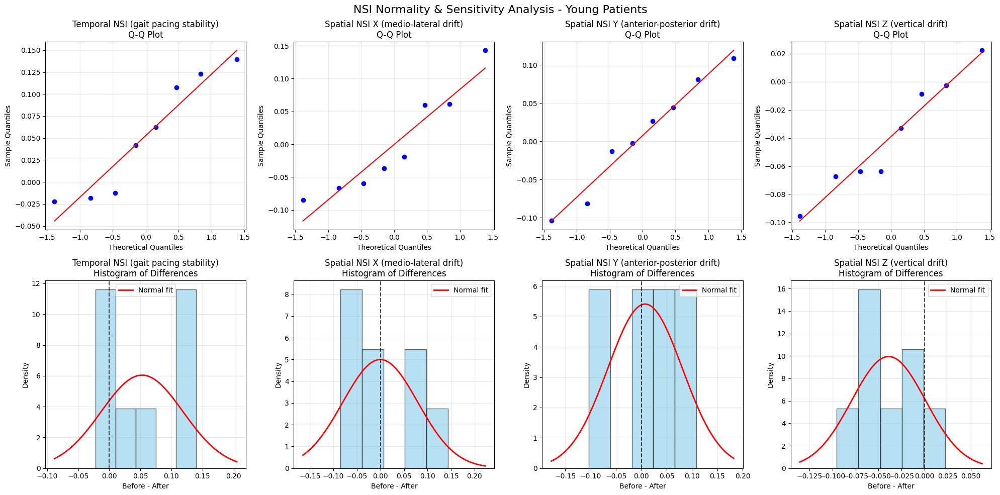


ML-VT AXIS COUPLING ANALYSIS
Research Question: Are ML and VT axis changes coupled?
Do subjects who worsen in one axis also worsen in the other?

Analyzing axis coupling (n=8 subjects)

1. MEDIO-LATERAL ↔ VERTICAL COUPLING:
   Pearson r = 0.494, p = 0.213
   Spearman ρ = 0.190, p = 0.651
   → NO significant coupling between axes
     (ML and VT changes are independent)

2. BASELINE ML-VT RELATIONSHIP:
   Baseline correlation: r = 0.172, p = 0.684
   → No baseline ML-VT coupling

3. CHANGE MAGNITUDE COMPARISON:
   ML change magnitude: 0.0663 ± 0.0345
   VT change magnitude: 0.0446 ± 0.0307
   Magnitude comparison: t = 1.026, p = 0.339
   → No significant difference in change magnitudes

SUMMARY OF SENSITIVITY ANALYSIS RESULTS
Effect size interpretation (Cohen's d):
  Small effect: |d| = 0.2
  Medium effect: |d| = 0.5
  Large effect: |d| = 0.8

Positive d = NSI decreased (improvement)
Negative d = NSI increased (worsening)


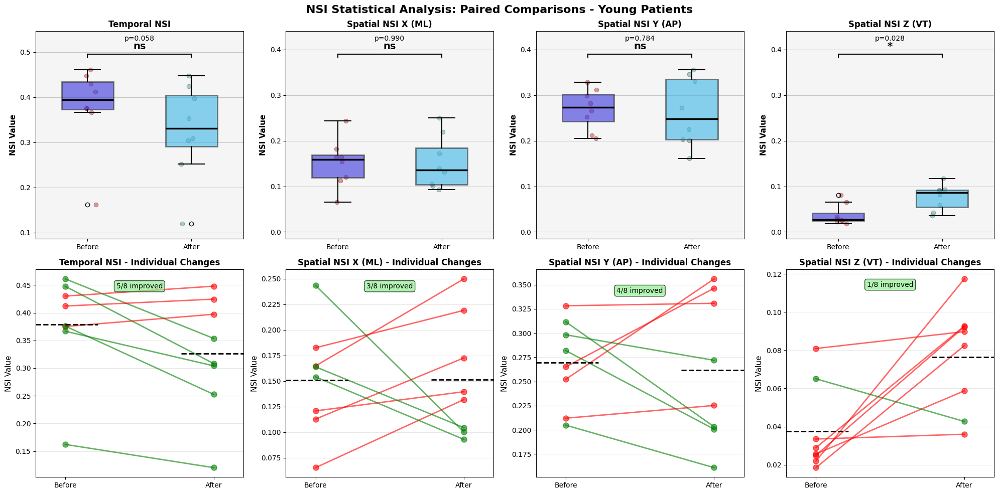


=== SUMMARY TABLE FOR YOUNG PATIENTS ===
       metric  n  before_mean  after_mean  diff_mean   cohen_d  p_value test_used  is_significant
 temporal_nsi  8     0.378827    0.326085   0.052743  0.798948 0.058352    t-test           False
spatial_nsi_x  8     0.150983    0.151367  -0.000384 -0.004806 0.989535    t-test           False
spatial_nsi_y  8     0.269321    0.261912   0.007410  0.100485 0.784470    t-test           False
spatial_nsi_z  8     0.037430    0.076489  -0.039059 -0.974070 0.028296    t-test            True


In [ ]:
results, summary = analyze_cohort(df_young, cohort_name="Young Patients")
cohort_dict = {"Young Patients": df_young_nsi}


## Elderly

This part contains the statistical tests applied on the Elderly Cohort.

### Full Analysis


=== NSI SENSITIVITY ANALYSIS FOR ELDERLY PATIENTS (20 subjects) ===

=== TEMPORAL NSI (GAIT PACING STABILITY) ===

--- Temporal NSI (gait pacing stability) (n=20) ---
 Before: mean=0.4333, SD=0.1373
 After:  mean=0.4267, SD=0.1553
 Shapiro–Wilk p=0.7809 → Paired t-test
 Paired t-test: t=0.1781, p=0.8606
 Mean Δ=0.0067, SD=0.1676
 Cohen's d=0.0398
 Hypothesis: μ_before = μ_after (no difference in temporal NSI)
 Clinical meaning: Lower values indicate better temporal stationarity (more stable gait pacing)
 Result: NOT SIGNIFICANT - no change detected
 Sensitivity analyses:
   [temporal_nsi] Bootstrap 95% CI on Δmean: [-0.064, 0.078]
   [temporal_nsi] LOO t-test p-range:    [0.504, 0.997]
   [temporal_nsi] LOO Wilcoxon p-range: [0.623, 0.984]

=== SPATIAL NSI X (MEDIO-LATERAL DRIFT) ===

--- Spatial NSI X (medio-lateral drift) (n=20) ---
 Before: mean=0.1841, SD=0.0663
 After:  mean=0.1948, SD=0.0802
 Shapiro–Wilk p=0.8943 → Paired t-test
 Paired t-test: t=-0.9116, p=0.3734
 Mean Δ=-0.01

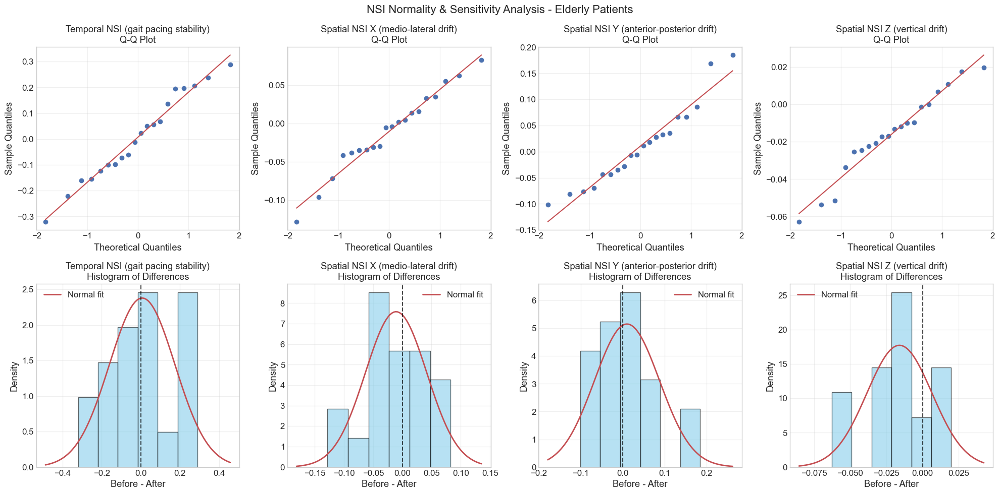


ML-VT AXIS COUPLING ANALYSIS
Research Question: Are ML and VT axis changes coupled?
Do subjects who worsen in one axis also worsen in the other?

Analyzing axis coupling (n=20 subjects)

1. MEDIO-LATERAL ↔ VERTICAL COUPLING:
   Pearson r = 0.235, p = 0.318
   Spearman ρ = 0.078, p = 0.743
   → NO significant coupling between axes
     (ML and VT changes are independent)

2. BASELINE ML-VT RELATIONSHIP:
   Baseline correlation: r = -0.409, p = 0.074
   → No baseline ML-VT coupling

3. CHANGE MAGNITUDE COMPARISON:
   ML change magnitude: 0.0409 ± 0.0327
   VT change magnitude: 0.0215 ± 0.0166
   Magnitude comparison: t = 2.735, p = 0.013
   → ML axis shows significantly larger changes

SUMMARY OF SENSITIVITY ANALYSIS RESULTS
Effect size interpretation (Cohen's d):
  Small effect: |d| = 0.2
  Medium effect: |d| = 0.5
  Large effect: |d| = 0.8

Positive d = NSI decreased (improvement)
Negative d = NSI increased (worsening)


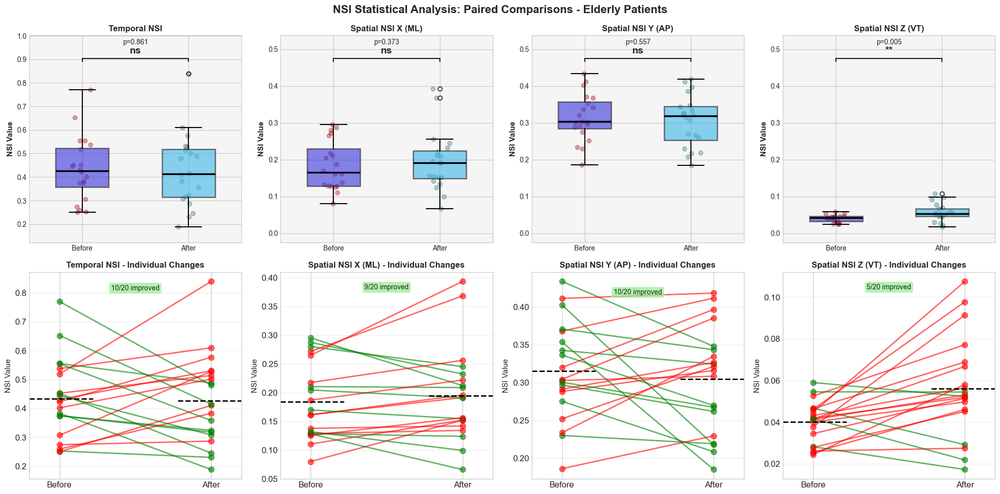


=== SUMMARY TABLE FOR ELDERLY PATIENTS ===
       metric  n  before_mean  after_mean  diff_mean   cohen_d  p_value test_used  is_significant
 temporal_nsi 20     0.433347    0.426673   0.006674  0.039813 0.860567    t-test           False
spatial_nsi_x 20     0.184091    0.194813  -0.010723 -0.203835 0.373413    t-test           False
spatial_nsi_y 20     0.314827    0.304488   0.010340  0.133549 0.557392    t-test           False
spatial_nsi_z 20     0.040184    0.056174  -0.015990 -0.710040 0.004981    t-test            True


In [ ]:
results, summary = analyze_cohort(df_elderly_nsi, cohort_name="Elderly Cohort")
cohort_dict = {"Elderly Patients": df_young}

## CGA 

### QQ PLot and Shapiro Wilk

This part contains the normality checks on the results, to obtain a decision on which test to use. The same normality check is run twice, as the analysis is done in the Thesis itself, once on all patients and once on patients considering thir pathology. The results (on both types of segmentation) on normality showed that t-test can be conducted on all types of comparisons done below.

#### By speed per patient

NORMALITY TESTING FOR WALKING SPEED COMPARISONS
ACROSS ALL PATIENTS
Total unique patients: 20

Patient distribution by condition:
  Brain Ansec: 1 patients
  Brain tumor: 1 patients
  Intradural extramedula: 1 patients
  MS: 2 patients
  PD: 5 patients
  Paresis: 1 patients
  Stroke: 9 patients

Testing differences between speed pairs for normality
If p > 0.05: Use paired t-test (normal)
If p < 0.05: Use Wilcoxon signed-rank test (non-normal)
----------------------------------------------------------------------

TEMPORAL_NSI:

  PWS vs SWS:
    n = 15 pairs
    Mean PWS: 0.3500
    Mean SWS: 0.4226
    Mean difference: -0.0726 ± 0.1865
    Shapiro-Wilk statistic: 0.9244
    p-value: 0.2248
    Normality: Normal
    Recommended test: Paired t-test
    Patients by condition: {'PD': np.int64(5), 'Stroke': np.int64(5), 'MS': np.int64(2), 'Intradural extramedula': np.int64(1), 'Paresis': np.int64(1), 'Brain Ansec': np.int64(1)}

  PWS vs FWS:
    n = 17 pairs
    Mean PWS: 0.3605
    Mean 

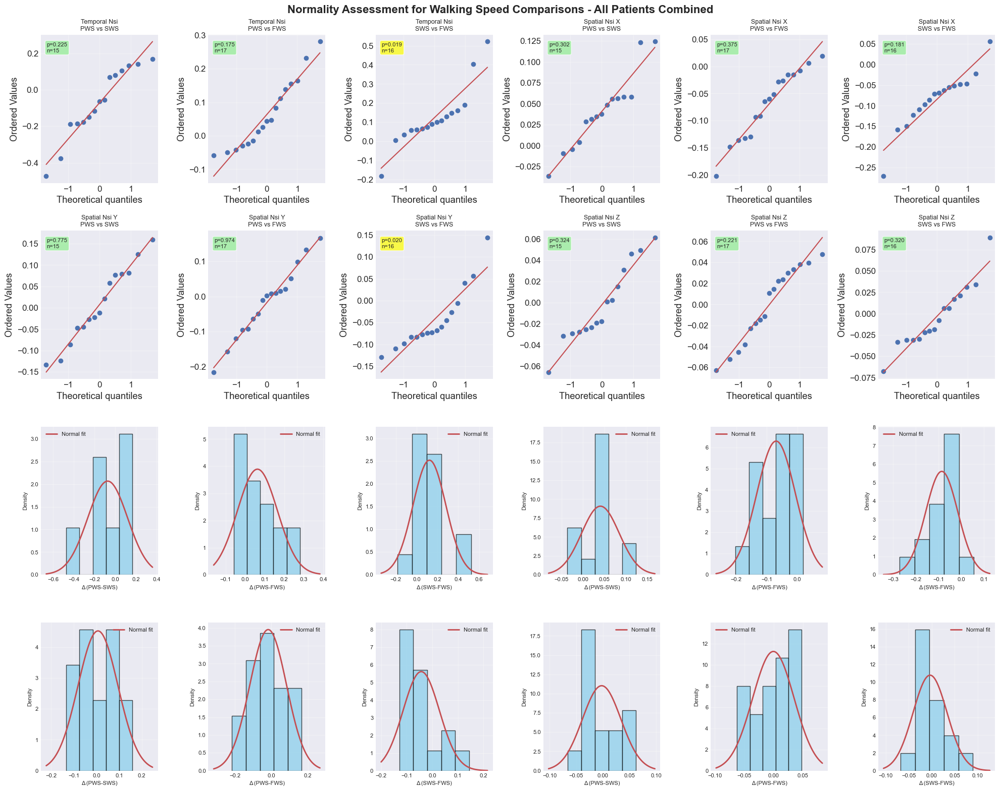


COMPREHENSIVE SUMMARY
NSI Type             Comparison      n     p-value    Normality    Test                     
----------------------------------------------------------------------
temporal_nsi         PWS_vs_SWS      15    0.2248     Normal       Paired t-test            
temporal_nsi         PWS_vs_FWS      17    0.1747     Normal       Paired t-test            
temporal_nsi         SWS_vs_FWS      16    0.0193     Non-normal   Wilcoxon signed-rank     
spatial_nsi_x        PWS_vs_SWS      15    0.3023     Normal       Paired t-test            
spatial_nsi_x        PWS_vs_FWS      17    0.3752     Normal       Paired t-test            
spatial_nsi_x        SWS_vs_FWS      16    0.1812     Normal       Paired t-test            
spatial_nsi_y        PWS_vs_SWS      15    0.7753     Normal       Paired t-test            
spatial_nsi_y        PWS_vs_FWS      17    0.9743     Normal       Paired t-test            
spatial_nsi_y        SWS_vs_FWS      16    0.0195     Non-normal   Wi

In [166]:
df_cga_nsi['patient_id'] = df_cga_nsi['subject'].str[1:]

print("="*70)
print("NORMALITY TESTING FOR WALKING SPEED COMPARISONS")
print("ACROSS ALL PATIENTS")
print("="*70)

# Get unique patients
all_patients = df_cga_nsi['patient_id'].unique()
print(f"Total unique patients: {len(all_patients)}")

# Show patient distribution across conditions for reference
print("\nPatient distribution by condition:")
condition_counts = df_cga_nsi.groupby('condition')['patient_id'].nunique()
for condition, count in condition_counts.items():
    print(f"  {condition}: {count} patients")

print("\nTesting differences between speed pairs for normality")
print("If p > 0.05: Use paired t-test (normal)")
print("If p < 0.05: Use Wilcoxon signed-rank test (non-normal)")
print("-"*70)

# Define comparisons and NSI types, define the speed pairs
speed_comparisons = [('PWS', 'SWS'), ('PWS', 'FWS'), ('SWS', 'FWS')]
nsi_types = ['temporal_nsi', 'spatial_nsi_x', 'spatial_nsi_y', 'spatial_nsi_z']

fig = plt.figure(figsize=(20, 16))
fig.suptitle('Normality Assessment for Walking Speed Comparisons - All Patients Combined', 
              fontsize=16, fontweight='bold')

plot_idx = 0
all_recommendations = {}

for nsi_idx, nsi_type in enumerate(nsi_types):
    print(f"\n{nsi_type.upper()}:")
    nsi_recommendations = {}
    
    for comp_idx, (speed1, speed2) in enumerate(speed_comparisons):
        # Find patients that have both speeds (for the pairing)
        patients_with_pair = []
        
        for patient in all_patients:
            patient_data = df_cga_nsi[df_cga_nsi['patient_id'] == patient]
            speeds_present = patient_data['speed'].unique()
            if speed1 in speeds_present and speed2 in speeds_present:
                patients_with_pair.append(patient)
        
        # Get paired data
        vals1 = []
        vals2 = []
        patient_conditions = []  # Track which condition each patient is from
        
        for patient in patients_with_pair:
            patient_data = df_cga_nsi[df_cga_nsi['patient_id'] == patient]
            
            # Get values for each speed 
            val1_data = patient_data[patient_data['speed'] == speed1]
            val2_data = patient_data[patient_data['speed'] == speed2]
            
            # If patient has multiple conditions, take the first one or average
            if len(val1_data) > 0 and len(val2_data) > 0:
                # Take the first occurrence for simplicity
                val1 = val1_data[nsi_type].values[0]
                val2 = val2_data[nsi_type].values[0]
                condition = val1_data['condition'].values[0]
                
                vals1.append(val1)
                vals2.append(val2)
                patient_conditions.append(condition)
        
        vals1 = np.array(vals1)
        vals2 = np.array(vals2)
        
        if len(vals1) >= 3:  
            # Calculate differences
            differences = vals1 - vals2
            n_pairs = len(differences)
            
            # Shapiro-Wilk test
            statistic, p_value = stats.shapiro(differences)
            
            if p_value > 0.05:
                test_recommendation = "Paired t-test"
                normality_status = "Normal"
            else:
                test_recommendation = "Wilcoxon signed-rank"
                normality_status = "Non-normal"
            
            nsi_recommendations[f"{speed1}_vs_{speed2}"] = {
                'test': test_recommendation,
                'p_value': p_value,
                'n': n_pairs,
                'conditions': patient_conditions
            }
            
            # Print results
            print(f"\n  {speed1} vs {speed2}:")
            print(f"    n = {n_pairs} pairs")
            print(f"    Mean {speed1}: {np.mean(vals1):.4f}")
            print(f"    Mean {speed2}: {np.mean(vals2):.4f}")
            print(f"    Mean difference: {np.mean(differences):.4f} ± {np.std(differences):.4f}")
            print(f"    Shapiro-Wilk statistic: {statistic:.4f}")
            print(f"    p-value: {p_value:.4f}")
            print(f"    Normality: {normality_status}")
            print(f"    Recommended test: {test_recommendation}")
            
            # Show condition breakdown
            condition_counts = pd.Series(patient_conditions).value_counts()
            print(f"    Patients by condition: {dict(condition_counts)}")
            
            # Q-Q plot
            ax_qq = plt.subplot(4, 6, plot_idx + 1)
            stats.probplot(differences, dist="norm", plot=ax_qq)
            ax_qq.set_title(f'{nsi_type.replace("_", " ").title()}\n{speed1} vs {speed2}', fontsize=9)
            ax_qq.grid(True, alpha=0.3)
            
            # Add p-value to plot - visual
            ax_qq.text(0.05, 0.95, f'p={p_value:.3f}\nn={n_pairs}', 
                      transform=ax_qq.transAxes, 
                      bbox=dict(boxstyle='round', 
                               facecolor='yellow' if p_value < 0.05 else 'lightgreen', 
                               alpha=0.7),
                      verticalalignment='top', fontsize=8)
            
        
            ax_hist = plt.subplot(4, 6, plot_idx + 13)
            
            # Plot histogram
            n_bins = min(15, max(5, n_pairs // 3))
            ax_hist.hist(differences, bins=n_bins, density=True, alpha=0.7, 
                        color='skyblue', edgecolor='black')
            
            # Overlay normal distribution
            mu, sigma = np.mean(differences), np.std(differences, ddof=1)
            if sigma > 0:
                x = np.linspace(differences.min() - sigma, differences.max() + sigma, 100)
                ax_hist.plot(x, stats.norm.pdf(x, mu, sigma), 'r-', linewidth=2, label='Normal fit')
            
            ax_hist.set_xlabel(f'Δ ({speed1}-{speed2})', fontsize=8)
            ax_hist.set_ylabel('Density', fontsize=8)
            ax_hist.legend(fontsize=8)
            ax_hist.grid(True, alpha=0.3)
            ax_hist.tick_params(labelsize=8)
            
            plot_idx += 1
        else:
            print(f"\n  {speed1} vs {speed2}: Insufficient data (n={len(vals1)})")
            nsi_recommendations[f"{speed1}_vs_{speed2}"] = {
                'test': "Insufficient data",
                'p_value': np.nan,
                'n': len(vals1)
            }
    
    all_recommendations[nsi_type] = nsi_recommendations

plt.tight_layout()
plt.show()


# Comprehensive summary table
print("\n" + "="*70)
print("COMPREHENSIVE SUMMARY")
print("="*70)
print(f"{'NSI Type':<20} {'Comparison':<15} {'n':<5} {'p-value':<10} {'Normality':<12} {'Test':<25}")
print("-"*70)

for nsi_type in nsi_types:
    for comp in speed_comparisons:
        comp_key = f"{comp[0]}_vs_{comp[1]}"
        if comp_key in all_recommendations.get(nsi_type, {}):
            data = all_recommendations[nsi_type][comp_key]
            test = data['test']
            p_val = data['p_value']
            n = data['n']
            
            p_str = f"{p_val:.4f}" if not np.isnan(p_val) else "N/A"
            normality = "Normal" if test == "Paired t-test" else "Non-normal" if test == "Wilcoxon signed-rank" else "N/A"
            print(f"{nsi_type:<20} {comp_key:<15} {n:<5} {p_str:<10} {normality:<12} {test:<25}")

# Quick reference guide
print("\n" + "="*70)
print("QUICK REFERENCE: RECOMMENDED TESTS")
print("="*70)
print("\nBased on Shapiro-Wilk test results across all patients:")

for nsi_type in nsi_types:
    print(f"\n{nsi_type.upper()}:")
    for comp in speed_comparisons:
        comp_key = f"{comp[0]}_vs_{comp[1]}"
        if comp_key in all_recommendations.get(nsi_type, {}):
            test = all_recommendations[nsi_type][comp_key]['test']
            n = all_recommendations[nsi_type][comp_key]['n']
            print(f"  {comp[0]} vs {comp[1]} (n={n}): {test}")

# Statistical power analysis
print("\n" + "="*70)
print("STATISTICAL POWER CONSIDERATIONS")
print("="*70)
print("\nSample sizes by comparison:")
for comp in speed_comparisons:
    comp_key = f"{comp[0]}_vs_{comp[1]}"
    sizes = []
    for nsi_type in nsi_types:
        if comp_key in all_recommendations.get(nsi_type, {}):
            n = all_recommendations[nsi_type][comp_key]['n']
            sizes.append(n)
    if sizes:
        print(f"  {comp[0]} vs {comp[1]}: n = {sizes[0]} (all NSI types)")



#### By diagnosis

THe same test on normality is run on patients by segmenting them differently - by their pathology. Here condition is assossiation of pathology.

NORMALITY TESTING FOR WALKING SPEED COMPARISONS BY CONDITION
Conditions found: PD, Stroke, MS, Intradural extramedula, Brain tumor, Paresis, Brain Ansec

Testing differences between speed pairs for normality within each condition
If p > 0.05: Use paired t-test (normal)
If p < 0.05: Use Wilcoxon signed-rank test (non-normal)
----------------------------------------------------------------------

CONDITION: PD
Total patients in PD: 5

TEMPORAL_NSI:
  PWS vs SWS:
    n = 5 pairs
    Mean difference: -0.2185 ± 0.2079
    Shapiro-Wilk p = 0.6461 → Normal → Paired t-test
  PWS vs FWS:
    n = 5 pairs
    Mean difference: 0.0543 ± 0.1192
    Shapiro-Wilk p = 0.1377 → Normal → Paired t-test
  SWS vs FWS:
    n = 5 pairs
    Mean difference: 0.2728 ± 0.1595
    Shapiro-Wilk p = 0.1002 → Normal → Paired t-test

SPATIAL_NSI_X:
  PWS vs SWS:
    n = 5 pairs
    Mean difference: 0.0444 ± 0.0515
    Shapiro-Wilk p = 0.8866 → Normal → Paired t-test
  PWS vs FWS:
    n = 5 pairs
    Mean difference: -

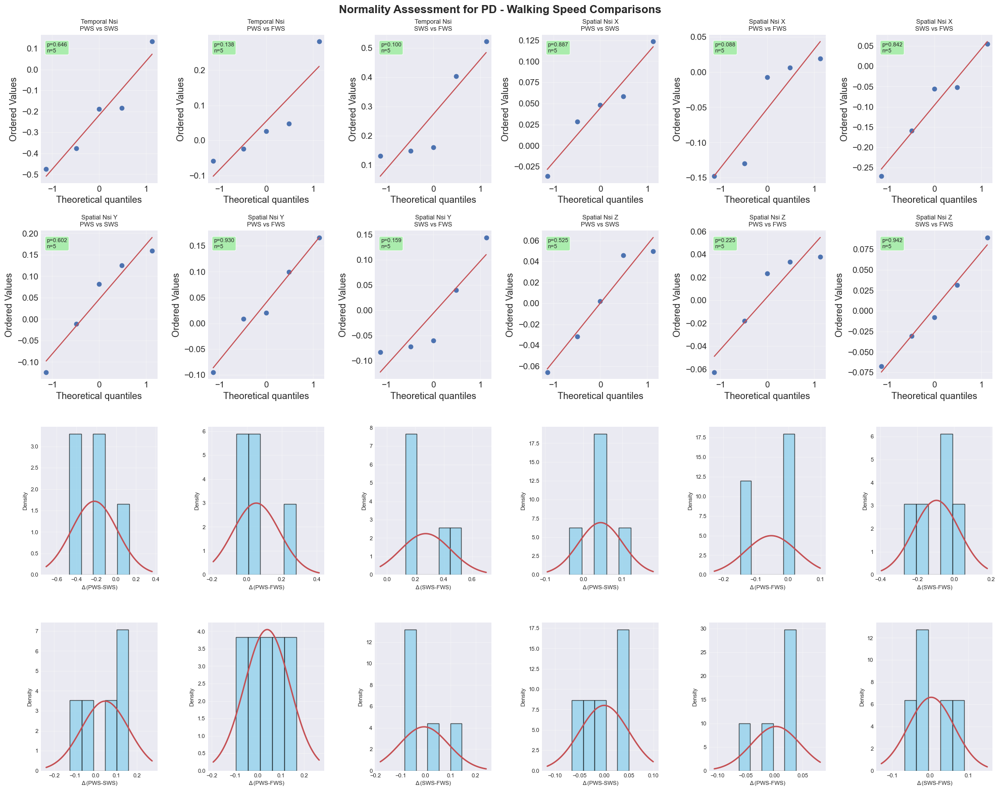


CONDITION: Stroke
Total patients in Stroke: 9

TEMPORAL_NSI:
  PWS vs SWS:
    n = 5 pairs
    Mean difference: 0.0845 ± 0.0811
    Shapiro-Wilk p = 0.3691 → Normal → Paired t-test
  PWS vs FWS:
    n = 7 pairs
    Mean difference: 0.1000 ± 0.0885
    Shapiro-Wilk p = 0.6570 → Normal → Paired t-test
  SWS vs FWS:
    n = 5 pairs
    Mean difference: 0.0039 ± 0.0979
    Shapiro-Wilk p = 0.1073 → Normal → Paired t-test

SPATIAL_NSI_X:
  PWS vs SWS:
    n = 5 pairs
    Mean difference: 0.0448 ± 0.0489
    Shapiro-Wilk p = 0.4195 → Normal → Paired t-test
  PWS vs FWS:
    n = 7 pairs
    Mean difference: -0.1048 ± 0.0543
    Shapiro-Wilk p = 0.8812 → Normal → Paired t-test
  SWS vs FWS:
    n = 5 pairs
    Mean difference: -0.0903 ± 0.0478
    Shapiro-Wilk p = 0.5818 → Normal → Paired t-test

SPATIAL_NSI_Y:
  PWS vs SWS:
    n = 5 pairs
    Mean difference: -0.0323 ± 0.0696
    Shapiro-Wilk p = 0.8646 → Normal → Paired t-test
  PWS vs FWS:
    n = 7 pairs
    Mean difference: -0.0375 ± 0.

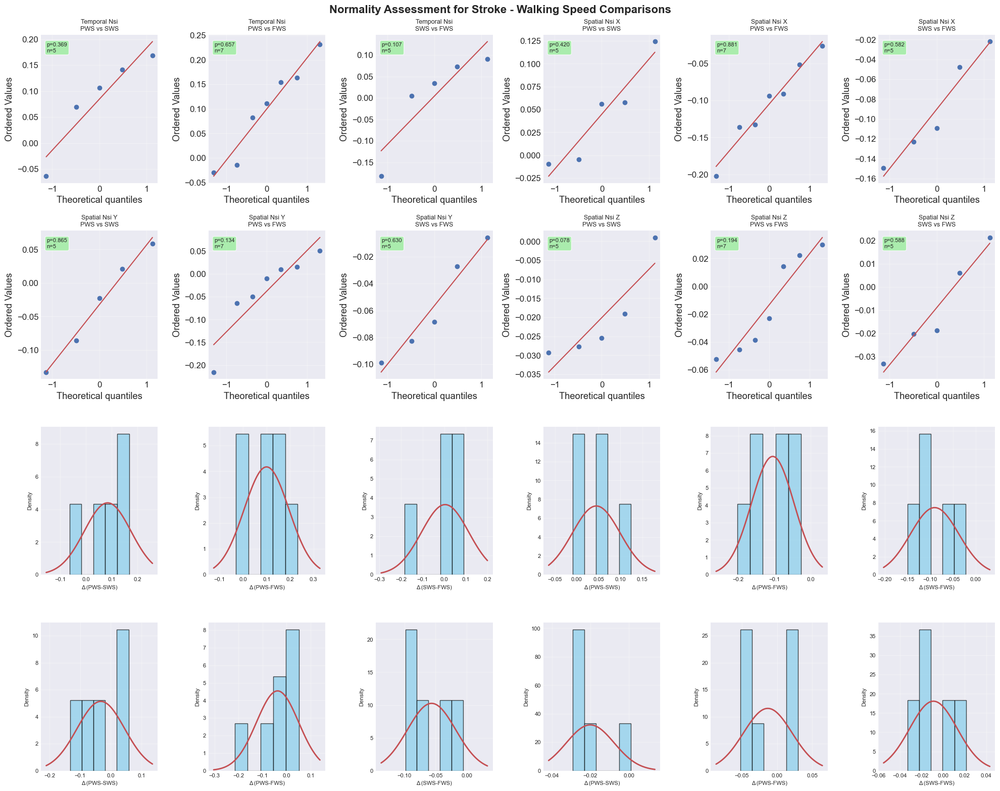


CONDITION: MS
Total patients in MS: 2

TEMPORAL_NSI:
  PWS vs SWS: Insufficient data (n=2)
  PWS vs FWS: Insufficient data (n=2)
  SWS vs FWS: Insufficient data (n=2)

SPATIAL_NSI_X:
  PWS vs SWS: Insufficient data (n=2)
  PWS vs FWS: Insufficient data (n=2)
  SWS vs FWS: Insufficient data (n=2)

SPATIAL_NSI_Y:
  PWS vs SWS: Insufficient data (n=2)
  PWS vs FWS: Insufficient data (n=2)
  SWS vs FWS: Insufficient data (n=2)

SPATIAL_NSI_Z:
  PWS vs SWS: Insufficient data (n=2)
  PWS vs FWS: Insufficient data (n=2)
  SWS vs FWS: Insufficient data (n=2)


<Figure size 2000x1600 with 0 Axes>


CONDITION: Intradural extramedula
Total patients in Intradural extramedula: 1

TEMPORAL_NSI:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

SPATIAL_NSI_X:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

SPATIAL_NSI_Y:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

SPATIAL_NSI_Z:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)


<Figure size 2000x1600 with 0 Axes>


CONDITION: Brain tumor
Total patients in Brain tumor: 1

TEMPORAL_NSI:
  PWS vs SWS: Insufficient data (n=0)
  PWS vs FWS: Insufficient data (n=0)
  SWS vs FWS: Insufficient data (n=1)

SPATIAL_NSI_X:
  PWS vs SWS: Insufficient data (n=0)
  PWS vs FWS: Insufficient data (n=0)
  SWS vs FWS: Insufficient data (n=1)

SPATIAL_NSI_Y:
  PWS vs SWS: Insufficient data (n=0)
  PWS vs FWS: Insufficient data (n=0)
  SWS vs FWS: Insufficient data (n=1)

SPATIAL_NSI_Z:
  PWS vs SWS: Insufficient data (n=0)
  PWS vs FWS: Insufficient data (n=0)
  SWS vs FWS: Insufficient data (n=1)


<Figure size 2000x1600 with 0 Axes>


CONDITION: Paresis
Total patients in Paresis: 1

TEMPORAL_NSI:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

SPATIAL_NSI_X:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

SPATIAL_NSI_Y:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

SPATIAL_NSI_Z:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)


<Figure size 2000x1600 with 0 Axes>


CONDITION: Brain Ansec
Total patients in Brain Ansec: 1

TEMPORAL_NSI:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

SPATIAL_NSI_X:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

SPATIAL_NSI_Y:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

SPATIAL_NSI_Z:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)


<Figure size 2000x1600 with 0 Axes>


COMPREHENSIVE SUMMARY 
Condition       NSI Type             Comparison      n     p-value    Test                     
----------------------------------------------------------------------
PD              temporal_nsi         PWS_vs_SWS      5     0.6461     Paired t-test            
PD              temporal_nsi         PWS_vs_FWS      5     0.1377     Paired t-test            
PD              temporal_nsi         SWS_vs_FWS      5     0.1002     Paired t-test            
PD              spatial_nsi_x        PWS_vs_SWS      5     0.8866     Paired t-test            
PD              spatial_nsi_x        PWS_vs_FWS      5     0.0877     Paired t-test            
PD              spatial_nsi_x        SWS_vs_FWS      5     0.8416     Paired t-test            
PD              spatial_nsi_y        PWS_vs_SWS      5     0.6022     Paired t-test            
PD              spatial_nsi_y        PWS_vs_FWS      5     0.9298     Paired t-test            
PD              spatial_nsi_y        SWS_

In [168]:

df_cga_nsi['patient_id'] = df_cga_nsi['subject'].str[1:]

# Get unique conditions
conditions = df_cga_nsi['condition'].unique()

print("="*70)
print("NORMALITY TESTING FOR WALKING SPEED COMPARISONS BY CONDITION")
print("="*70)
print(f"Conditions found: {', '.join(conditions)}")
print("\nTesting differences between speed pairs for normality within each condition")
print("If p > 0.05: Use paired t-test (normal)")
print("If p < 0.05: Use Wilcoxon signed-rank test (non-normal)")
print("-"*70)

# Define comparisons and NSI types
speed_comparisons = [('PWS', 'SWS'), ('PWS', 'FWS'), ('SWS', 'FWS')]
nsi_types = ['temporal_nsi', 'spatial_nsi_x', 'spatial_nsi_y', 'spatial_nsi_z']

all_recommendations = {}

for condition in conditions:
    print(f"\n{'='*70}")
    print(f"CONDITION: {condition}")
    print(f"{'='*70}")
    
    condition_data = df_cga_nsi[df_cga_nsi['condition'] == condition]
    
    condition_patients = condition_data['patient_id'].unique()
    print(f"Total patients in {condition}: {len(condition_patients)}")
    
    # Create figure for this condition
    fig = plt.figure(figsize=(20, 16))
    fig.suptitle(f'Normality Assessment for {condition} - Walking Speed Comparisons', 
                  fontsize=16, fontweight='bold')
    
    plot_idx = 0
    condition_recommendations = {}
    
    for nsi_idx, nsi_type in enumerate(nsi_types):
        print(f"\n{nsi_type.upper()}:")
        nsi_recommendations = {}
        
        for comp_idx, (speed1, speed2) in enumerate(speed_comparisons):
            # Find patients that have both speeds in this condition
            patients_with_pair = []
            
            for patient in condition_patients:
                patient_data = condition_data[condition_data['patient_id'] == patient]
                speeds_present = patient_data['speed'].unique()
                if speed1 in speeds_present and speed2 in speeds_present:
                    patients_with_pair.append(patient)
            
            # Get paired data
            vals1 = []
            vals2 = []
            
            for patient in patients_with_pair:
                patient_data = condition_data[condition_data['patient_id'] == patient]
                val1 = patient_data[patient_data['speed'] == speed1][nsi_type].values
                val2 = patient_data[patient_data['speed'] == speed2][nsi_type].values
                
                if len(val1) > 0 and len(val2) > 0:
                    vals1.append(val1[0])
                    vals2.append(val2[0])
            
            vals1 = np.array(vals1)
            vals2 = np.array(vals2)
            
            if len(vals1) >= 3:  
                # Calculate differences
                differences = vals1 - vals2
                n_pairs = len(differences)
                
                # Shapiro-Wilk test
                statistic, p_value = stats.shapiro(differences)
                
                if p_value > 0.05:
                    test_recommendation = "Paired t-test"
                    normality_status = "Normal"
                else:
                    test_recommendation = "Wilcoxon signed-rank"
                    normality_status = "Non-normal"
                
                nsi_recommendations[f"{speed1}_vs_{speed2}"] = {
                    'test': test_recommendation,
                    'p_value': p_value,
                    'n': n_pairs
                }
                
                # Print results
                print(f"  {speed1} vs {speed2}:")
                print(f"    n = {n_pairs} pairs")
                print(f"    Mean difference: {np.mean(differences):.4f} ± {np.std(differences):.4f}")
                print(f"    Shapiro-Wilk p = {p_value:.4f} → {normality_status} → {test_recommendation}")
                
                # Q-Q plot (top half)
                ax_qq = plt.subplot(4, 6, plot_idx + 1)
                stats.probplot(differences, dist="norm", plot=ax_qq)
                ax_qq.set_title(f'{nsi_type.replace("_", " ").title()}\n{speed1} vs {speed2}', fontsize=9)
                ax_qq.grid(True, alpha=0.3)
                
                # Add p-value to plot
                ax_qq.text(0.05, 0.95, f'p={p_value:.3f}\nn={n_pairs}', 
                          transform=ax_qq.transAxes, 
                          bbox=dict(boxstyle='round', 
                                   facecolor='yellow' if p_value < 0.05 else 'lightgreen', 
                                   alpha=0.7),
                          verticalalignment='top', fontsize=8)
                
                # Histogram 
                ax_hist = plt.subplot(4, 6, plot_idx + 13)
                
                # Plot histogram
                n_bins = min(10, max(5, n_pairs // 3))
                ax_hist.hist(differences, bins=n_bins, density=True, alpha=0.7, 
                            color='skyblue', edgecolor='black')
                
                # Overlay normal distribution
                mu, sigma = np.mean(differences), np.std(differences, ddof=1)
                if sigma > 0:
                    x = np.linspace(differences.min() - sigma, differences.max() + sigma, 100)
                    ax_hist.plot(x, stats.norm.pdf(x, mu, sigma), 'r-', linewidth=2)
                
                ax_hist.set_xlabel(f'Δ ({speed1}-{speed2})', fontsize=8)
                ax_hist.set_ylabel('Density', fontsize=8)
                ax_hist.grid(True, alpha=0.3)
                ax_hist.tick_params(labelsize=8)
                
                plot_idx += 1
            else:
                print(f"  {speed1} vs {speed2}: Insufficient data (n={len(vals1)})")
                nsi_recommendations[f"{speed1}_vs_{speed2}"] = {
                    'test': "Insufficient data",
                    'p_value': np.nan,
                    'n': len(vals1)
                }
        
        condition_recommendations[nsi_type] = nsi_recommendations
    
    all_recommendations[condition] = condition_recommendations
    
    plt.tight_layout()
    plt.show()

# Comprehensive summary table
print("\n" + "="*70)
print("COMPREHENSIVE SUMMARY ")
print("="*70)
print(f"{'Condition':<15} {'NSI Type':<20} {'Comparison':<15} {'n':<5} {'p-value':<10} {'Test':<25}")
print("-"*70)

for condition in conditions:
    if condition in all_recommendations:
        for nsi_type in nsi_types:
            for comp in speed_comparisons:
                comp_key = f"{comp[0]}_vs_{comp[1]}"
                if comp_key in all_recommendations[condition].get(nsi_type, {}):
                    data = all_recommendations[condition][nsi_type][comp_key]
                    test = data['test']
                    p_val = data['p_value']
                    n = data['n']
                    
                    p_str = f"{p_val:.4f}" if not np.isnan(p_val) else "N/A"
                    print(f"{condition:<15} {nsi_type:<20} {comp_key:<15} {n:<5} {p_str:<10} {test:<25}")

# Quick reference guide
print("\n" + "="*70)
print("QUICK REFERENCE: RECOMMENDED TESTS BY CONDITION")
print("="*70)

for condition in conditions:
    if condition in all_recommendations:
        print(f"\n{condition}:")
        for nsi_type in nsi_types:
            print(f"  {nsi_type}:")
            for comp in speed_comparisons:
                comp_key = f"{comp[0]}_vs_{comp[1]}"
                if comp_key in all_recommendations[condition].get(nsi_type, {}):
                    test = all_recommendations[condition][nsi_type][comp_key]['test']
                    n = all_recommendations[condition][nsi_type][comp_key]['n']
                    print(f"    {comp[0]} vs {comp[1]} (n={n}): {test}")


### Statistical Testing

#### By speed per patient


ENHANCED SPEED SENSITIVITY ANALYSIS WITH ANOVA - NEUROLOGICAL COHORT
Speed conditions: ['PWS', 'SWS', 'FWS']

REPEATED MEASURES ANOVA ANALYSIS

TEMPORAL_NSI:
  H₀: μ_PWS = μ_SWS = μ_FWS (no difference in temporal NSI across speeds)
  H₁: At least one speed differs in temporal NSI
  Note: Lower values indicate better temporal stationarity (more stable gait pacing)
  Complete cases: 14 / 20
  Means ± SD:
    PWS: 0.3500 ± 0.1699
    SWS: 0.4328 ± 0.1607
    FWS: 0.3018 ± 0.1519

  Inferential Statistics:
    Friedman χ² = 8.143, p = 0.0171
    RM-ANOVA F = 0.788, p = 0.4652
    ANOVA residuals Shapiro–Wilk: W = 0.969, p = 0.3030

    Detailed ANOVA Results:
               Anova
      F Value Num DF  Den DF Pr > F
-----------------------------------
speed  0.7883 2.0000 26.0000 0.4652

    → Friedman: SIGNIFICANT omnibus (reject H₀)
    → RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

SPATIAL_NSI_X:
  H₀: μ_PWS = μ_SWS = μ_FWS (no difference in medio-lateral drift)
  H₁: At least

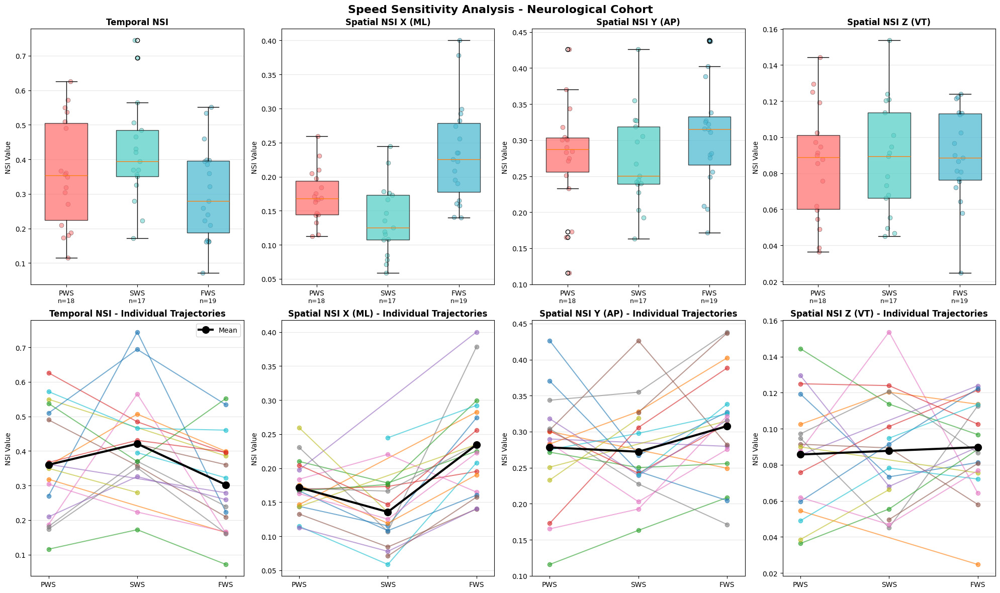


COMPREHENSIVE SUMMARY - NEUROLOGICAL COHORT

REPEATED MEASURES ANOVA SUMMARY:
--------------------------------------------------
NSI Type             n     Friedman p   RM-ANOVA p   Significant
--------------------------------------------------
temporal_nsi         14    0.0171       0.4652       */ns
spatial_nsi_x        14    0.0004       0.6653       */ns
spatial_nsi_y        14    0.3189       0.6415       ns/ns
spatial_nsi_z        14    1.0000       0.4766       ns/ns

PAIRWISE COMPARISONS SUMMARY (Bonferroni corrected α=0.0167):
--------------------------------------------------------------------------------
NSI Type             Comparison      n     Test                 p-value    Effect     Sig
--------------------------------------------------------------------------------
temporal_nsi         PWS vs SWS      15    Paired t-test        0.1671     d=-0.376   ns
temporal_nsi         PWS vs FWS      17    Paired t-test        0.0217     d=0.617    ns
temporal_nsi         SWS vs

In [ ]:
results = analyze_by_patient(df_cga_nsi, cohort_name="Neurological Cohort")

# anova is read as dictionary, so summarize the results better 
def summarize_anova_results(anova_results):
    """
    Concise summary table from ANOVA results dict.
    """
    rows = []
    for metric, res in anova_results.items():
        if res.get('status') == 'complete':
            rows.append({
                'Metric': metric,
                'n': res['n_complete'],
                'Friedman p': res['friedman_p'],
                'ANOVA p': res['anova_p'],
                'ANOVA F': res['anova_f'],
                'Residuals normal p': res.get('shapiro_p', np.nan)
            })
        else:
            rows.append({
                'Metric': metric,
                'n': res.get('n_complete', np.nan),
                'Friedman p': np.nan,
                'ANOVA p': np.nan,
                'ANOVA F': np.nan,
                'Residuals normal p': np.nan
            })
    df = pd.DataFrame(rows)
    # Format p-values
    df['Friedman p'] = df['Friedman p'].map(lambda x: f"{x:.3f}" if pd.notna(x) else 'N/A')
    df['ANOVA p']    = df['ANOVA p'].map(lambda x: f"{x:.3f}" if pd.notna(x) else 'N/A')
    df['ANOVA F']    = df['ANOVA F'].map(lambda x: f"{x:.2f}" if pd.notna(x) else 'N/A')
    df['Residuals normal p'] = df['Residuals normal p'].map(lambda x: f"{x:.3f}" if pd.notna(x) else 'N/A')

    print("ANOVA SUMMARY TABLE:")
    print(df.to_string(index=False))

summarize_anova_results(results['anova_results'])
# analyze_nsi_with_sensitivity(results_nsi)

#### by diagnosis

NSI ANALYSIS BY DIAGNOSIS WITH WALKING SPEED COMPARISONS - NEUROLOGICAL COHORT
Diagnoses found: PD, Stroke, MS, Intradural extramedula, Brain tumor, Paresis, Brain Ansec

DIAGNOSIS: PD

REPEATED MEASURES ANOVA RESULTS FOR PD
--------------------------------------------------------------------------------

TEMPORAL_NSI:
  H₀: μ_PWS = μ_SWS = μ_FWS (no difference in temporal NSI across speeds)
  H₁: At least one speed differs in temporal NSI
  Note: Lower values indicate better temporal stationarity (more stable gait pacing)
  Complete cases: 5 / 5 patients
  Means ± SD:
    PWS: 0.3276 ± 0.1612
    SWS: 0.5461 ± 0.1790
    FWS: 0.2733 ± 0.1484

  Inferential Statistics:
    Friedman χ² = 5.200, p = 0.0743
    Repeated-Measures ANOVA:
              Anova
      F Value Num DF Den DF Pr > F
----------------------------------
speed  0.1650 2.0000 8.0000 0.8507

    ANOVA residuals Shapiro–Wilk: W = 0.950, p = 0.5302
    → Friedman: NOT SIGNIFICANT omnibus (fail to reject H₀)
    → RM-ANOVA:

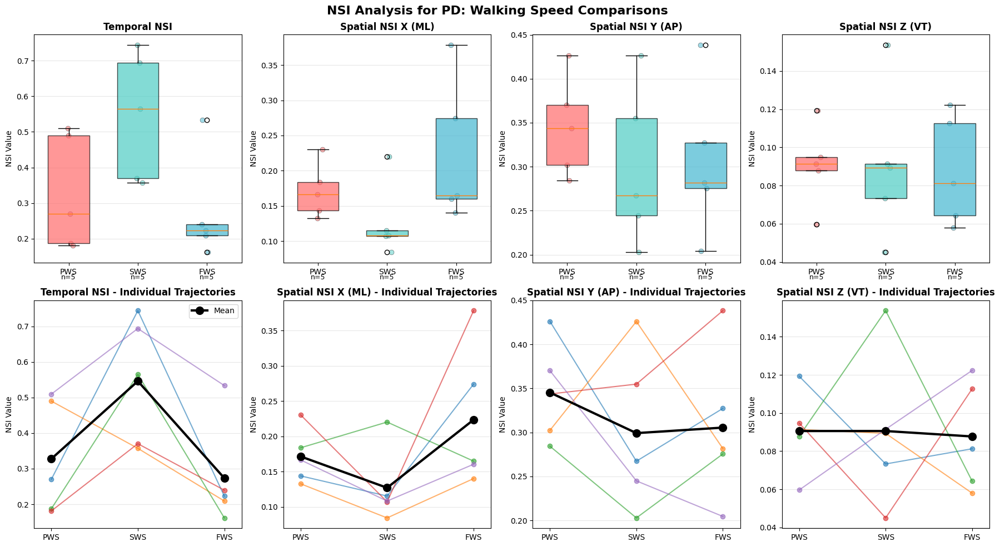

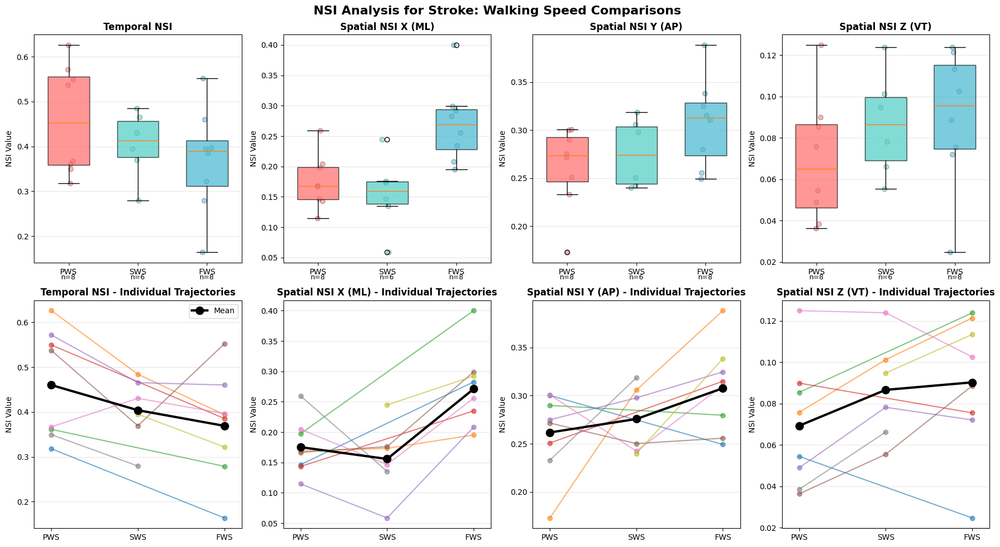

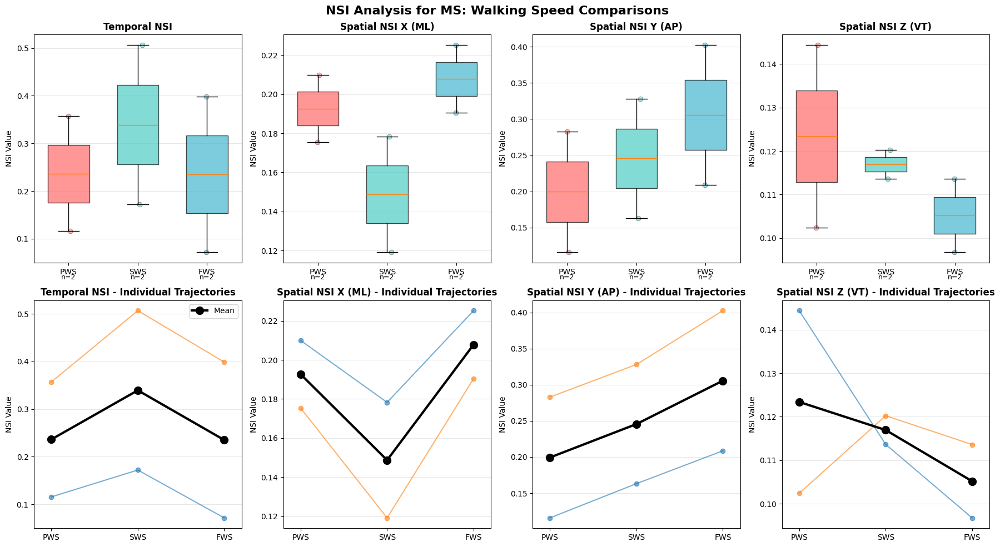

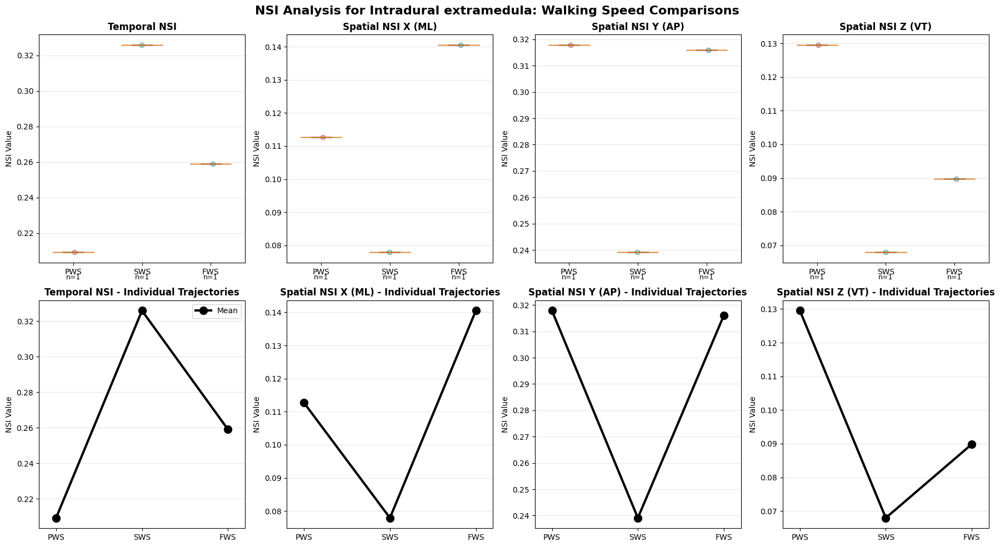

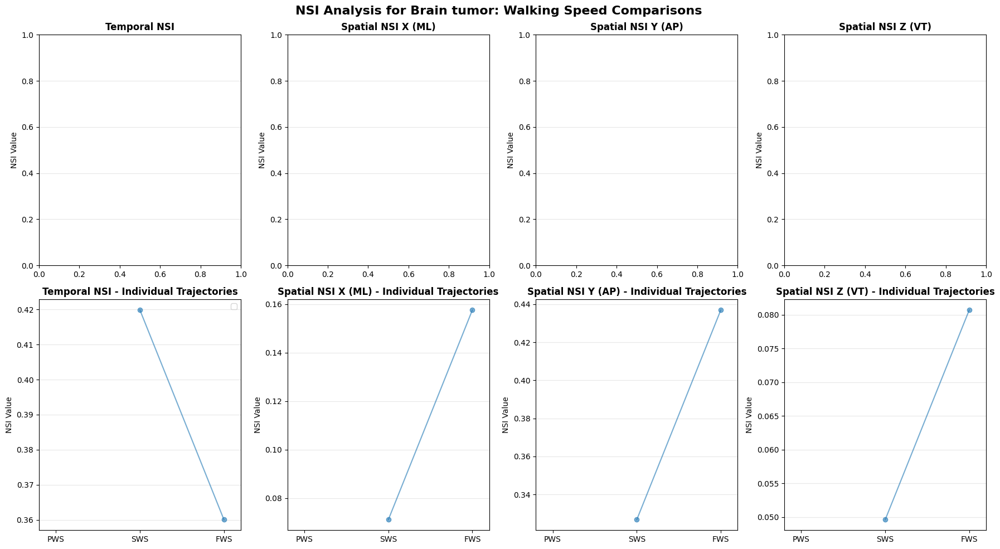

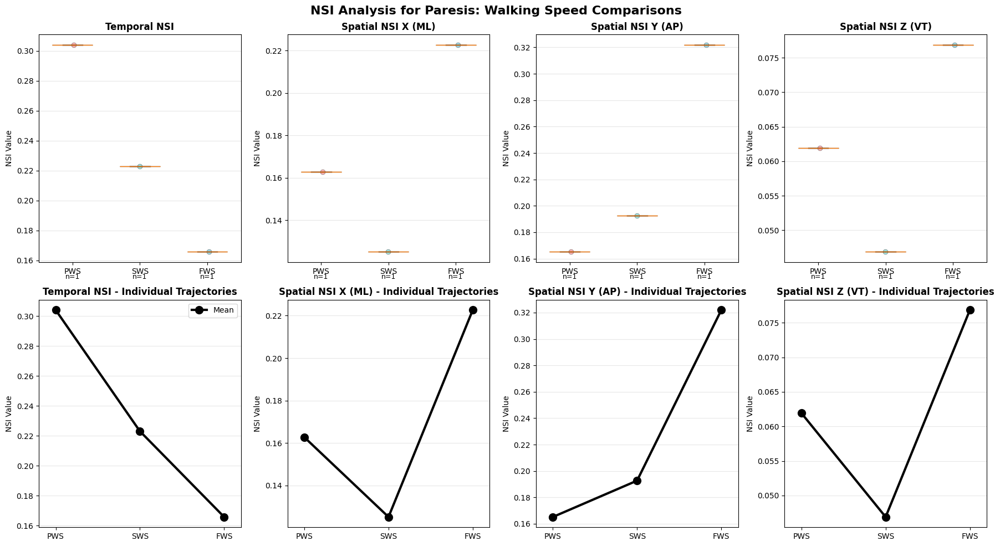

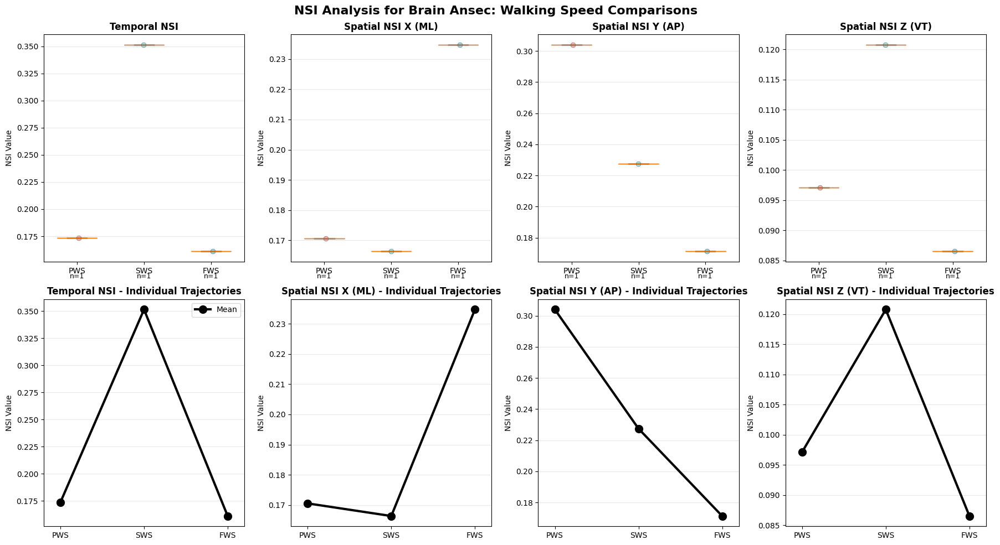


SUMMARY TABLE: COMPLETE CASES BY DIAGNOSIS - NEUROLOGICAL COHORT
             Diagnosis  Complete_Cases Completion_Rate
                    PD               5          100.0%
                Stroke               4          100.0%
                    MS               0             N/A
Intradural extramedula               0             N/A
           Brain tumor               0             N/A
               Paresis               0             N/A
           Brain Ansec               0             N/A

SUMMARY OF SIGNIFICANT FINDINGS BY DIAGNOSIS

PD:
  No significant omnibus tests
  No significant pairwise comparisons

STROKE:
  Significant omnibus tests: spatial_nsi_x (Friedman p=0.0498)
  Significant pairwise comparisons: spatial_nsi_x:PWS vs FWS

MS:
  No significant omnibus tests
  No significant pairwise comparisons

INTRADURAL EXTRAMEDULA:
  No significant omnibus tests
  No significant pairwise comparisons

BRAIN TUMOR:
  No significant omnibus tests
  No significant pairwise co

In [ ]:
resutls_diagnosis = analyze_by_diagnosis(df_cga_nsi, cohort_name="Neurological Cohort")
summarize_anova_results(results['anova_results'])

# Lyapunov Exponent

This part contains the analysis on Lyapunov results, the procedure is the same as before for NSI. Additionally, this parts considered an OLS model for the linear relationship between lag and sLE, and embedding dimension and sLE.
The OLS was only applied to Young and ELderly cohort, because the sLE resutls were more reliable compred to Neurological Cohort perfomance.

## Young

In [106]:
df_young = pd.read_excel(cwd.parent / ".." / "results" / "Young" / "Young_Lyapunov_DS_Final.xlsx")

### Statistical tests

COMPLETE LYAPUNOV EXPONENT ANALYSIS - YOUNG COHORT
STEP 1: NORMALITY ASSESSMENT WITH VISUALIZATION
=== YOUNG COHORT LYAPUNOV NORMALITY ANALYSIS ===
Data loaded: 32 rows, 9 columns
Subjects: 8
SHAPIRO-WILK TEST RESULTS (α = 0.05)
If p > 0.05: Use paired t-test (normal)
If p < 0.05: Use Wilcoxon signed-rank test (non-normal)
----------------------------------------------------------------------

X:
  Sample size: n = 8 pairs
  Shapiro-Wilk statistic: 0.9439
  p-value: 0.6502
  Normality assessment: Normal
  Recommended test: Paired t-test
  Mean before: 1.0612 ± 0.4312
  Mean after: 1.3658 ± 0.4040
  Mean difference: -0.3046 ± 0.3563
  Median difference: -0.2912
  Additional tests:
    Anderson-Darling: 0.3012 (Normal)
    D'Agostino-Pearson: p=0.4387 (Normal)
  Sensitivity analyses:
   [Young Cohort X] Bootstrap 95% CI on mean difference: [-0.5244, -0.0653]
   [Young Cohort X] LOO t-test p-value range: [0.0050, 0.1052]
   [Young Cohort X] LOO Wilcoxon p-value range: [0.0156, 0.1562]
   

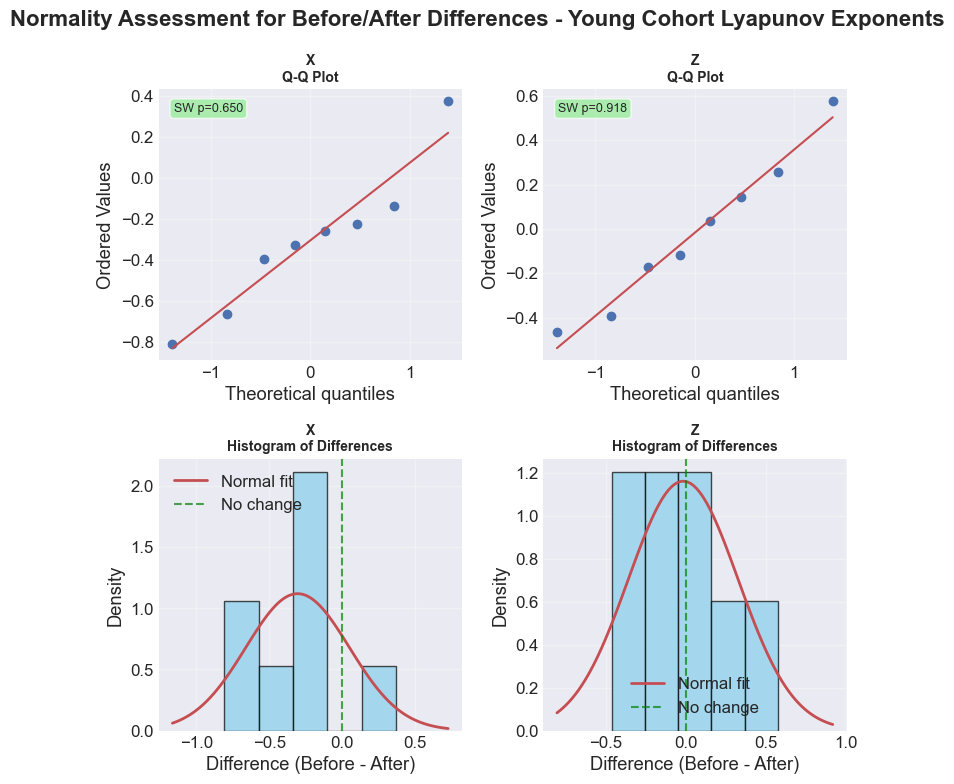


SUMMARY OF NORMALITY TEST RECOMMENDATIONS
Axis                 Normality       Recommended Test         
----------------------------------------------------------------------
X                    Normal          Paired t-test            
Z                    Normal          Paired t-test            

DECISION GUIDE
Based on Shapiro-Wilk test results:

Recommended statistical tests for each axis:
- X: Paired t-test
- Z: Paired t-test

Note: With small sample sizes (n<30), normality tests may lack power.
Visual inspection (Q-Q plots) is equally important for decision-making.

STEP 2: STATISTICAL TESTING

STATISTICAL TEST RESULTS - YOUNG COHORT

X (n=8 pairs):
  Before: Mean = 1.0612, SD = 0.4312
  After:  Mean = 1.3658, SD = 0.4040
  Mean difference (Before - After): -0.3046
  SD of differences: 0.3563
  Paired t-test: t = -2.4183, p = 0.0462
  Effect size (Cohen's d): -0.8550
  Effect size interpretation: large
  Result: Statistically significant difference (p < 0.05)
  Clinical inter

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import shapiro, normaltest, anderson, ttest_rel, wilcoxon
import warnings
from stats_lyapunov import analyze_normality_with_plots, statistical_tests, _perform_sensitivity_checks
warnings.filterwarnings('ignore')

def analyze_cohort(file_path, cohort_name='Cohort', 
                          subject_col='subject', condition_col='condition',
                          value_col='lyapunov_exponent', axis_col='axis'):
    """
    Complete Lyapunov analysis workflow: normality testing + statistical analysisusing predefiend helper functions.
    
    """
    
    print(f"{'='*80}")
    print(f"COMPLETE LYAPUNOV EXPONENT ANALYSIS - {cohort_name.upper()}")
    print(f"{'='*80}")
    
    # Normality testing with visualization
    print("STEP 1: NORMALITY ASSESSMENT WITH VISUALIZATION")
    recommendations, analysis_results = analyze_normality_with_plots(
        file_path, subject_col, condition_col, value_col, axis_col, 
        cohort_name=cohort_name)
    
    # Statistical testing
    print("\nSTEP 2: STATISTICAL TESTING")
    summary_df = statistical_tests(
        file_path, subject_col, condition_col, value_col, axis_col,
        cohort_name=cohort_name, recommendations=recommendations)

    return recommendations, analysis_results, summary_df

recommendations, analysis_results, summary_df = analyze_cohort(df_young_sle, 
    cohort_name="Young Cohort"
)


### Distribution of Lag and Emebdding Dimension

This analysis shows us that the average stride duration did not change a lot before and after the perturabtion.


DETAILED PARAMETER STATISTICS BY AXIS

LAG:

  Axis x:
    Before:
      Mean: 8.6250
      Median: 8.0000
      Std: 1.0607
      Range: [8.0000, 11.0000]
    After:
      Mean: 8.1250
      Median: 8.0000
      Std: 0.8345
      Range: [7.0000, 10.0000]

    Paired t-test (Before vs After): t = 2.6458, p = 0.0331

  Axis z:
    Before:
      Mean: 10.1250
      Median: 10.5000
      Std: 1.3562
      Range: [7.0000, 11.0000]
    After:
      Mean: 9.7500
      Median: 10.5000
      Std: 1.5811
      Range: [7.0000, 11.0000]

    Paired t-test (Before vs After): t = 0.8930, p = 0.4015

EMBEDDING DIMENSION:

  Axis x:
    Before:
      Mean: 11.5000
      Median: 12.0000
      Std: 4.0000
      Range: [6.0000, 18.0000]
    After:
      Mean: 9.3750
      Median: 9.0000
      Std: 3.5431
      Range: [4.0000, 16.0000]

    Paired t-test (Before vs After): t = 1.6326, p = 0.1466

  Axis z:
    Before:
      Mean: 10.3750
      Median: 12.5000
      Std: 5.9025
      Range: [2.0000, 18.0

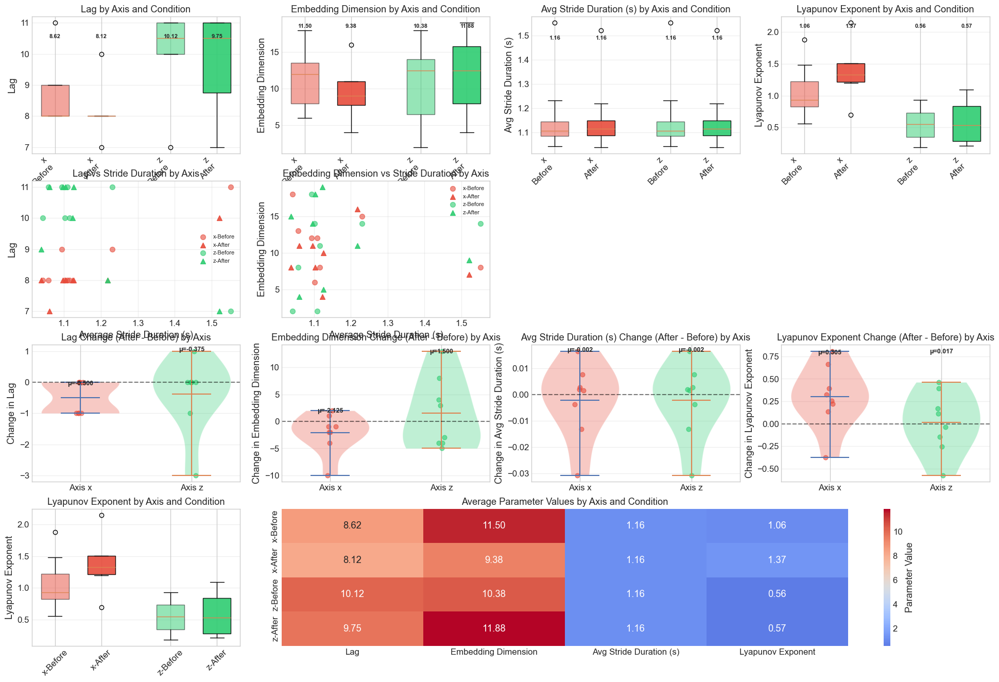

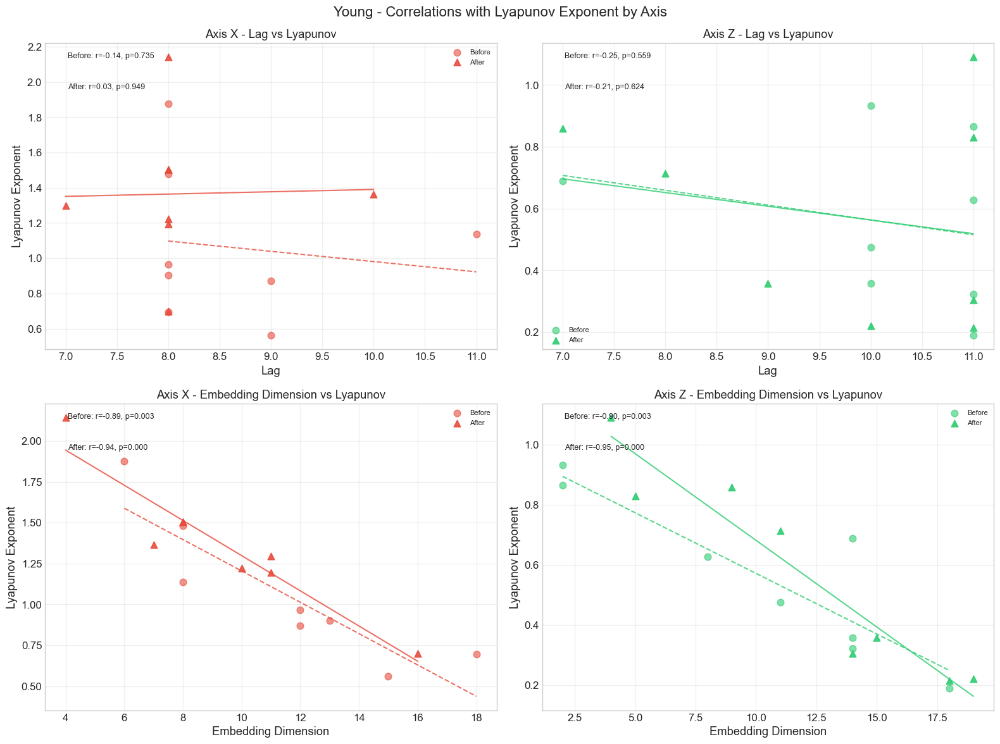

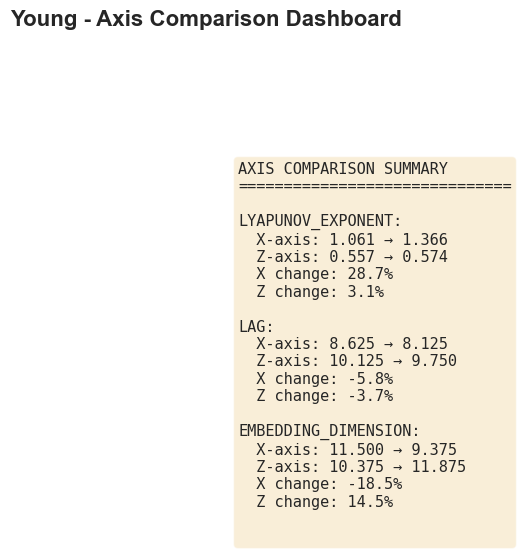

In [ ]:
from stats_lyapunov import analyze_single_cohort_by_axis, create_axis_comparison_dashboard

# Analysis
analyze_single_cohort_by_axis(df_young, 'Young')

# Dashboard
create_axis_comparison_dashboard(df_young, 'Young')

### Rain plots

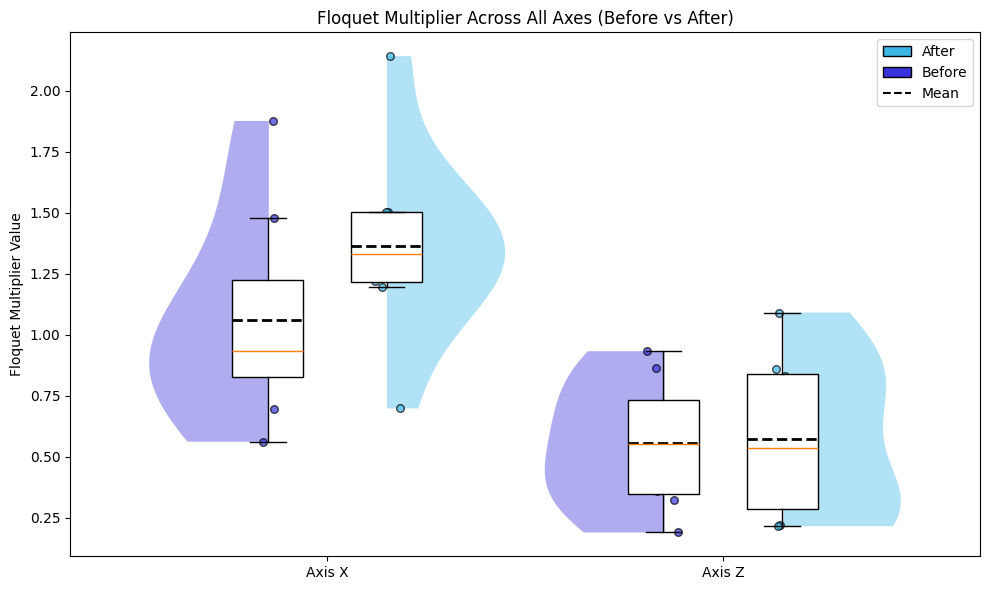

In [ ]:
from statistics_code import rain_plot_all_axes
rain_plot_all_axes(df_young_sle)

## Elderly

### Statistical tests

All test show normality

ELDERLY COHORT ANALYSIS
Data loaded: 80 rows, 9 columns
Subjects: 20
Shapiro-Wilk Test Results (α = 0.05)
If p > 0.05: Use paired t-test (normal)
If p < 0.05: Use Wilcoxon signed-rank test (non-normal)
----------------------------------------------------------------------

X:
  Sample size: n = 20 pairs
  Shapiro-Wilk statistic: 0.9283
  p-value: 0.1432
  Normality assessment: Normal
  Recommended test: Paired t-test
  Mean difference: -0.3917
  Std of differences: 0.7495
  Median difference: -0.3076

Z:
  Sample size: n = 20 pairs
  Shapiro-Wilk statistic: 0.9712
  p-value: 0.7802
  Normality assessment: Normal
  Recommended test: Paired t-test
  Mean difference: -0.0417
  Std of differences: 0.3396
  Median difference: 0.0117


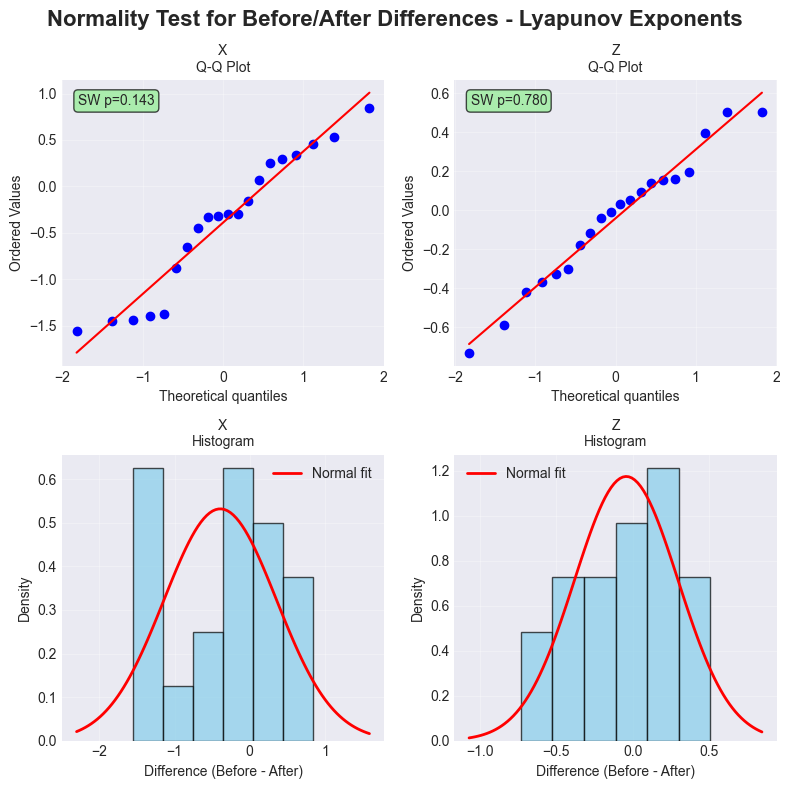


SUMMARY OF RECOMMENDATIONS
Axis                 Normality       Recommended Test         
------------------------------------------------------------
X                    Normal          Paired t-test            
Z                    Normal          Paired t-test            

ADDITIONAL NORMALITY TESTS (for comparison)

DECISION GUIDE
Based on the Shapiro-Wilk test results:

Recommended statistical tests for each axis:
- X: Paired t-test
- Z: Paired t-test

Note: With small sample sizes (n<30), normality tests may lack power.
Visual inspection (Q-Q plots) is equally important for decision-making.

STATISTICAL TEST RESULTS

X:
  Before: Mean = 1.3210, SD = 0.4239
  After: Mean = 1.7128, SD = 0.6164
  Mean difference (Before - After): -0.3917
  Paired t-test: t = -2.3374, p = 0.0305
  Effect size (Cohen's d): -0.5227
  Result: Statistically significant difference (p < 0.05)

Z:
  Before: Mean = 0.6571, SD = 0.2333
  After: Mean = 0.6987, SD = 0.2830
  Mean difference (Before - After): 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import shapiro, normaltest, anderson
import warnings
from scipy.stats import shapiro, normaltest, anderson, ttest_rel, wilcoxon
from stats_lyapunov import check_normality_lyapunov, perform_statistical_tests, check_normality_and_test_lyapunov
warnings.filterwarnings('ignore')

recommendations_elderly = check_normality_lyapunov(df_elderly_sle)
results_elderly = perform_statistical_tests(df_elderly_sle, recommendations_elderly)
check_normality_and_test_lyapunov(df_elderly_sle,  cohort_name="Elderly")

### Distribution of Lag and Embedding Dimension

Average time also did not change here before and after perturbation.
The rest of the results are analysed in the PDF.

Columns available: ['subject', 'condition', 'axis', 'average stride duration', 'measuring time (s)', 'lag', 'embedding_dimension', 'fnn_threshold', 'lyapunov_exponent', 'cohort']
Elderly subjects: 20
Axes found: ['x' 'z']

DETAILED PARAMETER STATISTICS BY AXIS

LAG:

  Axis x:
    Before:
      Mean: 8.8500
      Median: 9.0000
      Std: 0.9333
      Range: [8.0000, 12.0000]
    After:
      Mean: 8.2000
      Median: 8.0000
      Std: 0.8335
      Range: [7.0000, 11.0000]

    Paired t-test (Before vs After): t = 2.1557, p = 0.0441

  Axis z:
    Before:
      Mean: 10.3500
      Median: 10.0000
      Std: 3.8835
      Range: [7.0000, 26.0000]
    After:
      Mean: 10.1000
      Median: 9.5000
      Std: 3.9457
      Range: [7.0000, 26.0000]

    Paired t-test (Before vs After): t = 0.2086, p = 0.8370

EMBEDDING DIMENSION:

  Axis x:
    Before:
      Mean: 8.9500
      Median: 8.5000
      Std: 2.3725
      Range: [5.0000, 12.0000]
    After:
      Mean: 7.6000
      Median: 8.0000

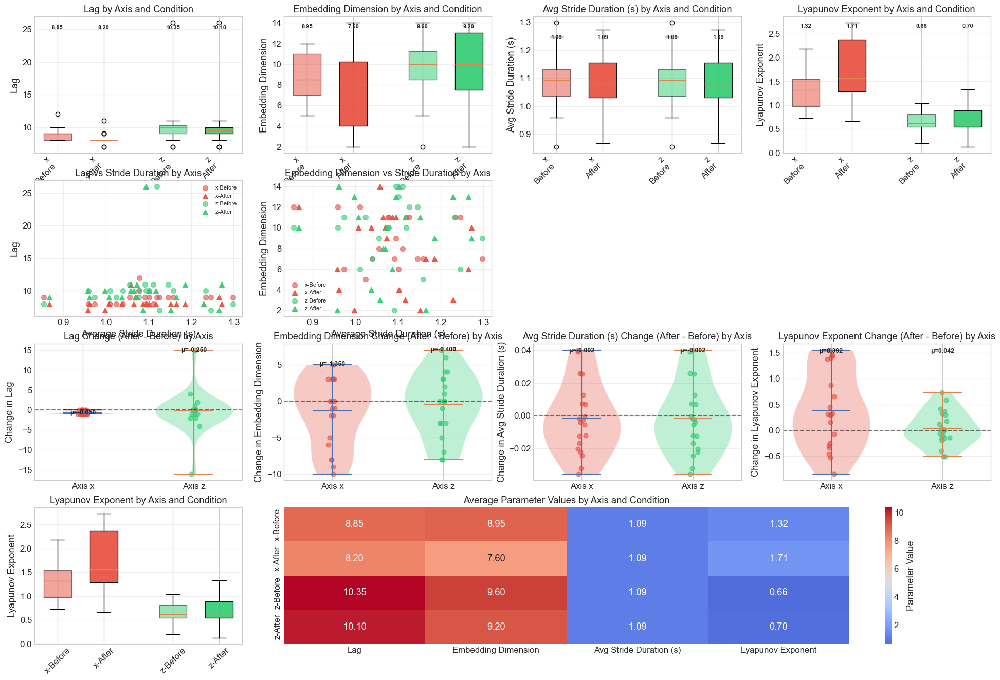

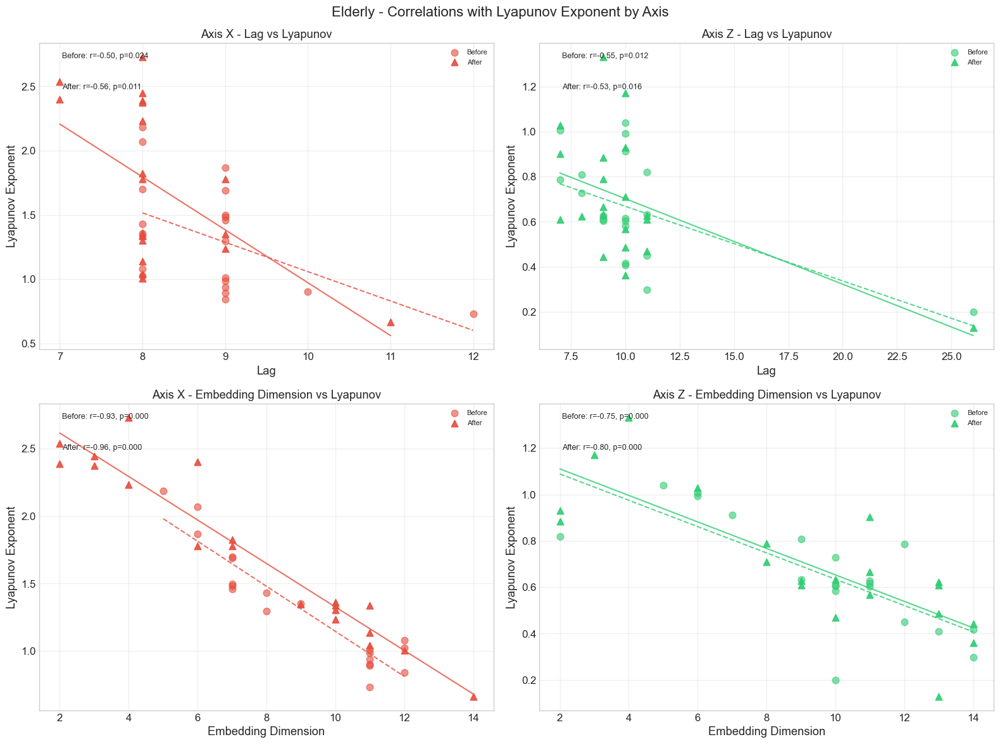

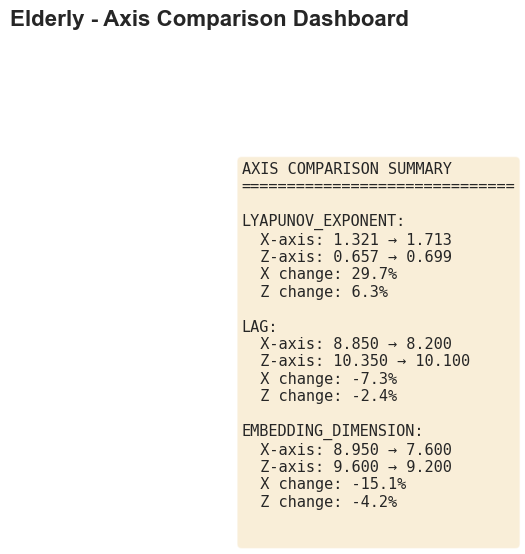

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy import stats
import matplotlib.patches as mpatches
from statistics_code import analyze_single_cohort_by_axis, create_axis_comparison_dashboard
from mpl_toolkits.mplot3d import Axes3D

# Example usage
if __name__ == "__main__":
    
    # Analysis
    analyze_single_cohort_by_axis(df_elderly_sle, 'Elderly')
    
    # Dashboard
    create_axis_comparison_dashboard(df_elderly_sle, 'Elderly')

## Comparison: Young - Elderly

### Rain Plot - Young vs. Elderly

Successfully loaded both cohort files
Young data shape: (32, 9)
Elderly data shape: (80, 9)


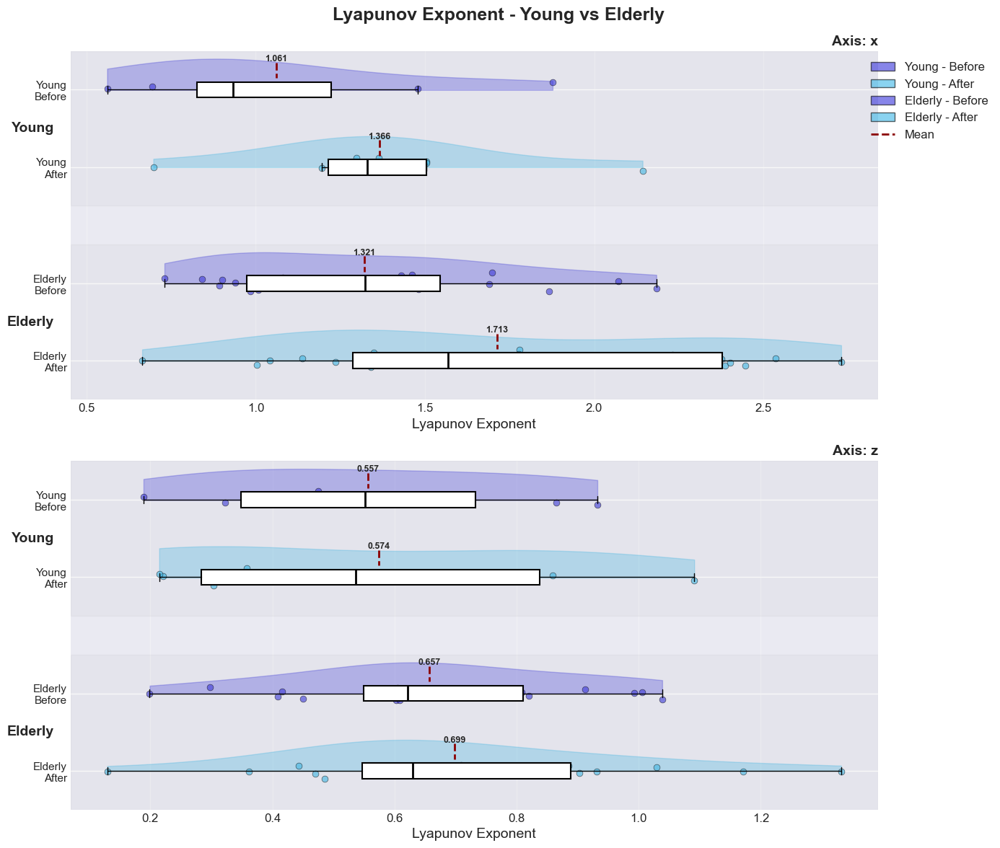


DETAILED STATISTICS

YOUNG:

  Before:
    N: 16
    Mean: 0.8091
    Median: 0.7801
    Std: 0.4330
    Range: [0.1889, 1.8770]

  After:
    N: 16
    Mean: 0.9700
    Median: 0.9752
    Std: 0.5451
    Range: [0.2146, 2.1428]

ELDERLY:

  Before:
    N: 40
    Mean: 0.9891
    Median: 0.9067
    Std: 0.4765
    Range: [0.1991, 2.1835]

  After:
    N: 40
    Mean: 1.2057
    Median: 1.0353
    Std: 0.6984
    Range: [0.1293, 2.7294]

BETWEEN-COHORT COMPARISONS

Before:
  Young vs Elderly: t = -1.3083, p = 0.1963
  Cohen's d: -0.3870

After:
  Young vs Elderly: t = -1.2087, p = 0.2320
  Cohen's d: -0.3576


In [173]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy import stats

def horizontal_rain_plots_two(file_path1, file_path2, 
                                           cohort1_name='Young', 
                                           cohort2_name='Elderly',
                                           subject_col='subject', 
                                           condition_col='condition', 
                                           value_col='lyapunov_exponent',
                                           axis_col='axis',
                                           sheet_name=0):
    """
    Create horizontal rain plots comparing two cohorts (e.g., Young vs Elderly) 
    with before/after conditions side by side.
    
    Parameters:
    -----------
    file_path1, file_path2 : str or Path
        Paths to the Excel files for cohort 1 and cohort 2
    cohort1_name, cohort2_name : str
        Names for the cohorts
    Other parameters as before...
    """
    
    # Read both Excel files
    try:
        df1 = pd.read_excel(file_path1, sheet_name=sheet_name)
        df2 = pd.read_excel(file_path2, sheet_name=sheet_name)
        print(f"Successfully loaded both cohort files")
        print(f"{cohort1_name} data shape: {df1.shape}")
        print(f"{cohort2_name} data shape: {df2.shape}")
    except Exception as e:
        print(f"Error reading Excel files: {e}")
        return
    
    # Add cohort column to each dataframe
    df1['cohort'] = cohort1_name
    df2['cohort'] = cohort2_name
    
    # conditions = sorted(df1[condition_col].unique())
    conditions = ['Before', 'After'] 
    if axis_col in df1.columns:
        axes = sorted(df1[axis_col].unique())
        n_axes = len(axes)
    else:
        axes = ['All']
        n_axes = 1
    
    
    fig, axs = plt.subplots(n_axes, 1, figsize=(14, 6*n_axes))
    
    if n_axes == 1:
        axs = [axs]
    
  
    cohort_colors = {
        cohort1_name: {'before': '#3734db', 'after': '#3cb7e7'},  # Blues for Young
        cohort2_name: {'before': '#3734db', 'after': '#3cb7e7'}   # Reds for Elderly
    }
 
    for ax_idx, (ax, axis_name) in enumerate(zip(axs, axes)):
        # Filter data for this axis
        if axis_name == 'All':
            axis_df1 = df1
            axis_df2 = df2
        else:
            axis_df1 = df1[df1[axis_col] == axis_name]
            axis_df2 = df2[df2[axis_col] == axis_name]
        
        # Prepare data structure
        plot_data = []
        plot_labels = []
        plot_colors = []
        plot_positions = []
        
        position = 0
        group_positions = {}
        
        # Process each cohort
        for cohort_idx, (df, cohort) in enumerate([(axis_df1, cohort1_name), 
                                                    (axis_df2, cohort2_name)]):
            group_start = position
            
            for cond_idx, condition in enumerate(conditions):
                # Get data for this condition
                cond_data = df[df[condition_col] == condition][value_col].dropna().values
                
                if len(cond_data) > 0:
                    plot_data.append(cond_data)
                    plot_labels.append(f"{cohort}\n{condition.title()}")
                    plot_colors.append(cohort_colors[cohort][condition.lower()])
                    plot_positions.append(position)
                    position += 1
                else:
                    position += 1  
            
            group_positions[cohort] = (group_start, position - 1)
            position += 0.5  # Add space between cohorts
        
        # Create horizontal violin plots
        parts = ax.violinplot(plot_data, positions=plot_positions, vert=False,
                             widths=0.8, showmeans=False, showmedians=False, 
                             showextrema=False)
        
        # Color the violins
        for i, pc in enumerate(parts['bodies']):
            pc.set_facecolor(plot_colors[i])
            pc.set_alpha(0.3)
            pc.set_edgecolor(plot_colors[i])
            # Make half violin (bottom half)
            m = np.mean(pc.get_paths()[0].vertices[:, 1])
            # pc.get_paths()[0].vertices[:, 1] = np.clip(pc.get_paths()[0].vertices[:, 1], m, np.inf)
            pc.get_paths()[0].vertices[:, 1] = np.clip(pc.get_paths()[0].vertices[:, 1], -np.inf, m)
        # Add box plots
        bp = ax.boxplot(plot_data, positions=plot_positions, vert=False,
                       widths=0.2, showfliers=False, patch_artist=True)
        
        for i, (box, median) in enumerate(zip(bp['boxes'], bp['medians'])):
            box.set_facecolor('white')
            box.set_edgecolor('black')
            box.set_linewidth(1.5)
            median.set_color('black')
            median.set_linewidth(2)
        
        # Add strip plots (rain drops)
        for i, (data, pos, color) in enumerate(zip(plot_data, plot_positions, plot_colors)):
            y_jitter = np.random.normal(0, 0.06, size=len(data))
            ax.scatter(data, np.full_like(data, pos) + y_jitter, 
                      alpha=0.6, s=40, color=color, edgecolor='black', linewidth=0.5)
            
            # Add mean line
            mean_val = np.mean(data)
            ax.vlines(mean_val, pos - 0.35, pos - 0.15, colors='darkred', 
                     linestyles='dashed', linewidth=2)
            
            # Add mean value text
            ax.text(mean_val, pos - 0.45, f'{mean_val:.3f}', 
                   ha='center', va='top', fontsize=9, fontweight='bold')
        
        # Add cohort separators and labels
        for cohort, (start, end) in group_positions.items():
            mid = (start + end) / 2
            ax.axhspan(start - 0.5, end + 0.5, alpha=0.05, color='gray')
            ax.text(ax.get_xlim()[0] - 0.02 * (ax.get_xlim()[1] - ax.get_xlim()[0]), 
                   mid, cohort, ha='right', va='center', fontsize=14, fontweight='bold')
        
        # Customize subplot
        ax.set_yticks(plot_positions)
        ax.set_yticklabels(plot_labels, fontsize=11)
        ax.set_xlabel(value_col.replace('_', ' ').title(), fontsize=14)
        
        if axis_name != 'All':
            ax.set_title(f'Axis: {axis_name}', fontsize=14, fontweight='bold', loc='right')
        
        ax.grid(axis='x', alpha=0.3)
        ax.invert_yaxis()  
    
    # Main title
    plt.suptitle(f'{value_col.replace("_", " ").title()} - {cohort1_name} vs {cohort2_name}', 
                fontsize=18, fontweight='bold')
    
    # Add legend
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D
    legend_elements = []
    for cohort in [cohort1_name, cohort2_name]:
        for condition in conditions:
            legend_elements.append(
                Patch(facecolor=cohort_colors[cohort][condition.lower()], 
                      edgecolor='black', alpha=0.6,
                      label=f'{cohort} - {condition.title()}')
            )
    legend_elements.append(Line2D([0], [0], color='darkred', linestyle='--', 
                                  linewidth=2, label='Mean'))
    
    # Legend outside
    if n_axes == 1:
        axs[0].legend(handles=legend_elements, loc='center left', 
                     bbox_to_anchor=(1.02, 0.5), ncol=1)
    else:
        axs[0].legend(handles=legend_elements, loc='upper right', 
                     bbox_to_anchor=(1.15, 1), ncol=1)
    
    plt.tight_layout()
    plt.show()
    
    print("\n" + "="*60)
    print("DETAILED STATISTICS")
    print("="*60)
    
    for cohort, df in [(cohort1_name, df1), (cohort2_name, df2)]:
        print(f"\n{cohort.upper()}:")
        for condition in conditions:
            cond_data = df[df[condition_col] == condition][value_col].dropna()
            print(f"\n  {condition.title()}:")
            print(f"    N: {len(cond_data)}")
            print(f"    Mean: {cond_data.mean():.4f}")
            print(f"    Median: {cond_data.median():.4f}")
            print(f"    Std: {cond_data.std():.4f}")
            print(f"    Range: [{cond_data.min():.4f}, {cond_data.max():.4f}]")
    
    # Between-cohort comparisons
    print("\n" + "="*60)
    print("BETWEEN-COHORT COMPARISONS")
    print("="*60)
    
    for condition in conditions:
        print(f"\n{condition.title()}:")
        data2 = df2[df2[condition_col] == condition][value_col].dropna()
        data1 = df1[df1[condition_col] == condition][value_col].dropna()
        
        
        if len(data1) > 0 and len(data2) > 0:
            t_stat, p_val = stats.ttest_ind(data1, data2)
            print(f"  {cohort1_name} vs {cohort2_name}: t = {t_stat:.4f}, p = {p_val:.4f}")
            
            # Effect size (Cohen's d)
            pooled_std = np.sqrt(((len(data1)-1)*data1.std()**2 + (len(data2)-1)*data2.std()**2) / 
                                (len(data1) + len(data2) - 2))
            cohen_d = (data1.mean() - data2.mean()) / pooled_std
            print(f"  Cohen's d: {cohen_d:.4f}")




# Example usage functions
def analyze_two_cohorts(file_path1, file_path2, cohort1_name='Young', cohort2_name='Elderly'):
    """
    Analyze and plot two cohorts side by side.
    """
    horizontal_rain_plots_two(
        file_path1, file_path2,
        cohort1_name=cohort1_name,
        cohort2_name=cohort2_name,
        subject_col='subject',
        condition_col='condition',
        value_col='lyapunov_exponent',
        axis_col='axis'
    )




# Main execution
if __name__ == "__main__":
    from pathlib import Path
    cwd = Path.cwd()
    young_file = cwd.parent / ".." / "results" / "Young" / "Young_Lyapunov_DS_Final.xlsx"
    elderly_file = cwd.parent / ".." / "results" / "Elderly" / "Elderly_Lyapunov_DS_1807.xlsx"
    analyze_two_cohorts(young_file, elderly_file, 'Young', 'Elderly')


## CGA

In [175]:
df_cga_sle  =pd.read_excel( cwd.parent/".."/"results"/"CGA"/"CGA_Lyapunov_DS_Tolerance.15_15Hz_1807.xlsx")

### Normality test, QQ plots

#### by patient and speed

NORMALITY TESTING

AXIS X

Patients with all 3 speeds: 14

FRIEDMAN TEST:
  χ² = 5.2857, p = 0.0712
  Overall speed effect: Not significant

PAIRWISE COMPARISONS:

PWS vs SWS:
  Sample size: n = 15 pairs
  Patients: 04, 16, 18, 27, 30 ...
  Mean PWS: 2.2571
  Mean SWS: 1.6940
  Mean difference: 0.5631 ± 0.8417
  Shapiro-Wilk statistic: 0.9767
  p-value: 0.9418
  Normality: Normal
  Recommended test: Paired t-test

PWS vs FWS:
  Sample size: n = 17 pairs
  Patients: 04, 09, 16, 18, 20 ...
  Mean PWS: 2.3093
  Mean FWS: 2.5179
  Mean difference: -0.2086 ± 1.3564
  Shapiro-Wilk statistic: 0.9567
  p-value: 0.5705
  Normality: Normal
  Recommended test: Paired t-test

SWS vs FWS:
  Sample size: n = 16 pairs
  Patients: 04, 16, 18, 27, 30 ...
  Mean SWS: 1.6963
  Mean FWS: 2.5231
  Mean difference: -0.8268 ± 1.5092
  Shapiro-Wilk statistic: 0.9067
  p-value: 0.1028
  Normality: Normal
  Recommended test: Paired t-test


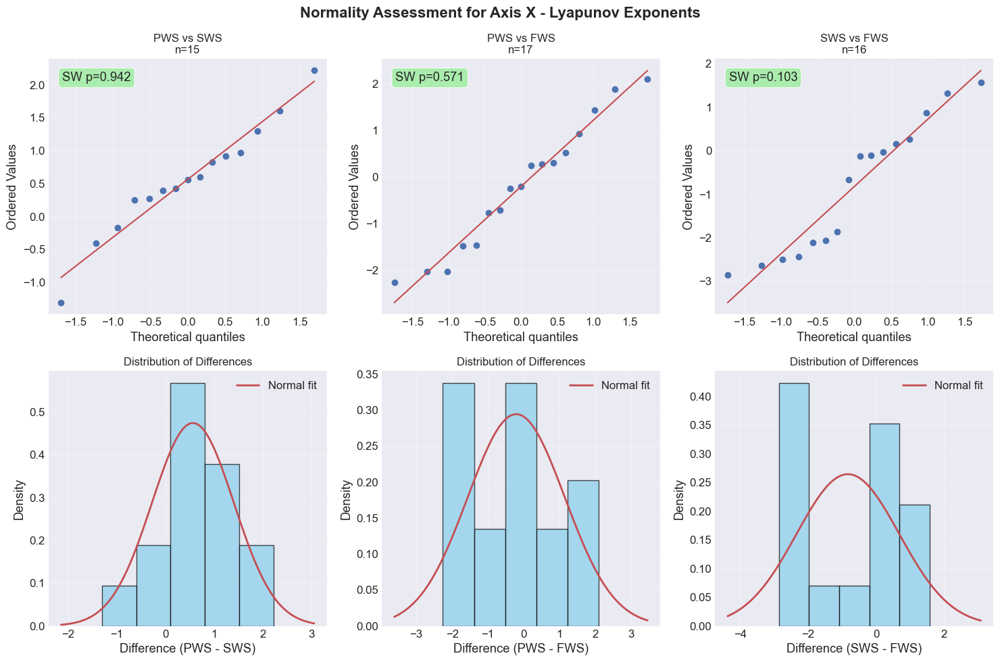


AXIS Z

Patients with all 3 speeds: 14

FRIEDMAN TEST:
  χ² = 4.0000, p = 0.1353
  Overall speed effect: Not significant

PAIRWISE COMPARISONS:

PWS vs SWS:
  Sample size: n = 15 pairs
  Patients: 04, 16, 18, 27, 30 ...
  Mean PWS: 1.4540
  Mean SWS: 1.0978
  Mean difference: 0.3562 ± 0.4186
  Shapiro-Wilk statistic: 0.9585
  p-value: 0.6670
  Normality: Normal
  Recommended test: Paired t-test

PWS vs FWS:
  Sample size: n = 17 pairs
  Patients: 04, 09, 16, 18, 20 ...
  Mean PWS: 1.3555
  Mean FWS: 1.1532
  Mean difference: 0.2023 ± 0.5954
  Shapiro-Wilk statistic: 0.9467
  p-value: 0.4059
  Normality: Normal
  Recommended test: Paired t-test

SWS vs FWS:
  Sample size: n = 16 pairs
  Patients: 04, 16, 18, 27, 30 ...
  Mean SWS: 1.1168
  Mean FWS: 1.1648
  Mean difference: -0.0480 ± 0.6675
  Shapiro-Wilk statistic: 0.9113
  p-value: 0.1221
  Normality: Normal
  Recommended test: Paired t-test


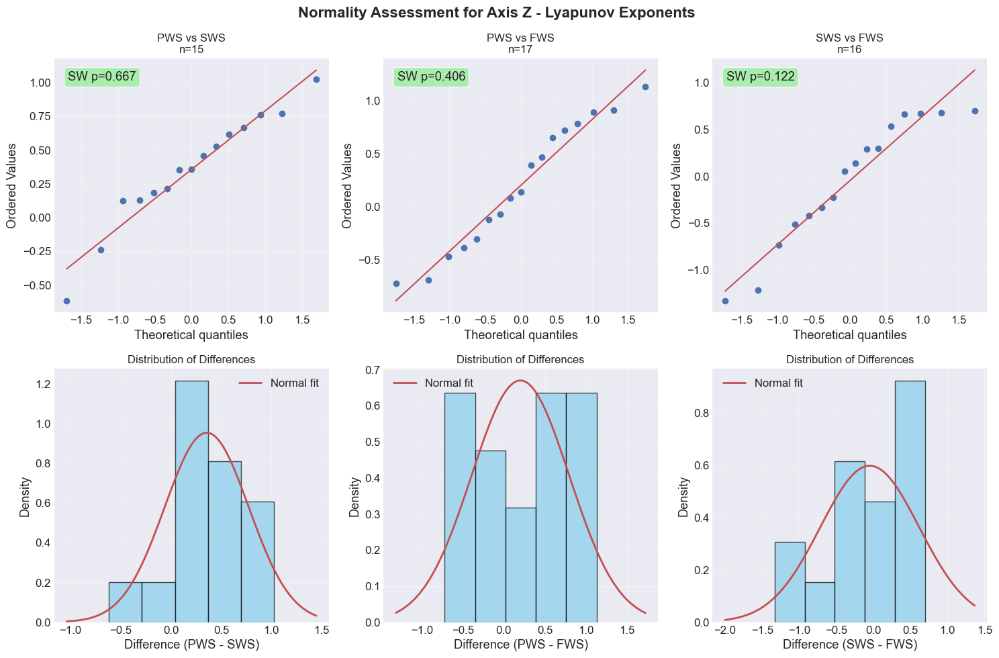


COMPREHENSIVE SUMMARY

SUMMARY TABLE - TEST RECOMMENDATIONS
Axis       Comparison      n     Normality    Test                     
----------------------------------------------------------------------
x          PWS_vs_SWS      15    Normal       Paired t-test            
x          PWS_vs_FWS      17    Normal       Paired t-test            
x          SWS_vs_FWS      16    Normal       Paired t-test            
z          PWS_vs_SWS      15    Normal       Paired t-test            
z          PWS_vs_FWS      17    Normal       Paired t-test            
z          SWS_vs_FWS      16    Normal       Paired t-test            

Based on Shapiro-Wilk test results tests::

AXIS X:
  PWS vs SWS: Paired t-test
  PWS vs FWS: Paired t-test
  SWS vs FWS: Paired t-test

AXIS Z:
  PWS vs SWS: Paired t-test
  PWS vs FWS: Paired t-test
  SWS vs FWS: Paired t-test

Bonferroni correction: use α = 0.05/3 = 0.0167


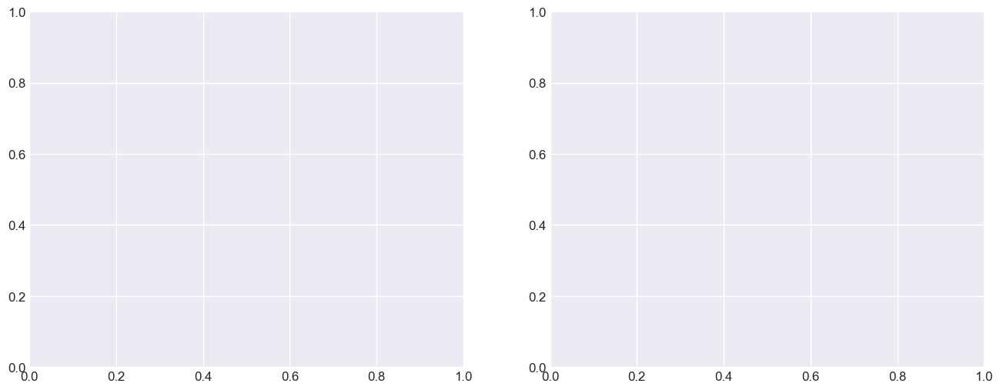

In [176]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')


df_cga_sle['patient_id'] = df_cga_sle['subject'].str[1:]

print("="*70)
print("NORMALITY TESTING")
print("="*70)

# Define comparisons and axes
comparisons = [('PWS', 'SWS'), ('PWS', 'FWS'), ('SWS', 'FWS')]
axes = sorted(df_cga_sle['axis'].unique())

# Create comprehensive figure for each axis
n_axes = len(axes)
n_comparisons = len(comparisons)

# Store all recommendations
all_recommendations = {}

# Process each axis separately
for axis_idx, axis in enumerate(axes):
    print(f"\n{'='*60}")
    print(f"AXIS {axis.upper()}")
    print(f"{'='*60}")
    
    # Filter data for this axis
    axis_data = df_cga_sle[df_cga_sle['axis'] == axis]
    
    # Create figure for this axis
    fig = plt.figure(figsize=(15, 10))
    fig.suptitle(f'Normality Assessment for Axis {axis.upper()} - Lyapunov Exponents', 
                fontsize=16, fontweight='bold')
    
    axis_recommendations = {}
    
    # First check if we have patients with all three speeds
    patients_with_all = []
    for patient in axis_data['patient_id'].unique():
        patient_data = axis_data[axis_data['patient_id'] == patient]
        speeds_present = patient_data['walking_speed'].unique()
        if set(['PWS', 'SWS', 'FWS']).issubset(set(speeds_present)):
            patients_with_all.append(patient)
    
    print(f"\nPatients with all 3 speeds: {len(patients_with_all)}")
    
    # Friedman test if we have enough data
    if len(patients_with_all) >= 3:
        pws_vals = []
        sws_vals = []
        fws_vals = []
        
        for patient in patients_with_all:
            pws = axis_data[(axis_data['patient_id'] == patient) & 
                           (axis_data['walking_speed'] == 'PWS')]['lyapunov_exponent'].values[0]
            sws = axis_data[(axis_data['patient_id'] == patient) & 
                           (axis_data['walking_speed'] == 'SWS')]['lyapunov_exponent'].values[0]
            fws = axis_data[(axis_data['patient_id'] == patient) & 
                           (axis_data['walking_speed'] == 'FWS')]['lyapunov_exponent'].values[0]
            
            pws_vals.append(pws)
            sws_vals.append(sws)
            fws_vals.append(fws)
        
        # Perform Friedman test
        stat, p_val = stats.friedmanchisquare(pws_vals, sws_vals, fws_vals)
        print(f"\nFRIEDMAN TEST:")
        print(f"  χ² = {stat:.4f}, p = {p_val:.4f}")
        print(f"  Overall speed effect: {'Significant' if p_val < 0.05 else 'Not significant'}")
    
    print("\nPAIRWISE COMPARISONS:")
    
    for comp_idx, (speed1, speed2) in enumerate(comparisons):
        # Find patients that have both speeds
        patients_with_pair = []
        
        for patient in axis_data['patient_id'].unique():
            patient_data = axis_data[axis_data['patient_id'] == patient]
            speeds_present = patient_data['walking_speed'].unique()
            if speed1 in speeds_present and speed2 in speeds_present:
                patients_with_pair.append(patient)
        
        # Get paired data
        vals1 = []
        vals2 = []
        
        for patient in patients_with_pair:
            patient_data = axis_data[axis_data['patient_id'] == patient]
            val1 = patient_data[patient_data['walking_speed'] == speed1]['lyapunov_exponent'].values
            val2 = patient_data[patient_data['walking_speed'] == speed2]['lyapunov_exponent'].values
            
            if len(val1) > 0 and len(val2) > 0:
                vals1.append(val1[0])
                vals2.append(val2[0])
        
        vals1 = np.array(vals1)
        vals2 = np.array(vals2)
        
        if len(vals1) >= 3:  # Need at least 3 pairs
            # Calculate differences
            differences = vals1 - vals2
            n_pairs = len(differences)
            
            # Shapiro-Wilk test
            statistic, p_value = stats.shapiro(differences)
            
            if p_value > 0.05:
                test_recommendation = "Paired t-test"
                normality_status = "Normal"
            else:
                test_recommendation = "Wilcoxon signed-rank"
                normality_status = "Non-normal"
            
            axis_recommendations[f"{speed1}_vs_{speed2}"] = test_recommendation
            
            # Print results
            print(f"\n{speed1} vs {speed2}:")
            print(f"  Sample size: n = {n_pairs} pairs")
            print(f"  Patients: {', '.join(patients_with_pair[:5])}{' ...' if len(patients_with_pair) > 5 else ''}")
            print(f"  Mean {speed1}: {np.mean(vals1):.4f}")
            print(f"  Mean {speed2}: {np.mean(vals2):.4f}")
            print(f"  Mean difference: {np.mean(differences):.4f} ± {np.std(differences, ddof=1):.4f}")
            print(f"  Shapiro-Wilk statistic: {statistic:.4f}")
            print(f"  p-value: {p_value:.4f}")
            print(f"  Normality: {normality_status}")
            print(f"  Recommended test: {test_recommendation}")
            
            # Q-Q plot
            ax_qq = plt.subplot(2, 3, comp_idx + 1)
            stats.probplot(differences, dist="norm", plot=ax_qq)
            ax_qq.set_title(f'{speed1} vs {speed2}\nn={n_pairs}', fontsize=12)
            ax_qq.grid(True, alpha=0.3)
            
            # Add p-value to plot
            ax_qq.text(0.05, 0.95, f'SW p={p_value:.3f}', 
                      transform=ax_qq.transAxes, 
                      bbox=dict(boxstyle='round', 
                               facecolor='yellow' if p_value < 0.05 else 'lightgreen', 
                               alpha=0.7),
                      verticalalignment='top')
            
            # Histogram with normal overlay
            ax_hist = plt.subplot(2, 3, comp_idx + 4)
            
            # Plot histogram
            n_bins = min(15, max(5, n_pairs // 3))
            ax_hist.hist(differences, bins=n_bins, density=True, alpha=0.7, 
                        color='skyblue', edgecolor='black')
            
            # Overlay normal distribution
            mu, sigma = np.mean(differences), np.std(differences, ddof=1)
            if sigma > 0:
                x = np.linspace(differences.min() - sigma, differences.max() + sigma, 100)
                ax_hist.plot(x, stats.norm.pdf(x, mu, sigma), 'r-', linewidth=2, 
                           label='Normal fit')
            
            ax_hist.set_xlabel(f'Difference ({speed1} - {speed2})')
            ax_hist.set_ylabel('Density')
            ax_hist.set_title(f'Distribution of Differences', fontsize=12)
            ax_hist.legend()
            ax_hist.grid(True, alpha=0.3)
            
        else:
            print(f"\n{speed1} vs {speed2}: Insufficient data (n={len(vals1)})")
            axis_recommendations[f"{speed1}_vs_{speed2}"] = "Insufficient data"
    
    all_recommendations[axis] = axis_recommendations
    
    plt.tight_layout()
    plt.show()

# Create comprehensive summary heatmap
print("\n" + "="*70)
print("COMPREHENSIVE SUMMARY")
print("="*70)

# Prepare data for heatmap - p-values for all axes and comparisons
p_value_matrix = np.full((len(axes), len(comparisons)), np.nan)
sample_size_matrix = np.zeros((len(axes), len(comparisons)), dtype=int)

for axis_idx, axis in enumerate(axes):
    axis_data = df_cga_sle[df_cga_sle['axis'] == axis]
    
    for comp_idx, (speed1, speed2) in enumerate(comparisons):
        # Get patients with both speeds
        patients_with_pair = []
        for patient in axis_data['patient_id'].unique():
            patient_data = axis_data[axis_data['patient_id'] == patient]
            speeds_present = patient_data['walking_speed'].unique()
            if speed1 in speeds_present and speed2 in speeds_present:
                patients_with_pair.append(patient)
        
        # Get paired values
        vals1 = []
        vals2 = []
        for patient in patients_with_pair:
            patient_data = axis_data[axis_data['patient_id'] == patient]
            val1 = patient_data[patient_data['walking_speed'] == speed1]['lyapunov_exponent'].values
            val2 = patient_data[patient_data['walking_speed'] == speed2]['lyapunov_exponent'].values
            if len(val1) > 0 and len(val2) > 0:
                vals1.append(val1[0])
                vals2.append(val2[0])
        
        sample_size_matrix[axis_idx, comp_idx] = len(vals1)
        
        if len(vals1) >= 3:
            differences = np.array(vals1) - np.array(vals2)
            _, p_value = stats.shapiro(differences)
            p_value_matrix[axis_idx, comp_idx] = p_value

# Create heatmap figure
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# P-value heatmap
mask1 = np.isnan(p_value_matrix)
colors = ['red', 'yellow', 'lightgreen', 'green']
n_bins = 100
cmap = plt.cm.colors.LinearSegmentedColormap.from_list('custom', colors, N=n_bins)

# Summary table
print("\n" + "="*70)
print("SUMMARY TABLE - TEST RECOMMENDATIONS")
print("="*70)
print(f"{'Axis':<10} {'Comparison':<15} {'n':<5} {'Normality':<12} {'Test':<25}")
print("-"*70)

for axis in axes:
    for comp in comparisons:
        comp_key = f"{comp[0]}_vs_{comp[1]}"
        if axis in all_recommendations and comp_key in all_recommendations[axis]:
            test = all_recommendations[axis][comp_key]
            if test != "Insufficient data":
                normality = "Normal" if test == "Paired t-test" else "Non-normal"
                
                # Get sample size
                axis_data = df_cga_sle[df_cga_sle['axis'] == axis]
                patients_with_pair = []
                for patient in axis_data['patient_id'].unique():
                    patient_data = axis_data[axis_data['patient_id'] == patient]
                    speeds_present = patient_data['walking_speed'].unique()
                    if comp[0] in speeds_present and comp[1] in speeds_present:
                        patients_with_pair.append(patient)
                n = len(patients_with_pair)
                
                print(f"{axis:<10} {comp_key:<15} {n:<5} {normality:<12} {test:<25}")
            else:
                print(f"{axis:<10} {comp_key:<15} {'<3':<5} {'N/A':<12} {test:<25}")


print("\nBased on Shapiro-Wilk test results tests::")

for axis in axes:
    print(f"\nAXIS {axis.upper()}:")
    if axis in all_recommendations:
        for comp in comparisons:
            comp_key = f"{comp[0]}_vs_{comp[1]}"
            if comp_key in all_recommendations[axis]:
                test = all_recommendations[axis][comp_key]
                print(f"  {comp[0]} vs {comp[1]}: {test}")


print("\nBonferroni correction: use α = 0.05/3 = 0.0167")



#### by diagnosis

NORMALITY TESTING FOR LYAPUNOV EXPONENTS - WALKING SPEED COMPARISONS BY DIAGNOSIS
Conditions found: PD, Stroke, MS, Intradural extramedullary, Brain tumor, Parese, Brain ansec

Testing differences between speed pairs for normality within each condition
If p > 0.05: Use paired t-test (normal)
If p < 0.05: Use Wilcoxon signed-rank test (non-normal)
----------------------------------------------------------------------

CONDITION: PD
Total patients in PD: 5
Patients with all 3 speeds: 5

AXIS X:
  Friedman test (n=5): χ² = 0.4000, p = 0.8187
  PWS vs SWS:
    n = 5 pairs
    Mean PWS: 1.9906
    Mean SWS: 1.6983
    Mean difference: 0.2923 ± 1.1546
    Shapiro-Wilk p = 0.8527 → Normal → Paired t-test
  PWS vs FWS:
    n = 5 pairs
    Mean PWS: 1.9906
    Mean FWS: 2.0813
    Mean difference: -0.0907 ± 1.6360
    Shapiro-Wilk p = 0.6807 → Normal → Paired t-test
  SWS vs FWS:
    n = 5 pairs
    Mean SWS: 1.6983
    Mean FWS: 2.0813
    Mean difference: -0.3830 ± 2.0295
    Shapiro-Wilk p =

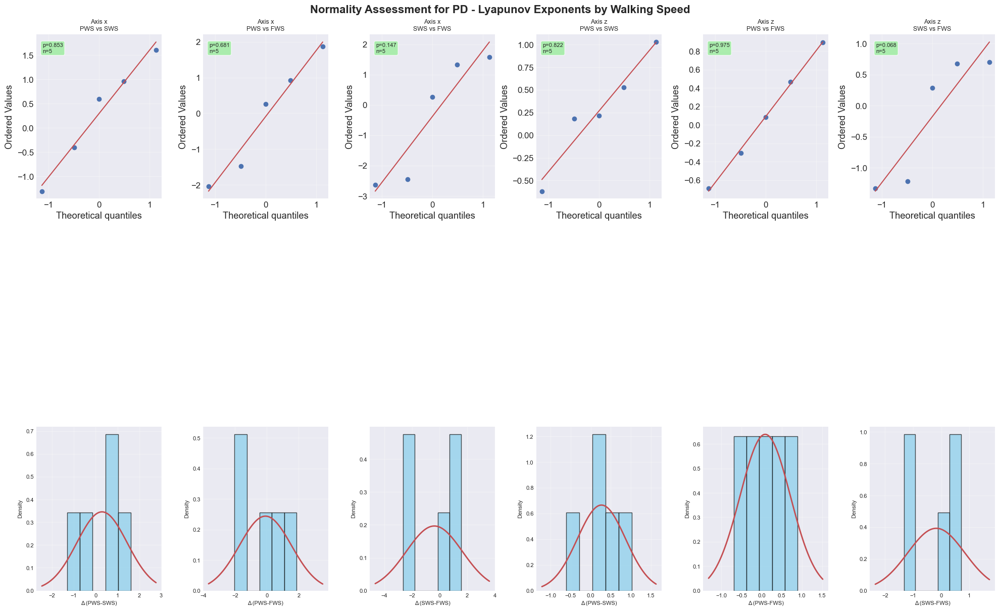


CONDITION: Stroke
Total patients in Stroke: 9
Patients with all 3 speeds: 4

AXIS X:
  Friedman test (n=4): χ² = 4.5000, p = 0.1054
  PWS vs SWS:
    n = 5 pairs
    Mean PWS: 1.7898
    Mean SWS: 1.4690
    Mean difference: 0.3208 ± 0.3571
    Shapiro-Wilk p = 0.8421 → Normal → Paired t-test
  PWS vs FWS:
    n = 7 pairs
    Mean PWS: 2.0501
    Mean FWS: 2.7124
    Mean difference: -0.6623 ± 1.0881
    Shapiro-Wilk p = 0.2369 → Normal → Paired t-test
  SWS vs FWS:
    n = 5 pairs
    Mean SWS: 1.5738
    Mean FWS: 2.6456
    Mean difference: -1.0717 ± 1.4762
    Shapiro-Wilk p = 0.0501 → Normal → Paired t-test

AXIS Z:
  Friedman test (n=4): χ² = 3.5000, p = 0.1738
  PWS vs SWS:
    n = 5 pairs
    Mean PWS: 1.7570
    Mean SWS: 1.3453
    Mean difference: 0.4117 ± 0.2304
    Shapiro-Wilk p = 0.7081 → Normal → Paired t-test
  PWS vs FWS:
    n = 7 pairs
    Mean PWS: 1.4313
    Mean FWS: 1.0994
    Mean difference: 0.3319 ± 0.6134
    Shapiro-Wilk p = 0.9444 → Normal → Paired t-test

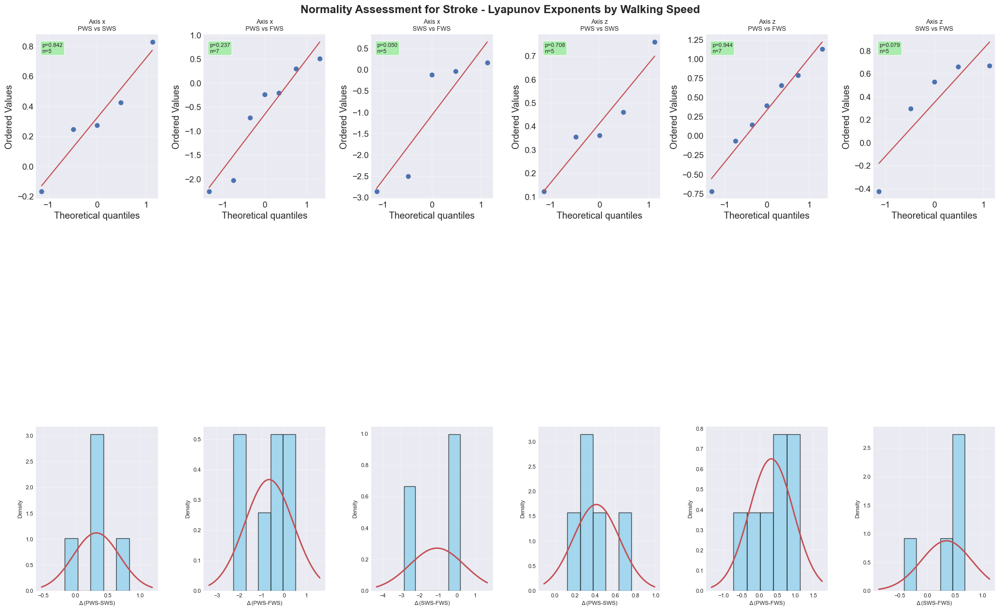


CONDITION: MS
Total patients in MS: 2
Patients with all 3 speeds: 2

AXIS X:
  PWS vs SWS: Insufficient data (n=2)
  PWS vs FWS: Insufficient data (n=2)
  SWS vs FWS: Insufficient data (n=2)

AXIS Z:
  PWS vs SWS: Insufficient data (n=2)
  PWS vs FWS: Insufficient data (n=2)
  SWS vs FWS: Insufficient data (n=2)


<Figure size 2000x1600 with 0 Axes>


CONDITION: Intradural extramedullary
Total patients in Intradural extramedullary: 1
Patients with all 3 speeds: 1

AXIS X:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

AXIS Z:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)


<Figure size 2000x1600 with 0 Axes>


CONDITION: Brain tumor
Total patients in Brain tumor: 1
Patients with all 3 speeds: 0

AXIS X:
  PWS vs SWS: Insufficient data (n=0)
  PWS vs FWS: Insufficient data (n=0)
  SWS vs FWS: Insufficient data (n=1)

AXIS Z:
  PWS vs SWS: Insufficient data (n=0)
  PWS vs FWS: Insufficient data (n=0)
  SWS vs FWS: Insufficient data (n=1)


<Figure size 2000x1600 with 0 Axes>


CONDITION: Parese
Total patients in Parese: 1
Patients with all 3 speeds: 1

AXIS X:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

AXIS Z:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)


<Figure size 2000x1600 with 0 Axes>


CONDITION: Brain ansec
Total patients in Brain ansec: 1
Patients with all 3 speeds: 1

AXIS X:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

AXIS Z:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)


<Figure size 2000x1600 with 0 Axes>


COMPREHENSIVE SUMMARY ACROSS ALL CONDITIONS
Condition       Axis       Comparison      n     p-value    Test                     
----------------------------------------------------------------------
PD              x          PWS_vs_SWS      5     0.8527     Paired t-test            
PD              x          PWS_vs_FWS      5     0.6807     Paired t-test            
PD              x          SWS_vs_FWS      5     0.1474     Paired t-test            
PD              z          PWS_vs_SWS      5     0.8223     Paired t-test            
PD              z          PWS_vs_FWS      5     0.9751     Paired t-test            
PD              z          SWS_vs_FWS      5     0.0684     Paired t-test            
Stroke          x          PWS_vs_SWS      5     0.8421     Paired t-test            
Stroke          x          PWS_vs_FWS      7     0.2369     Paired t-test            
Stroke          x          SWS_vs_FWS      5     0.0501     Paired t-test            
Stroke          z       

In [177]:
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')


# Extract patient ID from subject names
df_cga_sle['patient_id'] = df_cga_sle['subject'].str[1:]

# Get unique conditions
conditions = df_cga_sle['condition'].unique()

print("="*70)
print("NORMALITY TESTING FOR LYAPUNOV EXPONENTS - WALKING SPEED COMPARISONS BY DIAGNOSIS")
print("="*70)
print(f"Conditions found: {', '.join(conditions)}")
print("\nTesting differences between speed pairs for normality within each condition")
print("If p > 0.05: Use paired t-test (normal)")
print("If p < 0.05: Use Wilcoxon signed-rank test (non-normal)")
print("-"*70)

# Define comparisons and axes
speed_comparisons = [('PWS', 'SWS'), ('PWS', 'FWS'), ('SWS', 'FWS')]
axes = sorted(df_cga_sle['axis'].unique())

# Store all recommendations
all_recommendations = {}

for condition in conditions:
    print(f"\n{'='*70}")
    print(f"CONDITION: {condition}")
    print(f"{'='*70}")
    
    condition_data = df_cga_sle[df_cga_sle['condition'] == condition]
  
    condition_patients = condition_data['patient_id'].unique()
    print(f"Total patients in {condition}: {len(condition_patients)}")
 
    patients_with_all_speeds = []
    for patient in condition_patients:
        patient_data = condition_data[condition_data['patient_id'] == patient]
        patient_speeds = patient_data['walking_speed'].unique()
        if set(['PWS', 'SWS', 'FWS']).issubset(set(patient_speeds)):
            patients_with_all_speeds.append(patient)
    
    print(f"Patients with all 3 speeds: {len(patients_with_all_speeds)}")
    
    
    fig = plt.figure(figsize=(20, 16))
    fig.suptitle(f'Normality Assessment for {condition} - Lyapunov Exponents by Walking Speed', 
                  fontsize=16, fontweight='bold')
    
    plot_idx = 0
    condition_recommendations = {}
    
    for axis_idx, axis in enumerate(axes):
        print(f"\nAXIS {axis.upper()}:")
        axis_recommendations = {}
        
        # Filter for this axis
        axis_data = condition_data[condition_data['axis'] == axis]
        
        # Friedman test if we have enough data
        axis_patients_with_all = []
        for patient in axis_data['patient_id'].unique():
            patient_speeds = axis_data[axis_data['patient_id'] == patient]['walking_speed'].unique()
            if set(['PWS', 'SWS', 'FWS']).issubset(set(patient_speeds)):
                axis_patients_with_all.append(patient)
        
        if len(axis_patients_with_all) >= 3:
            pws_vals = []
            sws_vals = []
            fws_vals = []
            
            for patient in axis_patients_with_all:
                pws = axis_data[(axis_data['patient_id'] == patient) & 
                               (axis_data['walking_speed'] == 'PWS')]['lyapunov_exponent'].values[0]
                sws = axis_data[(axis_data['patient_id'] == patient) & 
                               (axis_data['walking_speed'] == 'SWS')]['lyapunov_exponent'].values[0]
                fws = axis_data[(axis_data['patient_id'] == patient) & 
                               (axis_data['walking_speed'] == 'FWS')]['lyapunov_exponent'].values[0]
                
                pws_vals.append(pws)
                sws_vals.append(sws)
                fws_vals.append(fws)
            
            # Perform Friedman test
            stat, p_val = stats.friedmanchisquare(pws_vals, sws_vals, fws_vals)
            print(f"  Friedman test (n={len(axis_patients_with_all)}): χ² = {stat:.4f}, p = {p_val:.4f}")
        
        for comp_idx, (speed1, speed2) in enumerate(speed_comparisons):
            # Find patients that have both speeds in this condition and axis
            patients_with_pair = []
            
            for patient in axis_data['patient_id'].unique():
                patient_data = axis_data[axis_data['patient_id'] == patient]
                speeds_present = patient_data['walking_speed'].unique()
                if speed1 in speeds_present and speed2 in speeds_present:
                    patients_with_pair.append(patient)
            
            # Get paired data
            vals1 = []
            vals2 = []
            
            for patient in patients_with_pair:
                patient_data = axis_data[axis_data['patient_id'] == patient]
                val1 = patient_data[patient_data['walking_speed'] == speed1]['lyapunov_exponent'].values
                val2 = patient_data[patient_data['walking_speed'] == speed2]['lyapunov_exponent'].values
                
                if len(val1) > 0 and len(val2) > 0:
                    vals1.append(val1[0])
                    vals2.append(val2[0])
            
            vals1 = np.array(vals1)
            vals2 = np.array(vals2)
            
            if len(vals1) >= 3:  # Need at least 3 pairs
                # Calculate differences
                differences = vals1 - vals2
                n_pairs = len(differences)
                
                # Shapiro-Wilk test
                statistic, p_value = stats.shapiro(differences)
                
                if p_value > 0.05:
                    test_recommendation = "Paired t-test"
                    normality_status = "Normal"
                else:
                    test_recommendation = "Wilcoxon signed-rank"
                    normality_status = "Non-normal"
                
                axis_recommendations[f"{speed1}_vs_{speed2}"] = {
                    'test': test_recommendation,
                    'p_value': p_value,
                    'n': n_pairs,
                    'mean_diff': np.mean(differences),
                    'std_diff': np.std(differences, ddof=1)
                }
                
                # Print results
                print(f"  {speed1} vs {speed2}:")
                print(f"    n = {n_pairs} pairs")
                print(f"    Mean {speed1}: {np.mean(vals1):.4f}")
                print(f"    Mean {speed2}: {np.mean(vals2):.4f}")
                print(f"    Mean difference: {np.mean(differences):.4f} ± {np.std(differences, ddof=1):.4f}")
                print(f"    Shapiro-Wilk p = {p_value:.4f} → {normality_status} → {test_recommendation}")
                
                # Q-Q plot (top half)
                ax_qq = plt.subplot(4, 6, plot_idx + 1)
                stats.probplot(differences, dist="norm", plot=ax_qq)
                ax_qq.set_title(f'Axis {axis}\n{speed1} vs {speed2}', fontsize=9)
                ax_qq.grid(True, alpha=0.3)
                
                # Add p-value to plot
                ax_qq.text(0.05, 0.95, f'p={p_value:.3f}\nn={n_pairs}', 
                          transform=ax_qq.transAxes, 
                          bbox=dict(boxstyle='round', 
                                   facecolor='yellow' if p_value < 0.05 else 'lightgreen', 
                                   alpha=0.7),
                          verticalalignment='top', fontsize=8)
                
                # Histogram (bottom half)
                ax_hist = plt.subplot(4, 6, plot_idx + 13)
                
                # Plot histogram
                n_bins = min(10, max(5, n_pairs // 3))
                ax_hist.hist(differences, bins=n_bins, density=True, alpha=0.7, 
                            color='skyblue', edgecolor='black')
                
                # Overlay normal distribution
                mu, sigma = np.mean(differences), np.std(differences, ddof=1)
                if sigma > 0:
                    x = np.linspace(differences.min() - sigma, differences.max() + sigma, 100)
                    ax_hist.plot(x, stats.norm.pdf(x, mu, sigma), 'r-', linewidth=2)
                
                ax_hist.set_xlabel(f'Δ ({speed1}-{speed2})', fontsize=8)
                ax_hist.set_ylabel('Density', fontsize=8)
                ax_hist.grid(True, alpha=0.3)
                ax_hist.tick_params(labelsize=8)
                
                plot_idx += 1
            else:
                print(f"  {speed1} vs {speed2}: Insufficient data (n={len(vals1)})")
                axis_recommendations[f"{speed1}_vs_{speed2}"] = {
                    'test': "Insufficient data",
                    'p_value': np.nan,
                    'n': len(vals1),
                    'mean_diff': np.nan,
                    'std_diff': np.nan
                }
        
        condition_recommendations[axis] = axis_recommendations
    
    all_recommendations[condition] = condition_recommendations
    
    plt.tight_layout()
    plt.show()

# Comprehensive summary table
print("\n" + "="*70)
print("COMPREHENSIVE SUMMARY ACROSS ALL CONDITIONS")
print("="*70)
print(f"{'Condition':<15} {'Axis':<10} {'Comparison':<15} {'n':<5} {'p-value':<10} {'Test':<25}")
print("-"*70)

for condition in conditions:
    if condition in all_recommendations:
        for axis in axes:
            for comp in speed_comparisons:
                comp_key = f"{comp[0]}_vs_{comp[1]}"
                if comp_key in all_recommendations[condition].get(axis, {}):
                    data = all_recommendations[condition][axis][comp_key]
                    test = data['test']
                    p_val = data['p_value']
                    n = data['n']
                    
                    p_str = f"{p_val:.4f}" if not np.isnan(p_val) else "N/A"
                    print(f"{condition:<15} {axis:<10} {comp_key:<15} {n:<5} {p_str:<10} {test:<25}")

# Quick reference guide
print("\n" + "="*70)
print("QUICK REFERENCE: RECOMMENDED TESTS BY CONDITION AND AXIS")
print("="*70)

for condition in conditions:
    if condition in all_recommendations:
        print(f"\n{condition}:")
        for axis in axes:
            print(f"  Axis {axis}:")
            for comp in speed_comparisons:
                comp_key = f"{comp[0]}_vs_{comp[1]}"
                if comp_key in all_recommendations[condition].get(axis, {}):
                    test = all_recommendations[condition][axis][comp_key]['test']
                    n = all_recommendations[condition][axis][comp_key]['n']
                    print(f"    {comp[0]} vs {comp[1]} (n={n}): {test}")

# Statistical test summary
print("\n" + "="*70)
print("SUMMARY OF NORMALITY PATTERNS")
print("="*70)

# Count normal vs non-normal by condition
for condition in conditions:
    if condition in all_recommendations:
        normal_count = 0
        non_normal_count = 0
        insufficient_count = 0
        
        for axis in axes:
            for comp in speed_comparisons:
                comp_key = f"{comp[0]}_vs_{comp[1]}"
                if comp_key in all_recommendations[condition].get(axis, {}):
                    test = all_recommendations[condition][axis][comp_key]['test']
                    if test == "Paired t-test":
                        normal_count += 1
                    elif test == "Wilcoxon signed-rank":
                        non_normal_count += 1
                    else:
                        insufficient_count += 1
        
        total = normal_count + non_normal_count + insufficient_count
        print(f"\n{condition}:")
        print(f"  Normal distributions: {normal_count}/{total} ({normal_count/total*100:.1f}%)")
        print(f"  Non-normal distributions: {non_normal_count}/{total} ({non_normal_count/total*100:.1f}%)")
        print(f"  Insufficient data: {insufficient_count}/{total}")

print("Bonferroni α = 0.05/3 = 0.0167")

### Statistical Testing on results

#### by patient

Running Lyapunov speed sensitivity analysis with ANOVA by axis and LOO sensitivity...

ENHANCED SPEED SENSITIVITY ANALYSIS WITH ANOVA - NEUROLOGICAL COHORT
Speed conditions: ['PWS', 'SWS', 'FWS']
Axes: ['x', 'z']

REPEATED MEASURES ANOVA ANALYSIS BY AXIS

AXIS X
H₀: μ_PWS = μ_SWS = μ_FWS (no difference in Lyapunov exponent across speeds)
H₁: At least one speed differs in Lyapunov exponent
Note: Higher values indicate more chaotic/unstable gait dynamics
Patients with all 3 speeds: 14 / 20

Descriptive Statistics:
  PWS: Mean = 2.2560 ± 0.8435
  SWS: Mean = 1.6723 ± 0.7757
  FWS: Mean = 2.4774 ± 1.0665

Repeated Measures ANOVA:
               Anova
      F Value Num DF  Den DF Pr > F
-----------------------------------
speed  5.7552 2.0000 26.0000 0.0085



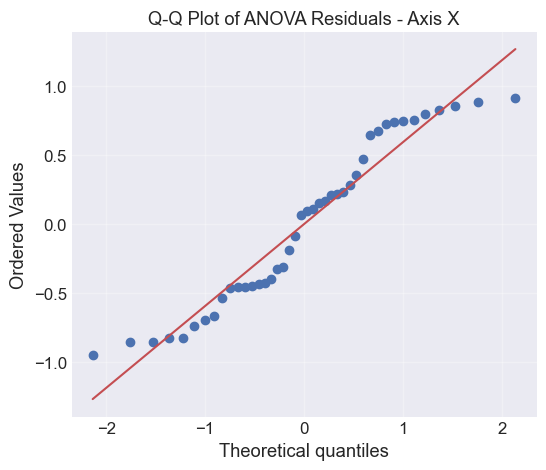


Inferential Statistics Summary:
  Friedman χ² = 5.286, p = 0.0712
  RM-ANOVA F = 5.755, p = 0.0085
  Residuals Shapiro-Wilk: W = 0.926, p = 0.0092
  Normality assumption: Violated
→ Result: No significant speed effect
→ RM-ANOVA: SIGNIFICANT omnibus (reject H₀)

AXIS Z
H₀: μ_PWS = μ_SWS = μ_FWS (no difference in Lyapunov exponent across speeds)
H₁: At least one speed differs in Lyapunov exponent
Note: Higher values indicate more chaotic/unstable gait dynamics
Patients with all 3 speeds: 14 / 20

Descriptive Statistics:
  PWS: Mean = 1.4253 ± 0.4359
  SWS: Mean = 1.0979 ± 0.3684
  FWS: Mean = 1.1667 ± 0.4066

Repeated Measures ANOVA:
               Anova
      F Value Num DF  Den DF Pr > F
-----------------------------------
speed  0.0370 2.0000 26.0000 0.9637



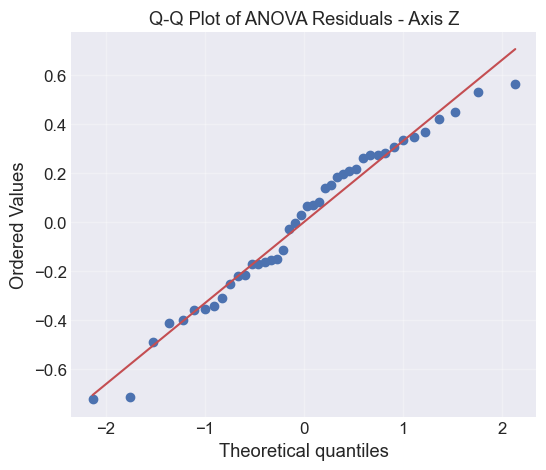


Inferential Statistics Summary:
  Friedman χ² = 4.000, p = 0.1353
  RM-ANOVA F = 0.037, p = 0.9637
  Residuals Shapiro-Wilk: W = 0.970, p = 0.3248
  Normality assumption: Met
→ Result: No significant speed effect
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

POST-HOC PAIRWISE COMPARISONS BY AXIS
Note: Using all available patients for each pairwise comparison
Bonferroni correction: α = 0.05/3 = 0.0167 for 3 comparisons

AXIS X - Pairwise Comparisons:

  PWS vs SWS (n=15 pairs):
    PWS Mean: 2.2571, SWS Mean: 1.6940
    Mean difference: 0.5631 ± 0.8417
    Test used: Paired t-test (Shapiro-Wilk p=0.9418)
    Test statistic: 2.5908
    p-value: 0.0214
    Cohen's d: 0.6689
    Result: NOT SIGNIFICANT after Bonferroni correction
    Sensitivity analyses:
      [Axis x PWS vs SWS] Bootstrap 95% CI on mean difference: [0.1413, 0.9662]
      [Axis x PWS vs SWS] LOO t-test p-value range: [0.0023, 0.0442]
      [Axis x PWS vs SWS] LOO Wilcoxon p-value range: [0.0017, 0.0353]
      

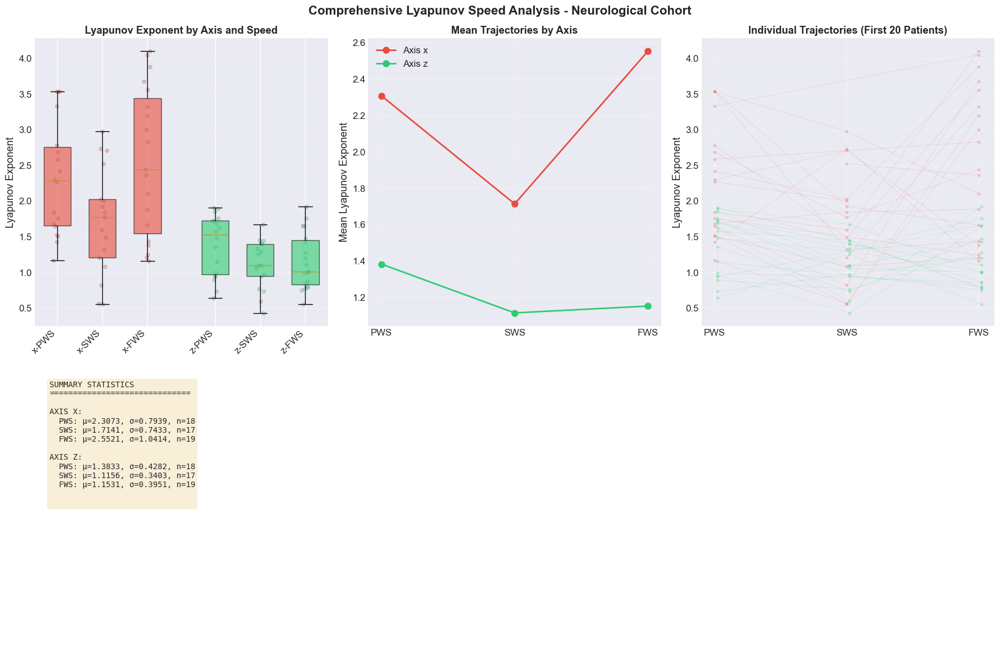


COMPREHENSIVE SUMMARY - NEUROLOGICAL COHORT

REPEATED MEASURES ANOVA SUMMARY:
--------------------------------------------------
Axis     n     Friedman p   RM-ANOVA p   Significant
--------------------------------------------------
x        14    0.0712       0.0085       ns/*
z        14    0.1353       0.9637       ns/ns

PAIRWISE COMPARISONS SUMMARY (Bonferroni corrected α=0.0167):
----------------------------------------------------------------------------------------------------
Axis     Comparison      n     Test                 p-value    Effect     Sig   LOO Stable
----------------------------------------------------------------------------------------------------
x        PWS vs SWS      15    Paired t-test        0.0214     d=0.669    ns    100%
x        PWS vs FWS      17    Paired t-test        0.5350     d=-0.154   ns    0%
x        SWS vs FWS      16    Paired t-test        0.0446     d=-0.548   ns    50%
z        PWS vs SWS      15    Paired t-test        0.0053     d=

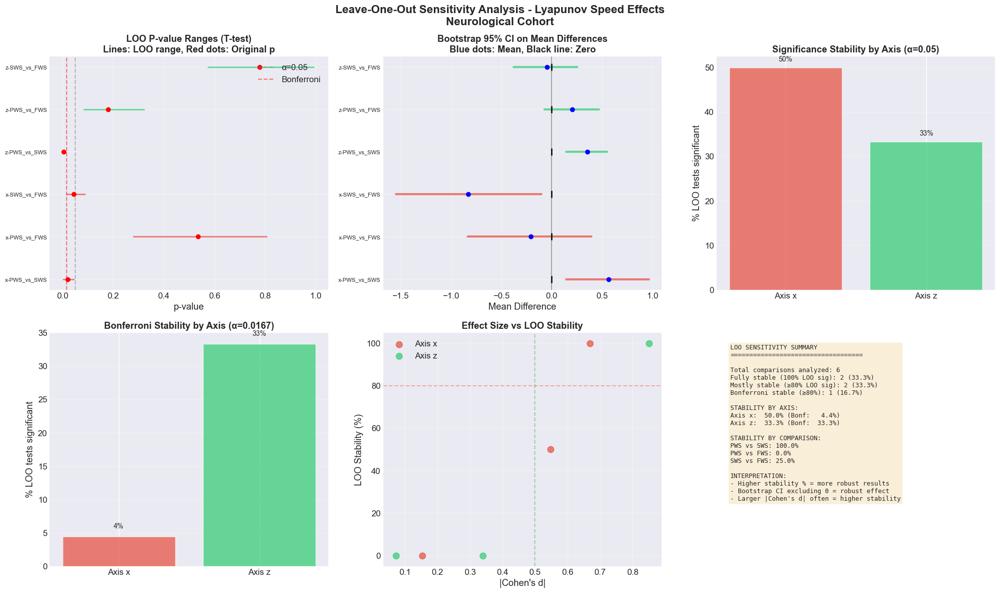


DETAILED LOO RESULTS TABLE
----------------------------------------------------------------------------------------------------
Axis  Comparison   n    Original p  LOO p-range          Stability       Bootstrap CI             
----------------------------------------------------------------------------------------------------
x     PWS_vs_SWS   15   0.0214      [0.002, 0.044]       15/15 (100%)    [0.141, 0.966]           
x     PWS_vs_FWS   17   0.5350      [0.280, 0.806]       0/17 (0%)       [-0.832, 0.395]          
x     SWS_vs_FWS   16   0.0446      [0.017, 0.088]       8/16 (50%)      [-1.546, -0.101]         
z     PWS_vs_SWS   15   0.0053      [0.000, 0.012]       15/15 (100%)    [0.143, 0.548]           
z     PWS_vs_FWS   17   0.1803      [0.085, 0.322]       0/17 (0%)       [-0.073, 0.471]          
z     SWS_vs_FWS   16   0.7776      [0.575, 0.991]       0/16 (0%)       [-0.380, 0.254]          


In [183]:
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import ttest_rel, wilcoxon, shapiro, friedmanchisquare
import matplotlib.pyplot as plt
from statsmodels.stats.anova import AnovaRM
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

def analyze_with_anova(results_lyapunov, cohort_name="Neurological Patients"):
    """
    Enhanced speed sensitivity analysis including Repeated Measures ANOVA by axis
    with integrated LOO sensitivity analysis.
    """
 
    if 'patient_id' not in results_lyapunov.columns:
        results_lyapunov['patient_id'] = results_lyapunov['subject'].str[1:]
    
    # Get unique axes and speed conditions
    axes = sorted(results_lyapunov['axis'].unique())
    speed_conditions = results_lyapunov['walking_speed'].unique()
    
    # Define hypotheses for Lyapunov analysis
    hypothesis = {
        'H0': 'μ_PWS = μ_SWS = μ_FWS (no difference in Lyapunov exponent across speeds)',
        'H1': 'At least one speed differs in Lyapunov exponent',
        'interpretation': 'Higher values indicate more chaotic/unstable gait dynamics'
    }
    
    print(f"\n{'='*80}")
    print(f"ENHANCED SPEED SENSITIVITY ANALYSIS WITH ANOVA - {cohort_name.upper()}")
    print(f"{'='*80}")
    print(f"Speed conditions: {list(speed_conditions)}")
    print(f"Axes: {axes}")
    
    # Store results for summary
    anova_results = {}
    pairwise_results = {}
    
    # REPEATED MEASURES ANOVA BY AXIS
    print(f"\n{'='*70}")
    print("REPEATED MEASURES ANOVA ANALYSIS BY AXIS")
    print(f"{'='*70}")
    
    for axis in axes:
        print(f"\n{'='*60}")
        print(f"AXIS {axis.upper()}")
        print(f"{'='*60}")
        
        axis_data = results_lyapunov[results_lyapunov['axis'] == axis]
        
        print(f"H₀: {hypothesis['H0']}")
        print(f"H₁: {hypothesis['H1']}")
        print(f"Note: {hypothesis['interpretation']}")
        
   
        all_patients = axis_data['patient_id'].unique()
        complete_patients = []
        
        for patient in all_patients:
            patient_data = axis_data[axis_data['patient_id'] == patient]
            speeds_present = patient_data['walking_speed'].unique()
            if set(['PWS', 'SWS', 'FWS']).issubset(set(speeds_present)):
                complete_patients.append(patient)
        
        print(f"Patients with all 3 speeds: {len(complete_patients)} / {len(all_patients)}")
        
        if len(complete_patients) < 3:
            print("→ Insufficient data for ANOVA (n<3)")
            anova_results[axis] = {'status': 'insufficient_data'}
            continue
        
        # Extract values for complete cases
        pws_vals = []
        sws_vals = []
        fws_vals = []
        
        for patient in complete_patients:
            patient_data = axis_data[axis_data['patient_id'] == patient]
            pws_vals.append(patient_data[patient_data['walking_speed'] == 'PWS']['lyapunov_exponent'].values[0])
            sws_vals.append(patient_data[patient_data['walking_speed'] == 'SWS']['lyapunov_exponent'].values[0])
            fws_vals.append(patient_data[patient_data['walking_speed'] == 'FWS']['lyapunov_exponent'].values[0])
        
        pws_vals = np.array(pws_vals)
        sws_vals = np.array(sws_vals)
        fws_vals = np.array(fws_vals)
        
        # Descriptive statistics
        print("\nDescriptive Statistics:")
        print(f"  PWS: Mean = {pws_vals.mean():.4f} ± {pws_vals.std(ddof=1):.4f}")
        print(f"  SWS: Mean = {sws_vals.mean():.4f} ± {sws_vals.std(ddof=1):.4f}")
        print(f"  FWS: Mean = {fws_vals.mean():.4f} ± {fws_vals.std(ddof=1):.4f}")
        
        # Friedman test (non-parametric)
        friedman_stat, friedman_p = friedmanchisquare(pws_vals, sws_vals, fws_vals)
        
        # Prepare data for RM-ANOVA
        df_long = pd.DataFrame({
            'patient_id': np.repeat(complete_patients, 3),
            'speed': ['PWS', 'SWS', 'FWS'] * len(complete_patients),
            'value': np.concatenate([pws_vals, sws_vals, fws_vals])
        })
        
        # Repeated Measures ANOVA
        try:
            aov = AnovaRM(df_long, depvar='value', subject='patient_id', within=['speed']).fit()
            anova_f = aov.anova_table['F Value'][0]
            anova_p = aov.anova_table['Pr > F'][0]
            anova_success = True
            
            print("\nRepeated Measures ANOVA:")
            print(aov.summary())
        except Exception as e:
            print(f"→ RM-ANOVA failed: {str(e)}")
            anova_success = False
            anova_f = np.nan
            anova_p = np.nan
        
        # Test ANOVA assumptions (residual normality)
        if anova_success:
            # Calculate residuals manually
            grand_mean = df_long['value'].mean()
            subj_mean = df_long.groupby('patient_id')['value'].transform('mean')
            speed_mean = df_long.groupby('speed')['value'].transform('mean')
            df_long['resid'] = df_long['value'] - (subj_mean + speed_mean - grand_mean)
            
            # Test residual normality
            residuals = df_long['resid'].values
            shapiro_stat, shapiro_p = shapiro(residuals)
            
            # Q-Q plot for residuals
            plt.figure(figsize=(6, 5))
            stats.probplot(residuals, dist="norm", plot=plt)
            plt.title(f"Q-Q Plot of ANOVA Residuals - Axis {axis.upper()}")
            plt.grid(True, alpha=0.3)
            plt.show()
        else:
            shapiro_stat = np.nan
            shapiro_p = np.nan
        
        print(f"\nInferential Statistics Summary:")
        print(f"  Friedman χ² = {friedman_stat:.3f}, p = {friedman_p:.4f}")
        if anova_success:
            print(f"  RM-ANOVA F = {anova_f:.3f}, p = {anova_p:.4f}")
            print(f"  Residuals Shapiro-Wilk: W = {shapiro_stat:.3f}, p = {shapiro_p:.4f}")
            normality_assumption = "Met" if shapiro_p > 0.05 else "Violated"
            print(f"  Normality assumption: {normality_assumption}")
        
        # Store results
        anova_results[axis] = {
            'status': 'complete',
            'n_complete': len(complete_patients),
            'friedman_stat': friedman_stat,
            'friedman_p': friedman_p,
            'anova_f': anova_f,
            'anova_p': anova_p,
            'anova_success': anova_success,
            'shapiro_p': shapiro_p,
            'means': {
                'PWS': pws_vals.mean(),
                'SWS': sws_vals.mean(),
                'FWS': fws_vals.mean()
            },
            'sds': {
                'PWS': pws_vals.std(ddof=1),
                'SWS': sws_vals.std(ddof=1),
                'FWS': fws_vals.std(ddof=1)
            }
        }
        
        # Interpretation
        if friedman_p < 0.05:
            print("→ Result: SIGNIFICANT speed effect (p < 0.05)")
        else:
            print("→ Result: No significant speed effect")
            
        if anova_success and anova_p < 0.05:
            print("→ RM-ANOVA: SIGNIFICANT omnibus (reject H₀)")
        elif anova_success:
            print("→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)")
    
    # POST-HOC PAIRWISE COMPARISONS BY AXIS
    print(f"\n{'='*70}")
    print("POST-HOC PAIRWISE COMPARISONS BY AXIS")
    print(f"{'='*70}")
    print("Note: Using all available patients for each pairwise comparison")
    print("Bonferroni correction: α = 0.05/3 = 0.0167 for 3 comparisons")
    
    comparisons = [('PWS', 'SWS'), ('PWS', 'FWS'), ('SWS', 'FWS')]
    
    for axis in axes:
        print(f"\n{'='*50}")
        print(f"AXIS {axis.upper()} - Pairwise Comparisons:")
        print(f"{'='*50}")
        
        # Filter data for this axis
        axis_data = results_lyapunov[results_lyapunov['axis'] == axis]
        axis_patients = axis_data['patient_id'].unique()
        
        axis_comparisons = {}
        
        for speed1, speed2 in comparisons:
            # Find patients that have both speeds for this axis
            patients_with_pair = []
            
            for patient in axis_patients:
                patient_data = axis_data[axis_data['patient_id'] == patient]
                speeds_present = patient_data['walking_speed'].unique()
                if speed1 in speeds_present and speed2 in speeds_present:
                    patients_with_pair.append(patient)
            
            # Get paired data
            vals1 = []
            vals2 = []
            
            for patient in patients_with_pair:
                patient_data = axis_data[axis_data['patient_id'] == patient]
                val1 = patient_data[patient_data['walking_speed'] == speed1]['lyapunov_exponent'].values
                val2 = patient_data[patient_data['walking_speed'] == speed2]['lyapunov_exponent'].values
                
                if len(val1) > 0 and len(val2) > 0:
                    vals1.append(val1[0])
                    vals2.append(val2[0])
            
            vals1 = np.array(vals1)
            vals2 = np.array(vals2)
            
            if len(vals1) >= 3:  
                # Check normality and decide test
                diff = vals1 - vals2
                _, shapiro_p = shapiro(diff)
                
                if shapiro_p > 0.05:
                    # Use paired t-test
                    t_stat, p_value = ttest_rel(vals1, vals2)
                    test_used = "Paired t-test"
                    test_stat = t_stat
                else:
                    # Use Wilcoxon signed-rank test
                    w_stat, p_value = wilcoxon(vals1, vals2)
                    test_used = "Wilcoxon signed-rank"
                    test_stat = w_stat
                
                # Effect size
                cohen_d = np.mean(diff) / np.std(diff, ddof=1) if np.std(diff, ddof=1) > 0 else 0
                
                print(f"\n  {speed1} vs {speed2} (n={len(vals1)} pairs):")
                print(f"    {speed1} Mean: {np.mean(vals1):.4f}, {speed2} Mean: {np.mean(vals2):.4f}")
                print(f"    Mean difference: {np.mean(diff):.4f} ± {np.std(diff, ddof=1):.4f}")
                print(f"    Test used: {test_used} (Shapiro-Wilk p={shapiro_p:.4f})")
                print(f"    Test statistic: {test_stat:.4f}")
                print(f"    p-value: {p_value:.4f}")
                print(f"    Cohen's d: {cohen_d:.4f}")
                
                # Bonferroni corrected significance
                if p_value < 0.0167:
                    print(f"    Result: SIGNIFICANT (Bonferroni corrected α=0.0167)")
                    significant = True
                else:
                    print(f"    Result: NOT SIGNIFICANT after Bonferroni correction")
                    significant = False
                
                # Perform Leave-One-Out sensitivity analysis
                print(f"    Sensitivity analyses:")
                loo_metrics = _perform_loo_sensitivity_analysis(vals1, vals2, f"Axis {axis} {speed1} vs {speed2}")
                
                # Store results including LOO metrics
                axis_comparisons[f"{speed1}_vs_{speed2}"] = {
                    'n_pairs': len(vals1),
                    'mean_diff': np.mean(diff),
                    'test_statistic': test_stat,
                    'p_value': p_value,
                    'cohen_d': cohen_d,
                    'test_type': test_used,
                    'significant': significant,
                    'bonferroni_significant': significant,
                    'normality_p': shapiro_p,
                    'loo_metrics': loo_metrics  # Store LOO results
                }
            else:
                print(f"\n  {speed1} vs {speed2}: Insufficient paired data (n={len(vals1)})")
                axis_comparisons[f"{speed1}_vs_{speed2}"] = {
                    'n_pairs': len(vals1),
                    'status': 'insufficient_data'
                }
        
        pairwise_results[axis] = axis_comparisons
    
    # VISUALIZATION
    create_lyapunov_speed_plots(results_lyapunov, cohort_name)
    
    # SUMMARY
    print_lyapunov_speed_summary(anova_results, pairwise_results, cohort_name)
    
    # Return structured results compatible with LOO summary function
    return {
        'anova_results': anova_results,
        'pairwise_results': pairwise_results,
        'cohort_name': cohort_name
    }


def _perform_loo_sensitivity_analysis(before_vals, after_vals, label=""):
    """
    Perform Leave-One-Out sensitivity analysis for Lyapunov comparisons
    1) Bootstrap 95% CI on the mean difference
    2) Leave-one-out t-test & Wilcoxon signed-rank p-value ranges
    """
    diffs = before_vals - after_vals
    n = len(diffs)
    
    if n < 2:
        print(f"      [{label}] Not enough data for sensitivity analysis.")
        return {}
    
    # Bootstrap 95% confidence interval for mean difference
    np.random.seed(42)  # For reproducibility
    n_bootstrap = 10000
    bootstrap_means = []
    
    for _ in range(n_bootstrap):
        bootstrap_sample = np.random.choice(diffs, size=n, replace=True)
        bootstrap_means.append(np.mean(bootstrap_sample))
    
    ci_lo, ci_hi = np.percentile(bootstrap_means, [2.5, 97.5])
    print(f"      [{label}] Bootstrap 95% CI on mean difference: [{ci_lo:.4f}, {ci_hi:.4f}]")
    
    loo_results = {
        'bootstrap_ci_low': ci_lo,
        'bootstrap_ci_high': ci_hi,
        'n_samples': n
    }
    
    # Leave-one-out sensitivity analysis
    if n >= 3:
        p_t_values = []
        p_w_values = []
        
        for i in range(n):
            loo_before = np.delete(before_vals, i)
            loo_after = np.delete(after_vals, i)
            
            if len(loo_before) > 1:
                try:
                    # Leave-one-out t-test
                    _, p_t = ttest_rel(loo_before, loo_after)
                    p_t_values.append(p_t)
                    
                    # Leave-one-out Wilcoxon test
                    _, p_w = wilcoxon(loo_before, loo_after)
                    p_w_values.append(p_w)
                except:
                    continue
        
        if p_t_values and p_w_values:
            print(f"      [{label}] LOO t-test p-value range: [{np.min(p_t_values):.4f}, {np.max(p_t_values):.4f}]")
            print(f"      [{label}] LOO Wilcoxon p-value range: [{np.min(p_w_values):.4f}, {np.max(p_w_values):.4f}]")
            
            # Check stability of significance
            significant_t = sum(1 for p in p_t_values if p < 0.05)
            significant_w = sum(1 for p in p_w_values if p < 0.05)
            print(f"      [{label}] LOO significance stability: t-test {significant_t}/{len(p_t_values)}, "
                  f"Wilcoxon {significant_w}/{len(p_w_values)}")
            
            # Check Bonferroni stability
            bonferroni_t = sum(1 for p in p_t_values if p < 0.0167)
            bonferroni_w = sum(1 for p in p_w_values if p < 0.0167)
            print(f"      [{label}] LOO Bonferroni stability: t-test {bonferroni_t}/{len(p_t_values)}, "
                  f"Wilcoxon {bonferroni_w}/{len(p_w_values)}")
            
            loo_results.update({
                'loo_t_p_min': np.min(p_t_values),
                'loo_t_p_max': np.max(p_t_values),
                'loo_w_p_min': np.min(p_w_values),
                'loo_w_p_max': np.max(p_w_values),
                'loo_t_sig_stable': significant_t,
                'loo_t_total': len(p_t_values),
                'loo_w_sig_stable': significant_w,
                'loo_w_total': len(p_w_values),
                'loo_t_bonf_stable': bonferroni_t,
                'loo_w_bonf_stable': bonferroni_w
            })
    
    return loo_results


def create_loo_summary_from_speed_results(results_dict, cohort_name):
    """
    Summarizes Leave-One-Out sensitivity summary from speed analysis results.
    """
    
    print(f"\n{'='*80}")
    print(f"LEAVE-ONE-OUT SENSITIVITY SUMMARY - {cohort_name}")
    print(f"{'='*80}")
    
    # Extract pairwise results
    pairwise_results = results_dict.get('pairwise_results', {})
    
    # Collect all LOO results
    loo_data = []
    
    for axis, axis_comparisons in pairwise_results.items():
        for comp_name, comp_result in axis_comparisons.items():
            if 'loo_metrics' in comp_result and comp_result['loo_metrics']:
                loo_metrics = comp_result['loo_metrics']
                if 'loo_t_p_min' in loo_metrics:
                    loo_data.append({
                        'axis': axis,
                        'comparison': comp_name,
                        'original_p': comp_result['p_value'],
                        'test_type': comp_result['test_type'],
                        'n_pairs': comp_result['n_pairs'],
                        'cohen_d': comp_result.get('cohen_d', np.nan),
                        'mean_diff': comp_result.get('mean_diff', np.nan),
                        **loo_metrics
                    })
    
    if not loo_data:
        print("No LOO results found.")
        return {}
    
    loo_df = pd.DataFrame(loo_data)
    
   
    fig = plt.figure(figsize=(20, 12))
    
    # P-value stability ranges (T-test)
    ax1 = plt.subplot(2, 3, 1)
    
    # Plot t-test p-value ranges
    y_pos = 0
    y_labels = []
    colors_by_axis = {'x': '#e74c3c', 'y': '#f39c12', 'z': '#2ecc71'}
    
    for _, row in loo_df.iterrows():
        if 'loo_t_p_min' in row and not pd.isna(row['loo_t_p_min']):
            color = colors_by_axis.get(row['axis'], 'blue')
            ax1.plot([row['loo_t_p_min'], row['loo_t_p_max']], [y_pos, y_pos], 
                    color=color, linewidth=2, alpha=0.7)
            ax1.plot(row['original_p'], y_pos, 'o', color='red', markersize=6, zorder=5)
            y_labels.append(f"{row['axis']}-{row['comparison']}")
            y_pos += 1
    
    ax1.axvline(x=0.05, color='gray', linestyle='--', alpha=0.5, label='α=0.05')
    ax1.axvline(x=0.0167, color='red', linestyle='--', alpha=0.5, label='Bonferroni')
    ax1.set_xlabel('p-value')
    ax1.set_xlim(-0.05, 1.05)
    ax1.set_yticks(range(len(y_labels)))
    ax1.set_yticklabels(y_labels, fontsize=8)
    ax1.set_title('LOO P-value Ranges (T-test)\nLines: LOO range, Red dots: Original p', fontweight='bold')
    ax1.legend(loc='upper right')
    ax1.grid(True, alpha=0.3)
    
    #  Bootstrap CI ranges
    ax2 = plt.subplot(2, 3, 2)
    
    y_pos = 0
    y_labels_ci = []
    for _, row in loo_df.iterrows():
        if 'bootstrap_ci_low' in row and not pd.isna(row['bootstrap_ci_low']):
            color = colors_by_axis.get(row['axis'], 'green')
            ax2.plot([row['bootstrap_ci_low'], row['bootstrap_ci_high']], [y_pos, y_pos], 
                    color=color, linewidth=3, alpha=0.7)
            # Mark zero
            ax2.plot(0, y_pos, 'k|', markersize=10, markeredgewidth=2)
            # Mark mean difference
            if not pd.isna(row['mean_diff']):
                ax2.plot(row['mean_diff'], y_pos, 'o', color='blue', markersize=6)
            y_labels_ci.append(f"{row['axis']}-{row['comparison']}")
            y_pos += 1
    
    ax2.axvline(x=0, color='black', linestyle='-', alpha=0.3)
    ax2.set_xlabel('Mean Difference')
    ax2.set_yticks(range(len(y_labels_ci)))
    ax2.set_yticklabels(y_labels_ci, fontsize=8)
    ax2.set_title('Bootstrap 95% CI on Mean Differences\nBlue dots: Mean, Black line: Zero', fontweight='bold')
    ax2.grid(True, alpha=0.3)
    
    # Stability metrics by axis
    ax3 = plt.subplot(2, 3, 3)
    
    if 'loo_t_sig_stable' in loo_df.columns:
        stability_data = loo_df[['axis', 'loo_t_sig_stable', 'loo_t_total']].copy()
        stability_data['stability_pct'] = (stability_data['loo_t_sig_stable'] / stability_data['loo_t_total']) * 100
        
        # Group by axis
        grouped = stability_data.groupby('axis')['stability_pct'].mean()
        
        # Create bar plot
        colors = [colors_by_axis.get(idx, 'skyblue') for idx in grouped.index]
        
        bars = ax3.bar(range(len(grouped)), grouped.values, color=colors, alpha=0.7)
        ax3.set_ylabel('% LOO tests significant')
        ax3.set_title('Significance Stability by Axis (α=0.05)', fontweight='bold')
        ax3.set_xticks(range(len(grouped)))
        ax3.set_xticklabels([f'Axis {x}' for x in grouped.index])
        ax3.grid(True, alpha=0.3, axis='y')
        
        # Add value labels on bars
        for bar, val in zip(bars, grouped.values):
            height = bar.get_height()
            ax3.text(bar.get_x() + bar.get_width()/2., height + 1,
                    f'{val:.0f}%', ha='center', va='bottom', fontsize=10)
    
    # Bonferroni stability by axis
    ax4 = plt.subplot(2, 3, 4)
    
    if 'loo_t_bonf_stable' in loo_df.columns:
        bonf_data = loo_df[['axis', 'loo_t_bonf_stable', 'loo_t_total']].copy()
        bonf_data['bonf_stability_pct'] = (bonf_data['loo_t_bonf_stable'] / bonf_data['loo_t_total']) * 100
        
        grouped_bonf = bonf_data.groupby('axis')['bonf_stability_pct'].mean()
        
        colors_bonf = [colors_by_axis.get(idx, 'lightcoral') for idx in grouped_bonf.index]
        
        bars_bonf = ax4.bar(range(len(grouped_bonf)), grouped_bonf.values, color=colors_bonf, alpha=0.7)
        ax4.set_ylabel('% LOO tests significant')
        ax4.set_title('Bonferroni Stability by Axis (α=0.0167)', fontweight='bold')
        ax4.set_xticks(range(len(grouped_bonf)))
        ax4.set_xticklabels([f'Axis {x}' for x in grouped_bonf.index])
        ax4.grid(True, alpha=0.3, axis='y')
        
        # Add value labels
        for bar, val in zip(bars_bonf, grouped_bonf.values):
            height = bar.get_height()
            ax4.text(bar.get_x() + bar.get_width()/2., height + 1,
                    f'{val:.0f}%', ha='center', va='bottom', fontsize=10)
    
    # Plot 5: Effect size vs stability scatter
    ax5 = plt.subplot(2, 3, 5)
    
    if 'cohen_d' in loo_df.columns and 'loo_t_sig_stable' in loo_df.columns:
        # Calculate stability percentage
        loo_df['stability_pct'] = (loo_df['loo_t_sig_stable'] / loo_df['loo_t_total']) * 100
        
        # Plot scatter for each axis
        for axis in ['x', 'y', 'z']:
            axis_data = loo_df[loo_df['axis'] == axis]
            if len(axis_data) > 0:
                ax5.scatter(np.abs(axis_data['cohen_d']), axis_data['stability_pct'],
                           label=f'Axis {axis}', alpha=0.7, s=80,
                           color=colors_by_axis.get(axis, 'gray'))
        
        ax5.set_xlabel('|Cohen\'s d|')
        ax5.set_ylabel('LOO Stability (%)')
        ax5.set_title('Effect Size vs LOO Stability', fontweight='bold')
        ax5.legend()
        ax5.grid(True, alpha=0.3)
        
        # Add reference lines
        ax5.axhline(y=80, color='red', linestyle='--', alpha=0.3, label='80% stable')
        ax5.axvline(x=0.5, color='green', linestyle='--', alpha=0.3, label='Medium effect')
    
    # Plot 6: Summary statistics and interpretation
    ax6 = plt.subplot(2, 3, 6)
    ax6.axis('off')
    
    summary_text = "LOO SENSITIVITY SUMMARY\n" + "="*35 + "\n\n"
    
    # Overall statistics
    if 'loo_t_sig_stable' in loo_df.columns:
        total_comparisons = len(loo_df)
        fully_stable = len(loo_df[loo_df['loo_t_sig_stable'] == loo_df['loo_t_total']])
        mostly_stable = len(loo_df[loo_df['loo_t_sig_stable'] >= 0.8 * loo_df['loo_t_total']])
        bonf_stable = len(loo_df[loo_df['loo_t_bonf_stable'] >= 0.8 * loo_df['loo_t_total']])
        
        summary_text += f"Total comparisons analyzed: {total_comparisons}\n"
        summary_text += f"Fully stable (100% LOO sig): {fully_stable} ({fully_stable/total_comparisons*100:.1f}%)\n"
        summary_text += f"Mostly stable (≥80% LOO sig): {mostly_stable} ({mostly_stable/total_comparisons*100:.1f}%)\n"
        summary_text += f"Bonferroni stable (≥80%): {bonf_stable} ({bonf_stable/total_comparisons*100:.1f}%)\n\n"
        
        # By axis summary
        summary_text += "STABILITY BY AXIS:\n"
        for axis in ['x', 'y', 'z']:
            axis_data = loo_df[loo_df['axis'] == axis]
            if len(axis_data) > 0:
                avg_stability = (axis_data['loo_t_sig_stable'] / axis_data['loo_t_total']).mean() * 100
                avg_bonf = (axis_data['loo_t_bonf_stable'] / axis_data['loo_t_total']).mean() * 100
                summary_text += f"Axis {axis}: {avg_stability:5.1f}% (Bonf: {avg_bonf:5.1f}%)\n"
        
        # By comparison summary
        summary_text += "\nSTABILITY BY COMPARISON:\n"
        for comp in ['PWS_vs_SWS', 'PWS_vs_FWS', 'SWS_vs_FWS']:
            comp_data = loo_df[loo_df['comparison'] == comp]
            if len(comp_data) > 0:
                avg_stability = (comp_data['loo_t_sig_stable'] / comp_data['loo_t_total']).mean() * 100
                summary_text += f"{comp.replace('_', ' ')}: {avg_stability:.1f}%\n"
    
    # Interpretation
    summary_text += "\nINTERPRETATION:\n"
    summary_text += "- Higher stability % = more robust results\n"
    summary_text += "- Bootstrap CI excluding 0 = robust effect\n"
    summary_text += "- Larger |Cohen's d| often = higher stability"
    
    ax6.text(0.05, 0.95, summary_text, transform=ax6.transAxes, 
             fontsize=9, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.suptitle(f'Leave-One-Out Sensitivity Analysis - Lyapunov Speed Effects\n{cohort_name}', 
                 fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    # Create detailed table
    print("\nDETAILED LOO RESULTS TABLE")
    print("-"*100)
    print(f"{'Axis':<5} {'Comparison':<12} {'n':<4} {'Original p':<11} "
          f"{'LOO p-range':<20} {'Stability':<15} {'Bootstrap CI':<25}")
    print("-"*100)
    
    for _, row in loo_df.iterrows():
        if 'loo_t_p_min' in row and not pd.isna(row['loo_t_p_min']):
            p_range = f"[{row['loo_t_p_min']:.3f}, {row['loo_t_p_max']:.3f}]"
            stability = f"{row['loo_t_sig_stable']}/{row['loo_t_total']} ({row['loo_t_sig_stable']/row['loo_t_total']*100:.0f}%)"
            ci_range = f"[{row['bootstrap_ci_low']:.3f}, {row['bootstrap_ci_high']:.3f}]"
            
            print(f"{row['axis']:<5} {row['comparison']:<12} "
                  f"{row['n_pairs']:<4} {row['original_p']:<11.4f} "
                  f"{p_range:<20} {stability:<15} {ci_range:<25}")
    
    return loo_df




def create_lyapunov_speed_plots(results_lyapunov, cohort_name):
    """Create visualization plots for Lyapunov speed sensitivity analysis"""
    
    axes = sorted(results_lyapunov['axis'].unique())
    speeds = ['PWS', 'SWS', 'FWS']
    colors = {'x': '#e74c3c', 'z': '#2ecc71', 'y': '#f39c12'}
    
    # Create comprehensive figure
    fig = plt.figure(figsize=(18, 12))
    
    # 1. Box plots by axis and speed
    ax1 = plt.subplot(2, 3, 1)
    
    positions = []
    data_to_plot = []
    labels = []
    box_colors = []
    
    pos = 0
    for axis in axes:
        for speed in speeds:
            speed_data = results_lyapunov[(results_lyapunov['axis'] == axis) & 
                                         (results_lyapunov['walking_speed'] == speed)]['lyapunov_exponent'].values
            if len(speed_data) > 0:
                data_to_plot.append(speed_data)
                labels.append(f'{axis}-{speed}')
                box_colors.append(colors.get(axis, '#3498db'))
                positions.append(pos)
            pos += 1
        pos += 0.5  # Space between axes
    
    if data_to_plot:
        bp = ax1.boxplot(data_to_plot, positions=positions, widths=0.6, patch_artist=True)
        
        for patch, color in zip(bp['boxes'], box_colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.6)
        
        for i, (data, pos, color) in enumerate(zip(data_to_plot, positions, box_colors)):
            jitter = np.random.normal(0, 0.04, size=len(data))
            ax1.scatter(np.full_like(data, pos) + jitter, data, 
                       alpha=0.3, s=20, color=color, edgecolors='black', linewidth=0.5)
        
        ax1.set_xticks(positions)
        ax1.set_xticklabels(labels, rotation=45, ha='right')
        ax1.set_ylabel('Lyapunov Exponent')
        ax1.set_title('Lyapunov Exponent by Axis and Speed', fontweight='bold')
        ax1.grid(axis='y', alpha=0.3)
    
    # 2. Mean trajectories by axis
    ax2 = plt.subplot(2, 3, 2)
    
    for axis in axes:
        means = []
        for speed in speeds:
            mean_val = results_lyapunov[(results_lyapunov['axis'] == axis) & 
                                       (results_lyapunov['walking_speed'] == speed)]['lyapunov_exponent'].mean()
            means.append(mean_val)
        
        ax2.plot([0, 1, 2], means, 'o-', color=colors.get(axis, '#3498db'), 
                linewidth=2, markersize=8, label=f'Axis {axis}')
    
    ax2.set_xticks([0, 1, 2])
    ax2.set_xticklabels(speeds)
    ax2.set_ylabel('Mean Lyapunov Exponent')
    ax2.set_title('Mean Trajectories by Axis', fontweight='bold')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # 3. Individual patient trajectories (sample)
    ax3 = plt.subplot(2, 3, 3)
    
    patients_to_plot = results_lyapunov['patient_id'].unique()[:20]
    speed_positions = {'PWS': 0, 'SWS': 1, 'FWS': 2}
    
    for axis_idx, axis in enumerate(axes):
        axis_offset = axis_idx * 0.02
        
        for patient in patients_to_plot:
            patient_data = results_lyapunov[(results_lyapunov['patient_id'] == patient) & 
                                           (results_lyapunov['axis'] == axis)]
            
            x_vals = []
            y_vals = []
            
            for speed in speeds:
                val = patient_data[patient_data['walking_speed'] == speed]['lyapunov_exponent'].values
                if len(val) > 0:
                    x_vals.append(speed_positions[speed] + axis_offset)
                    y_vals.append(val[0])
            
            if len(x_vals) >= 2:
                ax3.plot(x_vals, y_vals, 'o-', color=colors.get(axis, '#3498db'), 
                        alpha=0.2, linewidth=0.5, markersize=3)
    
    ax3.set_xticks([0, 1, 2])
    ax3.set_xticklabels(speeds)
    ax3.set_ylabel('Lyapunov Exponent')
    ax3.set_title('Individual Trajectories (First 20 Patients)', fontweight='bold')
    ax3.grid(True, alpha=0.3)
    
    # 4. Summary statistics table
    ax4 = plt.subplot(2, 3, 4)
    ax4.axis('off')
    
    summary_text = "SUMMARY STATISTICS\n" + "="*30 + "\n\n"
    
    for axis in axes:
        axis_data = results_lyapunov[results_lyapunov['axis'] == axis]
        summary_text += f"AXIS {axis.upper()}:\n"
        
        for speed in speeds:
            speed_data = axis_data[axis_data['walking_speed'] == speed]['lyapunov_exponent']
            if len(speed_data) > 0:
                summary_text += f"  {speed}: μ={speed_data.mean():.4f}, σ={speed_data.std():.4f}, n={len(speed_data)}\n"
        
        summary_text += "\n"
    
    ax4.text(0.05, 0.95, summary_text, transform=ax4.transAxes, 
             fontsize=10, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.suptitle(f'Comprehensive Lyapunov Speed Analysis - {cohort_name}', fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()


def print_lyapunov_speed_summary(anova_results, pairwise_results, cohort_name):
    """Print comprehensive summary of Lyapunov speed sensitivity analysis"""
    
    print(f"\n{'='*80}")
    print(f"COMPREHENSIVE SUMMARY - {cohort_name.upper()}")
    print(f"{'='*80}")
    
    # ANOVA Summary
    print("\nREPEATED MEASURES ANOVA SUMMARY:")
    print("-" * 50)
    print(f"{'Axis':<8} {'n':<5} {'Friedman p':<12} {'RM-ANOVA p':<12} {'Significant'}")
    print("-" * 50)
    
    for axis, results in anova_results.items():
        if results['status'] == 'complete':
            friedman_sig = "*" if results['friedman_p'] < 0.05 else "ns"
            anova_sig = "*" if results['anova_success'] and results['anova_p'] < 0.05 else "ns"
            
            print(f"{axis:<8} {results['n_complete']:<5} "
                  f"{results['friedman_p']:<12.4f} "
                  f"{results['anova_p']:<12.4f} {friedman_sig}/{anova_sig}")
        else:
            print(f"{axis:<8} {'N/A':<5} {'N/A':<12} {'N/A':<12} {'N/A'}")
    
    print(f"\nPAIRWISE COMPARISONS SUMMARY (Bonferroni corrected α=0.0167):")
    print("-" * 100)
    print(f"{'Axis':<8} {'Comparison':<15} {'n':<5} {'Test':<20} {'p-value':<10} {'Effect':<10} {'Sig':<5} {'LOO Stable'}")
    print("-" * 100)
    
    for axis in sorted(anova_results.keys()):
        if axis in pairwise_results:
            for comp_name, results in pairwise_results[axis].items():
                if 'status' not in results:  # Valid comparison
                    sig_marker = "*" if results['bonferroni_significant'] else "ns"
                    effect_size = f"d={results['cohen_d']:.3f}"
                    
                    # LOO stability info
                    loo_info = "N/A"
                    if 'loo_metrics' in results and results['loo_metrics']:
                        metrics = results['loo_metrics']
                        if 'loo_t_sig_stable' in metrics:
                            stability_pct = (metrics['loo_t_sig_stable'] / metrics['loo_t_total']) * 100
                            loo_info = f"{stability_pct:.0f}%"
                    
                    print(f"{axis:<8} {comp_name.replace('_vs_', ' vs '):<15} {results['n_pairs']:<5} "
                          f"{results['test_type']:<20} {results['p_value']:<10.4f} {effect_size:<10} {sig_marker:<5} {loo_info}")
                else:
                    print(f"{axis:<8} {comp_name.replace('_vs_', ' vs '):<15} {results['n_pairs']:<5} "
                          f"{'Insufficient data':<20} {'N/A':<10} {'N/A':<10} {'N/A':<5} {'N/A'}")
    
    significant_axes_anova = []
    significant_axes_pairwise = []
    
    for axis, results in anova_results.items():
        if results.get('friedman_p', 1) < 0.05 or (results.get('anova_success', False) and results.get('anova_p', 1) < 0.05):
            significant_axes_anova.append(axis)
    
    for axis, axis_results in pairwise_results.items():
        for comp_name, comp_results in axis_results.items():
            if comp_results.get('bonferroni_significant', False):
                if axis not in significant_axes_pairwise:
                    significant_axes_pairwise.append(axis)
    
    print(f"\n{'='*80}")
    print("SUMMARY OF SIGNIFICANT FINDINGS")
    print(f"{'='*80}")
    
    if significant_axes_anova:
        print(f"Axes with significant speed effects (ANOVA): {', '.join(significant_axes_anova)}")
    else:
        print("No axes showed significant speed effects in ANOVA")
    
    if significant_axes_pairwise:
        print(f"Axes with significant pairwise comparisons: {', '.join(significant_axes_pairwise)}")
    else:
        print("No axes showed significant pairwise comparisons")


# Main analysis function
def run_lyapunov_speed_analysis(data: pd.DataFrame, cohort_name: str = "Neurological Patients"):
    """
    Run complete Lyapunov speed sensitivity analysis with LOO
    """
    print("Running Lyapunov speed sensitivity analysis with ANOVA by axis and LOO sensitivity...")
    results = analyze_with_anova(data, cohort_name)
    
    loo_summary = create_loo_summary_from_speed_results(results, cohort_name)
    
    return results, loo_summary



results, loo_summary = run_lyapunov_speed_analysis(df_cga_sle, "Neurological Cohort")


#### by diagnosis

Running Lyapunov analysis by condition with ANOVA by axis and LOO sensitivity...
LYAPUNOV ANALYSIS BY CONDITION WITH WALKING SPEED COMPARISONS - CGA COHORT
Conditions found: PD, Stroke, MS, Intradural extramedullary, Brain tumor, Parese, Brain ansec
Axes: ['x', 'z']

PART 1: NORMALITY TESTING BY CONDITION AND AXIS
Testing differences between speed pairs for normality within each condition
If p > 0.05: Use paired t-test (normal)
If p < 0.05: Use Wilcoxon signed-rank test (non-normal)

CONDITION: PD
Total patients in PD: 5

AXIS X:
  PWS vs SWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.8527 → Normal → Paired t-test
  PWS vs FWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.6807 → Normal → Paired t-test
  SWS vs FWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.1474 → Normal → Paired t-test

AXIS Z:
  PWS vs SWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.8223 → Normal → Paired t-test
  PWS vs FWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.9751 → Normal → Paired t-test
  SWS vs FWS:
    n = 5 pairs
    Shapir

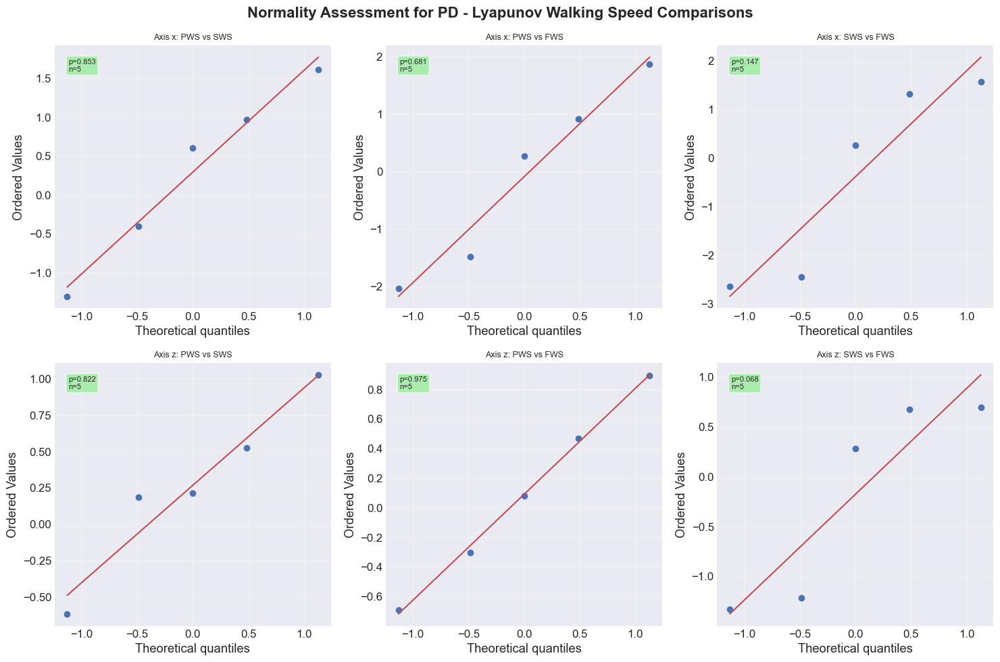


CONDITION: Stroke
Total patients in Stroke: 9

AXIS X:
  PWS vs SWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.8421 → Normal → Paired t-test
  PWS vs FWS:
    n = 7 pairs
    Shapiro-Wilk p = 0.2369 → Normal → Paired t-test
  SWS vs FWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.0501 → Normal → Paired t-test

AXIS Z:
  PWS vs SWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.7081 → Normal → Paired t-test
  PWS vs FWS:
    n = 7 pairs
    Shapiro-Wilk p = 0.9444 → Normal → Paired t-test
  SWS vs FWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.0790 → Normal → Paired t-test


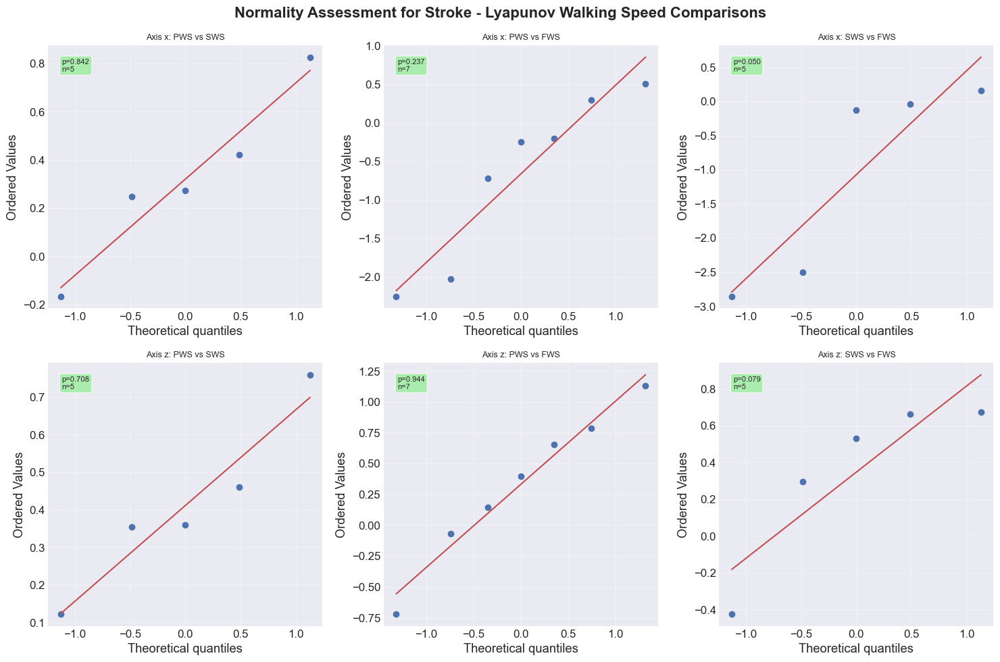


CONDITION: MS
Total patients in MS: 2

AXIS X:
  PWS vs SWS: Insufficient data (n=2)
  PWS vs FWS: Insufficient data (n=2)
  SWS vs FWS: Insufficient data (n=2)

AXIS Z:
  PWS vs SWS: Insufficient data (n=2)
  PWS vs FWS: Insufficient data (n=2)
  SWS vs FWS: Insufficient data (n=2)


<Figure size 1500x1000 with 0 Axes>


CONDITION: Intradural extramedullary
Total patients in Intradural extramedullary: 1

AXIS X:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

AXIS Z:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)


<Figure size 1500x1000 with 0 Axes>


CONDITION: Brain tumor
Total patients in Brain tumor: 1

AXIS X:
  PWS vs SWS: Insufficient data (n=0)
  PWS vs FWS: Insufficient data (n=0)
  SWS vs FWS: Insufficient data (n=1)

AXIS Z:
  PWS vs SWS: Insufficient data (n=0)
  PWS vs FWS: Insufficient data (n=0)
  SWS vs FWS: Insufficient data (n=1)


<Figure size 1500x1000 with 0 Axes>


CONDITION: Parese
Total patients in Parese: 1

AXIS X:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

AXIS Z:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)


<Figure size 1500x1000 with 0 Axes>


CONDITION: Brain ansec
Total patients in Brain ansec: 1

AXIS X:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

AXIS Z:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)


<Figure size 1500x1000 with 0 Axes>


PART 2: REPEATED MEASURES ANOVA BY CONDITION AND AXIS

CONDITION: PD
Total patients: 5
Axes available: ['x', 'z']

REPEATED MEASURES ANOVA RESULTS FOR PD
--------------------------------------------------------------------------------

AXIS X
H₀: μ_PWS = μ_SWS = μ_FWS (no difference in Lyapunov exponent across speeds)
H₁: At least one speed differs in Lyapunov exponent
Note: Higher values indicate more chaotic/unstable gait dynamics
Complete cases: 5 / 5 patients
Means ± SD:
  PWS: 1.9906 ± 0.9624
  SWS: 1.6983 ± 1.0863
  FWS: 2.0813 ± 0.9505

Repeated Measures ANOVA:
              Anova
      F Value Num DF Den DF Pr > F
----------------------------------
speed  1.1314 2.0000 8.0000 0.3692



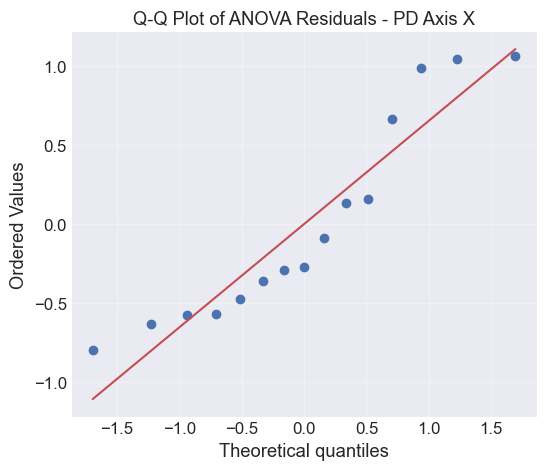


Inferential Statistics:
  Friedman χ² = 0.400, p = 0.8187
  RM-ANOVA F = 1.131, p = 0.3692
  ANOVA residuals Shapiro–Wilk: W = 0.876, p = 0.0411
  Normality assumption: Violated
→ Friedman: NOT SIGNIFICANT omnibus (fail to reject H₀)
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

POST-HOC PAIRWISE COMPARISONS (Bonferroni α = 0.0167):

  PWS vs SWS (n=5 pairs):
    PWS Mean: 1.9906, SWS Mean: 1.6983
    Mean difference: 0.2923
    Test used: Paired t-test (Shapiro-Wilk p=0.8527)
    Test statistic: 0.5661
    p-value: 0.6016
    Cohen's d: 0.2532
    Result: NOT SIGNIFICANT after Bonferroni correction
    Sensitivity analyses:
      [PD Axis x PWS vs SWS] Bootstrap 95% CI on mean difference: [-0.5658, 1.1504]
      [PD Axis x PWS vs SWS] LOO t-test p-value range: [0.1994, 0.9469]
      [PD Axis x PWS vs SWS] LOO Wilcoxon p-value range: [0.2500, 1.0000]
      [PD Axis x PWS vs SWS] LOO significance stability: t-test 0/5, Wilcoxon 0/5
      [PD Axis x PWS vs SWS] LOO Bonferroni

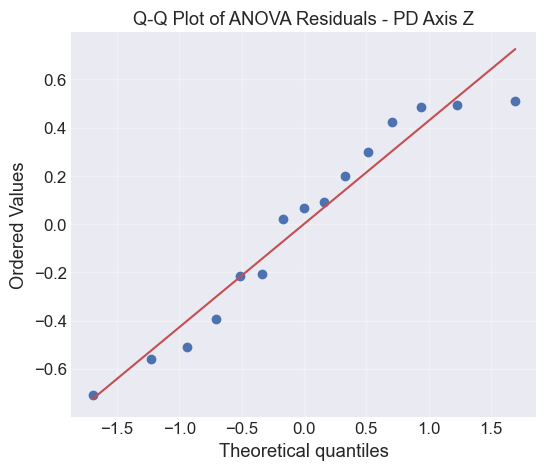


Inferential Statistics:
  Friedman χ² = 1.200, p = 0.5488
  RM-ANOVA F = 0.249, p = 0.7856
  ANOVA residuals Shapiro–Wilk: W = 0.927, p = 0.2498
  Normality assumption: Met
→ Friedman: NOT SIGNIFICANT omnibus (fail to reject H₀)
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

POST-HOC PAIRWISE COMPARISONS (Bonferroni α = 0.0167):

  PWS vs SWS (n=5 pairs):
    PWS Mean: 1.3184, SWS Mean: 1.0513
    Mean difference: 0.2671
    Test used: Paired t-test (Shapiro-Wilk p=0.8223)
    Test statistic: 0.9962
    p-value: 0.3755
    Cohen's d: 0.4455
    Result: NOT SIGNIFICANT after Bonferroni correction
    Sensitivity analyses:
      [PD Axis z PWS vs SWS] Bootstrap 95% CI on mean difference: [-0.2222, 0.6987]
      [PD Axis z PWS vs SWS] LOO t-test p-value range: [0.0881, 0.7732]
      [PD Axis z PWS vs SWS] LOO Wilcoxon p-value range: [0.1250, 0.8750]
      [PD Axis z PWS vs SWS] LOO significance stability: t-test 0/5, Wilcoxon 0/5
      [PD Axis z PWS vs SWS] LOO Bonferroni stab

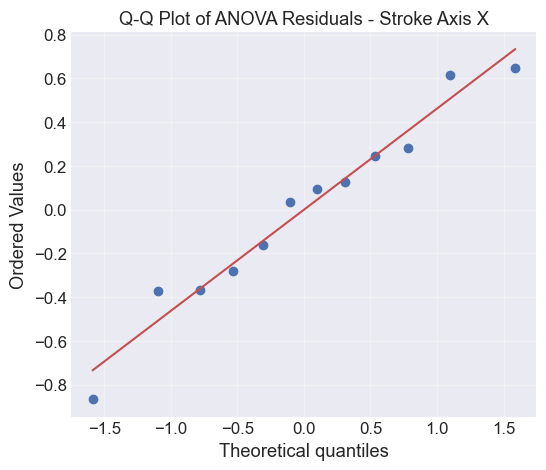


Inferential Statistics:
  Friedman χ² = 4.500, p = 0.1054
  RM-ANOVA F = 1.898, p = 0.2298
  ANOVA residuals Shapiro–Wilk: W = 0.965, p = 0.8549
  Normality assumption: Met
→ Friedman: NOT SIGNIFICANT omnibus (fail to reject H₀)
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

POST-HOC PAIRWISE COMPARISONS (Bonferroni α = 0.0167):

  PWS vs SWS (n=5 pairs):
    PWS Mean: 1.7898, SWS Mean: 1.4690
    Mean difference: 0.3208
    Test used: Paired t-test (Shapiro-Wilk p=0.8421)
    Test statistic: 2.0087
    p-value: 0.1150
    Cohen's d: 0.8983
    Result: NOT SIGNIFICANT after Bonferroni correction
    Sensitivity analyses:
      [Stroke Axis x PWS vs SWS] Bootstrap 95% CI on mean difference: [0.0346, 0.6054]
      [Stroke Axis x PWS vs SWS] LOO t-test p-value range: [0.0454, 0.2426]
      [Stroke Axis x PWS vs SWS] LOO Wilcoxon p-value range: [0.1250, 0.2500]
      [Stroke Axis x PWS vs SWS] LOO significance stability: t-test 1/5, Wilcoxon 0/5
      [Stroke Axis x PWS vs SWS] 

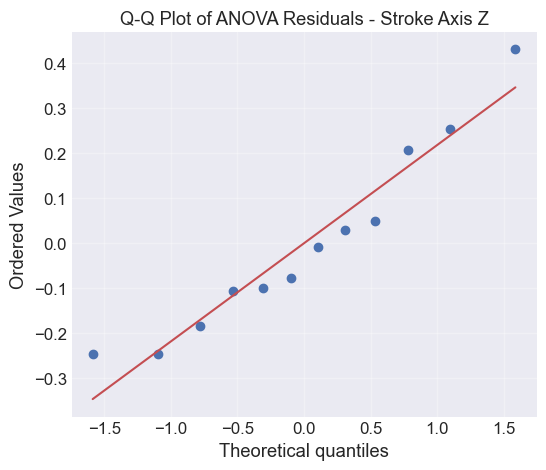


Inferential Statistics:
  Friedman χ² = 3.500, p = 0.1738
  RM-ANOVA F = 1.829, p = 0.2398
  ANOVA residuals Shapiro–Wilk: W = 0.930, p = 0.3846
  Normality assumption: Met
→ Friedman: NOT SIGNIFICANT omnibus (fail to reject H₀)
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

POST-HOC PAIRWISE COMPARISONS (Bonferroni α = 0.0167):

  PWS vs SWS (n=5 pairs):
    PWS Mean: 1.7570, SWS Mean: 1.3453
    Mean difference: 0.4117
    Test used: Paired t-test (Shapiro-Wilk p=0.7081)
    Test statistic: 3.9958
    p-value: 0.0162
    Cohen's d: 1.7870
    Result: SIGNIFICANT (Bonferroni corrected α=0.0167)
    Sensitivity analyses:
      [Stroke Axis z PWS vs SWS] Bootstrap 95% CI on mean difference: [0.2380, 0.5997]
      [Stroke Axis z PWS vs SWS] LOO t-test p-value range: [0.0146, 0.0565]
      [Stroke Axis z PWS vs SWS] LOO Wilcoxon p-value range: [0.1250, 0.1250]
      [Stroke Axis z PWS vs SWS] LOO significance stability: t-test 4/5, Wilcoxon 0/5
      [Stroke Axis z PWS vs SWS] 

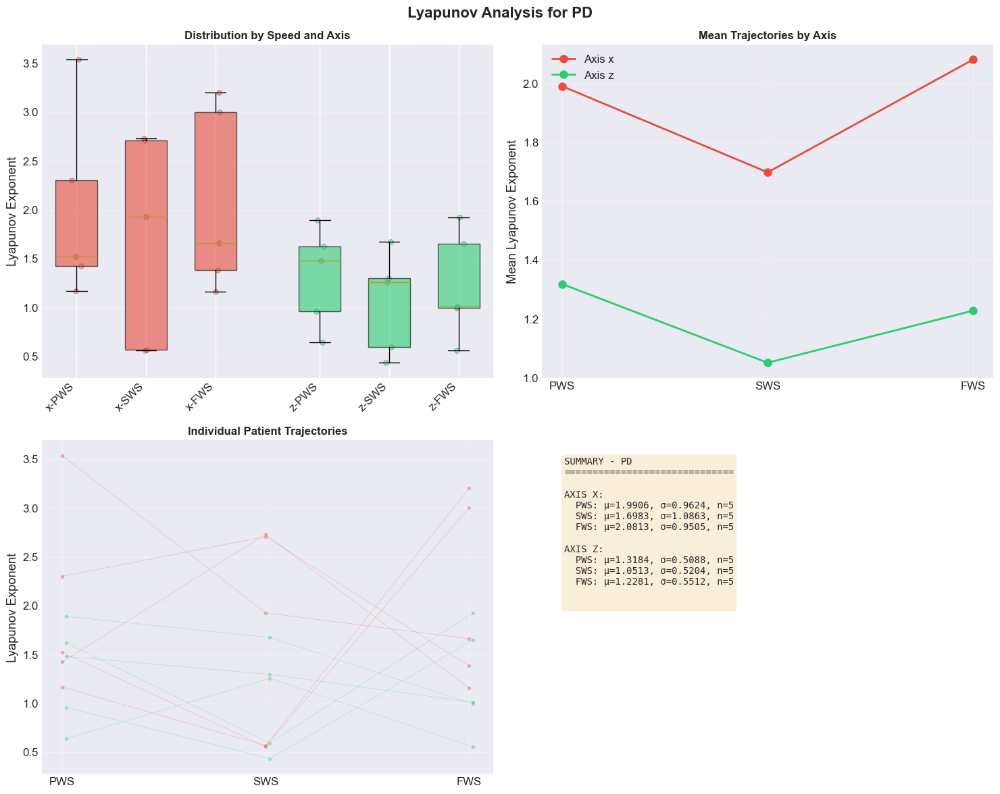

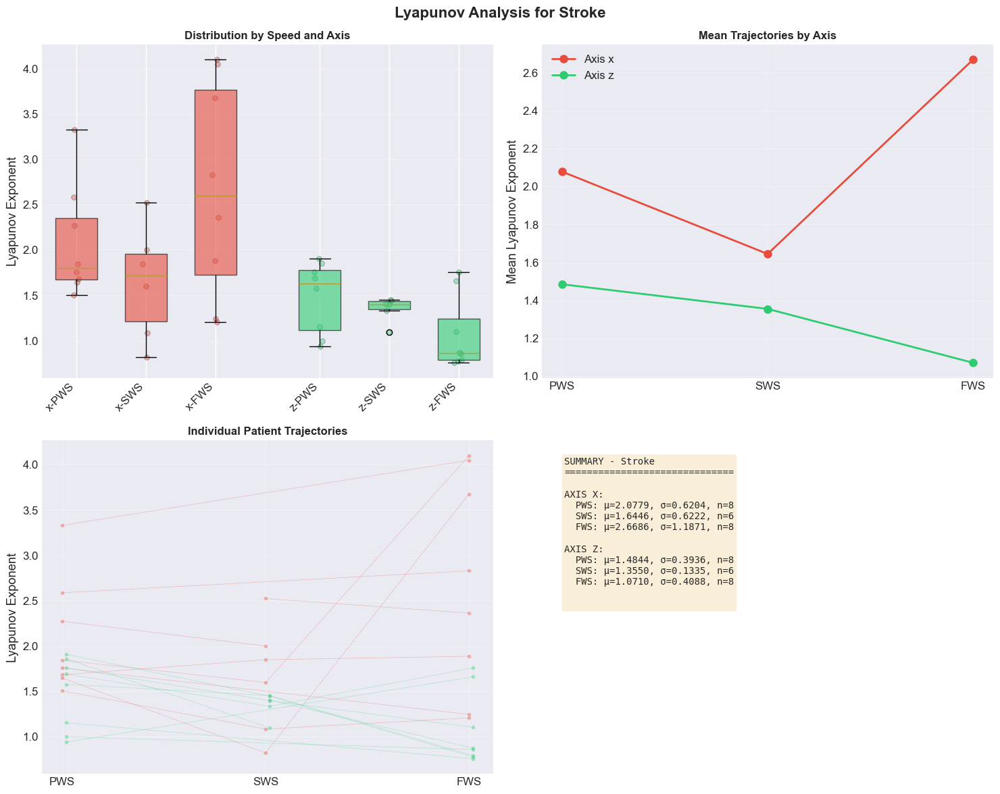

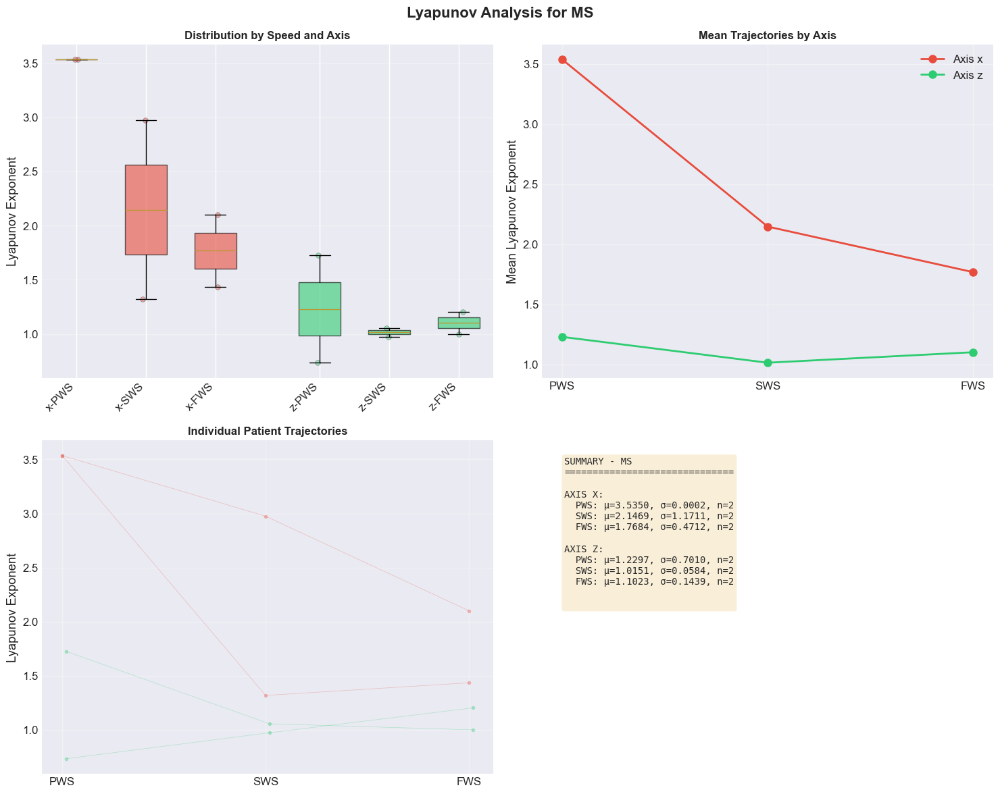

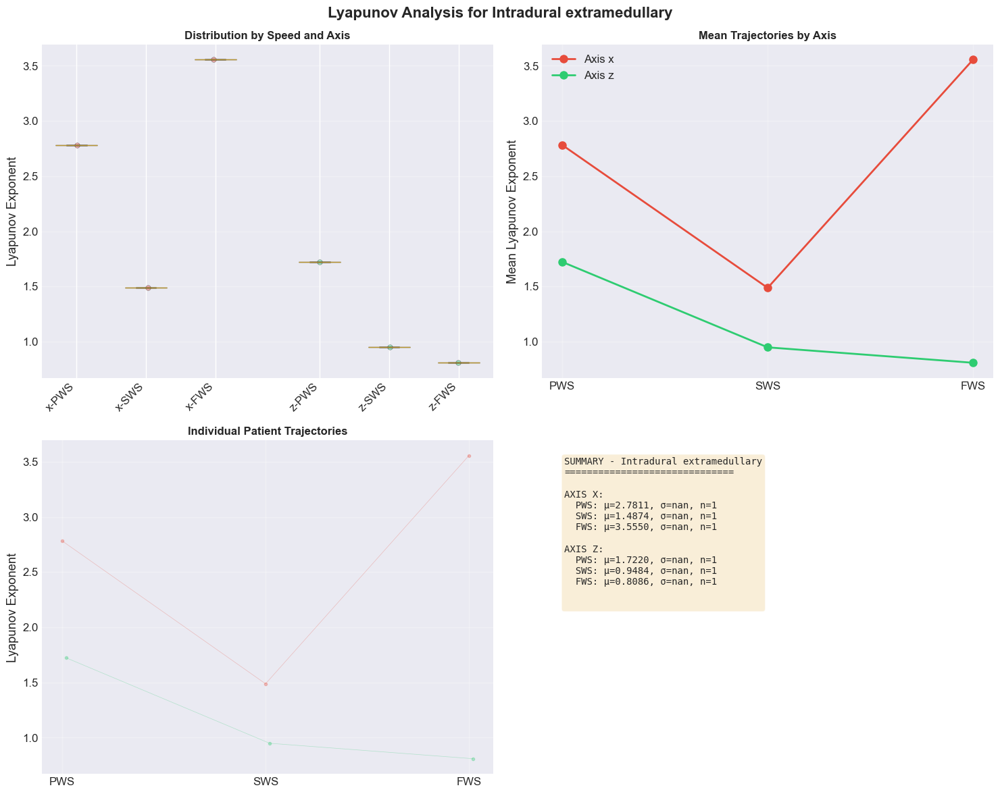


LEAVE-ONE-OUT SENSITIVITY SUMMARY - CGA Cohort


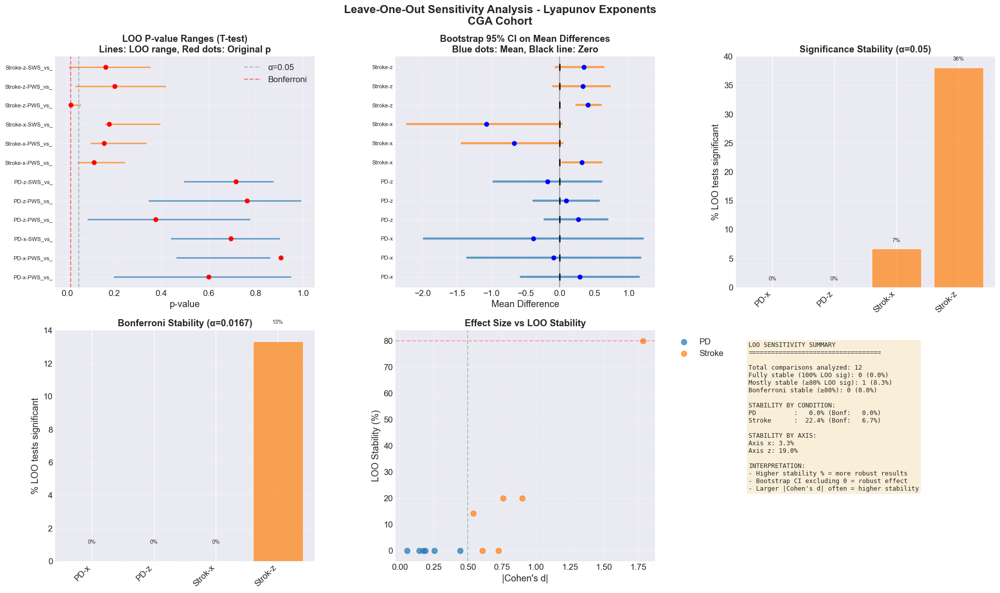


DETAILED LOO RESULTS TABLE
----------------------------------------------------------------------------------------------------
Condition       Axis  Comparison   n    Original p  LOO p-range          Stability       Bootstrap CI             
----------------------------------------------------------------------------------------------------
PD              x     PWS_vs_SWS   5    0.6016      [0.199, 0.947]       0/5 (0%)        [-0.566, 1.150]          
PD              x     PWS_vs_FWS   5    0.9074      [0.467, 0.860]       0/5 (0%)        [-1.351, 1.170]          
PD              x     SWS_vs_FWS   5    0.6947      [0.442, 0.900]       0/5 (0%)        [-1.978, 1.212]          
PD              z     PWS_vs_SWS   5    0.3755      [0.088, 0.773]       0/5 (0%)        [-0.222, 0.699]          
PD              z     PWS_vs_FWS   5    0.7623      [0.347, 0.990]       0/5 (0%)        [-0.382, 0.570]          
PD              z     SWS_vs_FWS   5    0.7171      [0.497, 0.873]       0/5 (0%

In [185]:

import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import ttest_rel, wilcoxon, shapiro, friedmanchisquare
import matplotlib.pyplot as plt
from statsmodels.stats.anova import AnovaRM
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

def analyze_by_condition(results_lyapunov, cohort_name="Neurological Patients"):
    """
    Complete condition-basedanalysis with repeated measures ANOVA for each condition and axis
    including LOO sensitivity analysis
    """
    
    # Extract patient ID from subject names if needed
    if 'patient_id' not in results_lyapunov.columns:
        results_lyapunov['patient_id'] = results_lyapunov['subject'].str[1:]
    
    # Get unique conditions (diagnoses) and axes
    conditions = results_lyapunov['condition'].unique()
    axes = sorted(results_lyapunov['axis'].unique())
    speed_comparisons = [('PWS', 'SWS'), ('PWS', 'FWS'), ('SWS', 'FWS')]
    
    print("="*80)
    print(f"LYAPUNOV ANALYSIS BY CONDITION WITH WALKING SPEED COMPARISONS - {cohort_name.upper()}")
    print("="*80)
    print(f"Conditions found: {', '.join(conditions)}")
    print(f"Axes: {axes}")
    
    # Define the hypotheses for Lyapunov analysis
    hypothesis = {
        'H0': 'μ_PWS = μ_SWS = μ_FWS (no difference in Lyapunov exponent across speeds)',
        'H1': 'At least one speed differs in Lyapunov exponent',
        'interpretation': 'Higher values indicate more chaotic/unstable gait dynamics'
    }
    
    all_condition_results = {}
    all_normality_results = {}
    
    # PART 1: NORMALITY TESTING BY CONDITION
    print(f"\n{'='*70}")
    print("PART 1: NORMALITY TESTING BY CONDITION AND AXIS")
    print(f"{'='*70}")
    print("Testing differences between speed pairs for normality within each condition")
    print("If p > 0.05: Use paired t-test (normal)")
    print("If p < 0.05: Use Wilcoxon signed-rank test (non-normal)")
    
    for condition in conditions:
        print(f"\n{'='*70}")
        print(f"CONDITION: {condition}")
        print(f"{'='*70}")
     
        condition_data = results_lyapunov[results_lyapunov['condition'] == condition]
        condition_patients = condition_data['patient_id'].unique()
        print(f"Total patients in {condition}: {len(condition_patients)}")
        
        fig = plt.figure(figsize=(15, 10))
        fig.suptitle(f'Normality Assessment for {condition} - Lyapunov Walking Speed Comparisons', 
                      fontsize=16, fontweight='bold')
        
        plot_idx = 0
        condition_normality = {}
        
        for axis_idx, axis in enumerate(axes):
            print(f"\nAXIS {axis.upper()}:")
            axis_normality = {}
            
            # Filter for this axis
            axis_data = condition_data[condition_data['axis'] == axis]
            
            for comp_idx, (speed1, speed2) in enumerate(speed_comparisons):
                # Find patients that have both speeds in this condition and axis
                patients_with_pair = []
                
                for patient in axis_data['patient_id'].unique():
                    patient_data = axis_data[axis_data['patient_id'] == patient]
                    speeds_present = patient_data['walking_speed'].unique()
                    if speed1 in speeds_present and speed2 in speeds_present:
                        patients_with_pair.append(patient)
               
                vals1 = []
                vals2 = []
                
                for patient in patients_with_pair:
                    patient_data = axis_data[axis_data['patient_id'] == patient]
                    val1 = patient_data[patient_data['walking_speed'] == speed1]['lyapunov_exponent'].values
                    val2 = patient_data[patient_data['walking_speed'] == speed2]['lyapunov_exponent'].values
                    
                    if len(val1) > 0 and len(val2) > 0:
                        vals1.append(val1[0])
                        vals2.append(val2[0])
                
                vals1 = np.array(vals1)
                vals2 = np.array(vals2)
                
                if len(vals1) >= 3: 
                    # Calculate differences
                    differences = vals1 - vals2
                    n_pairs = len(differences)
                    
                    # Shapiro-Wilk test
                    statistic, p_value = shapiro(differences)
                    
                    if p_value > 0.05:
                        test_recommendation = "Paired t-test"
                        normality_status = "Normal"
                    else:
                        test_recommendation = "Wilcoxon signed-rank"
                        normality_status = "Non-normal"
                    
                    axis_normality[f"{speed1}_vs_{speed2}"] = {
                        'test': test_recommendation,
                        'p_value': p_value,
                        'n': n_pairs,
                        'mean_diff': np.mean(differences),
                        'std_diff': np.std(differences, ddof=1)
                    }
                    
                    # Print results
                    print(f"  {speed1} vs {speed2}:")
                    print(f"    n = {n_pairs} pairs")
                    print(f"    Shapiro-Wilk p = {p_value:.4f} → {normality_status} → {test_recommendation}")
                    
                    # Q-Q plot
                    ax_qq = plt.subplot(len(axes), len(speed_comparisons), plot_idx + 1)
                    stats.probplot(differences, dist="norm", plot=ax_qq)
                    ax_qq.set_title(f'Axis {axis}: {speed1} vs {speed2}', fontsize=9)
                    ax_qq.grid(True, alpha=0.3)
                    
                    # Add p-value to plot
                    ax_qq.text(0.05, 0.95, f'p={p_value:.3f}\nn={n_pairs}', 
                              transform=ax_qq.transAxes, 
                              bbox=dict(boxstyle='round', 
                                       facecolor='yellow' if p_value < 0.05 else 'lightgreen', 
                                       alpha=0.7),
                              verticalalignment='top', fontsize=8)
                    
                    plot_idx += 1
                else:
                    print(f"  {speed1} vs {speed2}: Insufficient data (n={len(vals1)})")
                    axis_normality[f"{speed1}_vs_{speed2}"] = {
                        'test': "Insufficient data",
                        'p_value': np.nan,
                        'n': len(vals1)
                    }
            
            condition_normality[axis] = axis_normality
        
        all_normality_results[condition] = condition_normality
        
        plt.tight_layout()
        plt.show()
       
    
    # REPEATED MEASURES ANOVA BY CONDITION AND AXIS
    print(f"\n{'='*70}")
    print("PART 2: REPEATED MEASURES ANOVA BY CONDITION AND AXIS")
    print(f"{'='*70}")
    
    # Process each condition separately
    for condition in conditions:
        print(f"\n{'='*80}")
        print(f"CONDITION: {condition}")
        print(f"{'='*80}")
        
        # Filter data for this condition
        condition_data = results_lyapunov[results_lyapunov['condition'] == condition]
        patients = condition_data['patient_id'].unique()
        
        print(f"Total patients: {len(patients)}")
        print(f"Axes available: {axes}")
        
        print(f"\nREPEATED MEASURES ANOVA RESULTS FOR {condition}")
        print("-"*80)
        
        condition_results = {
            'anova_results': {},
            'pairwise_results': {},
            'summary_stats': {}
        }
        
        # ANOVA analysis for each axis in this condition
        for axis in axes:
            print(f"\n{'='*60}")
            print(f"AXIS {axis.upper()}")
            print(f"{'='*60}")
            
            # Filter for this axis
            axis_data = condition_data[condition_data['axis'] == axis]
            
            # Select only subjects with all three speeds
            complete_patients = []
            for pid in patients:
                patient_axis_data = axis_data[axis_data['patient_id'] == pid]
                speeds = patient_axis_data['walking_speed'].unique()
                if set(['PWS','SWS','FWS']).issubset(speeds):
                    complete_patients.append(pid)
            
            print(f"H₀: {hypothesis['H0']}")
            print(f"H₁: {hypothesis['H1']}")
            print(f"Note: {hypothesis['interpretation']}")
            print(f"Complete cases: {len(complete_patients)} / {len(patients)} patients")
            
            if len(complete_patients) < 3:
                print("→ Insufficient data for ANOVA (n<3)")
                condition_results['anova_results'][axis] = {'status': 'insufficient_data'}
                continue
            
            # Gather values for complete cases
            pws_vals = []
            sws_vals = []
            fws_vals = []
            
            for pid in complete_patients:
                patient_data = axis_data[axis_data['patient_id'] == pid]
                pws = patient_data[patient_data['walking_speed'] == 'PWS']['lyapunov_exponent'].values[0]
                sws = patient_data[patient_data['walking_speed'] == 'SWS']['lyapunov_exponent'].values[0]
                fws = patient_data[patient_data['walking_speed'] == 'FWS']['lyapunov_exponent'].values[0]
                
                pws_vals.append(pws)
                sws_vals.append(sws)
                fws_vals.append(fws)
            
            pws_vals = np.array(pws_vals)
            sws_vals = np.array(sws_vals)
            fws_vals = np.array(fws_vals)
            
            # Descriptive statistics
            print("Means ± SD:")
            print(f"  PWS: {pws_vals.mean():.4f} ± {pws_vals.std(ddof=1):.4f}")
            print(f"  SWS: {sws_vals.mean():.4f} ± {sws_vals.std(ddof=1):.4f}")
            print(f"  FWS: {fws_vals.mean():.4f} ± {fws_vals.std(ddof=1):.4f}")
            
            # Store summary statistics
            condition_results['summary_stats'][axis] = {
                'PWS': {'mean': pws_vals.mean(), 'std': pws_vals.std(ddof=1)},
                'SWS': {'mean': sws_vals.mean(), 'std': sws_vals.std(ddof=1)},
                'FWS': {'mean': fws_vals.mean(), 'std': fws_vals.std(ddof=1)},
                'n_complete': len(complete_patients)
            }
            
            # Friedman non-parametric omnibus test
            fr_stat, fr_p = friedmanchisquare(pws_vals, sws_vals, fws_vals)
            
            # Parametric repeated-measures ANOVA
            df_long = pd.DataFrame({
                'patient_id': np.repeat(complete_patients, 3),
                'speed': ['PWS', 'SWS', 'FWS'] * len(complete_patients),
                'value': np.concatenate([pws_vals, sws_vals, fws_vals])
            })
            
            try:
                aov = AnovaRM(df_long, depvar='value',
                            subject='patient_id', within=['speed']).fit()
                anova_success = True
                anova_f = aov.anova_table['F Value'][0]
                anova_p = aov.anova_table['Pr > F'][0]
                
                print("\nRepeated Measures ANOVA:")
                print(aov.summary())
            except Exception as e:
                print(f"→ RM-ANOVA failed: {str(e)}")
                anova_success = False
                anova_f = np.nan
                anova_p = np.nan
                aov = None
            
            # Compute ANOVA residuals and test normality
            if anova_success:
                grand_mean = df_long['value'].mean()
                subj_mean = df_long.groupby('patient_id')['value'].transform('mean')
                speed_mean = df_long.groupby('speed')['value'].transform('mean')
                df_long['resid'] = df_long['value'] - (subj_mean + speed_mean - grand_mean)
                
                # Test residual normality
                resid = df_long['resid'].values
                W, p_resid = shapiro(resid)
                
                # Q-Q plot for residuals
                plt.figure(figsize=(6, 5))
                stats.probplot(resid, dist="norm", plot=plt)
                plt.title(f"Q-Q Plot of ANOVA Residuals - {condition} Axis {axis.upper()}")
                plt.grid(True, alpha=0.3)
                plt.show()
            else:
                W = np.nan
                p_resid = np.nan
            
            print(f"\nInferential Statistics:")
            print(f"  Friedman χ² = {fr_stat:.3f}, p = {fr_p:.4f}")
            if anova_success:
                print(f"  RM-ANOVA F = {anova_f:.3f}, p = {anova_p:.4f}")
                print(f"  ANOVA residuals Shapiro–Wilk: W = {W:.3f}, p = {p_resid:.4f}")
                normality_assumption = "Met" if p_resid > 0.05 else "Violated"
                print(f"  Normality assumption: {normality_assumption}")
            
            # Store ANOVA results
            condition_results['anova_results'][axis] = {
                'n_complete': len(complete_patients),
                'friedman_stat': fr_stat,
                'friedman_p': fr_p,
                'anova_success': anova_success,
                'anova_f': anova_f,
                'anova_p': anova_p,
                'residual_normality_p': p_resid,
                'anova_summary': aov.summary() if anova_success else None
            }
            
            # Interpretation
            if fr_p < 0.05:
                print("→ Friedman: SIGNIFICANT omnibus (reject H₀)")
            else:
                print("→ Friedman: NOT SIGNIFICANT omnibus (fail to reject H₀)")
                
            if anova_success and anova_p < 0.05:
                print("→ RM-ANOVA: SIGNIFICANT omnibus (reject H₀)")
            elif anova_success:
                print("→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)")
            
            # POST-HOC PAIRWISE COMPARISONS for this axis
            print(f"\nPOST-HOC PAIRWISE COMPARISONS (Bonferroni α = 0.0167):")
            
            pairwise_comparisons = {}
            
            for speed1, speed2 in speed_comparisons:
                # Find patients that have both speeds for this axis in this condition
                patients_with_pair = []
                
                for patient in axis_data['patient_id'].unique():
                    patient_data = axis_data[axis_data['patient_id'] == patient]
                    speeds_present = patient_data['walking_speed'].unique()
                    if speed1 in speeds_present and speed2 in speeds_present:
                        patients_with_pair.append(patient)
                
                # Get paired data
                vals1 = []
                vals2 = []
                
                for patient in patients_with_pair:
                    patient_data = axis_data[axis_data['patient_id'] == patient]
                    val1 = patient_data[patient_data['walking_speed'] == speed1]['lyapunov_exponent'].values
                    val2 = patient_data[patient_data['walking_speed'] == speed2]['lyapunov_exponent'].values
                    
                    if len(val1) > 0 and len(val2) > 0:
                        vals1.append(val1[0])
                        vals2.append(val2[0])
                
                vals1 = np.array(vals1)
                vals2 = np.array(vals2)
                
                if len(vals1) >= 3:  # Need at least 3 pairs for meaningful test
                    # Check normality and decide test
                    diff = vals1 - vals2
                    _, shapiro_p = shapiro(diff)
                    
                    if shapiro_p > 0.05:
                        # Use paired t-test
                        t_stat, p_value = ttest_rel(vals1, vals2)
                        test_used = "Paired t-test"
                        test_stat = t_stat
                    else:
                        # Use Wilcoxon signed-rank test
                        wilcoxon_stat, p_value = wilcoxon(vals1, vals2)
                        test_used = "Wilcoxon signed-rank"
                        test_stat = wilcoxon_stat
                    
                    # Effect size
                    cohen_d = np.mean(diff) / np.std(diff, ddof=1) if np.std(diff, ddof=1) > 0 else 0
                    
                    print(f"\n  {speed1} vs {speed2} (n={len(vals1)} pairs):")
                    print(f"    {speed1} Mean: {np.mean(vals1):.4f}, {speed2} Mean: {np.mean(vals2):.4f}")
                    print(f"    Mean difference: {np.mean(diff):.4f}")
                    print(f"    Test used: {test_used} (Shapiro-Wilk p={shapiro_p:.4f})")
                    print(f"    Test statistic: {test_stat:.4f}")
                    print(f"    p-value: {p_value:.4f}")
                    print(f"    Cohen's d: {cohen_d:.4f}")
                    
                    # Bonferroni corrected significance
                    bonferroni_significant = p_value < 0.0167
                    if bonferroni_significant:
                        print(f"    Result: SIGNIFICANT (Bonferroni corrected α=0.0167)")
                    else:
                        print(f"    Result: NOT SIGNIFICANT after Bonferroni correction")
                    
                    # Perform Leave-One-Out sensitivity analysis
                    print(f"    Sensitivity analyses:")
                    loo_metrics = _perform_loo_sensitivity_analysis(vals1, vals2, 
                                                                   f"{condition} Axis {axis} {speed1} vs {speed2}")
                    
                    # Store pairwise results including LOO metrics
                    pairwise_comparisons[f"{speed1}_vs_{speed2}"] = {
                        'n_pairs': len(vals1),
                        'mean_diff': np.mean(diff),
                        'test_statistic': test_stat,
                        'p_value': p_value,
                        'cohen_d': cohen_d,
                        'test_type': test_used,
                        'significant': bonferroni_significant,
                        'normality_p': shapiro_p,
                        'loo_metrics': loo_metrics  # Store LOO results
                    }
                else:
                    print(f"\n  {speed1} vs {speed2}: Insufficient paired data (n={len(vals1)})")
                    pairwise_comparisons[f"{speed1}_vs_{speed2}"] = {
                        'n_pairs': len(vals1),
                        'status': 'insufficient_data'
                    }
            
            condition_results['pairwise_results'][axis] = pairwise_comparisons
        
        all_condition_results[condition] = condition_results
    
    # VISUALIZATION
    create_condition_visualization(results_lyapunov, conditions, cohort_name)
    
    # CREATE LOO SUMMARY
    loo_summary = create_loo_summary_from_results(all_condition_results, conditions, cohort_name)
    
    # COMPREHENSIVE SUMMARY
    print_condition_summary(all_condition_results, conditions, cohort_name, all_normality_results)
    
    return all_condition_results, all_normality_results, loo_summary


def _perform_loo_sensitivity_analysis(before_vals, after_vals, label=""):
    """
    Perform Leave-One-Out sensitivity analysis with bootstrap confidence intervals.
    """
    diffs = before_vals - after_vals
    n = len(diffs)
    
    if n < 2:
        print(f"      [{label}] Not enough data for sensitivity analysis.")
        return {}
    
    # Bootstrap 95% confidence interval for mean difference
    np.random.seed(42)  # For reproducibility
    n_bootstrap = 10000
    bootstrap_means = []
    
    for _ in range(n_bootstrap):
        bootstrap_sample = np.random.choice(diffs, size=n, replace=True)
        bootstrap_means.append(np.mean(bootstrap_sample))
    
    ci_lo, ci_hi = np.percentile(bootstrap_means, [2.5, 97.5])
    print(f"      [{label}] Bootstrap 95% CI on mean difference: [{ci_lo:.4f}, {ci_hi:.4f}]")
    
    loo_results = {
        'bootstrap_ci_low': ci_lo,
        'bootstrap_ci_high': ci_hi,
        'n_samples': n
    }
    
    # Leave-one-out sensitivity analysis
    if n >= 3:
        p_t_values = []
        p_w_values = []
        
        for i in range(n):
            loo_before = np.delete(before_vals, i)
            loo_after = np.delete(after_vals, i)
            
            if len(loo_before) > 1:
                try:
                    # Leave-one-out t-test
                    _, p_t = ttest_rel(loo_before, loo_after)
                    p_t_values.append(p_t)
                    
                    # Leave-one-out Wilcoxon test
                    _, p_w = wilcoxon(loo_before, loo_after)
                    p_w_values.append(p_w)
                except:
                    continue
        
        if p_t_values and p_w_values:
            print(f"      [{label}] LOO t-test p-value range: [{np.min(p_t_values):.4f}, {np.max(p_t_values):.4f}]")
            print(f"      [{label}] LOO Wilcoxon p-value range: [{np.min(p_w_values):.4f}, {np.max(p_w_values):.4f}]")
            
            # Check stability of significance
            significant_t = sum(1 for p in p_t_values if p < 0.05)
            significant_w = sum(1 for p in p_w_values if p < 0.05)
            print(f"      [{label}] LOO significance stability: t-test {significant_t}/{len(p_t_values)}, "
                  f"Wilcoxon {significant_w}/{len(p_w_values)}")
            
            # Check Bonferroni stability
            bonferroni_t = sum(1 for p in p_t_values if p < 0.0167)
            bonferroni_w = sum(1 for p in p_w_values if p < 0.0167)
            print(f"      [{label}] LOO Bonferroni stability: t-test {bonferroni_t}/{len(p_t_values)}, "
                  f"Wilcoxon {bonferroni_w}/{len(p_w_values)}")
            
            loo_results.update({
                'loo_t_p_min': np.min(p_t_values),
                'loo_t_p_max': np.max(p_t_values),
                'loo_w_p_min': np.min(p_w_values),
                'loo_w_p_max': np.max(p_w_values),
                'loo_t_sig_stable': significant_t,
                'loo_t_total': len(p_t_values),
                'loo_w_sig_stable': significant_w,
                'loo_w_total': len(p_w_values),
                'loo_t_bonf_stable': bonferroni_t,
                'loo_w_bonf_stable': bonferroni_w
            })
    
    return loo_results


def create_loo_summary_from_results(all_condition_results, conditions, cohort_name):
    """
    Leave-One-Out sensitivity summary.
    """
    
    print(f"\n{'='*80}")
    print(f"LEAVE-ONE-OUT SENSITIVITY SUMMARY - {cohort_name}")
    print(f"{'='*80}")
    
    # Create visual summary
    fig = plt.figure(figsize=(20, 12))
    
    # Collect all LOO results
    loo_data = []
    
    for condition in conditions:
        if condition in all_condition_results:
            for axis, pairwise_dict in all_condition_results[condition]['pairwise_results'].items():
                for comp_name, comp_result in pairwise_dict.items():
                    if 'loo_metrics' in comp_result and comp_result['loo_metrics']:
                        loo_metrics = comp_result['loo_metrics']
                        if 'loo_t_p_min' in loo_metrics:
                            loo_data.append({
                                'condition': condition,
                                'axis': axis,
                                'comparison': comp_name,
                                'original_p': comp_result['p_value'],
                                'test_type': comp_result['test_type'],
                                'n_pairs': comp_result['n_pairs'],
                                'cohen_d': comp_result.get('cohen_d', np.nan),
                                'mean_diff': comp_result.get('mean_diff', np.nan),
                                **loo_metrics
                            })
    
    if not loo_data:
        print("No LOO results found.")
        plt.close()
        return {}
    
    loo_df = pd.DataFrame(loo_data)
    
    # P-value stability ranges (T-test)
    ax1 = plt.subplot(2, 3, 1)
    
    # Plot t-test p-value ranges
    y_pos = 0
    y_labels = []
    colors_by_condition = plt.cm.tab10(np.linspace(0, 1, len(conditions)))
    condition_colors = {cond: colors_by_condition[i] for i, cond in enumerate(conditions)}
    
    for _, row in loo_df.iterrows():
        if 'loo_t_p_min' in row and not pd.isna(row['loo_t_p_min']):
            color = condition_colors.get(row['condition'], 'blue')
            ax1.plot([row['loo_t_p_min'], row['loo_t_p_max']], [y_pos, y_pos], 
                    color=color, linewidth=2, alpha=0.7)
            ax1.plot(row['original_p'], y_pos, 'o', color='red', markersize=6, zorder=5)
            y_labels.append(f"{row['condition'][:8]}-{row['axis']}-{row['comparison'][:7]}")
            y_pos += 1
    
    ax1.axvline(x=0.05, color='gray', linestyle='--', alpha=0.5, label='α=0.05')
    ax1.axvline(x=0.0167, color='red', linestyle='--', alpha=0.5, label='Bonferroni')
    ax1.set_xlabel('p-value')
    ax1.set_xlim(-0.05, 1.05)
    ax1.set_yticks(range(len(y_labels)))
    ax1.set_yticklabels(y_labels, fontsize=8)
    ax1.set_title('LOO P-value Ranges (T-test)\nLines: LOO range, Red dots: Original p', fontweight='bold')
    ax1.legend(loc='upper right')
    ax1.grid(True, alpha=0.3)
    
    # Bootstrap CI ranges
    ax2 = plt.subplot(2, 3, 2)
    
    y_pos = 0
    y_labels_ci = []
    for _, row in loo_df.iterrows():
        if 'bootstrap_ci_low' in row and not pd.isna(row['bootstrap_ci_low']):
            color = condition_colors.get(row['condition'], 'green')
            ax2.plot([row['bootstrap_ci_low'], row['bootstrap_ci_high']], [y_pos, y_pos], 
                    color=color, linewidth=3, alpha=0.7)
            # Mark zero
            ax2.plot(0, y_pos, 'k|', markersize=10, markeredgewidth=2)
            # Mark mean difference
            if not pd.isna(row['mean_diff']):
                ax2.plot(row['mean_diff'], y_pos, 'o', color='blue', markersize=6)
            y_labels_ci.append(f"{row['condition'][:8]}-{row['axis']}")
            y_pos += 1
    
    ax2.axvline(x=0, color='black', linestyle='-', alpha=0.3)
    ax2.set_xlabel('Mean Difference')
    ax2.set_yticks(range(len(y_labels_ci)))
    ax2.set_yticklabels(y_labels_ci, fontsize=8)
    ax2.set_title('Bootstrap 95% CI on Mean Differences\nBlue dots: Mean, Black line: Zero', fontweight='bold')
    ax2.grid(True, alpha=0.3)
    
    # Stability metrics by condition and axis
    ax3 = plt.subplot(2, 3, 3)
    
    if 'loo_t_sig_stable' in loo_df.columns:
        stability_data = loo_df[['condition', 'axis', 'loo_t_sig_stable', 'loo_t_total']].copy()
        stability_data['stability_pct'] = (stability_data['loo_t_sig_stable'] / stability_data['loo_t_total']) * 100
        
        # Group by condition and axis
        grouped = stability_data.groupby(['condition', 'axis'])['stability_pct'].mean()
        
        # Create bar plot
        x_labels = [f"{idx[0][:5]}-{idx[1]}" for idx in grouped.index]
        colors = [condition_colors.get(idx[0], 'skyblue') for idx in grouped.index]
        
        bars = ax3.bar(range(len(grouped)), grouped.values, color=colors, alpha=0.7)
        ax3.set_ylabel('% LOO tests significant')
        ax3.set_title('Significance Stability (α=0.05)', fontweight='bold')
        ax3.set_xticks(range(len(x_labels)))
        ax3.set_xticklabels(x_labels, rotation=45, ha='right')
        ax3.grid(True, alpha=0.3, axis='y')
        
        # Add value labels on bars
        for bar, val in zip(bars, grouped.values):
            height = bar.get_height()
            ax3.text(bar.get_x() + bar.get_width()/2., height + 1,
                    f'{val:.0f}%', ha='center', va='bottom', fontsize=8)
    
    # Bonferroni stability
    ax4 = plt.subplot(2, 3, 4)
    
    if 'loo_t_bonf_stable' in loo_df.columns:
        bonf_data = loo_df[['condition', 'axis', 'loo_t_bonf_stable', 'loo_t_total']].copy()
        bonf_data['bonf_stability_pct'] = (bonf_data['loo_t_bonf_stable'] / bonf_data['loo_t_total']) * 100
        
        grouped_bonf = bonf_data.groupby(['condition', 'axis'])['bonf_stability_pct'].mean()
        
        x_labels_bonf = [f"{idx[0][:5]}-{idx[1]}" for idx in grouped_bonf.index]
        colors_bonf = [condition_colors.get(idx[0], 'lightcoral') for idx in grouped_bonf.index]
        
        bars_bonf = ax4.bar(range(len(grouped_bonf)), grouped_bonf.values, color=colors_bonf, alpha=0.7)
        ax4.set_ylabel('% LOO tests significant')
        ax4.set_title('Bonferroni Stability (α=0.0167)', fontweight='bold')
        ax4.set_xticks(range(len(x_labels_bonf)))
        ax4.set_xticklabels(x_labels_bonf, rotation=45, ha='right')
        ax4.grid(True, alpha=0.3, axis='y')
        
        # Add value labels
        for bar, val in zip(bars_bonf, grouped_bonf.values):
            height = bar.get_height()
            ax4.text(bar.get_x() + bar.get_width()/2., height + 1,
                    f'{val:.0f}%', ha='center', va='bottom', fontsize=8)
    
    # Effect size vs stability scatter
    ax5 = plt.subplot(2, 3, 5)
    
    if 'cohen_d' in loo_df.columns and 'loo_t_sig_stable' in loo_df.columns:
        # Calculate stability percentage
        loo_df['stability_pct'] = (loo_df['loo_t_sig_stable'] / loo_df['loo_t_total']) * 100
        
        # Plot scatter for each condition
        for condition in conditions:
            cond_data = loo_df[loo_df['condition'] == condition]
            if len(cond_data) > 0:
                ax5.scatter(np.abs(cond_data['cohen_d']), cond_data['stability_pct'],
                           label=condition[:8], alpha=0.7, s=60,
                           color=condition_colors.get(condition, 'gray'))
        
        ax5.set_xlabel('|Cohen\'s d|')
        ax5.set_ylabel('LOO Stability (%)')
        ax5.set_title('Effect Size vs LOO Stability', fontweight='bold')
        ax5.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax5.grid(True, alpha=0.3)
        
        # Add reference lines
        ax5.axhline(y=80, color='red', linestyle='--', alpha=0.3, label='80% stable')
        ax5.axvline(x=0.5, color='green', linestyle='--', alpha=0.3, label='Medium effect')
    
    # Summary statistics and interpretation
    ax6 = plt.subplot(2, 3, 6)
    ax6.axis('off')
    
    summary_text = "LOO SENSITIVITY SUMMARY\n" + "="*35 + "\n\n"
    
    # Overall statistics
    if 'loo_t_sig_stable' in loo_df.columns:
        total_comparisons = len(loo_df)
        fully_stable = len(loo_df[loo_df['loo_t_sig_stable'] == loo_df['loo_t_total']])
        mostly_stable = len(loo_df[loo_df['loo_t_sig_stable'] >= 0.8 * loo_df['loo_t_total']])
        bonf_stable = len(loo_df[loo_df['loo_t_bonf_stable'] >= 0.8 * loo_df['loo_t_total']])
        
        summary_text += f"Total comparisons analyzed: {total_comparisons}\n"
        summary_text += f"Fully stable (100% LOO sig): {fully_stable} ({fully_stable/total_comparisons*100:.1f}%)\n"
        summary_text += f"Mostly stable (≥80% LOO sig): {mostly_stable} ({mostly_stable/total_comparisons*100:.1f}%)\n"
        summary_text += f"Bonferroni stable (≥80%): {bonf_stable} ({bonf_stable/total_comparisons*100:.1f}%)\n\n"
        
        # By condition summary
        summary_text += "STABILITY BY CONDITION:\n"
        for condition in conditions:
            cond_data = loo_df[loo_df['condition'] == condition]
            if len(cond_data) > 0:
                avg_stability = (cond_data['loo_t_sig_stable'] / cond_data['loo_t_total']).mean() * 100
                avg_bonf = (cond_data['loo_t_bonf_stable'] / cond_data['loo_t_total']).mean() * 100
                summary_text += f"{condition[:12]:12s}: {avg_stability:5.1f}% (Bonf: {avg_bonf:5.1f}%)\n"
        
        # By axis summary
        summary_text += "\nSTABILITY BY AXIS:\n"
        for axis in ['x', 'y', 'z']:
            axis_data = loo_df[loo_df['axis'] == axis]
            if len(axis_data) > 0:
                avg_stability = (axis_data['loo_t_sig_stable'] / axis_data['loo_t_total']).mean() * 100
                summary_text += f"Axis {axis}: {avg_stability:.1f}%\n"
    
    # Interpretation
    summary_text += "\nINTERPRETATION:\n"
    summary_text += "- Higher stability % = more robust results\n"
    summary_text += "- Bootstrap CI excluding 0 = robust effect\n"
    summary_text += "- Larger |Cohen's d| often = higher stability"
    
    ax6.text(0.05, 0.95, summary_text, transform=ax6.transAxes, 
             fontsize=9, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.suptitle(f'Leave-One-Out Sensitivity Analysis - Lyapunov Exponents\n{cohort_name}', 
                 fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    # Create detailed table
    print("\nDETAILED LOO RESULTS TABLE")
    print("-"*100)
    print(f"{'Condition':<15} {'Axis':<5} {'Comparison':<12} {'n':<4} {'Original p':<11} "
          f"{'LOO p-range':<20} {'Stability':<15} {'Bootstrap CI':<25}")
    print("-"*100)
    
    for _, row in loo_df.iterrows():
        if 'loo_t_p_min' in row and not pd.isna(row['loo_t_p_min']):
            p_range = f"[{row['loo_t_p_min']:.3f}, {row['loo_t_p_max']:.3f}]"
            stability = f"{row['loo_t_sig_stable']}/{row['loo_t_total']} ({row['loo_t_sig_stable']/row['loo_t_total']*100:.0f}%)"
            ci_range = f"[{row['bootstrap_ci_low']:.3f}, {row['bootstrap_ci_high']:.3f}]"
            
            print(f"{row['condition']:<15} {row['axis']:<5} {row['comparison']:<12} "
                  f"{row['n_pairs']:<4} {row['original_p']:<11.4f} "
                  f"{p_range:<20} {stability:<15} {ci_range:<25}")

    
    return loo_df




def create_condition_visualization(results_lyapunov, conditions, cohort_name):
    """Create visualization for each condition"""
    
    speeds = ['PWS', 'SWS', 'FWS']
    colors = {'x': '#e74c3c', 'z': '#2ecc71', 'y': '#f39c12'}
    axes = sorted(results_lyapunov['axis'].unique())
    
    for condition in conditions[:4]:  # Plot first 4 conditions
        condition_data = results_lyapunov[results_lyapunov['condition'] == condition]
        
        if len(condition_data) == 0:
            continue
        
        fig, axes_plot = plt.subplots(2, 2, figsize=(15, 12))
        axes_plot = axes_plot.flatten()
        
        # 1. Box plots by axis and speed
        ax1 = axes_plot[0]
        
        positions = []
        data_to_plot = []
        labels = []
        box_colors = []
        
        pos = 0
        for axis in axes:
            for speed in speeds:
                speed_data = condition_data[(condition_data['axis'] == axis) & 
                                           (condition_data['walking_speed'] == speed)]['lyapunov_exponent'].values
                if len(speed_data) > 0:
                    data_to_plot.append(speed_data)
                    labels.append(f'{axis}-{speed}')
                    box_colors.append(colors.get(axis, '#3498db'))
                    positions.append(pos)
                pos += 1
            pos += 0.5  # Space between axes
        
        if data_to_plot:
            bp = ax1.boxplot(data_to_plot, positions=positions, widths=0.6, patch_artist=True)
            
            # Color the boxes
            for patch, color in zip(bp['boxes'], box_colors):
                patch.set_facecolor(color)
                patch.set_alpha(0.6)
            
            # Add individual points
            for i, (data, pos, color) in enumerate(zip(data_to_plot, positions, box_colors)):
                jitter = np.random.normal(0, 0.04, size=len(data))
                ax1.scatter(np.full_like(data, pos) + jitter, data, 
                          alpha=0.4, s=30, color=color, edgecolors='black', linewidth=0.5)
            
            ax1.set_xticks(positions)
            ax1.set_xticklabels(labels, rotation=45, ha='right')
            ax1.set_ylabel('Lyapunov Exponent')
            ax1.set_title('Distribution by Speed and Axis', fontsize=12, fontweight='bold')
            ax1.grid(axis='y', alpha=0.3)
        
        # 2. Mean trajectories
        ax2 = axes_plot[1]
        
        for axis in axes:
            means = []
            for speed in speeds:
                mean_val = condition_data[(condition_data['axis'] == axis) & 
                                        (condition_data['walking_speed'] == speed)]['lyapunov_exponent'].mean()
                means.append(mean_val)
            
            ax2.plot([0, 1, 2], means, 'o-', color=colors.get(axis, '#3498db'), 
                    linewidth=2, markersize=8, label=f'Axis {axis}')
        
        ax2.set_xticks([0, 1, 2])
        ax2.set_xticklabels(speeds)
        ax2.set_ylabel('Mean Lyapunov Exponent')
        ax2.set_title('Mean Trajectories by Axis', fontsize=12, fontweight='bold')
        ax2.legend()
        ax2.grid(True, alpha=0.3)
        
        # 3. Individual trajectories
        ax3 = axes_plot[2]
        
        # Plot sample patients in this condition
        condition_patients = condition_data['patient_id'].unique()[:15]  # First 15 patients
        
        for axis_idx, axis in enumerate(axes):
            axis_offset = axis_idx * 0.02
            
            for patient in condition_patients:
                patient_data = condition_data[(condition_data['patient_id'] == patient) & 
                                             (condition_data['axis'] == axis)]
                
                # Get available speeds for this patient
                x_vals = []
                y_vals = []
                
                for i, speed in enumerate(speeds):
                    val = patient_data[patient_data['walking_speed'] == speed]['lyapunov_exponent'].values
                    if len(val) > 0:
                        x_vals.append(i + axis_offset)
                        y_vals.append(val[0])
                
                # Plot if patient has at least 2 speeds
                if len(x_vals) >= 2:
                    ax3.plot(x_vals, y_vals, 'o-', color=colors.get(axis, '#3498db'),
                            alpha=0.3, linewidth=0.5, markersize=3)
        
        ax3.set_xticks([0, 1, 2])
        ax3.set_xticklabels(speeds)
        ax3.set_ylabel('Lyapunov Exponent')
        ax3.set_title('Individual Patient Trajectories', fontsize=12, fontweight='bold')
        ax3.grid(True, alpha=0.3)
        
        # 4. Summary statistics
        ax4 = axes_plot[3]
        ax4.axis('off')
        
        summary_text = f"SUMMARY - {condition}\n" + "="*30 + "\n\n"
        
        for axis in axes:
            axis_data = condition_data[condition_data['axis'] == axis]
            summary_text += f"AXIS {axis.upper()}:\n"
            
            for speed in speeds:
                speed_data = axis_data[axis_data['walking_speed'] == speed]['lyapunov_exponent']
                if len(speed_data) > 0:
                    summary_text += f"  {speed}: μ={speed_data.mean():.4f}, σ={speed_data.std():.4f}, n={len(speed_data)}\n"
            
            summary_text += "\n"
        
        ax4.text(0.05, 0.95, summary_text, transform=ax4.transAxes, 
                 fontsize=10, verticalalignment='top', fontfamily='monospace',
                 bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
        
        plt.suptitle(f'Lyapunov Analysis for {condition}', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()


def print_condition_summary(all_condition_results, conditions, cohort_name, all_normality_results):
    """Print comprehensive summary of condition-based analysis with LOO stability"""
    
    # Comprehensive summary table
    print(f"\n{'='*80}")
    print(f"COMPREHENSIVE SUMMARY ACROSS ALL CONDITIONS - {cohort_name.upper()}")
    print(f"{'='*80}")
    print(f"{'Condition':<15} {'Axis':<10} {'Comparison':<15} {'n':<5} {'p-value':<10} {'Test':<25}")
    print("-"*80)
    
    for condition in conditions:
        if condition in all_normality_results:
            for axis in sorted(all_normality_results[condition].keys()):
                for comp_key, data in all_normality_results[condition][axis].items():
                    test = data['test']
                    p_val = data['p_value']
                    n = data['n']
                    
                    p_str = f"{p_val:.4f}" if not np.isnan(p_val) else "N/A"
                    print(f"{condition:<15} {axis:<10} {comp_key:<15} {n:<5} {p_str:<10} {test:<25}")
    
    # Summary of significant findings with LOO stability
    print(f"\n{'='*80}")
    print("SUMMARY OF SIGNIFICANT FINDINGS WITH LOO STABILITY")
    print(f"{'='*80}")
    
    for condition in conditions:
        if condition in all_condition_results:
            significant_found = False
            print(f"\n{condition.upper()}:")
            
            # Check ANOVA results
            for axis, anova_result in all_condition_results[condition]['anova_results'].items():
                if 'friedman_p' in anova_result and anova_result['friedman_p'] < 0.05:
                    print(f"  Axis {axis}: Friedman p = {anova_result['friedman_p']:.4f} (SIGNIFICANT)")
                    significant_found = True
                elif 'anova_p' in anova_result and anova_result['anova_success'] and anova_result['anova_p'] < 0.05:
                    print(f"  Axis {axis}: RM-ANOVA p = {anova_result['anova_p']:.4f} (SIGNIFICANT)")
                    significant_found = True
            
            # Check pairwise results with LOO stability
            for axis, pairwise_dict in all_condition_results[condition]['pairwise_results'].items():
                for comp_name, comp_result in pairwise_dict.items():
                    if 'significant' in comp_result and comp_result['significant']:
                        loo_info = ""
                        if 'loo_metrics' in comp_result and comp_result['loo_metrics']:
                            metrics = comp_result['loo_metrics']
                            if 'loo_t_sig_stable' in metrics:
                                stability_pct = (metrics['loo_t_sig_stable'] / metrics['loo_t_total']) * 100
                                loo_info = f" [LOO: {stability_pct:.0f}% stable]"
                        
                        print(f"  Axis {axis} {comp_name.replace('_vs_', ' vs ')}: p = {comp_result['p_value']:.4f} (SIGNIFICANT){loo_info}")
                        significant_found = True
            
            if not significant_found:
                print("  No significant effects found")



# run full consolidated
def run_lyapunov_condition_analysis(data: pd.DataFrame, cohort_name: str = "Neurological Patients"):
    """
    Run complete condition-based Lyapunov analysis including LOO sensitivity
    """
    print("Running Lyapunov analysis by condition with ANOVA by axis and LOO sensitivity...")
    results, normality_results, loo_summary = analyze_by_condition(data, cohort_name)
    return results, normality_results, loo_summary



results, normality, loo = run_lyapunov_condition_analysis(df_cga_sle, "CGA Cohort")
  

### Rain Plots

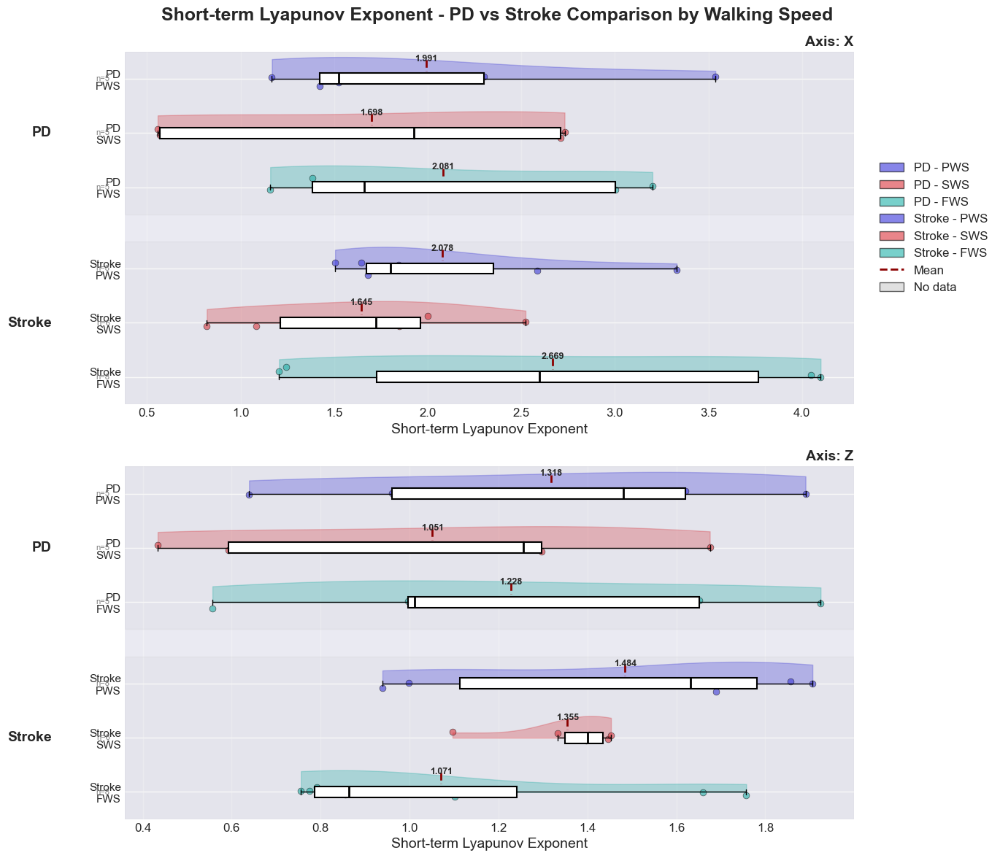


DETAILED STATISTICS

AXIS X:

  PD:
    PWS:
      N: 5
      Mean: 1.9906
      Median: 1.5234
      Std: 0.9624
      Range: [1.1674, 3.5373]
    SWS:
      N: 5
      Mean: 1.6983
      Median: 1.9273
      Std: 1.0863
      Range: [0.5574, 2.7314]
    FWS:
      N: 5
      Mean: 2.0813
      Median: 1.6622
      Std: 0.9505
      Range: [1.1586, 3.2008]

  Stroke:
    PWS:
      N: 8
      Mean: 2.0779
      Median: 1.8003
      Std: 0.6204
      Range: [1.5052, 3.3303]
    SWS:
      N: 6
      Mean: 1.6446
      Median: 1.7220
      Std: 0.6222
      Range: [0.8197, 2.5227]
    FWS:
      N: 8
      Mean: 2.6686
      Median: 2.5953
      Std: 1.1871
      Range: [1.2058, 4.0994]

AXIS Z:

  PD:
    PWS:
      N: 5
      Mean: 1.3184
      Median: 1.4809
      Std: 0.5088
      Range: [0.6393, 1.8907]
    SWS:
      N: 5
      Mean: 1.0513
      Median: 1.2566
      Std: 0.5204
      Range: [0.4337, 1.6755]
    FWS:
      N: 5
      Mean: 1.2281
      Median: 1.0118
      Std: 0

In [187]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy import stats

def rain_plot_conditions_by_speed(df, conditions_to_plot=['PD', 'Stroke'],
                                         axes_to_plot=['x', 'y', 'z'],
                                         value_col='lyapunov_exponent'):
    """
    Creates horizontal rain plots for specific conditions (PD and Stroke)
    
    """

    df_filtered = df[df['condition'].isin(conditions_to_plot)]
  
    available_axes = df_filtered['axis'].unique()
    axes_to_use = [ax for ax in axes_to_plot if ax in available_axes]
    
    if len(axes_to_use) == 0:
        print(f"No data found for axes: {axes_to_plot}")
        return
    
    speeds = ['PWS', 'SWS', 'FWS']
    
    
    n_axes = len(axes_to_use)
    fig, axs = plt.subplots(n_axes, 1, figsize=(14, 6*n_axes))
    
    if n_axes == 1:
        axs = [axs]
  
    condition_colors = {
        'PD': {'PWS': "#3734db", 'SWS': "#db343c", 'FWS': "#1EB1A9"},     
        'Stroke': {'PWS': '#3734db', 'SWS': '#db343c', 'FWS': '#1EB1A9'}   
    }
    
    for ax_idx, (ax, axis_name) in enumerate(zip(axs, axes_to_use)):
       
        axis_df = df_filtered[df_filtered['axis'] == axis_name]
        
        plot_data = []
        plot_labels = []
        plot_colors = []
        plot_positions = []
        
        position = 0
        group_positions = {}
        
        # Process each condition
        for cond_idx, condition in enumerate(conditions_to_plot):
            cond_df = axis_df[axis_df['condition'] == condition]
            group_start = position
            
            # Check if we have data for this condition
            if len(cond_df) == 0:
                # Add empty spaces to maintain structure
                for speed in speeds:
                    plot_data.append([np.nan])  # Single NaN value for empty data
                    plot_labels.append(f"{condition}\n{speed}")
                    plot_colors.append('#CCCCCC')  # Gray for missing data
                    plot_positions.append(position)
                    position += 1
            else:
                for speed_idx, speed in enumerate(speeds):
                    # Get data for this speed
                    speed_data = cond_df[cond_df['walking_speed'] == speed][value_col].dropna().values
                    
                    if len(speed_data) > 0:
                        plot_data.append(speed_data)
                        plot_labels.append(f"{condition}\n{speed}")
                        plot_colors.append(condition_colors[condition][speed])
                        plot_positions.append(position)
                    else:
                        # No data for this speed
                        plot_data.append([np.nan])
                        plot_labels.append(f"{condition}\n{speed}")
                        plot_colors.append('#CCCCCC')
                        plot_positions.append(position)
                    
                    position += 1
            
            group_positions[condition] = (group_start, position - 1)
            position += 0.5  # Add space between conditions
        
        # Create horizontal violin plots
        valid_indices = [i for i, data in enumerate(plot_data) if not (len(data) == 1 and np.isnan(data[0]))]
        
        if valid_indices:
            valid_data = [plot_data[i] for i in valid_indices]
            valid_positions = [plot_positions[i] for i in valid_indices]
            
            parts = ax.violinplot(valid_data, positions=valid_positions, vert=False,
                                 widths=0.8, showmeans=False, showmedians=False, 
                                 showextrema=False)
            
            # Color the violins
            for i, (idx, pc) in enumerate(zip(valid_indices, parts['bodies'])):
                pc.set_facecolor(plot_colors[idx])
                pc.set_alpha(0.3)
                pc.set_edgecolor(plot_colors[idx])
                # Make half violin (bottom half)
                m = np.mean(pc.get_paths()[0].vertices[:, 1])
                pc.get_paths()[0].vertices[:, 1] = np.clip(pc.get_paths()[0].vertices[:, 1], -np.inf, m)
            
            # Add box plots
            bp = ax.boxplot(valid_data, positions=valid_positions, vert=False,
                           widths=0.2, showfliers=False, patch_artist=True)
            
            for i, (box, median) in enumerate(zip(bp['boxes'], bp['medians'])):
                box.set_facecolor('white')
                box.set_edgecolor('black')
                box.set_linewidth(1.5)
                median.set_color('black')
                median.set_linewidth(2)
        
        # Add strip plots (rain drops) and annotations
        for i, (data, pos, color, label) in enumerate(zip(plot_data, plot_positions, plot_colors, plot_labels)):
            if len(data) == 1 and np.isnan(data[0]):
                # Mark missing data
                ax.text(0, pos, 'No data', ha='center', va='center', 
                       fontsize=10, style='italic', color='gray')
            else:
                # Add rain drops
                y_jitter = np.random.normal(0, 0.06, size=len(data))
                ax.scatter(data, np.full_like(data, pos) + y_jitter, 
                          alpha=0.6, s=40, color=color, edgecolor='black', linewidth=0.5)
                
                # Add mean line
                mean_val = np.mean(data)
                ax.vlines(mean_val, pos - 0.35, pos - 0.15, colors='darkred', 
                         linestyles='dashed', linewidth=2)
                
                # Add mean value text
                ax.text(mean_val, pos - 0.45, f'{mean_val:.3f}', 
                       ha='center', va='top', fontsize=9, fontweight='bold')
                
                # Add sample size
                ax.text(ax.get_xlim()[0] - 0.02 * (ax.get_xlim()[1] - ax.get_xlim()[0]), 
                       pos, f'n={len(data)}', ha='right', va='center', fontsize=8, color='gray')
        
        # Add condition separators and labels
        for condition, (start, end) in group_positions.items():
            mid = (start + end) / 2
            ax.axhspan(start - 0.5, end + 0.5, alpha=0.05, color='gray')
            ax.text(ax.get_xlim()[0] - 0.1 * (ax.get_xlim()[1] - ax.get_xlim()[0]), 
                   mid, condition, ha='right', va='center', fontsize=14, fontweight='bold')
        
        # Customize subplot
        ax.set_yticks(plot_positions)
        ax.set_yticklabels(plot_labels, fontsize=11)
        ax.set_xlabel('Short-term Lyapunov Exponent', fontsize=14)
        
        ax.set_title(f'Axis: {axis_name.upper()}', fontsize=14, fontweight='bold', loc='right')
        
        ax.grid(axis='x', alpha=0.3)
        ax.invert_yaxis()  # Put first items at top
        
       
    conditions_str = ' vs '.join(conditions_to_plot)
    plt.suptitle(f'Short-term Lyapunov Exponent - {conditions_str} Comparison by Walking Speed', 
                fontsize=18, fontweight='bold')
    
    # Add legend
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D
    legend_elements = []
    
    for condition in conditions_to_plot:
        for speed in speeds:
            if condition in condition_colors and speed in condition_colors[condition]:
                legend_elements.append(
                    Patch(facecolor=condition_colors[condition][speed], 
                          edgecolor='black', alpha=0.6,
                          label=f'{condition} - {speed}')
                )
    
    legend_elements.extend([
        Line2D([0], [0], color='darkred', linestyle='--', linewidth=2, label='Mean'),
        Patch(facecolor='#CCCCCC', edgecolor='black', alpha=0.6, label='No data')
    ])
    
    # Legend outside the plot
    axs[0].legend(handles=legend_elements, loc='center left', 
                 bbox_to_anchor=(1.02, 0.5), ncol=1)
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed statistics
    print("\n" + "="*60)
    print("DETAILED STATISTICS")
    print("="*60)
    
    for axis_name in axes_to_use:
        print(f"\nAXIS {axis_name.upper()}:")
        axis_df = df_filtered[df_filtered['axis'] == axis_name]
        
        for condition in conditions_to_plot:
            print(f"\n  {condition}:")
            cond_df = axis_df[axis_df['condition'] == condition]
            
            for speed in speeds:
                speed_data = cond_df[cond_df['walking_speed'] == speed][value_col].dropna()
                if len(speed_data) > 0:
                    print(f"    {speed}:")
                    print(f"      N: {len(speed_data)}")
                    print(f"      Mean: {speed_data.mean():.4f}")
                    print(f"      Median: {speed_data.median():.4f}")
                    print(f"      Std: {speed_data.std():.4f}")
                    print(f"      Range: [{speed_data.min():.4f}, {speed_data.max():.4f}]")
                else:
                    print(f"    {speed}: No data")
    
    # Between-condition comparisons
    print("\n" + "="*60)
    print("BETWEEN-CONDITION COMPARISONS")
    print("="*60)
    
    for axis_name in axes_to_use:
        print(f"\nAXIS {axis_name.upper()}:")
        axis_df = df_filtered[df_filtered['axis'] == axis_name]
        
        for speed in speeds:
            print(f"\n  {speed}:")
            
            # Get data for both conditions
            data_dict = {}
            for condition in conditions_to_plot:
                cond_data = axis_df[(axis_df['condition'] == condition) & 
                                   (axis_df['walking_speed'] == speed)][value_col].dropna()
                if len(cond_data) > 0:
                    data_dict[condition] = cond_data
            
            if len(data_dict) == 2:
                conditions_list = list(data_dict.keys())
                data1 = data_dict[conditions_list[0]]
                data2 = data_dict[conditions_list[1]]
                
                t_stat, p_val = stats.ttest_ind(data1, data2)
                print(f"    {conditions_list[0]} vs {conditions_list[1]}: t = {t_stat:.4f}, p = {p_val:.4f}")
                
                # Effect size (Cohen's d)
                pooled_std = np.sqrt(((len(data1)-1)*data1.std()**2 + (len(data2)-1)*data2.std()**2) / 
                                    (len(data1) + len(data2) - 2))
                if pooled_std > 0:
                    cohen_d = (data1.mean() - data2.mean()) / pooled_std
                    print(f"    Cohen's d: {cohen_d:.4f}")
            else:
                print(f"    Insufficient data for comparison")


# Example usage
if __name__ == "__main__":
  

    # Create rain plot for PD and Stroke
    rain_plot_conditions_by_speed(
        df_cga_sle,
        conditions_to_plot=['PD', 'Stroke'],
        axes_to_plot=['x',  'z'], 
        value_col='lyapunov_exponent'
    )

# Entropy

## Young

In [188]:
df_young_entropy = pd.read_excel(cwd.parent / ".." / "results" / "Young" / "Young_Entropy_Final.xlsx")

#### Rain plot for visualization 

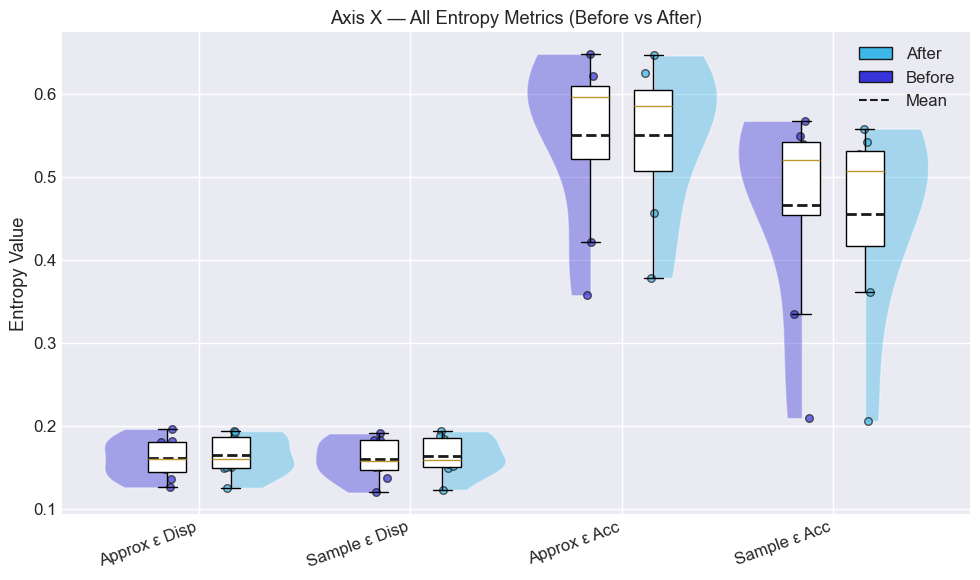

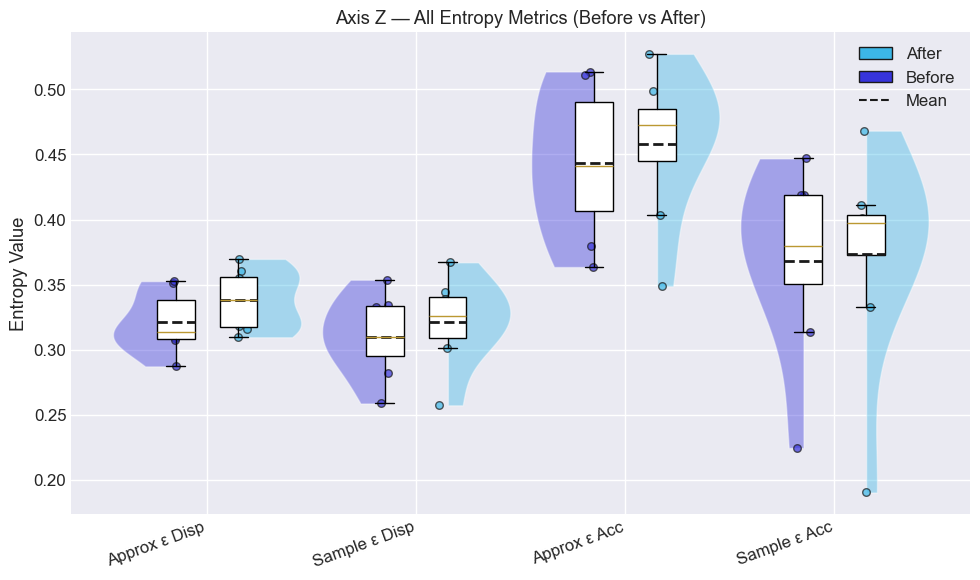

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

def rain_plot_all_entropy_metrics(df, axis='x'):
    """
    Create rain plot, by axis
    """
   
    df_axis = df[df['axis'] == axis]

    metrics = [
        ('ap_entropy_disp', 'Approx ε Disp'),
        ('sa_entropy_disp', 'Sample ε Disp'),
        ('ap_entropy_acc',  'Approx ε Acc'),
        ('sa_entropy_acc',  'Sample ε Acc'),
    ]
    conditions = sorted(df_axis['condition'].unique())
    colors = {'before': '#3734db', 'after': '#3cb7e7'}
    
    fig, ax = plt.subplots(figsize=(10, 6))
    width = 0.6
    offsets = {'before': -0.15, 'after': +0.15}

    for i, (col, label) in enumerate(metrics):
        for cond in conditions:
            vals = df_axis[df_axis['condition'] == cond][col].dropna().values
            if len(vals)==0: 
                continue
            pos = i + offsets[cond.lower()]

            # half‐violin
            parts = ax.violinplot([vals], positions=[pos], widths=width,
                                  showmeans=False, showmedians=False, showextrema=False)
            for pc in parts['bodies']:
                verts = pc.get_paths()[0].vertices
                mx = verts[:,0].mean()
                if cond.lower()=='before':
                    verts[:,0] = np.clip(verts[:,0], -np.inf, mx)
                else:
                    verts[:,0] = np.clip(verts[:,0], mx, np.inf)
                pc.set_facecolor(colors[cond.lower()])
                pc.set_alpha(0.4)

            # boxplot
            bp = ax.boxplot([vals], positions=[pos], widths=width*0.3, patch_artist=True,
                            showfliers=False)
            bp['boxes'][0].set_facecolor('white')
            bp['boxes'][0].set_edgecolor('black')

            # rain points
            xpts = np.random.normal(pos, 0.02, size=len(vals))
            ax.scatter(xpts, vals, color=colors[cond.lower()], edgecolor='k',
                       alpha=0.7, s=30)

            # mean line
            ax.hlines(vals.mean(), pos-width*0.15, pos+width*0.15,
                      colors='k', linestyles='--', linewidth=2)

    ax.set_xticks(range(len(metrics)))
    ax.set_xticklabels([lbl for _, lbl in metrics], rotation=20, ha='right')
    ax.set_ylabel('Entropy Value')
    ax.set_title(f'Axis {axis.upper()} — All Entropy Metrics (Before vs After)')

    # legend
    from matplotlib.patches import Patch
    legend = [Patch(facecolor=colors[c.lower()], edgecolor='k', label=c.title())
              for c in conditions]
    legend.append(plt.Line2D([0],[0], color='k', linestyle='--', label='Mean'))
    ax.legend(handles=legend, loc='upper right')

    plt.tight_layout()
    plt.show()



rain_plot_all_entropy_metrics(df_young_entropy, axis='x')
rain_plot_all_entropy_metrics(df_young_entropy, axis='z')


#### Statistical testing


=== Axis X (8 subjects) ===

--- Approx. Entropy Disp (n=8) ---
 Before: mean=0.161, SD=0.025
 After:  mean=0.164, SD=0.025
 Shapiro–Wilk p=0.249 → Paired t-test
 Paired t-test: t=-1.427, p=0.197
 Mean Δ=-0.003, SD=0.007
 Cohen's d=-0.505
 Sensitivity analyses:
   [X ap_entropy_disp] Bootstrap 95% CI on Δmean: [-0.008, 0.001]
   [X ap_entropy_disp] LOO t-test p-range:    [0.117, 0.412]
   [X ap_entropy_disp] LOO Wilcoxon p-range: [0.219, 0.688]

--- Sample Entropy Disp (n=8) ---
 Before: mean=0.160, SD=0.025
 After:  mean=0.163, SD=0.024
 Shapiro–Wilk p=0.241 → Paired t-test
 Paired t-test: t=-1.600, p=0.154
 Mean Δ=-0.004, SD=0.006
 Cohen's d=-0.566
 Sensitivity analyses:
   [X sa_entropy_disp] Bootstrap 95% CI on Δmean: [-0.008, 0.000]
   [X sa_entropy_disp] LOO t-test p-range:    [0.093, 0.315]
   [X sa_entropy_disp] LOO Wilcoxon p-range: [0.078, 0.469]

--- Approx. Entropy Acc (n=8) ---
 Before: mean=0.550, SD=0.104
 After:  mean=0.550, SD=0.092
 Shapiro–Wilk p=0.890 → Paired t-te

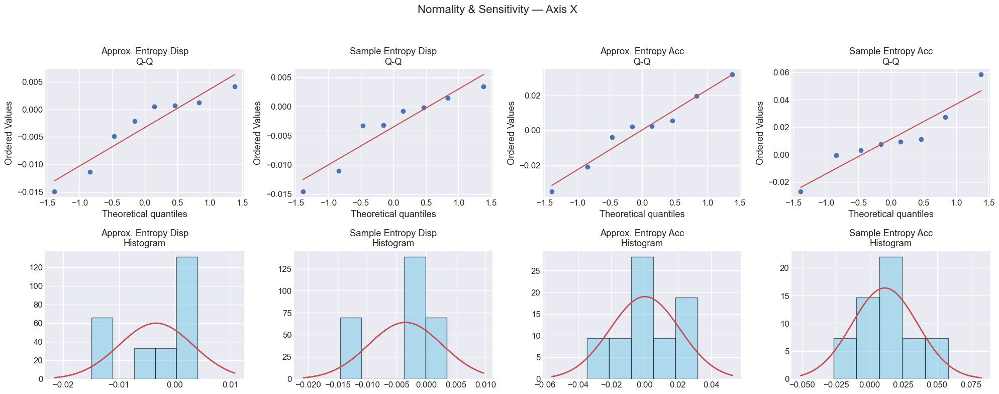


=== Axis Z (8 subjects) ===

--- Approx. Entropy Disp (n=8) ---
 Before: mean=0.321, SD=0.023
 After:  mean=0.338, SD=0.023
 Shapiro–Wilk p=0.285 → Paired t-test
 Paired t-test: t=-3.268, p=0.014
 Mean Δ=-0.017, SD=0.015
 Cohen's d=-1.155
 Sensitivity analyses:
   [Z ap_entropy_disp] Bootstrap 95% CI on Δmean: [-0.028, -0.009]
   [Z ap_entropy_disp] LOO t-test p-range:    [0.010, 0.036]
   [Z ap_entropy_disp] LOO Wilcoxon p-range: [0.016, 0.016]

--- Sample Entropy Disp (n=8) ---
 Before: mean=0.310, SD=0.031
 After:  mean=0.322, SD=0.033
 Shapiro–Wilk p=0.578 → Paired t-test
 Paired t-test: t=-3.035, p=0.019
 Mean Δ=-0.011, SD=0.011
 Cohen's d=-1.073
 Sensitivity analyses:
   [Z sa_entropy_disp] Bootstrap 95% CI on Δmean: [-0.019, -0.005]
   [Z sa_entropy_disp] LOO t-test p-range:    [0.013, 0.047]
   [Z sa_entropy_disp] LOO Wilcoxon p-range: [0.016, 0.031]

--- Approx. Entropy Acc (n=8) ---
 Before: mean=0.444, SD=0.057
 After:  mean=0.458, SD=0.057
 Shapiro–Wilk p=0.250 → Paired t-

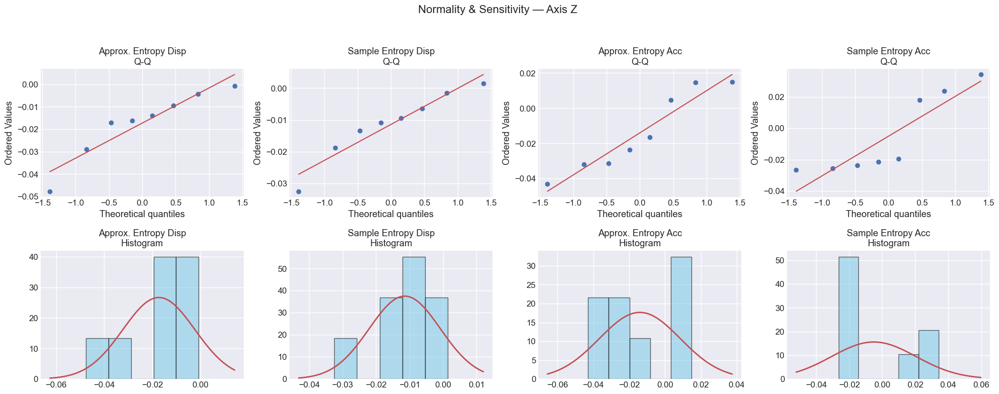

In [191]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import shapiro, ttest_rel, wilcoxon
import warnings
warnings.filterwarnings('ignore')

def sensitivity_checks(before_vals, after_vals, label=""):
    diffs = before_vals - after_vals
    n = len(diffs)
    if n < 2:
        print(f"   [{label}] Not enough data for sensitivity.")
        return
    boots = np.random.choice(diffs, (10000, n), replace=True)
    lo, hi = np.percentile(boots.mean(axis=1), [2.5, 97.5])
    print(f"   [{label}] Bootstrap 95% CI on Δmean: [{lo:.3f}, {hi:.3f}]")
    p_t, p_w = [], []
    for i in range(n):
        lb = np.delete(before_vals, i)
        la = np.delete(after_vals,  i)
        if len(lb) > 1:
            p_t.append(ttest_rel(lb, la).pvalue)
            p_w.append(wilcoxon(lb, la).pvalue)
    if p_t and p_w:
        print(f"   [{label}] LOO t-test p-range:    [{np.min(p_t):.3f}, {np.max(p_t):.3f}]")
        print(f"   [{label}] LOO Wilcoxon p-range: [{np.min(p_w):.3f}, {np.max(p_w):.3f}]")

def analyze_entropy_by_axis(df):
    
    axes = sorted(df['axis'].unique())
    metrics = [
        ('ap_entropy_disp', 'Approx. Entropy Disp'),
        ('sa_entropy_disp', 'Sample Entropy Disp'),
        ('ap_entropy_acc',  'Approx. Entropy Acc'),
        ('sa_entropy_acc',  'Sample Entropy Acc'),
    ]
    for axis in axes:
        sub = df[df['axis'] == axis]
        common_subjects = set(sub[sub['condition']=='Before']['subject']).intersection(
                          sub[sub['condition']=='After']['subject'])
        print(f"\n=== Axis {axis.upper()} ({len(common_subjects)} subjects) ===")
        fig, axes_plot = plt.subplots(2, len(metrics), figsize=(5*len(metrics), 8))
        plt.suptitle(f'Normality & Sensitivity — Axis {axis.upper()}', fontsize=16)
        for idx, (col, label) in enumerate(metrics):
            before = sub[sub['condition']=='Before'].set_index('subject')[col]
            after  = sub[sub['condition']=='After' ].set_index('subject')[col]
            common = list(common_subjects)
            bvals = before.loc[common].dropna().values
            avals = after.loc[common].dropna().values
            diffs = bvals - avals
            
            print(f"\n--- {label} (n={len(diffs)}) ---")
            # Descriptive by condition
            if len(bvals)>0:
                print(f" Before: mean={bvals.mean():.3f}, SD={bvals.std(ddof=1):.3f}")
            if len(avals)>0:
                print(f" After:  mean={avals.mean():.3f}, SD={avals.std(ddof=1):.3f}")
            
            # Normality test
            W, p_sw = shapiro(diffs) if len(diffs)>=3 else (np.nan, np.nan)
            normal = (p_sw > 0.05)
            test_name = "Paired t-test" if normal else "Wilcoxon signed-rank"
            print(f" Shapiro–Wilk p={p_sw:.3f} → {test_name}")
            
            # Paired test
            if normal:
                t, pval = ttest_rel(bvals, avals)
                print(f" Paired t-test: t={t:.3f}, p={pval:.3f}")
            else:
                w, pval = wilcoxon(bvals, avals)
                print(f" Wilcoxon: W={w:.3f}, p={pval:.3f}")
            
            print(f" Mean Δ={diffs.mean():.3f}, SD={diffs.std(ddof=1):.3f}")
            cohen_d = diffs.mean() / diffs.std(ddof=1) if diffs.std(ddof=1) > 0 else 0
            print(f" Cohen's d={cohen_d:.3f}")
            # Q-Q plot
            ax_qq = axes_plot[0, idx]
            if len(diffs)>0:
                stats.probplot(diffs, dist="norm", plot=ax_qq)
            ax_qq.set_title(f"{label}\nQ-Q")
            
            # Histogram
            ax_hist = axes_plot[1, idx]
            if len(diffs)>0:
                ax_hist.hist(diffs, bins=min(15, max(5,len(diffs)//3)), density=True,
                             color='skyblue', edgecolor='black', alpha=0.6)
                mu, sigma = diffs.mean(), diffs.std(ddof=1)
                x = np.linspace(diffs.min()-sigma, diffs.max()+sigma, 100)
                ax_hist.plot(x, stats.norm.pdf(x, mu, sigma), 'r-', lw=2)
            ax_hist.set_title(f"{label}\nHistogram")
            
            print(" Sensitivity analyses:")
            sensitivity_checks(bvals, avals, label=f"{axis.upper()} {col}")
        plt.tight_layout(rect=[0,0,1,0.95])
        plt.show()

analyze_entropy_by_axis(df_young_entropy)


## Elderly

In [192]:
df_elderly_entropy = pd.read_excel(cwd.parent / ".." / "results" / "Elderly" / "Elderly_Entropy_Final.xlsx")

### Rain plot

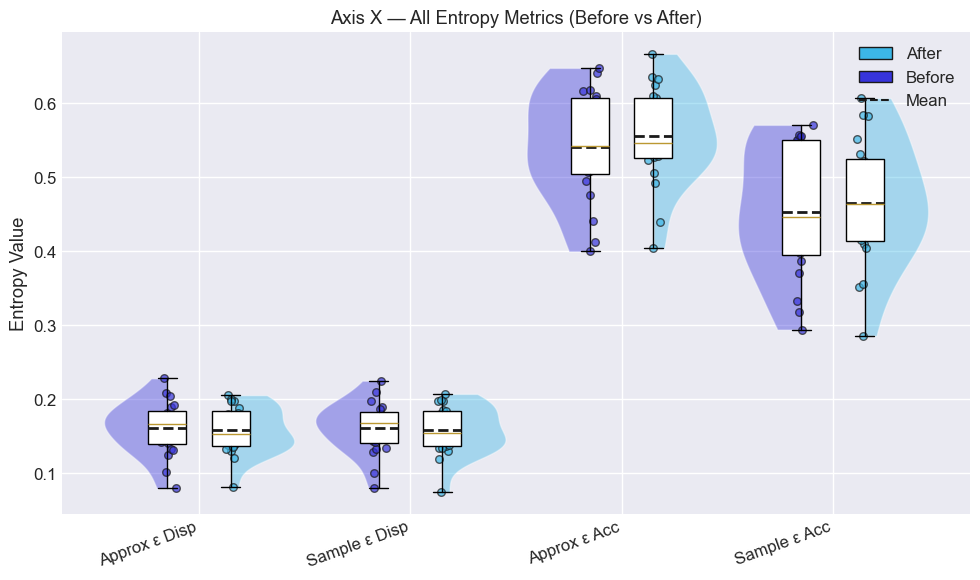

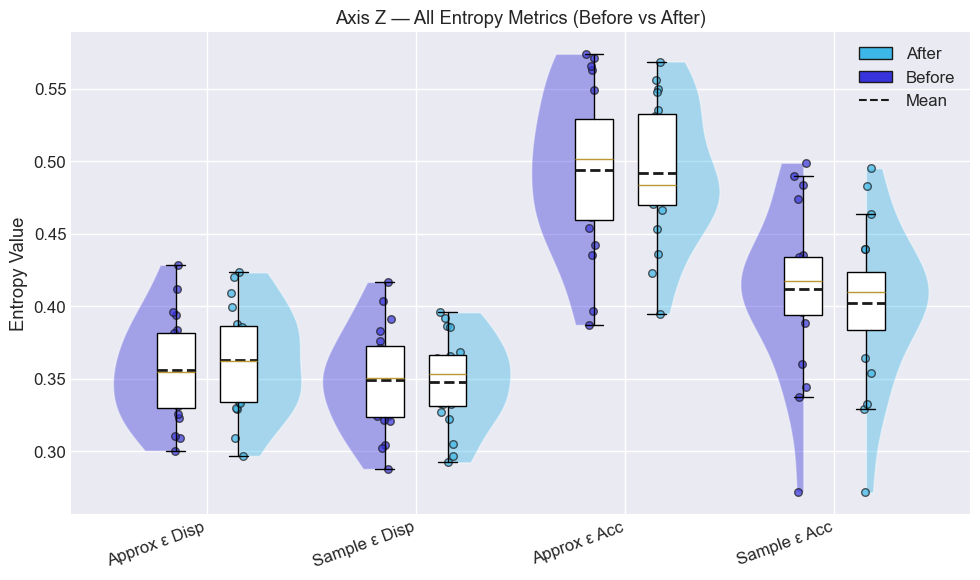

In [194]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

def rain_plot_all_entropy_metrics(df, axis='x'):
    """
    Create rain plot, by axis
    """

    df_axis = df[df['axis'] == axis]

    metrics = [
        ('ap_entropy_disp', 'Approx ε Disp'),
        ('sa_entropy_disp', 'Sample ε Disp'),
        ('ap_entropy_acc',  'Approx ε Acc'),
        ('sa_entropy_acc',  'Sample ε Acc'),
    ]
    conditions = sorted(df_axis['condition'].unique())
    colors = {'before': "#3734db", 'after': "#3cb7e7"}
    
    fig, ax = plt.subplots(figsize=(10, 6))
    width = 0.6
    offsets = {'before': -0.15, 'after': +0.15}

    for i, (col, label) in enumerate(metrics):
        for cond in conditions:
            vals = df_axis[df_axis['condition'] == cond][col].dropna().values
            if len(vals)==0: 
                continue
            pos = i + offsets[cond.lower()]

            # half‐violin
            parts = ax.violinplot([vals], positions=[pos], widths=width,
                                  showmeans=False, showmedians=False, showextrema=False)
            for pc in parts['bodies']:
                verts = pc.get_paths()[0].vertices
                mx = verts[:,0].mean()
                if cond.lower()=='before':
                    verts[:,0] = np.clip(verts[:,0], -np.inf, mx)
                else:
                    verts[:,0] = np.clip(verts[:,0], mx, np.inf)
                pc.set_facecolor(colors[cond.lower()])
                pc.set_alpha(0.4)

            # boxplot
            bp = ax.boxplot([vals], positions=[pos], widths=width*0.3, patch_artist=True,
                            showfliers=False)
            bp['boxes'][0].set_facecolor('white')
            bp['boxes'][0].set_edgecolor('black')

            # rain points
            xpts = np.random.normal(pos, 0.02, size=len(vals))
            ax.scatter(xpts, vals, color=colors[cond.lower()], edgecolor='k',
                       alpha=0.7, s=30)

            # mean line
            ax.hlines(vals.mean(), pos-width*0.15, pos+width*0.15,
                      colors='k', linestyles='--', linewidth=2)

    ax.set_xticks(range(len(metrics)))
    ax.set_xticklabels([lbl for _, lbl in metrics], rotation=20, ha='right')
    ax.set_ylabel('Entropy Value')
    ax.set_title(f'Axis {axis.upper()} — All Entropy Metrics (Before vs After)')

    # legend
    from matplotlib.patches import Patch
    legend = [Patch(facecolor=colors[c.lower()], edgecolor='k', label=c.title())
              for c in conditions]
    legend.append(plt.Line2D([0],[0], color='k', linestyle='--', label='Mean'))
    ax.legend(handles=legend, loc='upper right')

    plt.tight_layout()
    plt.show()

rain_plot_all_entropy_metrics(df_elderly_entropy, axis='x')
rain_plot_all_entropy_metrics(df_elderly_entropy, axis='z')


### Statistical testing


=== Axis X (20 subjects) ===

--- Approx. Entropy Disp (n=20) ---
 Before: mean=0.161, SD=0.036
 After:  mean=0.158, SD=0.032
 Shapiro–Wilk p=0.395 → Paired t-test
 Paired t-test: t=1.262, p=0.222
 Mean Δ=0.003, SD=0.012
 Cohen's d=0.282
 Sensitivity analyses:
   [X ap_entropy_disp] Bootstrap 95% CI on Δmean: [-0.002, 0.009]
   [X ap_entropy_disp] LOO t-test p-range:    [0.090, 0.422]
   [X ap_entropy_disp] LOO Wilcoxon p-range: [0.196, 0.541]

--- Sample Entropy Disp (n=20) ---
 Before: mean=0.162, SD=0.036
 After:  mean=0.158, SD=0.033
 Shapiro–Wilk p=0.392 → Paired t-test
 Paired t-test: t=1.340, p=0.196
 Mean Δ=0.004, SD=0.012
 Cohen's d=0.300
 Sensitivity analyses:
   [X sa_entropy_disp] Bootstrap 95% CI on Δmean: [-0.001, 0.009]
   [X sa_entropy_disp] LOO t-test p-range:    [0.074, 0.373]
   [X sa_entropy_disp] LOO Wilcoxon p-range: [0.104, 0.374]

--- Approx. Entropy Acc (n=20) ---
 Before: mean=0.541, SD=0.074
 After:  mean=0.555, SD=0.066
 Shapiro–Wilk p=0.499 → Paired t-test

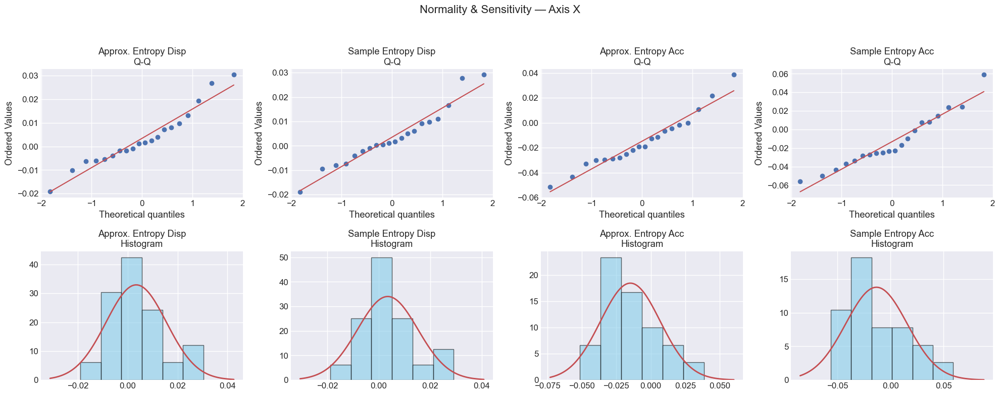


=== Axis Z (20 subjects) ===

--- Approx. Entropy Disp (n=20) ---
 Before: mean=0.356, SD=0.035
 After:  mean=0.363, SD=0.036
 Shapiro–Wilk p=0.835 → Paired t-test
 Paired t-test: t=-2.071, p=0.052
 Mean Δ=-0.007, SD=0.015
 Cohen's d=-0.463
 Sensitivity analyses:
   [Z ap_entropy_disp] Bootstrap 95% CI on Δmean: [-0.013, -0.000]
   [Z ap_entropy_disp] LOO t-test p-range:    [0.013, 0.102]
   [Z ap_entropy_disp] LOO Wilcoxon p-range: [0.009, 0.073]

--- Sample Entropy Disp (n=20) ---
 Before: mean=0.349, SD=0.035
 After:  mean=0.348, SD=0.031
 Shapiro–Wilk p=0.336 → Paired t-test
 Paired t-test: t=0.467, p=0.646
 Mean Δ=0.001, SD=0.013
 Cohen's d=0.104
 Sensitivity analyses:
   [Z sa_entropy_disp] Bootstrap 95% CI on Δmean: [-0.004, 0.007]
   [Z sa_entropy_disp] LOO t-test p-range:    [0.411, 0.992]
   [Z sa_entropy_disp] LOO Wilcoxon p-range: [0.709, 1.000]

--- Approx. Entropy Acc (n=20) ---
 Before: mean=0.494, SD=0.056
 After:  mean=0.492, SD=0.047
 Shapiro–Wilk p=0.566 → Paired t-

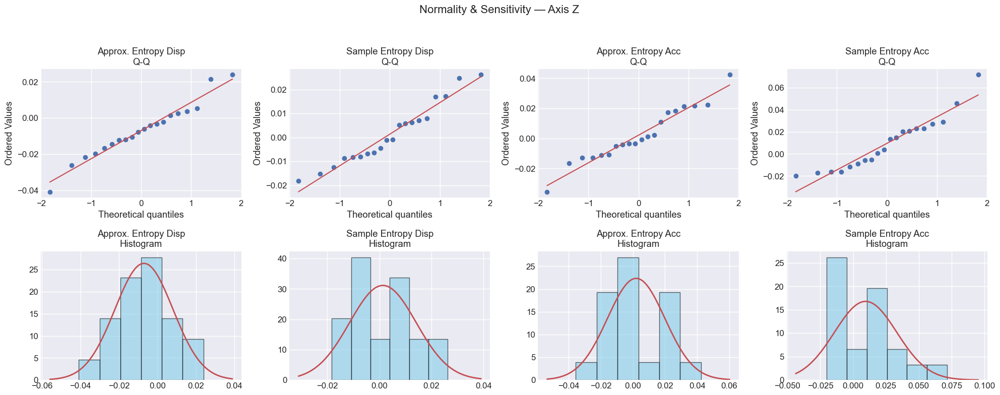

In [195]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import shapiro, ttest_rel, wilcoxon
import warnings
warnings.filterwarnings('ignore')

def sensitivity_checks(before_vals, after_vals, label=""):
    diffs = before_vals - after_vals
    n = len(diffs)
    if n < 2:
        print(f"   [{label}] Not enough data for sensitivity.")
        return
    boots = np.random.choice(diffs, (10000, n), replace=True)
    lo, hi = np.percentile(boots.mean(axis=1), [2.5, 97.5])
    print(f"   [{label}] Bootstrap 95% CI on Δmean: [{lo:.3f}, {hi:.3f}]")
    p_t, p_w = [], []
    for i in range(n):
        lb = np.delete(before_vals, i)
        la = np.delete(after_vals,  i)
        if len(lb) > 1:
            p_t.append(ttest_rel(lb, la).pvalue)
            p_w.append(wilcoxon(lb, la).pvalue)
    if p_t and p_w:
        print(f"   [{label}] LOO t-test p-range:    [{np.min(p_t):.3f}, {np.max(p_t):.3f}]")
        print(f"   [{label}] LOO Wilcoxon p-range: [{np.min(p_w):.3f}, {np.max(p_w):.3f}]")

def analyze_entropy_by_axis(df):
    
    axes = sorted(df['axis'].unique())
    metrics = [
        ('ap_entropy_disp', 'Approx. Entropy Disp'),
        ('sa_entropy_disp', 'Sample Entropy Disp'),
        ('ap_entropy_acc',  'Approx. Entropy Acc'),
        ('sa_entropy_acc',  'Sample Entropy Acc'),
    ]
    for axis in axes:
        sub = df[df['axis'] == axis]
        common_subjects = set(sub[sub['condition']=='Before']['subject']).intersection(
                          sub[sub['condition']=='After']['subject'])
        print(f"\n=== Axis {axis.upper()} ({len(common_subjects)} subjects) ===")
        fig, axes_plot = plt.subplots(2, len(metrics), figsize=(5*len(metrics), 8))
        plt.suptitle(f'Normality & Sensitivity — Axis {axis.upper()}', fontsize=16)
        for idx, (col, label) in enumerate(metrics):
            before = sub[sub['condition']=='Before'].set_index('subject')[col]
            after  = sub[sub['condition']=='After' ].set_index('subject')[col]
            common = list(common_subjects)
            bvals = before.loc[common].dropna().values
            avals = after.loc[common].dropna().values
            diffs = bvals - avals
            
            print(f"\n--- {label} (n={len(diffs)}) ---")
            # Descriptive by condition
            if len(bvals)>0:
                print(f" Before: mean={bvals.mean():.3f}, SD={bvals.std(ddof=1):.3f}")
            if len(avals)>0:
                print(f" After:  mean={avals.mean():.3f}, SD={avals.std(ddof=1):.3f}")
            
            # Normality test
            W, p_sw = shapiro(diffs) if len(diffs)>=3 else (np.nan, np.nan)
            normal = (p_sw > 0.05)
            test_name = "Paired t-test" if normal else "Wilcoxon signed-rank"
            print(f" Shapiro–Wilk p={p_sw:.3f} → {test_name}")
            
            # Paired test
            if normal:
                t, pval = ttest_rel(bvals, avals)
                print(f" Paired t-test: t={t:.3f}, p={pval:.3f}")
            else:
                w, pval = wilcoxon(bvals, avals)
                print(f" Wilcoxon: W={w:.3f}, p={pval:.3f}")
            
            print(f" Mean Δ={diffs.mean():.3f}, SD={diffs.std(ddof=1):.3f}")
            cohen_d = diffs.mean() / diffs.std(ddof=1) if diffs.std(ddof=1) > 0 else 0
            print(f" Cohen's d={cohen_d:.3f}")
            # Q-Q plot
            ax_qq = axes_plot[0, idx]
            if len(diffs)>0:
                stats.probplot(diffs, dist="norm", plot=ax_qq)
            ax_qq.set_title(f"{label}\nQ-Q")
            
            # Histogram
            ax_hist = axes_plot[1, idx]
            if len(diffs)>0:
                ax_hist.hist(diffs, bins=min(15, max(5,len(diffs)//3)), density=True,
                             color='skyblue', edgecolor='black', alpha=0.6)
                mu, sigma = diffs.mean(), diffs.std(ddof=1)
                x = np.linspace(diffs.min()-sigma, diffs.max()+sigma, 100)
                ax_hist.plot(x, stats.norm.pdf(x, mu, sigma), 'r-', lw=2)
            ax_hist.set_title(f"{label}\nHistogram")
            
            print(" Sensitivity analyses:")
            sensitivity_checks(bvals, avals, label=f"{axis.upper()} {col}")
        plt.tight_layout(rect=[0,0,1,0.95])
        plt.show()

analyze_entropy_by_axis(df_elderly_entropy)

## Plotting Consolidated Young and Elderly 

#### Simple

Successfully loaded both cohort files
Young data shape: (32, 9)
Elderly data shape: (80, 9)


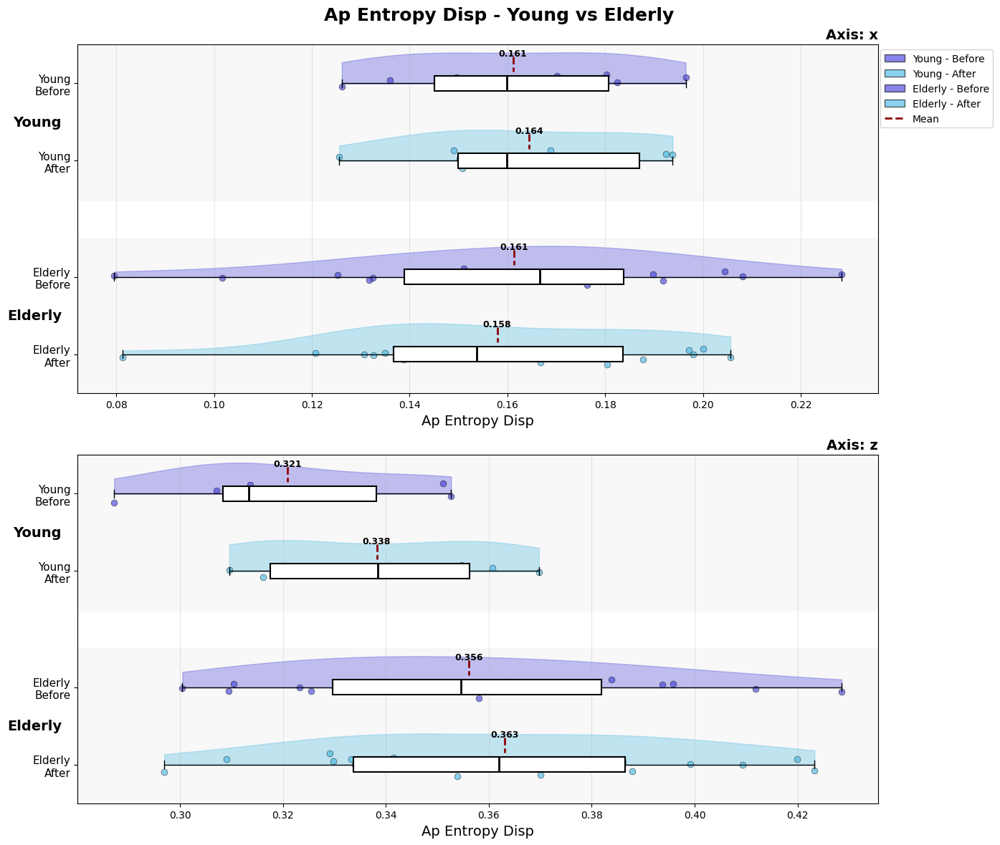


DETAILED STATISTICS

YOUNG:

  Before:
    N: 16
    Mean: 0.2410
    Median: 0.2418
    Std: 0.0857
    Range: [0.1261, 0.3527]

  After:
    N: 16
    Mean: 0.2514
    Median: 0.2517
    Std: 0.0926
    Range: [0.1256, 0.3697]

ELDERLY:

  Before:
    N: 40
    Mean: 0.2587
    Median: 0.2644
    Std: 0.1048
    Range: [0.0796, 0.4285]

  After:
    N: 40
    Mean: 0.2605
    Median: 0.2513
    Std: 0.1093
    Range: [0.0813, 0.4233]

BETWEEN-COHORT COMPARISONS

Before:
  Young vs Elderly: t = -0.5979, p = 0.5524
  Cohen's d: -0.1769

After:
  Young vs Elderly: t = -0.2943, p = 0.7697
  Cohen's d: -0.0870


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy import stats

def create_two_cohort_horizontal_rain_plots(file_path1, file_path2, 
                                           cohort1_name='Young', 
                                           cohort2_name='Elderly',
                                           subject_col='subject', 
                                           condition_col='condition', 
                                           value_col='lyapunov_exponent',
                                           axis_col='axis',
                                           sheet_name=0):
    """
    Create horizontal rain plots comparing two cohorts (e.g., Young vs Elderly) 
    with before/after conditions side by side.
    
    Parameters:
    -----------
    file_path1, file_path2 : str or Path
        Paths to the Excel files for cohort 1 and cohort 2
    cohort1_name, cohort2_name : str
        Names for the cohorts
    Other parameters as before...
    """
    
    # Read both Excel files
    try:
        df1 = pd.read_excel(file_path1, sheet_name=sheet_name)
        df2 = pd.read_excel(file_path2, sheet_name=sheet_name)
        print(f"Successfully loaded both cohort files")
        print(f"{cohort1_name} data shape: {df1.shape}")
        print(f"{cohort2_name} data shape: {df2.shape}")
    except Exception as e:
        print(f"Error reading Excel files: {e}")
        return
    
    # Add cohort column to each dataframe
    df1['cohort'] = cohort1_name
    df2['cohort'] = cohort2_name
    
    # Get unique conditions and axes
    # conditions = sorted(df1[condition_col].unique())
    conditions = ['Before', 'After']
    if axis_col in df1.columns:
        axes = sorted(df1[axis_col].unique())
        n_axes = len(axes)
    else:
        axes = ['All']
        n_axes = 1
    
    # Create figure with subplots for each axis
    fig, axs = plt.subplots(n_axes, 1, figsize=(14, 6*n_axes))
    
    if n_axes == 1:
        axs = [axs]
    
    # Colors for cohorts and conditions
    cohort_colors = {
        cohort1_name: {'before': '#3734db', 'after': '#3cb7e7'}, 
        cohort2_name: {'before': '#3734db', 'after': '#3cb7e7'}   
    }
    
   
    for ax_idx, (ax, axis_name) in enumerate(zip(axs, axes)):
        # Filter data for this axis
        if axis_name == 'All':
            axis_df1 = df1
            axis_df2 = df2
        else:
            axis_df1 = df1[df1[axis_col] == axis_name]
            axis_df2 = df2[df2[axis_col] == axis_name]
        
   
        plot_data = []
        plot_labels = []
        plot_colors = []
        plot_positions = []
        
        position = 0
        group_positions = {}
        
        # Process each cohort
        for cohort_idx, (df, cohort) in enumerate([(axis_df1, cohort1_name), 
                                                    (axis_df2, cohort2_name)]):
            group_start = position
            
            for cond_idx, condition in enumerate(conditions):
                # Get data for this condition
                cond_data = df[df[condition_col] == condition][value_col].dropna().values
                
                if len(cond_data) > 0:
                    plot_data.append(cond_data)
                    plot_labels.append(f"{cohort}\n{condition.title()}")
                    plot_colors.append(cohort_colors[cohort][condition.lower()])
                    plot_positions.append(position)
                    position += 1
                else:
                    position += 1  # Skip but maintain spacing
            
            group_positions[cohort] = (group_start, position - 1)
            position += 0.5  # Add space between cohorts
        
        # Create horizontal violin plots
        parts = ax.violinplot(plot_data, positions=plot_positions, vert=False,
                             widths=0.8, showmeans=False, showmedians=False, 
                             showextrema=False)
        
        # Color the violins
        for i, pc in enumerate(parts['bodies']):
            pc.set_facecolor(plot_colors[i])
            pc.set_alpha(0.3)
            pc.set_edgecolor(plot_colors[i])
            # Make half violin (bottom half)
            m = np.mean(pc.get_paths()[0].vertices[:, 1])
            # pc.get_paths()[0].vertices[:, 1] = np.clip(pc.get_paths()[0].vertices[:, 1], m, np.inf)
            pc.get_paths()[0].vertices[:, 1] = np.clip(pc.get_paths()[0].vertices[:, 1], -np.inf, m)
        # Add box plots
        bp = ax.boxplot(plot_data, positions=plot_positions, vert=False,
                       widths=0.2, showfliers=False, patch_artist=True)
        
        for i, (box, median) in enumerate(zip(bp['boxes'], bp['medians'])):
            box.set_facecolor('white')
            box.set_edgecolor('black')
            box.set_linewidth(1.5)
            median.set_color('black')
            median.set_linewidth(2)
        
        # Add strip plots (rain drops)
        for i, (data, pos, color) in enumerate(zip(plot_data, plot_positions, plot_colors)):
            y_jitter = np.random.normal(0, 0.06, size=len(data))
            ax.scatter(data, np.full_like(data, pos) + y_jitter, 
                      alpha=0.6, s=40, color=color, edgecolor='black', linewidth=0.5)
            
            # Add mean line
            mean_val = np.mean(data)
            ax.vlines(mean_val, pos - 0.35, pos - 0.15, colors='darkred', 
                     linestyles='dashed', linewidth=2)
            
            # Add mean value text
            ax.text(mean_val, pos - 0.45, f'{mean_val:.3f}', 
                   ha='center', va='top', fontsize=9, fontweight='bold')
        
        # Add cohort separators and labels
        for cohort, (start, end) in group_positions.items():
            mid = (start + end) / 2
            ax.axhspan(start - 0.5, end + 0.5, alpha=0.05, color='gray')
            ax.text(ax.get_xlim()[0] - 0.02 * (ax.get_xlim()[1] - ax.get_xlim()[0]), 
                   mid, cohort, ha='right', va='center', fontsize=14, fontweight='bold')
        
        # Customize subplot
        ax.set_yticks(plot_positions)
        ax.set_yticklabels(plot_labels, fontsize=11)
        ax.set_xlabel(value_col.replace('_', ' ').title(), fontsize=14)
        
        if axis_name != 'All':
            ax.set_title(f'Axis: {axis_name}', fontsize=14, fontweight='bold', loc='right')
        
        ax.grid(axis='x', alpha=0.3)
        ax.invert_yaxis()  # Put first items at top
    
    # Main title
    plt.suptitle(f'{value_col.replace("_", " ").title()} - {cohort1_name} vs {cohort2_name}', 
                fontsize=18, fontweight='bold')
    
    # Add legend
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D
    legend_elements = []
    for cohort in [cohort1_name, cohort2_name]:
        for condition in conditions:
            legend_elements.append(
                Patch(facecolor=cohort_colors[cohort][condition.lower()], 
                      edgecolor='black', alpha=0.6,
                      label=f'{cohort} - {condition.title()}')
            )
    legend_elements.append(Line2D([0], [0], color='darkred', linestyle='--', 
                                  linewidth=2, label='Mean'))
    
    # legend outside the plot
    if n_axes == 1:
        axs[0].legend(handles=legend_elements, loc='center left', 
                     bbox_to_anchor=(1.02, 0.5), ncol=1)
    else:
        axs[0].legend(handles=legend_elements, loc='upper right', 
                     bbox_to_anchor=(1.15, 1), ncol=1)
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed statistics
    print("\n" + "="*60)
    print("DETAILED STATISTICS")
    print("="*60)
    
    for cohort, df in [(cohort1_name, df1), (cohort2_name, df2)]:
        print(f"\n{cohort.upper()}:")
        for condition in conditions:
            cond_data = df[df[condition_col] == condition][value_col].dropna()
            print(f"\n  {condition.title()}:")
            print(f"    N: {len(cond_data)}")
            print(f"    Mean: {cond_data.mean():.4f}")
            print(f"    Median: {cond_data.median():.4f}")
            print(f"    Std: {cond_data.std():.4f}")
            print(f"    Range: [{cond_data.min():.4f}, {cond_data.max():.4f}]")
    
    # Between-cohort comparisons
    print("\n" + "="*60)
    print("BETWEEN-COHORT COMPARISONS")
    print("="*60)
    
    for condition in conditions:
        print(f"\n{condition.title()}:")
        data2 = df2[df2[condition_col] == condition][value_col].dropna()
        data1 = df1[df1[condition_col] == condition][value_col].dropna()
        
        
        if len(data1) > 0 and len(data2) > 0:
            t_stat, p_val = stats.ttest_ind(data1, data2)
            print(f"  {cohort1_name} vs {cohort2_name}: t = {t_stat:.4f}, p = {p_val:.4f}")
            
            # Effect size (Cohen's d)
            pooled_std = np.sqrt(((len(data1)-1)*data1.std()**2 + (len(data2)-1)*data2.std()**2) / 
                                (len(data1) + len(data2) - 2))
            cohen_d = (data1.mean() - data2.mean()) / pooled_std
            print(f"  Cohen's d: {cohen_d:.4f}")

def analyze_two_cohorts(file_path1, file_path2, cohort1_name='Young', cohort2_name='Elderly'):
    """
    Analyze and plot two cohorts side by side.
    """
    create_two_cohort_horizontal_rain_plots(
        file_path1, file_path2,
        cohort1_name=cohort1_name,
        cohort2_name=cohort2_name,
        subject_col='subject',
        condition_col='condition',
        value_col='ap_entropy_disp',  # Example value column
        axis_col='axis'
    )

analyze_two_cohorts(df_young_entropy, df_elderly_entropy, 'Young', 'Elderly')
   

Successfully loaded both cohort files
Young data shape: (32, 9)
Elderly data shape: (80, 9)


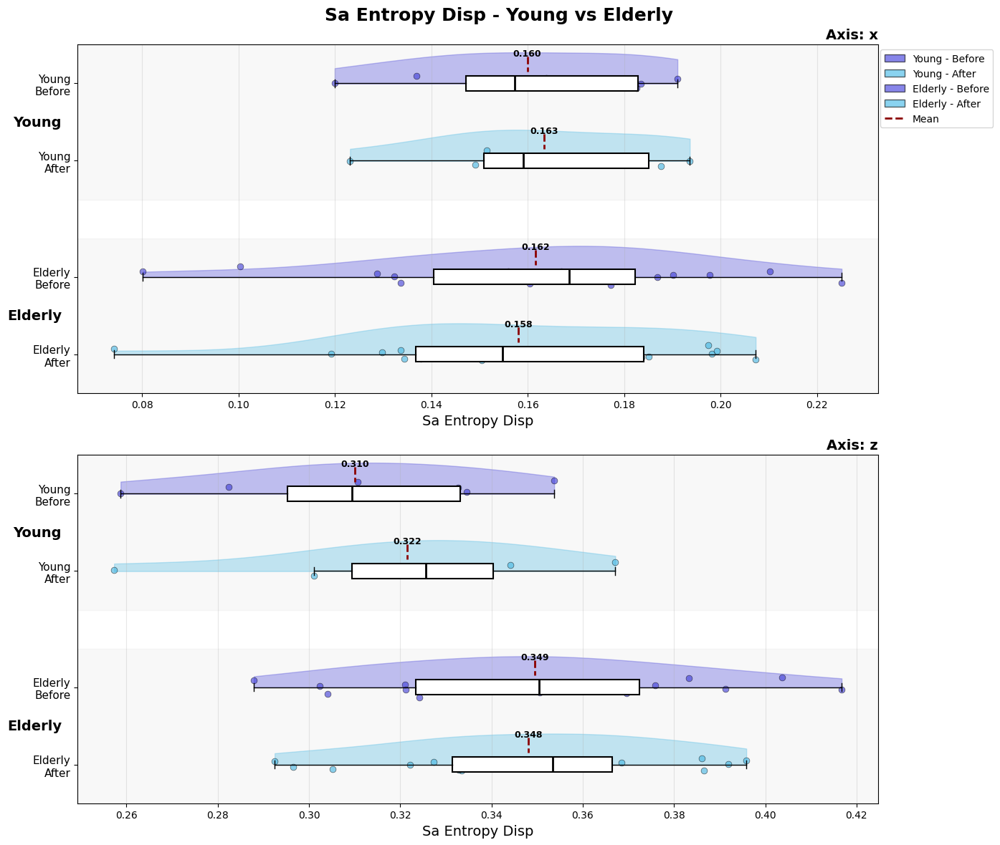


DETAILED STATISTICS

YOUNG:

  Before:
    N: 16
    Mean: 0.2350
    Median: 0.2249
    Std: 0.0821
    Range: [0.1199, 0.3537]

  After:
    N: 16
    Mean: 0.2425
    Median: 0.2254
    Std: 0.0863
    Range: [0.1231, 0.3671]

ELDERLY:

  Before:
    N: 40
    Mean: 0.2555
    Median: 0.2565
    Std: 0.1013
    Range: [0.0801, 0.4167]

  After:
    N: 40
    Mean: 0.2531
    Median: 0.2499
    Std: 0.1013
    Range: [0.0742, 0.3959]

BETWEEN-COHORT COMPARISONS

Before:
  Young vs Elderly: t = -0.7205, p = 0.4743
  Cohen's d: -0.2131

After:
  Young vs Elderly: t = -0.3695, p = 0.7132
  Cohen's d: -0.1093


In [ ]:
def analyze_two_cohorts(file_path1, file_path2, cohort1_name='Young', cohort2_name='Elderly'):
    """
    Analyze and plot cohorts side by side - consolidated
    """
    create_two_cohort_horizontal_rain_plots(
        file_path1, file_path2,
        cohort1_name=cohort1_name,
        cohort2_name=cohort2_name,
        subject_col='subject',
        condition_col='condition',
        value_col='sa_entropy_disp',  # Example value column
        axis_col='axis'
    )



analyze_two_cohorts(df_young_entropy, df_elderly_entropy, 'Young', 'Elderly')

### All entropies on one plot

Successfully loaded both cohort files
Young data shape: (32, 9)
Elderly data shape: (80, 9)


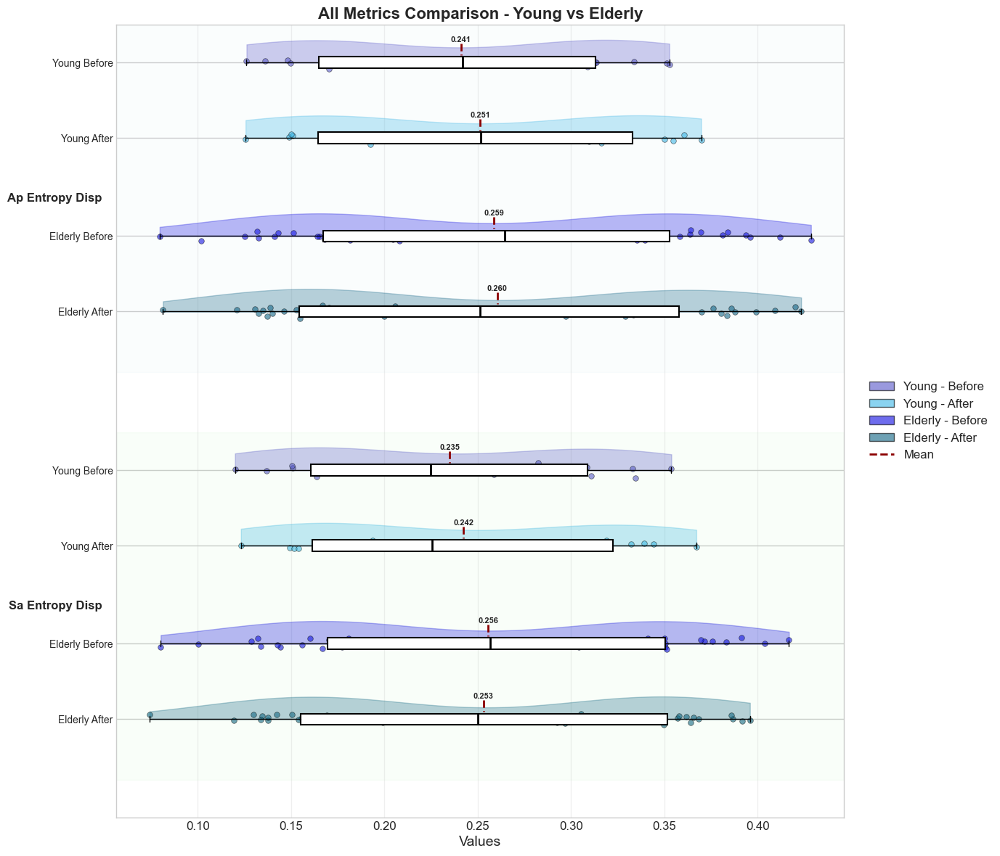


SUMMARY STATISTICS - ALL METRICS

AP ENTROPY DISP:
----------------------------------------
Young Before: 0.241 ± 0.086 (N=16)
Young After: 0.251 ± 0.093 (N=16)
Elderly Before: 0.259 ± 0.105 (N=40)
Elderly After: 0.260 ± 0.109 (N=40)

SA ENTROPY DISP:
----------------------------------------
Young Before: 0.235 ± 0.082 (N=16)
Young After: 0.242 ± 0.086 (N=16)
Elderly Before: 0.256 ± 0.101 (N=40)
Elderly After: 0.253 ± 0.101 (N=40)
Successfully loaded both cohort files
Young data shape: (32, 9)
Elderly data shape: (80, 9)


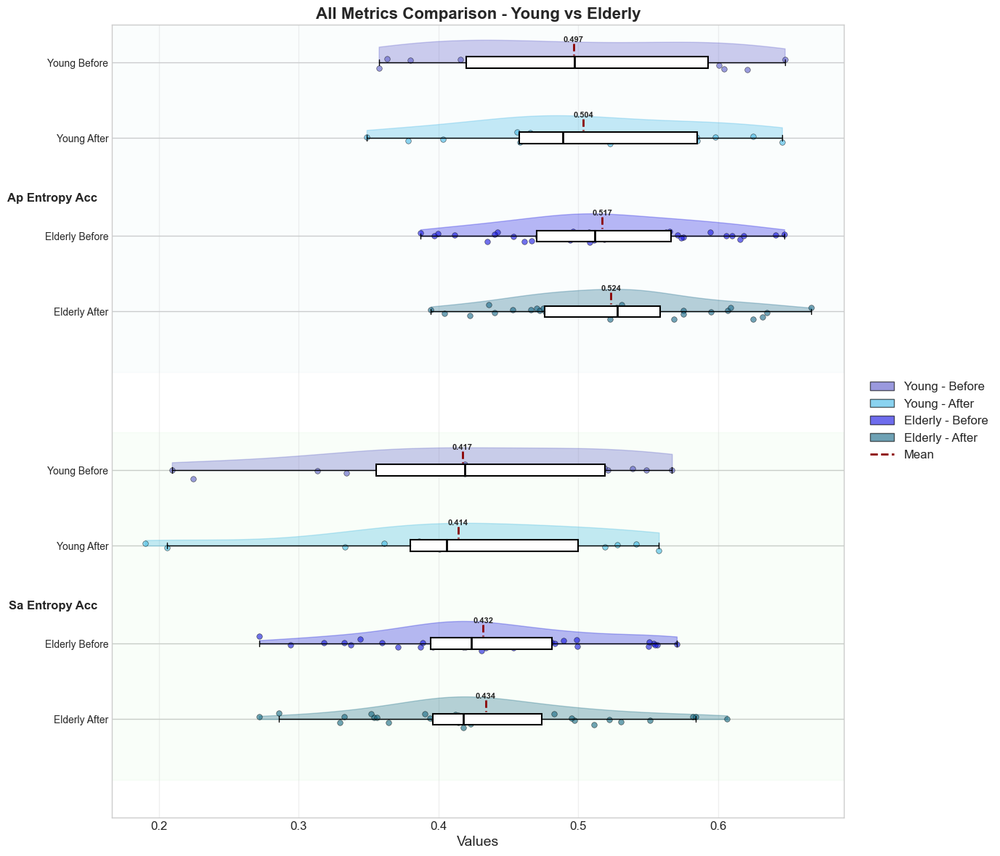


SUMMARY STATISTICS - ALL METRICS

AP ENTROPY ACC:
----------------------------------------
Young Before: 0.497 ± 0.098 (N=16)
Young After: 0.504 ± 0.087 (N=16)
Elderly Before: 0.517 ± 0.069 (N=40)
Elderly After: 0.524 ± 0.065 (N=40)

SA ENTROPY ACC:
----------------------------------------
Young Before: 0.417 ± 0.111 (N=16)
Young After: 0.414 ± 0.108 (N=16)
Elderly Before: 0.432 ± 0.075 (N=40)
Elderly After: 0.434 ± 0.077 (N=40)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy import stats

def plot_all_metrics(df1,df2, 
                                  cohort1_name='Young', 
                                  cohort2_name='Elderly',
                                  subject_col='subject', 
                                  condition_col='condition', 
                                  value_cols=['ap_entropy_disp', 'sample_entropy_disp', 'ap_entropy_acc', 'sa_entropy_acc'],
                                  sheet_name=0):
    """
    Create a single horizontal rain plot with all metrics for both cohorts.
    """

    
    # Add cohort column to each dataframe
    df1['cohort'] = cohort1_name
    df2['cohort'] = cohort2_name
    
    # Get unique conditions
    conditions = ['Before', 'After']
    
    # Create single figure
    fig, ax = plt.subplots(1, 1, figsize=(14, 12))
    
    # Colors for cohorts and conditions
    cohort_colors = {
        cohort1_name: {'before': "#5755c9", 'after': '#3cb7e7'},  # Blues
        cohort2_name: {'before': "#0d0ae2", 'after': "#0e6283"}   # Reds
    }
    
    # Prepare data structure
    plot_data = []
    plot_labels = []
    plot_colors = []
    plot_positions = []
    
    position = 0
    metric_positions = {}
    
    # Process each metric
    for metric_idx, value_col in enumerate(value_cols):
        metric_start = position
        
        # Process each cohort for this metric
        for cohort_idx, (df, cohort) in enumerate([(df1, cohort1_name), 
                                                    (df2, cohort2_name)]):
            
            for cond_idx, condition in enumerate(conditions):
                # Get data for this condition and metric
                if value_col in df.columns:
                    cond_data = df[df[condition_col] == condition][value_col].dropna().values
                else:
                    print(f"Warning: Column {value_col} not found in {cohort} data")
                    cond_data = []
                
                if len(cond_data) > 0:
                    plot_data.append(cond_data)
                    plot_labels.append(f"{cohort} {condition}")
                    plot_colors.append(cohort_colors[cohort][condition.lower()])
                    plot_positions.append(position)
                    position += 1
                else:
                    position += 1  
            
            position += 0.3  # space cohorts
        
        metric_positions[value_col] = (metric_start, position - 1)
        position += 0.8  # Larger space between metrics
    
    # Create horizontal violin plots
    if plot_data:
        parts = ax.violinplot(plot_data, positions=plot_positions, vert=False,
                             widths=0.6, showmeans=False, showmedians=False, 
                             showextrema=False)
        
        # Color the violins
        for i, pc in enumerate(parts['bodies']):
            pc.set_facecolor(plot_colors[i])
            pc.set_alpha(0.3)
            pc.set_edgecolor(plot_colors[i])
            # Make half violin (bottom half)
            m = np.mean(pc.get_paths()[0].vertices[:, 1])
            pc.get_paths()[0].vertices[:, 1] = np.clip(pc.get_paths()[0].vertices[:, 1], -np.inf, m)
        
        # Add box plots
        bp = ax.boxplot(plot_data, positions=plot_positions, vert=False,
                       widths=0.15, showfliers=False, patch_artist=True)
        
        for i, (box, median) in enumerate(zip(bp['boxes'], bp['medians'])):
            box.set_facecolor('white')
            box.set_edgecolor('black')
            box.set_linewidth(1.5)
            median.set_color('black')
            median.set_linewidth(2)
        
        # Add strip plots (rain drops)
        for i, (data, pos, color) in enumerate(zip(plot_data, plot_positions, plot_colors)):
            y_jitter = np.random.normal(0, 0.04, size=len(data))
            ax.scatter(data, np.full_like(data, pos) + y_jitter, 
                      alpha=0.6, s=30, color=color, edgecolor='black', linewidth=0.5)
            
            # Add mean line
            mean_val = np.mean(data)
            ax.vlines(mean_val, pos - 0.25, pos - 0.1, colors='darkred', 
                     linestyles='dashed', linewidth=2)
            
            # Add mean value text
            ax.text(mean_val, pos - 0.35, f'{mean_val:.3f}', 
                   ha='center', va='top', fontsize=8, fontweight='bold')
        
        # Add metric separators and labels
        for metric, (start, end) in metric_positions.items():
            mid = (start + end) / 2
            # Add background color for each metric group
            ax.axhspan(start - 0.5, end + 0.5, alpha=0.05, 
                      color=['lightblue', 'lightgreen', 'lightyellow', 'lightpink'][list(metric_positions.keys()).index(metric)])
            
            # Add metric label on the left
            ax.text(ax.get_xlim()[0] - 0.02 * (ax.get_xlim()[1] - ax.get_xlim()[0]), 
                   mid, metric.replace('_', ' ').title(), ha='right', va='center', 
                   fontsize=12, fontweight='bold', rotation=0)
        
        # Customize plot
        ax.set_yticks(plot_positions)
        ax.set_yticklabels(plot_labels, fontsize=10)
        ax.set_xlabel('Values', fontsize=14)
        ax.set_title(f'All Metrics Comparison - {cohort1_name} vs {cohort2_name}', 
                    fontsize=16, fontweight='bold')
        ax.grid(axis='x', alpha=0.3)
        ax.invert_yaxis()  # Put first items at top
    
    # Add legend
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D
    legend_elements = []
    for cohort in [cohort1_name, cohort2_name]:
        for condition in conditions:
            legend_elements.append(
                Patch(facecolor=cohort_colors[cohort][condition.lower()], 
                      edgecolor='black', alpha=0.6,
                      label=f'{cohort} - {condition.title()}')
            )
    legend_elements.append(Line2D([0], [0], color='darkred', linestyle='--', 
                                  linewidth=2, label='Mean'))
    
    # Place legend
    ax.legend(handles=legend_elements, loc='center left', 
             bbox_to_anchor=(1.02, 0.5), ncol=1)
    
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print("\n" + "="*80)
    print("SUMMARY STATISTICS - ALL METRICS")
    print("="*80)
    
    for value_col in value_cols:
        print(f"\n{value_col.upper().replace('_', ' ')}:")
        print("-" * 40)
        
        for cohort, df in [(cohort1_name, df1), (cohort2_name, df2)]:
            for condition in conditions:
                if value_col in df.columns:
                    cond_data = df[df[condition_col] == condition][value_col].dropna()
                    if len(cond_data) > 0:
                        print(f"{cohort} {condition}: {cond_data.mean():.3f} ± {cond_data.std():.3f} (N={len(cond_data)})")


def plot_all_metrics_single_plot(file_path1, file_path2, 
                                 cohort1_name='Young', cohort2_name='Elderly',
                                 metrics=['ap_entropy_disp', 'sample_entropy_disp', 'lyapunov_exponent', 'stride_duration']):
    """
    Create a single plot with all metrics for both cohorts.
    """
    plot_all_metrics(
        file_path1, file_path2,
        cohort1_name=cohort1_name,
        cohort2_name=cohort2_name,
        subject_col='subject',
        condition_col='condition',
        value_cols=metrics
    )



metrics_to_plot = ['ap_entropy_disp',	'sa_entropy_disp']
metrics_to_plot_2 = ['ap_entropy_acc',	'sa_entropy_acc']

plot_all_metrics_single_plot(df_young_entropy, df_elderly_entropy, 'Young', 'Elderly', metrics_to_plot)
plot_all_metrics_single_plot(df_young_entropy, df_elderly_entropy, 'Young', 'Elderly', metrics_to_plot_2)

## CGA

In [196]:
df_cga_entropy = pd.read_excel(cwd.parent / ".." / "results" / "CGA" / "CGA_Entropy.xlsx")

### Rain plots

#### by patient

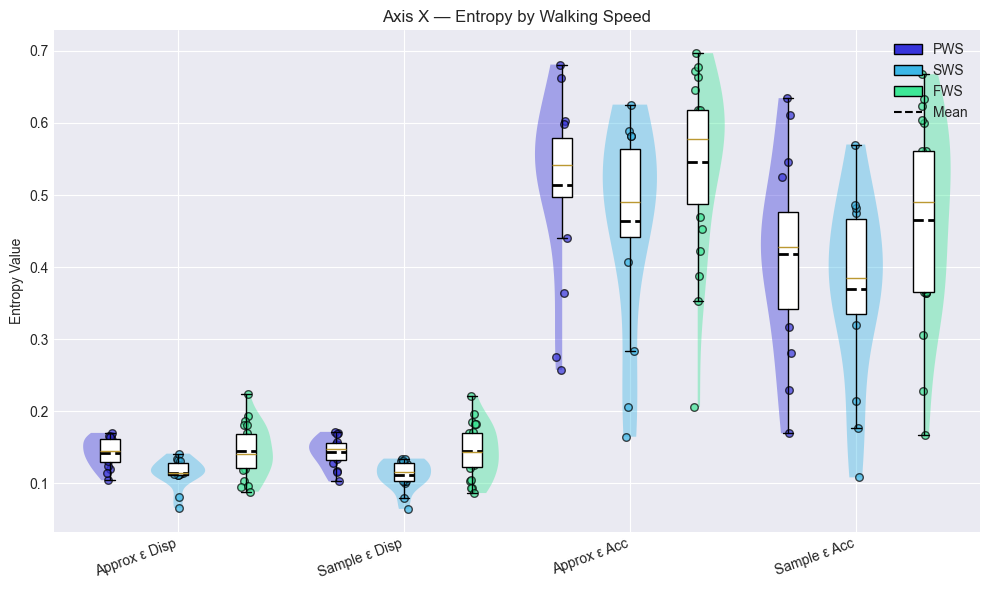

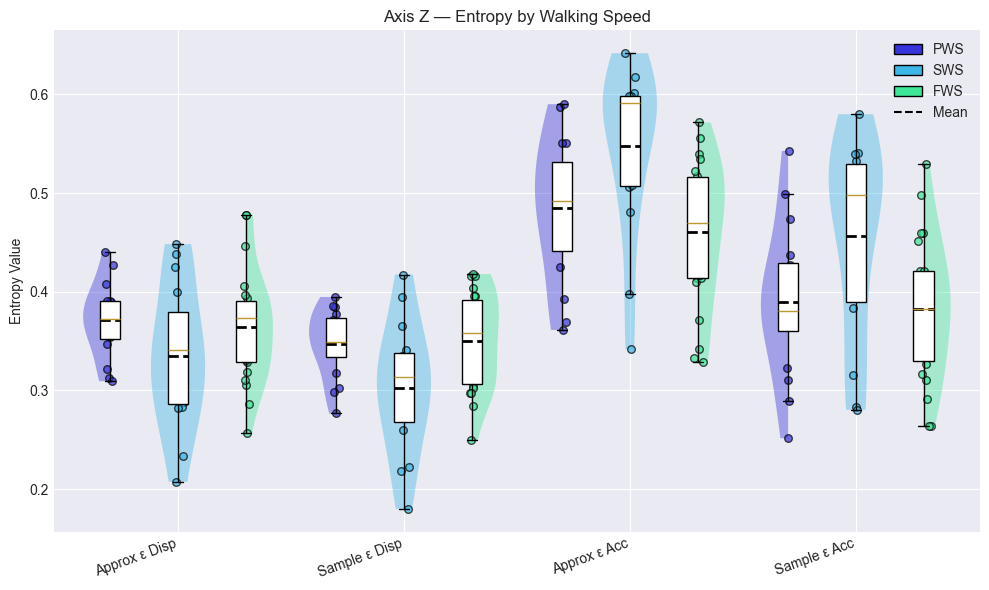

In [ ]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def rain_plot_by_speed_axis(df, axis='x'):
    """
    Creates a rain plot, by axis
    """
    
    df_axis = df[df['axis'] == axis]

    metrics = [
        ('ap_entropy_disp', 'Approx ε Disp'),
        ('sa_entropy_disp', 'Sample ε Disp'),
        ('ap_entropy_acc',  'Approx ε Acc'),
        ('sa_entropy_acc',  'Sample ε Acc'),
    ]
    speeds = ['PWS', 'SWS', 'FWS']
    colors = {'PWS': "#3734db", 'SWS': "#3cb7e7", 'FWS': "#3de796"}
    
    group_spacing = 2.0    
    offsets      = {'PWS': -0.6, 'SWS': 0.0, 'FWS': +0.6}  # within‐group separation
    width        = 0.6      # base violin width

    fig, ax = plt.subplots(figsize=(10, 6))

    for i, (col, label) in enumerate(metrics):
        base_pos = i * group_spacing
        for speed in speeds:
            vals = df_axis[df_axis['walking_speed'] == speed][col].dropna().values
            if len(vals) == 0:
                continue
            pos = base_pos + offsets[speed]

            # half‐violin (slightly narrower)
            parts = ax.violinplot(
                [vals], positions=[pos], widths=width * 0.8,
                showmeans=False, showmedians=False, showextrema=False
            )
            for pc in parts['bodies']:
                verts = pc.get_paths()[0].vertices
                mx = verts[:, 0].mean()
                if speed == 'PWS':
                    verts[:, 0] = np.clip(verts[:, 0], -np.inf, mx)
                elif speed == 'FWS':
                    verts[:, 0] = np.clip(verts[:, 0], mx, np.inf)
                pc.set_facecolor(colors[speed])
                pc.set_alpha(0.4)

            # boxplot
            bp = ax.boxplot(
                [vals], positions=[pos], widths=width * 0.3,
                patch_artist=True, showfliers=False
            )
            bp['boxes'][0].set_facecolor('white')
            bp['boxes'][0].set_edgecolor('black')

            # rain points
            xpts = np.random.normal(pos, 0.02, size=len(vals))
            ax.scatter(
                xpts, vals,
                color=colors[speed], edgecolor='k',
                alpha=0.7, s=30
            )

            # mean line
            ax.hlines(
                vals.mean(),
                pos - width * 0.15, pos + width * 0.15,
                colors='k', linestyles='--', linewidth=2
            )

    # xticks at each group's base_pos
    xticks = [i * group_spacing for i in range(len(metrics))]
    ax.set_xticks(xticks)
    ax.set_xticklabels([lbl for _, lbl in metrics], rotation=20, ha='right')
    ax.set_ylabel('Entropy Value')
    ax.set_title(f'Axis {axis.upper()} — Entropy by Walking Speed')

    # legend
    from matplotlib.patches import Patch
    legend_items = [Patch(facecolor=colors[s], edgecolor='k', label=s) 
                    for s in speeds] + [
                    plt.Line2D([0], [0], color='k', linestyle='--', label='Mean')]
    ax.legend(handles=legend_items, loc='upper right')

    plt.tight_layout()
    plt.show()

rain_plot_by_speed_axis(df_cga_entropy, axis='x')
rain_plot_by_speed_axis(df_cga_entropy, axis='z')


### Statistical testing

#### by patient

Running entropy speed sensitivity analysis with ANOVA by axis and LOO sensitivity...

ANALYZING METRIC: ap_entropy_disp

ENHANCED AP_ENTROPY_DISP SPEED SENSITIVITY ANALYSIS WITH ANOVA - CGA NEUROLOGICAL PATIENTS
Speed conditions: ['PWS', 'SWS', 'FWS']
Axes: ['x', 'z']

REPEATED MEASURES ANOVA ANALYSIS BY AXIS FOR ap_entropy_disp

AXIS X - ap_entropy_disp
H₀: μ_PWS = μ_SWS = μ_FWS (no difference in ap_entropy_disp across speeds)
H₁: At least one speed differs in ap_entropy_disp
Note: Lower entropy values typically indicate more regular/predictable gait
Patients with all 3 speeds: 13 / 18

Descriptive Statistics:
  PWS: Mean = 0.1436 ± 0.0217
  SWS: Mean = 0.1155 ± 0.0210
  FWS: Mean = 0.1426 ± 0.0383

Repeated Measures ANOVA:
               Anova
      F Value Num DF  Den DF Pr > F
-----------------------------------
speed  0.7313 2.0000 24.0000 0.4917



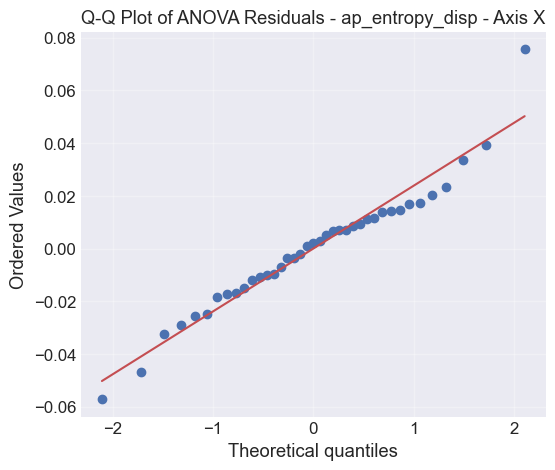


Inferential Statistics Summary:
  Friedman χ² = 3.231, p = 0.1988
  RM-ANOVA F = 0.731, p = 0.4917
  Residuals Shapiro-Wilk: W = 0.963, p = 0.2192
  Normality assumption: Met
→ Result: No significant speed effect
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

AXIS Z - ap_entropy_disp
H₀: μ_PWS = μ_SWS = μ_FWS (no difference in ap_entropy_disp across speeds)
H₁: At least one speed differs in ap_entropy_disp
Note: Lower entropy values typically indicate more regular/predictable gait
Patients with all 3 speeds: 13 / 18

Descriptive Statistics:
  PWS: Mean = 0.3721 ± 0.0414
  SWS: Mean = 0.3336 ± 0.0778
  FWS: Mean = 0.3571 ± 0.0629

Repeated Measures ANOVA:
               Anova
      F Value Num DF  Den DF Pr > F
-----------------------------------
speed  0.8920 2.0000 24.0000 0.4230



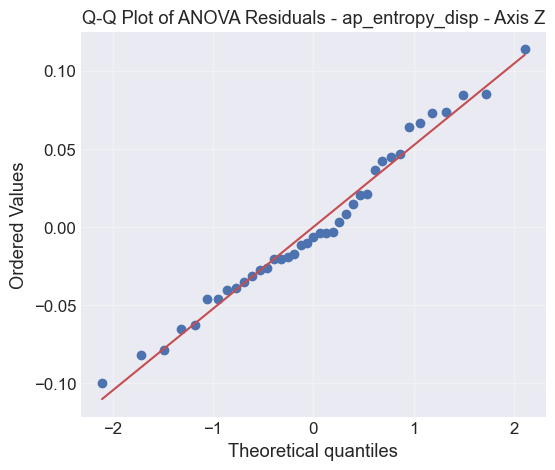


Inferential Statistics Summary:
  Friedman χ² = 4.769, p = 0.0921
  RM-ANOVA F = 0.892, p = 0.4230
  Residuals Shapiro-Wilk: W = 0.978, p = 0.6281
  Normality assumption: Met
→ Result: No significant speed effect
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

POST-HOC PAIRWISE COMPARISONS BY AXIS FOR ap_entropy_disp
Note: Using all available patients for each pairwise comparison
Bonferroni correction: α = 0.05/3 = 0.0167 for 3 comparisons

AXIS X - ap_entropy_disp - Pairwise Comparisons:

  PWS vs SWS (n=13 pairs):
    PWS Mean: 0.1436, SWS Mean: 0.1155
    Mean difference: 0.0281 ± 0.0266
    Test used: Paired t-test (Shapiro-Wilk p=0.8059)
    Test statistic: 3.8167
    p-value: 0.0025
    Cohen's d: 1.0586
    Result: SIGNIFICANT (Bonferroni corrected α=0.0167)
    Sensitivity analyses:
      [ap_entropy_disp Axis x PWS vs SWS] Bootstrap 95% CI on mean difference: [0.0146, 0.0421]
      [ap_entropy_disp Axis x PWS vs SWS] LOO t-test p-value range: [0.0010, 0.0061]
      [

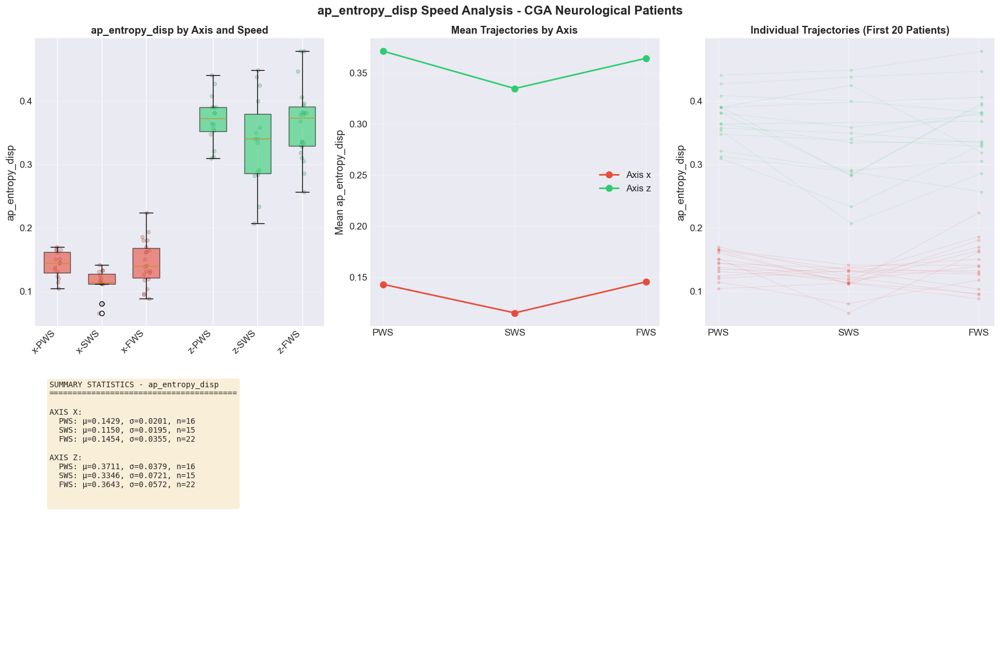


COMPREHENSIVE SUMMARY FOR ap_entropy_disp - CGA NEUROLOGICAL PATIENTS

REPEATED MEASURES ANOVA SUMMARY:
--------------------------------------------------
Axis     n     Friedman p   RM-ANOVA p   Significant
--------------------------------------------------
x        13    0.1988       0.4917       ns/ns
z        13    0.0921       0.4230       ns/ns

PAIRWISE COMPARISONS SUMMARY (Bonferroni corrected α=0.0167):
----------------------------------------------------------------------------------------------------
Axis     Comparison      n     Test                 p-value    Effect     Sig   LOO Stable
----------------------------------------------------------------------------------------------------
x        PWS vs SWS      13    Paired t-test        0.0025     d=1.059    *     100%
x        PWS vs FWS      16    Paired t-test        0.6710     d=0.108    ns    0%
x        SWS vs FWS      14    Paired t-test        0.0261     d=-0.671   ns    79%
z        PWS vs SWS      13    Paired 

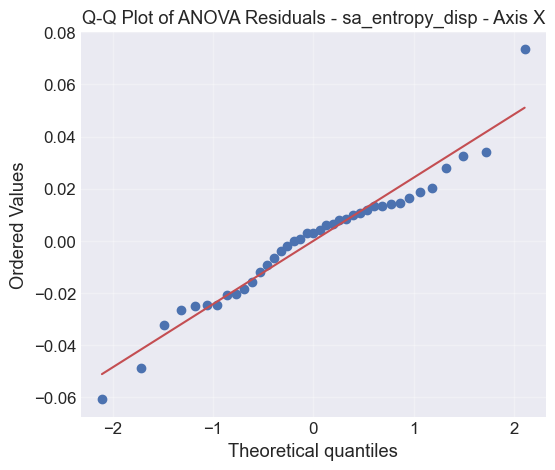


Inferential Statistics Summary:
  Friedman χ² = 4.308, p = 0.1160
  RM-ANOVA F = 0.668, p = 0.5218
  Residuals Shapiro-Wilk: W = 0.962, p = 0.2079
  Normality assumption: Met
→ Result: No significant speed effect
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

AXIS Z - sa_entropy_disp
H₀: μ_PWS = μ_SWS = μ_FWS (no difference in sa_entropy_disp across speeds)
H₁: At least one speed differs in sa_entropy_disp
Note: Lower entropy values typically indicate more regular/predictable gait
Patients with all 3 speeds: 13 / 18

Descriptive Statistics:
  PWS: Mean = 0.3483 ± 0.0368
  SWS: Mean = 0.3002 ± 0.0708
  FWS: Mean = 0.3443 ± 0.0516

Repeated Measures ANOVA:
               Anova
      F Value Num DF  Den DF Pr > F
-----------------------------------
speed  1.1774 2.0000 24.0000 0.3252



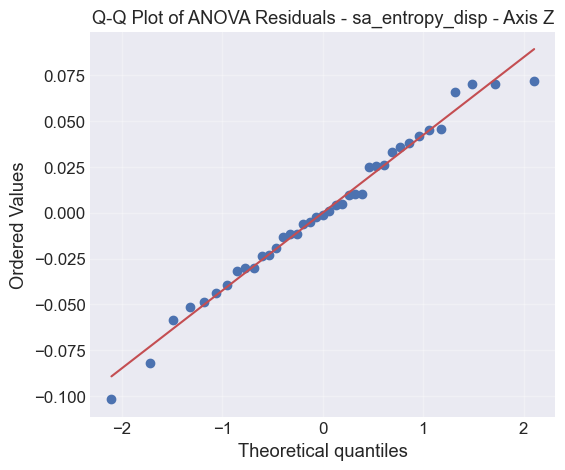


Inferential Statistics Summary:
  Friedman χ² = 7.385, p = 0.0249
  RM-ANOVA F = 1.177, p = 0.3252
  Residuals Shapiro-Wilk: W = 0.982, p = 0.7706
  Normality assumption: Met
→ Result: SIGNIFICANT speed effect (p < 0.05)
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

POST-HOC PAIRWISE COMPARISONS BY AXIS FOR sa_entropy_disp
Note: Using all available patients for each pairwise comparison
Bonferroni correction: α = 0.05/3 = 0.0167 for 3 comparisons

AXIS X - sa_entropy_disp - Pairwise Comparisons:

  PWS vs SWS (n=13 pairs):
    PWS Mean: 0.1437, SWS Mean: 0.1127
    Mean difference: 0.0311 ± 0.0280
    Test used: Paired t-test (Shapiro-Wilk p=0.9852)
    Test statistic: 4.0018
    p-value: 0.0018
    Cohen's d: 1.1099
    Result: SIGNIFICANT (Bonferroni corrected α=0.0167)
    Sensitivity analyses:
      [sa_entropy_disp Axis x PWS vs SWS] Bootstrap 95% CI on mean difference: [0.0168, 0.0456]
      [sa_entropy_disp Axis x PWS vs SWS] LOO t-test p-value range: [0.0005, 0.0044]

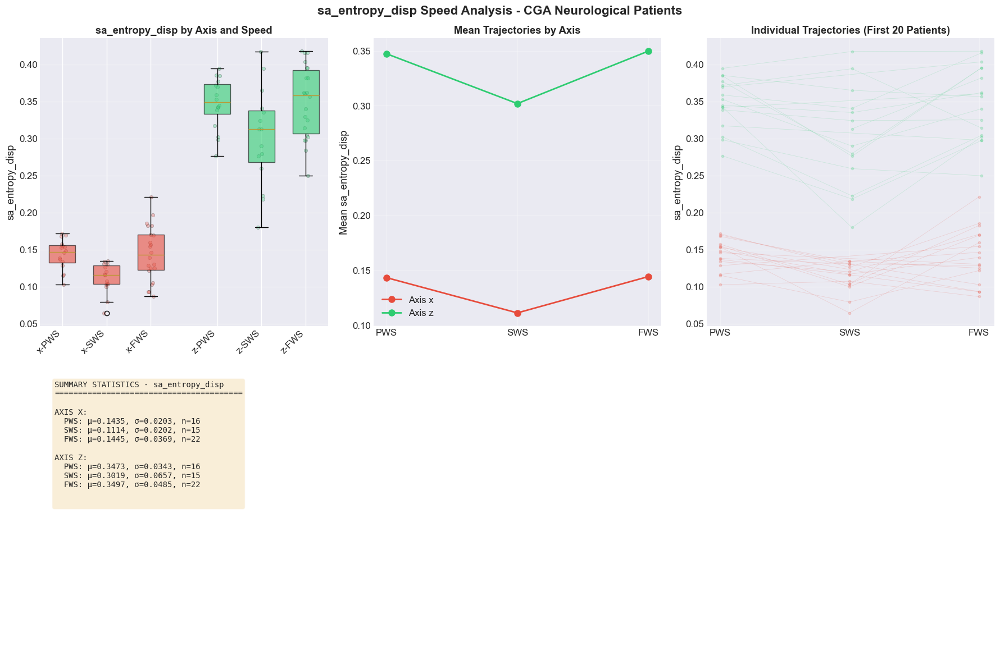


COMPREHENSIVE SUMMARY FOR sa_entropy_disp - CGA NEUROLOGICAL PATIENTS

REPEATED MEASURES ANOVA SUMMARY:
--------------------------------------------------
Axis     n     Friedman p   RM-ANOVA p   Significant
--------------------------------------------------
x        13    0.1160       0.5218       ns/ns
z        13    0.0249       0.3252       */ns

PAIRWISE COMPARISONS SUMMARY (Bonferroni corrected α=0.0167):
----------------------------------------------------------------------------------------------------
Axis     Comparison      n     Test                 p-value    Effect     Sig   LOO Stable
----------------------------------------------------------------------------------------------------
x        PWS vs SWS      13    Paired t-test        0.0018     d=1.110    *     100%
x        PWS vs FWS      16    Paired t-test        0.6308     d=0.123    ns    0%
x        SWS vs FWS      14    Paired t-test        0.0203     d=-0.706   ns    100%
z        PWS vs SWS      13    Paired 

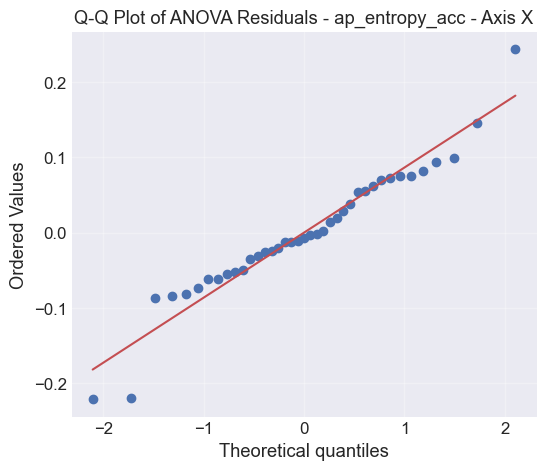


Inferential Statistics Summary:
  Friedman χ² = 12.923, p = 0.0016
  RM-ANOVA F = 0.120, p = 0.8872
  Residuals Shapiro-Wilk: W = 0.952, p = 0.0944
  Normality assumption: Met
→ Result: SIGNIFICANT speed effect (p < 0.05)
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

AXIS Z - ap_entropy_acc
H₀: μ_PWS = μ_SWS = μ_FWS (no difference in ap_entropy_acc across speeds)
H₁: At least one speed differs in ap_entropy_acc
Note: Lower entropy values typically indicate more regular/predictable gait
Patients with all 3 speeds: 13 / 18

Descriptive Statistics:
  PWS: Mean = 0.4876 ± 0.0777
  SWS: Mean = 0.5395 ± 0.0892
  FWS: Mean = 0.4452 ± 0.0895

Repeated Measures ANOVA:
               Anova
      F Value Num DF  Den DF Pr > F
-----------------------------------
speed  0.3150 2.0000 24.0000 0.7328



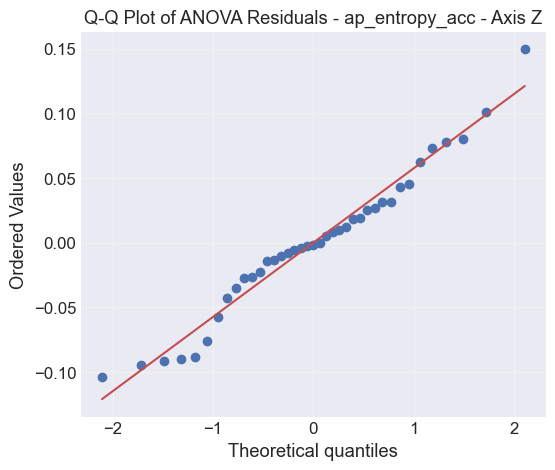


Inferential Statistics Summary:
  Friedman χ² = 19.077, p = 0.0001
  RM-ANOVA F = 0.315, p = 0.7328
  Residuals Shapiro-Wilk: W = 0.972, p = 0.4200
  Normality assumption: Met
→ Result: SIGNIFICANT speed effect (p < 0.05)
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

POST-HOC PAIRWISE COMPARISONS BY AXIS FOR ap_entropy_acc
Note: Using all available patients for each pairwise comparison
Bonferroni correction: α = 0.05/3 = 0.0167 for 3 comparisons

AXIS X - ap_entropy_acc - Pairwise Comparisons:

  PWS vs SWS (n=13 pairs):
    PWS Mean: 0.5049, SWS Mean: 0.4614
    Mean difference: 0.0435 ± 0.0544
    Test used: Paired t-test (Shapiro-Wilk p=0.2395)
    Test statistic: 2.8830
    p-value: 0.0138
    Cohen's d: 0.7996
    Result: SIGNIFICANT (Bonferroni corrected α=0.0167)
    Sensitivity analyses:
      [ap_entropy_acc Axis x PWS vs SWS] Bootstrap 95% CI on mean difference: [0.0144, 0.0707]
      [ap_entropy_acc Axis x PWS vs SWS] LOO t-test p-value range: [0.0042, 0.0297]
  

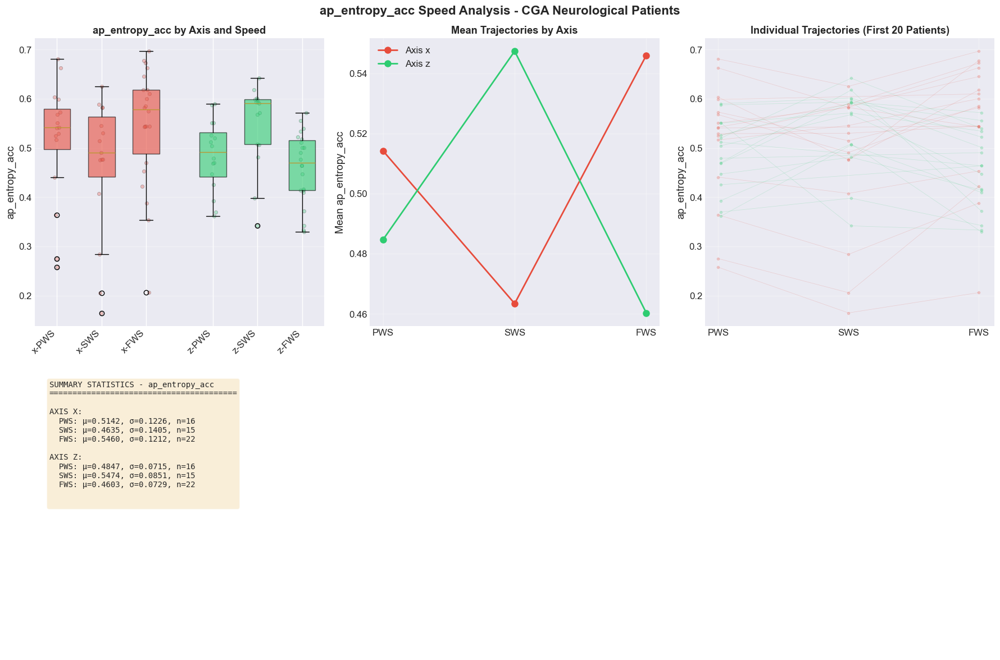


COMPREHENSIVE SUMMARY FOR ap_entropy_acc - CGA NEUROLOGICAL PATIENTS

REPEATED MEASURES ANOVA SUMMARY:
--------------------------------------------------
Axis     n     Friedman p   RM-ANOVA p   Significant
--------------------------------------------------
x        13    0.0016       0.8872       */ns
z        13    0.0001       0.7328       */ns

PAIRWISE COMPARISONS SUMMARY (Bonferroni corrected α=0.0167):
----------------------------------------------------------------------------------------------------
Axis     Comparison      n     Test                 p-value    Effect     Sig   LOO Stable
----------------------------------------------------------------------------------------------------
x        PWS vs SWS      13    Paired t-test        0.0138     d=0.800    *     100%
x        PWS vs FWS      16    Wilcoxon signed-rank 0.0034     d=-0.676   *     100%
x        SWS vs FWS      14    Paired t-test        0.0005     d=-1.239   *     100%
z        PWS vs SWS      13    Wilcoxo

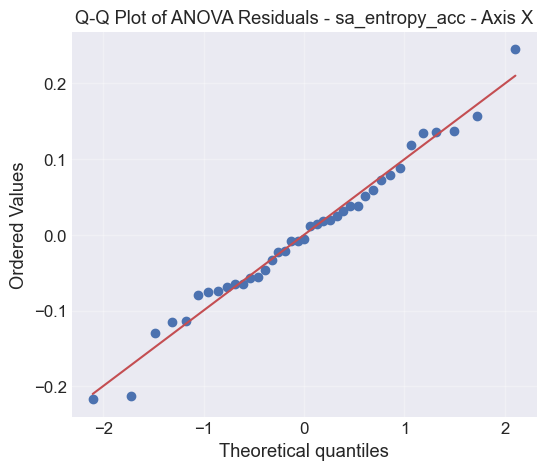


Inferential Statistics Summary:
  Friedman χ² = 10.308, p = 0.0058
  RM-ANOVA F = 0.079, p = 0.9241
  Residuals Shapiro-Wilk: W = 0.985, p = 0.8818
  Normality assumption: Met
→ Result: SIGNIFICANT speed effect (p < 0.05)
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

AXIS Z - sa_entropy_acc
H₀: μ_PWS = μ_SWS = μ_FWS (no difference in sa_entropy_acc across speeds)
H₁: At least one speed differs in sa_entropy_acc
Note: Lower entropy values typically indicate more regular/predictable gait
Patients with all 3 speeds: 13 / 18

Descriptive Statistics:
  PWS: Mean = 0.3959 ± 0.0789
  SWS: Mean = 0.4457 ± 0.1032
  FWS: Mean = 0.3805 ± 0.0796

Repeated Measures ANOVA:
               Anova
      F Value Num DF  Den DF Pr > F
-----------------------------------
speed  0.5210 2.0000 24.0000 0.6005



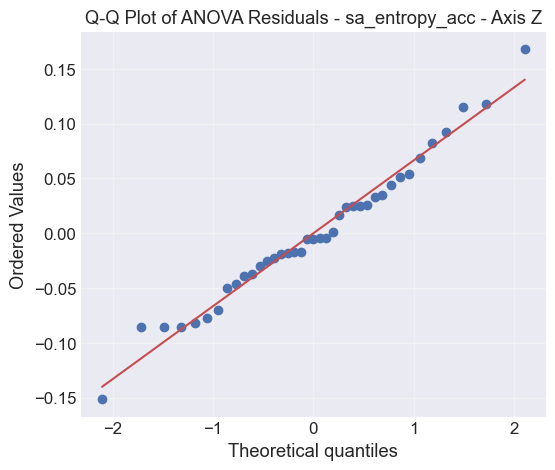


Inferential Statistics Summary:
  Friedman χ² = 8.000, p = 0.0183
  RM-ANOVA F = 0.521, p = 0.6005
  Residuals Shapiro-Wilk: W = 0.983, p = 0.8170
  Normality assumption: Met
→ Result: SIGNIFICANT speed effect (p < 0.05)
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

POST-HOC PAIRWISE COMPARISONS BY AXIS FOR sa_entropy_acc
Note: Using all available patients for each pairwise comparison
Bonferroni correction: α = 0.05/3 = 0.0167 for 3 comparisons

AXIS X - sa_entropy_acc - Pairwise Comparisons:

  PWS vs SWS (n=13 pairs):
    PWS Mean: 0.4070, SWS Mean: 0.3677
    Mean difference: 0.0393 ± 0.0705
    Test used: Paired t-test (Shapiro-Wilk p=0.3915)
    Test statistic: 2.0105
    p-value: 0.0674
    Cohen's d: 0.5576
    Result: NOT SIGNIFICANT after Bonferroni correction
    Sensitivity analyses:
      [sa_entropy_acc Axis x PWS vs SWS] Bootstrap 95% CI on mean difference: [0.0031, 0.0767]
      [sa_entropy_acc Axis x PWS vs SWS] LOO t-test p-value range: [0.0274, 0.1369]
   

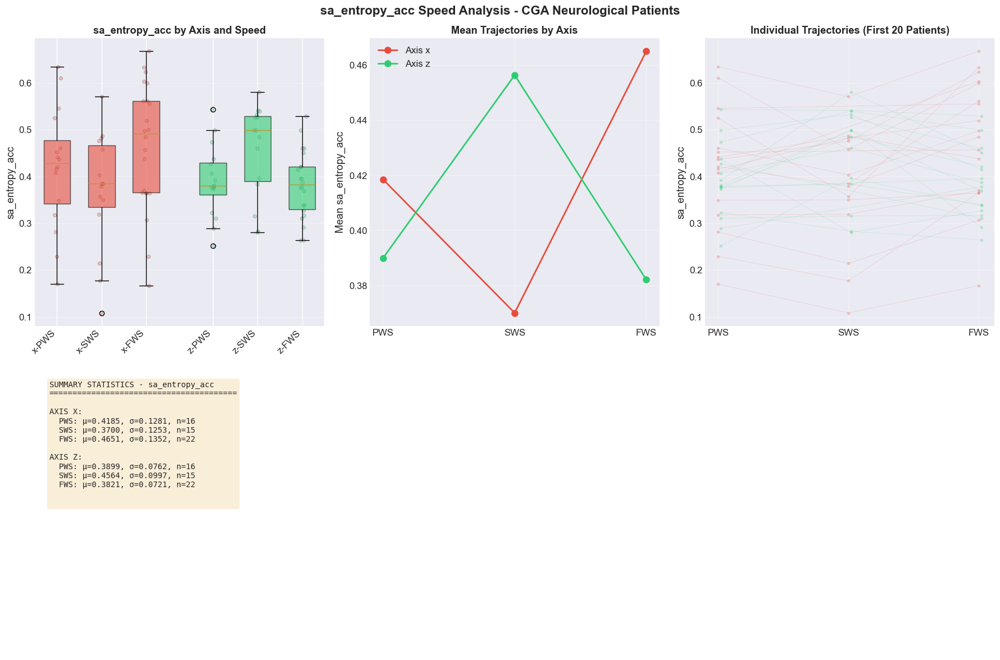


COMPREHENSIVE SUMMARY FOR sa_entropy_acc - CGA NEUROLOGICAL PATIENTS

REPEATED MEASURES ANOVA SUMMARY:
--------------------------------------------------
Axis     n     Friedman p   RM-ANOVA p   Significant
--------------------------------------------------
x        13    0.0058       0.9241       */ns
z        13    0.0183       0.6005       */ns

PAIRWISE COMPARISONS SUMMARY (Bonferroni corrected α=0.0167):
----------------------------------------------------------------------------------------------------
Axis     Comparison      n     Test                 p-value    Effect     Sig   LOO Stable
----------------------------------------------------------------------------------------------------
x        PWS vs SWS      13    Paired t-test        0.0674     d=0.558    ns    23%
x        PWS vs FWS      16    Wilcoxon signed-rank 0.0008     d=-0.888   *     100%
x        SWS vs FWS      14    Paired t-test        0.0004     d=-1.256   *     100%
z        PWS vs SWS      13    Paired t

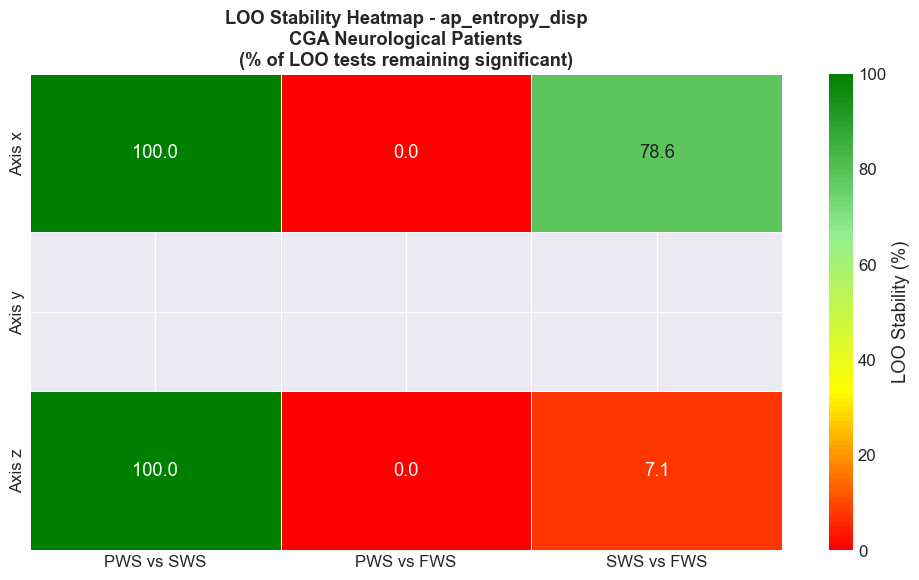


Creating LOO summary for sa_entropy_disp...

LEAVE-ONE-OUT SENSITIVITY SUMMARY - sa_entropy_disp - CGA Neurological Patients


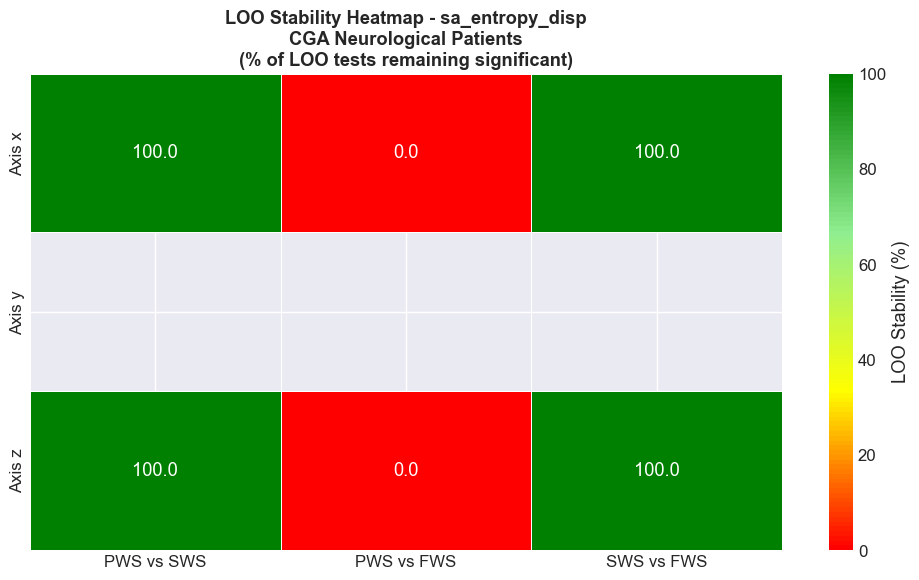


Creating LOO summary for ap_entropy_acc...

LEAVE-ONE-OUT SENSITIVITY SUMMARY - ap_entropy_acc - CGA Neurological Patients


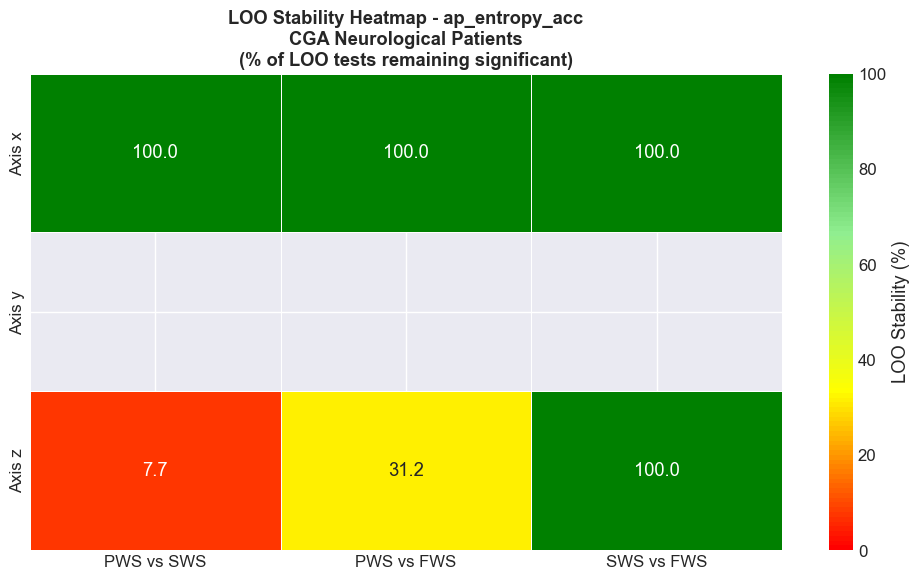


Creating LOO summary for sa_entropy_acc...

LEAVE-ONE-OUT SENSITIVITY SUMMARY - sa_entropy_acc - CGA Neurological Patients


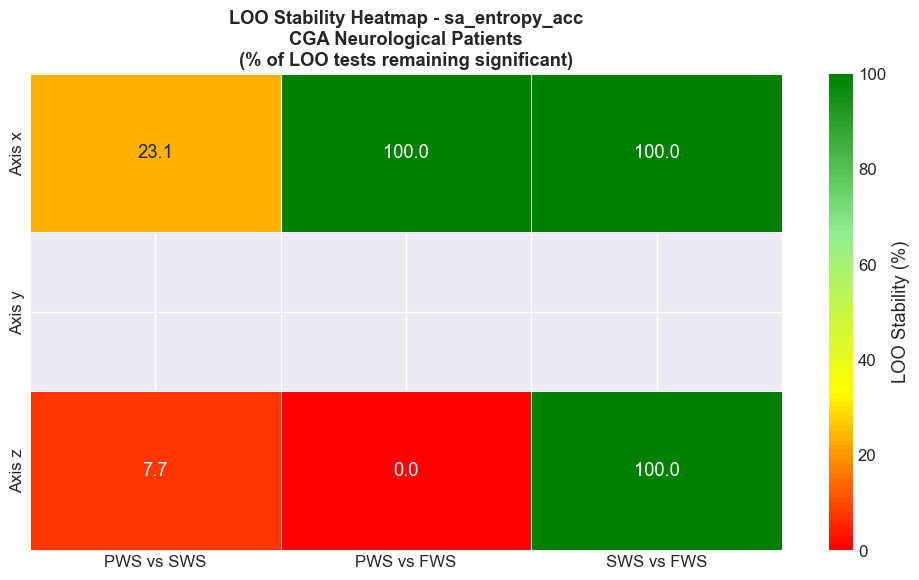

In [197]:
import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import ttest_rel, wilcoxon, shapiro, friedmanchisquare
import matplotlib.pyplot as plt
from statsmodels.stats.anova import AnovaRM
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

def analyze_entropy_speed_sensitivity_with_anova(results_entropy, cohort_name="Neurological Patients", 
                                                metrics_col=['ap_entropy_disp', 'sa_entropy_disp', 'ap_entropy_acc', 'sa_entropy_acc']):
    """
    Enhanced entropy speed sensitivity analysis for multiple metrics
    """
    
    if 'patient_id' not in results_entropy.columns:
        results_entropy['patient_id'] = results_entropy['subject'].str[1:]

    axes = sorted(results_entropy['axis'].unique())
    speed_conditions = results_entropy['walking_speed'].unique()
    
    # Store results for all metrics
    all_metrics_results = {}
    
    for metric in metrics_col:
        print(f"\n{'='*80}")
        print(f"ANALYZING METRIC: {metric}")
        print(f"{'='*80}")
        
        # Define hypotheses for entropy analysis
        hypothesis = {
            'H0': f'μ_PWS = μ_SWS = μ_FWS (no difference in {metric} across speeds)',
            'H1': f'At least one speed differs in {metric}',
            'interpretation': 'Lower entropy values typically indicate more regular/predictable gait'
        }
        
        print(f"\n{'='*80}")
        print(f"ENHANCED {metric.upper()} SPEED SENSITIVITY ANALYSIS WITH ANOVA - {cohort_name.upper()}")
        print(f"{'='*80}")
        print(f"Speed conditions: {list(speed_conditions)}")
        print(f"Axes: {axes}")
        
        # Store results for this metric
        anova_results = {}
        pairwise_results = {}
        
        # REPEATED MEASURES ANOVA BY AXIS
        print(f"\n{'='*70}")
        print(f"REPEATED MEASURES ANOVA ANALYSIS BY AXIS FOR {metric}")
        print(f"{'='*70}")
        
        for axis in axes:
            print(f"\n{'='*60}")
            print(f"AXIS {axis.upper()} - {metric}")
            print(f"{'='*60}")
            
            # Filter data for this axis
            axis_data = results_entropy[results_entropy['axis'] == axis]
            
            print(f"H₀: {hypothesis['H0']}")
            print(f"H₁: {hypothesis['H1']}")
            print(f"Note: {hypothesis['interpretation']}")
            
            all_patients = axis_data['patient_id'].unique()
            complete_patients = []
            
            for patient in all_patients:
                patient_data = axis_data[axis_data['patient_id'] == patient]
                speeds_present = patient_data['walking_speed'].unique()
                if set(['PWS', 'SWS', 'FWS']).issubset(set(speeds_present)):
                    complete_patients.append(patient)
            
            print(f"Patients with all 3 speeds: {len(complete_patients)} / {len(all_patients)}")
            
            if len(complete_patients) < 3:
                print("→ Insufficient data for ANOVA (n<3)")
                anova_results[axis] = {'status': 'insufficient_data'}
                continue
     
            pws_vals = []
            sws_vals = []
            fws_vals = []
            
            for patient in complete_patients:
                patient_data = axis_data[axis_data['patient_id'] == patient]
                # Check if metric exists in the data
                if metric not in patient_data.columns:
                    print(f"Warning: Metric {metric} not found in data")
                    continue
                pws_val = patient_data[patient_data['walking_speed'] == 'PWS'][metric].values
                sws_val = patient_data[patient_data['walking_speed'] == 'SWS'][metric].values
                fws_val = patient_data[patient_data['walking_speed'] == 'FWS'][metric].values
                
                if len(pws_val) > 0 and len(sws_val) > 0 and len(fws_val) > 0:
                    pws_vals.append(pws_val[0])
                    sws_vals.append(sws_val[0])
                    fws_vals.append(fws_val[0])
            
            if len(pws_vals) < 3:
                print("→ Insufficient valid data for ANOVA")
                anova_results[axis] = {'status': 'insufficient_data'}
                continue
            
            pws_vals = np.array(pws_vals)
            sws_vals = np.array(sws_vals)
            fws_vals = np.array(fws_vals)
            
            # Descriptive statistics
            print("\nDescriptive Statistics:")
            print(f"  PWS: Mean = {pws_vals.mean():.4f} ± {pws_vals.std(ddof=1):.4f}")
            print(f"  SWS: Mean = {sws_vals.mean():.4f} ± {sws_vals.std(ddof=1):.4f}")
            print(f"  FWS: Mean = {fws_vals.mean():.4f} ± {fws_vals.std(ddof=1):.4f}")
            
            # Friedman test (non-parametric)
            friedman_stat, friedman_p = friedmanchisquare(pws_vals, sws_vals, fws_vals)
            
            # Prepare data for RM-ANOVA
            df_long = pd.DataFrame({
                'patient_id': np.repeat(complete_patients[:len(pws_vals)], 3),
                'speed': ['PWS', 'SWS', 'FWS'] * len(pws_vals),
                'value': np.concatenate([pws_vals, sws_vals, fws_vals])
            })
            
            # Repeated Measures ANOVA
            try:
                aov = AnovaRM(df_long, depvar='value', subject='patient_id', within=['speed']).fit()
                anova_f = aov.anova_table['F Value'][0]
                anova_p = aov.anova_table['Pr > F'][0]
                anova_success = True
                
                print("\nRepeated Measures ANOVA:")
                print(aov.summary())
            except Exception as e:
                print(f"→ RM-ANOVA failed: {str(e)}")
                anova_success = False
                anova_f = np.nan
                anova_p = np.nan
            
            # Test ANOVA assumptions (residual normality)
            if anova_success:
                # Calculate residuals manually
                grand_mean = df_long['value'].mean()
                subj_mean = df_long.groupby('patient_id')['value'].transform('mean')
                speed_mean = df_long.groupby('speed')['value'].transform('mean')
                df_long['resid'] = df_long['value'] - (subj_mean + speed_mean - grand_mean)
                
                # Test residual normality
                residuals = df_long['resid'].values
                shapiro_stat, shapiro_p = shapiro(residuals)
                
                # Q-Q plot for residuals
                plt.figure(figsize=(6, 5))
                stats.probplot(residuals, dist="norm", plot=plt)
                plt.title(f"Q-Q Plot of ANOVA Residuals - {metric} - Axis {axis.upper()}")
                plt.grid(True, alpha=0.3)
                plt.show()
            else:
                shapiro_stat = np.nan
                shapiro_p = np.nan
            
            print(f"\nInferential Statistics Summary:")
            print(f"  Friedman χ² = {friedman_stat:.3f}, p = {friedman_p:.4f}")
            if anova_success:
                print(f"  RM-ANOVA F = {anova_f:.3f}, p = {anova_p:.4f}")
                print(f"  Residuals Shapiro-Wilk: W = {shapiro_stat:.3f}, p = {shapiro_p:.4f}")
                normality_assumption = "Met" if shapiro_p > 0.05 else "Violated"
                print(f"  Normality assumption: {normality_assumption}")
            
            # Store results
            anova_results[axis] = {
                'status': 'complete',
                'n_complete': len(pws_vals),
                'friedman_stat': friedman_stat,
                'friedman_p': friedman_p,
                'anova_f': anova_f,
                'anova_p': anova_p,
                'anova_success': anova_success,
                'shapiro_p': shapiro_p,
                'means': {
                    'PWS': pws_vals.mean(),
                    'SWS': sws_vals.mean(),
                    'FWS': fws_vals.mean()
                },
                'sds': {
                    'PWS': pws_vals.std(ddof=1),
                    'SWS': sws_vals.std(ddof=1),
                    'FWS': fws_vals.std(ddof=1)
                }
            }
            
            # Interpretation
            if friedman_p < 0.05:
                print("→ Result: SIGNIFICANT speed effect (p < 0.05)")
            else:
                print("→ Result: No significant speed effect")
                
            if anova_success and anova_p < 0.05:
                print("→ RM-ANOVA: SIGNIFICANT omnibus (reject H₀)")
            elif anova_success:
                print("→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)")
        
        # POST-HOC PAIRWISE COMPARISONS BY AXIS
        print(f"\n{'='*70}")
        print(f"POST-HOC PAIRWISE COMPARISONS BY AXIS FOR {metric}")
        print(f"{'='*70}")
        print("Note: Using all available patients for each pairwise comparison")
        print("Bonferroni correction: α = 0.05/3 = 0.0167 for 3 comparisons")
        
        comparisons = [('PWS', 'SWS'), ('PWS', 'FWS'), ('SWS', 'FWS')]
        
        for axis in axes:
            print(f"\n{'='*50}")
            print(f"AXIS {axis.upper()} - {metric} - Pairwise Comparisons:")
            print(f"{'='*50}")
            
            # Filter data for this axis
            axis_data = results_entropy[results_entropy['axis'] == axis]
            axis_patients = axis_data['patient_id'].unique()
            
            axis_comparisons = {}
            
            for speed1, speed2 in comparisons:
                # Find patients that have both speeds for this axis
                patients_with_pair = []
                
                for patient in axis_patients:
                    patient_data = axis_data[axis_data['patient_id'] == patient]
                    speeds_present = patient_data['walking_speed'].unique()
                    if speed1 in speeds_present and speed2 in speeds_present:
                        patients_with_pair.append(patient)
                
                # Get paired data
                vals1 = []
                vals2 = []
                
                for patient in patients_with_pair:
                    patient_data = axis_data[axis_data['patient_id'] == patient]
                    if metric not in patient_data.columns:
                        continue
                    val1 = patient_data[patient_data['walking_speed'] == speed1][metric].values
                    val2 = patient_data[patient_data['walking_speed'] == speed2][metric].values
                    
                    if len(val1) > 0 and len(val2) > 0:
                        vals1.append(val1[0])
                        vals2.append(val2[0])
                
                vals1 = np.array(vals1)
                vals2 = np.array(vals2)
                
                if len(vals1) >= 3:  
                    # Check normality and decide test
                    diff = vals1 - vals2
                    _, shapiro_p = shapiro(diff)
                    
                    if shapiro_p > 0.05:
                        # Use paired t-test
                        t_stat, p_value = ttest_rel(vals1, vals2)
                        test_used = "Paired t-test"
                        test_stat = t_stat
                    else:
                        # Use Wilcoxon signed-rank test
                        w_stat, p_value = wilcoxon(vals1, vals2)
                        test_used = "Wilcoxon signed-rank"
                        test_stat = w_stat
                    
                    # Effect size
                    cohen_d = np.mean(diff) / np.std(diff, ddof=1) if np.std(diff, ddof=1) > 0 else 0
                    
                    print(f"\n  {speed1} vs {speed2} (n={len(vals1)} pairs):")
                    print(f"    {speed1} Mean: {np.mean(vals1):.4f}, {speed2} Mean: {np.mean(vals2):.4f}")
                    print(f"    Mean difference: {np.mean(diff):.4f} ± {np.std(diff, ddof=1):.4f}")
                    print(f"    Test used: {test_used} (Shapiro-Wilk p={shapiro_p:.4f})")
                    print(f"    Test statistic: {test_stat:.4f}")
                    print(f"    p-value: {p_value:.4f}")
                    print(f"    Cohen's d: {cohen_d:.4f}")
                    
                    # Bonferroni corrected significance
                    if p_value < 0.0167:
                        print(f"    Result: SIGNIFICANT (Bonferroni corrected α=0.0167)")
                        significant = True
                    else:
                        print(f"    Result: NOT SIGNIFICANT after Bonferroni correction")
                        significant = False
                    
                    # Perform Leave-One-Out sensitivity analysis
                    print(f"    Sensitivity analyses:")
                    loo_metrics = _perform_loo_sensitivity_analysis(vals1, vals2, f"{metric} Axis {axis} {speed1} vs {speed2}")
                    
                    # Store results including LOO metrics
                    axis_comparisons[f"{speed1}_vs_{speed2}"] = {
                        'n_pairs': len(vals1),
                        'mean_diff': np.mean(diff),
                        'test_statistic': test_stat,
                        'p_value': p_value,
                        'cohen_d': cohen_d,
                        'test_type': test_used,
                        'significant': significant,
                        'bonferroni_significant': significant,
                        'normality_p': shapiro_p,
                        'loo_metrics': loo_metrics  # Store LOO results
                    }
                else:
                    print(f"\n  {speed1} vs {speed2}: Insufficient paired data (n={len(vals1)})")
                    axis_comparisons[f"{speed1}_vs_{speed2}"] = {
                        'n_pairs': len(vals1),
                        'status': 'insufficient_data'
                    }
            
            pairwise_results[axis] = axis_comparisons
        
        # PART 3: VISUALIZATION
        create_entropy_speed_plots(results_entropy, cohort_name, metric)
        
        # PART 4: SUMMARY
        print_entropy_speed_summary(anova_results, pairwise_results, cohort_name, metric)
        
        # Store results for this metric
        all_metrics_results[metric] = {
            'anova_results': anova_results,
            'pairwise_results': pairwise_results,
            'cohort_name': cohort_name
        }
    
    return all_metrics_results


def _perform_loo_sensitivity_analysis(before_vals, after_vals, label=""):
    """
    Perform Leave-One-Out sensitivity analysis
    """
    diffs = before_vals - after_vals
    n = len(diffs)
    
    if n < 2:
        print(f"      [{label}] Not enough data for sensitivity analysis.")
        return {}
    
    # Bootstrap 95% confidence interval for mean difference
    np.random.seed(42)  # For reproducibility
    n_bootstrap = 10000
    bootstrap_means = []
    
    for _ in range(n_bootstrap):
        bootstrap_sample = np.random.choice(diffs, size=n, replace=True)
        bootstrap_means.append(np.mean(bootstrap_sample))
    
    ci_lo, ci_hi = np.percentile(bootstrap_means, [2.5, 97.5])
    print(f"      [{label}] Bootstrap 95% CI on mean difference: [{ci_lo:.4f}, {ci_hi:.4f}]")
    
    loo_results = {
        'bootstrap_ci_low': ci_lo,
        'bootstrap_ci_high': ci_hi,
        'n_samples': n
    }
    
    # Leave-one-out sensitivity analysis
    if n >= 3:
        p_t_values = []
        p_w_values = []
        
        for i in range(n):
            loo_before = np.delete(before_vals, i)
            loo_after = np.delete(after_vals, i)
            
            if len(loo_before) > 1:
                try:
                    # Leave-one-out t-test
                    _, p_t = ttest_rel(loo_before, loo_after)
                    p_t_values.append(p_t)
                    
                    # Leave-one-out Wilcoxon test
                    _, p_w = wilcoxon(loo_before, loo_after)
                    p_w_values.append(p_w)
                except:
                    continue
        
        if p_t_values and p_w_values:
            print(f"      [{label}] LOO t-test p-value range: [{np.min(p_t_values):.4f}, {np.max(p_t_values):.4f}]")
            print(f"      [{label}] LOO Wilcoxon p-value range: [{np.min(p_w_values):.4f}, {np.max(p_w_values):.4f}]")
            
            # Check stability of significance
            significant_t = sum(1 for p in p_t_values if p < 0.05)
            significant_w = sum(1 for p in p_w_values if p < 0.05)
            print(f"      [{label}] LOO significance stability: t-test {significant_t}/{len(p_t_values)}, "
                  f"Wilcoxon {significant_w}/{len(p_w_values)}")
            
            # Check Bonferroni stability
            bonferroni_t = sum(1 for p in p_t_values if p < 0.0167)
            bonferroni_w = sum(1 for p in p_w_values if p < 0.0167)
            print(f"      [{label}] LOO Bonferroni stability: t-test {bonferroni_t}/{len(p_t_values)}, "
                  f"Wilcoxon {bonferroni_w}/{len(p_w_values)}")
            
            loo_results.update({
                'loo_t_p_min': np.min(p_t_values),
                'loo_t_p_max': np.max(p_t_values),
                'loo_w_p_min': np.min(p_w_values),
                'loo_w_p_max': np.max(p_w_values),
                'loo_t_sig_stable': significant_t,
                'loo_t_total': len(p_t_values),
                'loo_w_sig_stable': significant_w,
                'loo_w_total': len(p_w_values),
                'loo_t_bonf_stable': bonferroni_t,
                'loo_w_bonf_stable': bonferroni_w
            })
    
    return loo_results


def create_entropy_speed_plots(results_entropy, cohort_name, metric):
    """Create visualization plots for entropy speed sensitivity analysis"""
    
    axes = sorted(results_entropy['axis'].unique())
    speeds = ['PWS', 'SWS', 'FWS']
    colors = {'x': '#e74c3c', 'z': '#2ecc71', 'y': '#f39c12'}
 
    fig = plt.figure(figsize=(18, 12))
    fig.suptitle(f'{metric} Speed Analysis - {cohort_name}', fontsize=16, fontweight='bold')
    
    # Box plots by axis and speed
    ax1 = plt.subplot(2, 3, 1)
    
    positions = []
    data_to_plot = []
    labels = []
    box_colors = []
    
    pos = 0
    for axis in axes:
        for speed in speeds:
            speed_data = results_entropy[(results_entropy['axis'] == axis) & 
                                       (results_entropy['walking_speed'] == speed)][metric].dropna().values
            if len(speed_data) > 0:
                data_to_plot.append(speed_data)
                labels.append(f'{axis}-{speed}')
                box_colors.append(colors.get(axis, '#3498db'))
                positions.append(pos)
            pos += 1
        pos += 0.5  # Space between axes
    
    if data_to_plot:
        bp = ax1.boxplot(data_to_plot, positions=positions, widths=0.6, patch_artist=True)
        
        for patch, color in zip(bp['boxes'], box_colors):
            patch.set_facecolor(color)
            patch.set_alpha(0.6)
        
        for i, (data, pos, color) in enumerate(zip(data_to_plot, positions, box_colors)):
            jitter = np.random.normal(0, 0.04, size=len(data))
            ax1.scatter(np.full_like(data, pos) + jitter, data, 
                       alpha=0.3, s=20, color=color, edgecolors='black', linewidth=0.5)
        
        ax1.set_xticks(positions)
        ax1.set_xticklabels(labels, rotation=45, ha='right')
        ax1.set_ylabel(metric)
        ax1.set_title(f'{metric} by Axis and Speed', fontweight='bold')
        ax1.grid(axis='y', alpha=0.3)
    
    # Mean trajectories by axis
    ax2 = plt.subplot(2, 3, 2)
    
    for axis in axes:
        means = []
        for speed in speeds:
            mean_val = results_entropy[(results_entropy['axis'] == axis) & 
                                     (results_entropy['walking_speed'] == speed)][metric].dropna().mean()
            means.append(mean_val)
        
        if not any(np.isnan(means)):
            ax2.plot([0, 1, 2], means, 'o-', color=colors.get(axis, '#3498db'), 
                    linewidth=2, markersize=8, label=f'Axis {axis}')
    
    ax2.set_xticks([0, 1, 2])
    ax2.set_xticklabels(speeds)
    ax2.set_ylabel(f'Mean {metric}')
    ax2.set_title('Mean Trajectories by Axis', fontweight='bold')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    # Individual patient trajectories (sample)
    ax3 = plt.subplot(2, 3, 3)
    
    patients_to_plot = results_entropy['patient_id'].unique()[:20]
    speed_positions = {'PWS': 0, 'SWS': 1, 'FWS': 2}
    
    for axis_idx, axis in enumerate(axes):
        axis_offset = axis_idx * 0.02
        
        for patient in patients_to_plot:
            patient_data = results_entropy[(results_entropy['patient_id'] == patient) & 
                                         (results_entropy['axis'] == axis)]
            
            x_vals = []
            y_vals = []
            
            for speed in speeds:
                val = patient_data[patient_data['walking_speed'] == speed][metric].dropna().values
                if len(val) > 0:
                    x_vals.append(speed_positions[speed] + axis_offset)
                    y_vals.append(val[0])
            
            if len(x_vals) >= 2:
                ax3.plot(x_vals, y_vals, 'o-', color=colors.get(axis, '#3498db'), 
                        alpha=0.2, linewidth=0.5, markersize=3)
    
    ax3.set_xticks([0, 1, 2])
    ax3.set_xticklabels(speeds)
    ax3.set_ylabel(metric)
    ax3.set_title('Individual Trajectories (First 20 Patients)', fontweight='bold')
    ax3.grid(True, alpha=0.3)
    
    # Summary statistics table
    ax4 = plt.subplot(2, 3, 4)
    ax4.axis('off')
    
    summary_text = f"SUMMARY STATISTICS - {metric}\n" + "="*40 + "\n\n"
    
    for axis in axes:
        axis_data = results_entropy[results_entropy['axis'] == axis]
        summary_text += f"AXIS {axis.upper()}:\n"
        
        for speed in speeds:
            speed_data = axis_data[axis_data['walking_speed'] == speed][metric].dropna()
            if len(speed_data) > 0:
                summary_text += f"  {speed}: μ={speed_data.mean():.4f}, σ={speed_data.std():.4f}, n={len(speed_data)}\n"
        
        summary_text += "\n"
    
    ax4.text(0.05, 0.95, summary_text, transform=ax4.transAxes, 
             fontsize=10, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.tight_layout()
    plt.show()


def print_entropy_speed_summary(anova_results, pairwise_results, cohort_name, metric):
    """Print comprehensive summary of entropy speed sensitivity analysis"""
    
    print(f"\n{'='*80}")
    print(f"COMPREHENSIVE SUMMARY FOR {metric} - {cohort_name.upper()}")
    print(f"{'='*80}")
    
    # ANOVA Summary
    print("\nREPEATED MEASURES ANOVA SUMMARY:")
    print("-" * 50)
    print(f"{'Axis':<8} {'n':<5} {'Friedman p':<12} {'RM-ANOVA p':<12} {'Significant'}")
    print("-" * 50)
    
    for axis, results in anova_results.items():
        if results['status'] == 'complete':
            friedman_sig = "*" if results['friedman_p'] < 0.05 else "ns"
            anova_sig = "*" if results['anova_success'] and results['anova_p'] < 0.05 else "ns"
            
            print(f"{axis:<8} {results['n_complete']:<5} "
                  f"{results['friedman_p']:<12.4f} "
                  f"{results['anova_p']:<12.4f} {friedman_sig}/{anova_sig}")
        else:
            print(f"{axis:<8} {'N/A':<5} {'N/A':<12} {'N/A':<12} {'N/A'}")
    
    # Pairwise Summary with LOO stability
    print(f"\nPAIRWISE COMPARISONS SUMMARY (Bonferroni corrected α=0.0167):")
    print("-" * 100)
    print(f"{'Axis':<8} {'Comparison':<15} {'n':<5} {'Test':<20} {'p-value':<10} {'Effect':<10} {'Sig':<5} {'LOO Stable'}")
    print("-" * 100)
    
    for axis in sorted(anova_results.keys()):
        if axis in pairwise_results:
            for comp_name, results in pairwise_results[axis].items():
                if 'status' not in results:  # Valid comparison
                    sig_marker = "*" if results['bonferroni_significant'] else "ns"
                    effect_size = f"d={results['cohen_d']:.3f}"
                    
                    # LOO stability info
                    loo_info = "N/A"
                    if 'loo_metrics' in results and results['loo_metrics']:
                        metrics = results['loo_metrics']
                        if 'loo_t_sig_stable' in metrics:
                            stability_pct = (metrics['loo_t_sig_stable'] / metrics['loo_t_total']) * 100
                            loo_info = f"{stability_pct:.0f}%"
                    
                    print(f"{axis:<8} {comp_name.replace('_vs_', ' vs '):<15} {results['n_pairs']:<5} "
                          f"{results['test_type']:<20} {results['p_value']:<10.4f} {effect_size:<10} {sig_marker:<5} {loo_info}")
                else:
                    print(f"{axis:<8} {comp_name.replace('_vs_', ' vs '):<15} {results['n_pairs']:<5} "
                          f"{'Insufficient data':<20} {'N/A':<10} {'N/A':<10} {'N/A':<5} {'N/A'}")
    
    # Summary of significant results
    significant_axes_anova = []
    significant_axes_pairwise = []
    
    for axis, results in anova_results.items():
        if results.get('friedman_p', 1) < 0.05 or (results.get('anova_success', False) and results.get('anova_p', 1) < 0.05):
            significant_axes_anova.append(axis)
    
    for axis, axis_results in pairwise_results.items():
        for comp_name, comp_results in axis_results.items():
            if comp_results.get('bonferroni_significant', False):
                if axis not in significant_axes_pairwise:
                    significant_axes_pairwise.append(axis)
    
    print(f"\n{'='*80}")
    print(f"SUMMARY OF SIGNIFICANT FINDINGS FOR {metric}")
    print(f"{'='*80}")
    
    if significant_axes_anova:
        print(f"Axes with significant speed effects (ANOVA): {', '.join(significant_axes_anova)}")
    else:
        print("No axes showed significant speed effects in ANOVA")
    
    if significant_axes_pairwise:
        print(f"Axes with significant pairwise comparisons: {', '.join(significant_axes_pairwise)}")
    else:
        print("No axes showed significant pairwise comparisons")


def create_loo_summary_from_speed_results(results_dict, cohort_name, metric_name):
    """
    Create LOO sensitivity summary for a specific metric
    """
    
    print(f"\n{'='*80}")
    print(f"LEAVE-ONE-OUT SENSITIVITY SUMMARY - {metric_name} - {cohort_name}")
    print(f"{'='*80}")
    
    # Extract pairwise results
    pairwise_results = results_dict.get('pairwise_results', {})
    
    # Collect all LOO results
    loo_data = []
    
    for axis, axis_comparisons in pairwise_results.items():
        for comp_name, comp_result in axis_comparisons.items():
            if 'loo_metrics' in comp_result and comp_result['loo_metrics']:
                loo_metrics = comp_result['loo_metrics']
                if 'loo_t_p_min' in loo_metrics:
                    loo_data.append({
                        'axis': axis,
                        'comparison': comp_name,
                        'original_p': comp_result['p_value'],
                        'test_type': comp_result['test_type'],
                        'n_pairs': comp_result['n_pairs'],
                        'cohen_d': comp_result.get('cohen_d', np.nan),
                        'mean_diff': comp_result.get('mean_diff', np.nan),
                        **loo_metrics
                    })
    
    if not loo_data:
        print("No LOO results found.")
        return {}
    
    loo_df = pd.DataFrame(loo_data)
    
    # Create stability heatmap
    create_speed_loo_stability_heatmap(loo_df, cohort_name, metric_name)
    
    return loo_df


def create_speed_loo_stability_heatmap(loo_df, cohort_name, metric_name):
    """Create a heatmap showing LOO stability for speed comparisons"""
    
    if len(loo_df) == 0 or 'loo_t_sig_stable' not in loo_df.columns:
        return
    
    # Calculate stability percentages
    loo_df['stability_pct'] = (loo_df['loo_t_sig_stable'] / loo_df['loo_t_total']) * 100
    
    # Create pivot table for heatmap
    axes = ['x', 'y', 'z']
    comparisons = ['PWS_vs_SWS', 'PWS_vs_FWS', 'SWS_vs_FWS']
    
    # Create stability matrix
    stability_matrix = np.full((len(axes), len(comparisons)), np.nan)
    
    for i, axis in enumerate(axes):
        for j, comparison in enumerate(comparisons):
            mask = (loo_df['axis'] == axis) & (loo_df['comparison'] == comparison)
            if mask.any():
                stability_matrix[i, j] = loo_df.loc[mask, 'stability_pct'].iloc[0]
    
    # Create figure
    plt.figure(figsize=(10, 6))
    
    # Create mask for missing data
    mask = np.isnan(stability_matrix)
    
    # Create custom colormap (red to yellow to green)
    colors = ['red', 'yellow', 'lightgreen', 'green']
    n_bins = 100
    cmap = plt.cm.colors.LinearSegmentedColormap.from_list('custom', colors, N=n_bins)
    
    # Create heatmap
    sns.heatmap(stability_matrix, 
                xticklabels=[c.replace('_', ' ') for c in comparisons],
                yticklabels=[f'Axis {a}' for a in axes],
                annot=True, fmt='.1f', 
                cmap=cmap, vmin=0, vmax=100,
                cbar_kws={'label': 'LOO Stability (%)'},
                mask=mask,
                linewidths=0.5)
    
    plt.title(f'LOO Stability Heatmap - {metric_name}\n{cohort_name}\n(% of LOO tests remaining significant)', 
              fontweight='bold')
    plt.tight_layout()
    plt.show()


# Main analysis function
def run_entropy_speed_analysis(data, cohort_name="Neurological Patients", 
                              metrics_col=['ap_entropy_disp', 'sa_entropy_disp', 'ap_entropy_acc', 'sa_entropy_acc']):
    """
    Run complete entropy speed sensitivity analysis with LOO for multiple metrics
    """
    # If data is a file path, read it
    if isinstance(data, (str, Path)):
        data = pd.read_excel(data)
    
    print("Running entropy speed sensitivity analysis with ANOVA by axis and LOO sensitivity...")
    all_results = analyze_entropy_speed_sensitivity_with_anova(data, cohort_name, metrics_col)
    
    # Create LOO summary for each metric
    loo_summaries = {}
    for metric, metric_results in all_results.items():
        print(f"\nCreating LOO summary for {metric}...")
        loo_summaries[metric] = create_loo_summary_from_speed_results(metric_results, cohort_name, metric)
    
    return all_results, loo_summaries



results, loo_summaries = run_entropy_speed_analysis(
    df_cga_entropy, 
    cohort_name="CGA Neurological Patients",
    metrics_col=['ap_entropy_disp', 'sa_entropy_disp', 'ap_entropy_acc', 'sa_entropy_acc']
)

#### by diagnosis

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import shapiro, ttest_rel, wilcoxon
import warnings
warnings.filterwarnings('ignore')

def sensitivity_checks(vals1, vals2, label=""):
    diffs = vals1 - vals2
    n = len(diffs)
    if n < 2:
        print(f"   [{label}] Not enough data for sensitivity.")
        return
    boots = np.random.choice(diffs, (10000, n), replace=True)
    lo, hi = np.percentile(boots.mean(axis=1), [2.5, 97.5])
    print(f"   [{label}] Bootstrap 95% CI on Δmean: [{lo:.3f}, {hi:.3f}]")
    p_t, p_w = [], []
    for i in range(n):
        lv1 = np.delete(vals1, i)
        lv2 = np.delete(vals2, i)
        if len(lv1) > 1:
            p_t.append(ttest_rel(lv1, lv2).pvalue)
            p_w.append(wilcoxon(lv1, lv2).pvalue)
    if p_t and p_w:
        print(f"   [{label}] LOO t‑test p‑range:    [{np.min(p_t):.3f}, {np.max(p_t):.3f}]")
        print(f"   [{label}] LOO Wilcoxon p‑range: [{np.min(p_w):.3f}, {np.max(p_w):.3f}]")

def analyze_entropy_by_diagnosis_and_speed(file_path):

    df['patient_id'] = df['subject'].str[1:]
    
    diagnoses     = sorted(df['condition'].unique())
    axes          = sorted(df['axis'].unique())
    metrics       = [
        ('ap_entropy_disp', 'Approx. Entropy Disp'),
        ('sa_entropy_disp', 'Sample Entropy Disp'),
        ('ap_entropy_acc',  'Approx. Entropy Acc'),
        ('sa_entropy_acc',  'Sample Entropy Acc'),
    ]
    speed_pairs   = [('PWS','SWS'), ('PWS','FWS'), ('SWS','FWS')]

    print("="*80)
    print("ENTROPY ANALYSIS BY DIAGNOSIS AND WALKING SPEED")
    print("="*80)
    
    for diag in diagnoses:
        sub_diag = df[df['condition']==diag]
        n_pat    = sub_diag['patient_id'].nunique()
        if n_pat < 3:
            # skip diagnoses with too few patients
            continue
        print(f"\n{diag.upper():^80}")
        print(f"{'-'*80}")
        print(f"Patients with “{diag}”: {n_pat}")
        
        for axis in axes:
            sub_ax = sub_diag[sub_diag['axis']==axis]
            if sub_ax['patient_id'].nunique() < 3:
                continue
            print(f"\n  AXIS {axis.upper()}")
            print(f"  {'-'*60}")
            
            for col, label in metrics:
                print(f"\n{label}")
                for s1, s2 in speed_pairs:
                    # find patients who have both speeds
                    patients_both = [
                        pid for pid, g in sub_ax.groupby('patient_id')
                        if set(g['speed']) >= {s1, s2}
                    ]
                    if len(patients_both) < 3:
                        print(f"      {s1} vs {s2}: n={len(patients_both)} — too few")
                        continue

                    # for each speed, aggregate to one value per patient by mean
                    mean1 = (
                        sub_ax[sub_ax['speed']==s1]
                        .groupby('patient_id')[col].mean()
                        .reindex(patients_both)
                    )
                    mean2 = (
                        sub_ax[sub_ax['speed']==s2]
                        .groupby('patient_id')[col].mean()
                        .reindex(patients_both)
                    )
                    mask = (~mean1.isna()) & (~mean2.isna())
                    v1, v2 = mean1[mask].values, mean2[mask].values
                    n_valid = len(v1)
                    if n_valid < 3:
                        print(f"      {s1} vs {s2}: n={n_valid} after drop — too few")
                        continue

                    diffs = v1 - v2
                    print(f"      {s1} vs {s2} (n={n_valid}) — Diagnoses: {diag}")
                    print(f"        {s1}: mean={v1.mean():.3f}, SD={v1.std(ddof=1):.3f}")
                    print(f"        {s2}: mean={v2.mean():.3f}, SD={v2.std(ddof=1):.3f}")
                    # normality & test
                    W, p_sw = shapiro(diffs)
                    if p_sw > 0.05:
                        t, pv = ttest_rel(v1, v2)
                        test_name = "Paired t‑test"
                        res = f"t={t:.3f}, p={pv:.3f}"
                    else:
                        w, pv = wilcoxon(v1, v2)
                        test_name = "Wilcoxon"
                        res = f"W={w:.3f}, p={pv:.3f}"
                    print(f"        Shapiro–Wilk p={p_sw:.3f} → use {test_name}")
                    print(f"        {test_name}: {res}")
                    md, sd = diffs.mean(), diffs.std(ddof=1)
                    d   = md/sd if sd>0 else 0
                    star= " *" if pv<0.0167 else ""
                    print(f"        Δ={md:.3f}±{sd:.3f}, Cohen’s d={d:.3f}, Bonf‑α{star}")
                    # sensitivity
                    print("        Sensitivity checks:")
                    sensitivity_checks(v1, v2, label=f"{diag} {axis.upper()} {col} {s1}-{s2}")
        print("\n" + ("="*80))


analyze_entropy_by_diagnosis_and_speed(df_cga_entropy)

ENTROPY ANALYSIS BY DIAGNOSIS AND WALKING SPEED

                                       PD                                       
--------------------------------------------------------------------------------
Patients with “PD”: 4

  AXIS X
  ------------------------------------------------------------

Approx. Entropy Disp
      PWS vs SWS (n=4) — Diagnoses: PD
        PWS: mean=0.156, SD=0.014
        SWS: mean=0.110, SD=0.030
        Shapiro–Wilk p=0.334 → use Paired t‑test
        Paired t‑test: t=3.441, p=0.041
        Δ=0.047±0.027, Cohen’s d=1.721, Bonf‑α
        Sensitivity checks:
   [PD X ap_entropy_disp PWS-SWS] Bootstrap 95% CI on Δmean: [0.028, 0.072]
   [PD X ap_entropy_disp PWS-SWS] LOO t‑test p‑range:    [0.031, 0.133]
   [PD X ap_entropy_disp PWS-SWS] LOO Wilcoxon p‑range: [0.250, 0.250]
      PWS vs FWS (n=4) — Diagnoses: PD
        PWS: mean=0.156, SD=0.014
        FWS: mean=0.137, SD=0.044
        Shapiro–Wilk p=0.283 → use Paired t‑test
        Paired t‑test: t=0

### Rain plots

### PD vs. Stroke

This plot in supplementary, not included in the Thesis PDF, but the results are summarized and analysed. 
The rainplot below shows the spread of the entropy measures on displacement, which show sensitiviy for neurological patients.
The resutls are more tightly spread compared to sLE, which show that the complexity metrics can be better evaluated on neurological patients.

Data shape: (106, 10)
Columns: ['subject', 'axis', 'condition', 'walking_speed', 'segment_signal', 'ap_entropy_disp', 'sa_entropy_disp', 'ap_entropy_acc', 'sa_entropy_acc', 'mse_entropy']
Unique conditions: ['PD' 'Stroke' 'MS' 'Intradural extramedullary' 'Brain tumor' 'Parese']
Unique axes: ['x' 'z']
Unique walking speeds: ['PWS' 'SWS' 'FWS']
After filtering conditions: (24, 10)
Added data: PD PWS x - 4 points
Added data: PD SWS x - 4 points
Added data: PD FWS x - 4 points
Added data: PD PWS z - 4 points
Added data: PD SWS z - 4 points
Added data: PD FWS z - 4 points
Added data: PD PWS x - 4 points
Added data: PD SWS x - 4 points
Added data: PD FWS x - 4 points
Added data: PD PWS z - 4 points
Added data: PD SWS z - 4 points
Added data: PD FWS z - 4 points
Total plot groups: 12


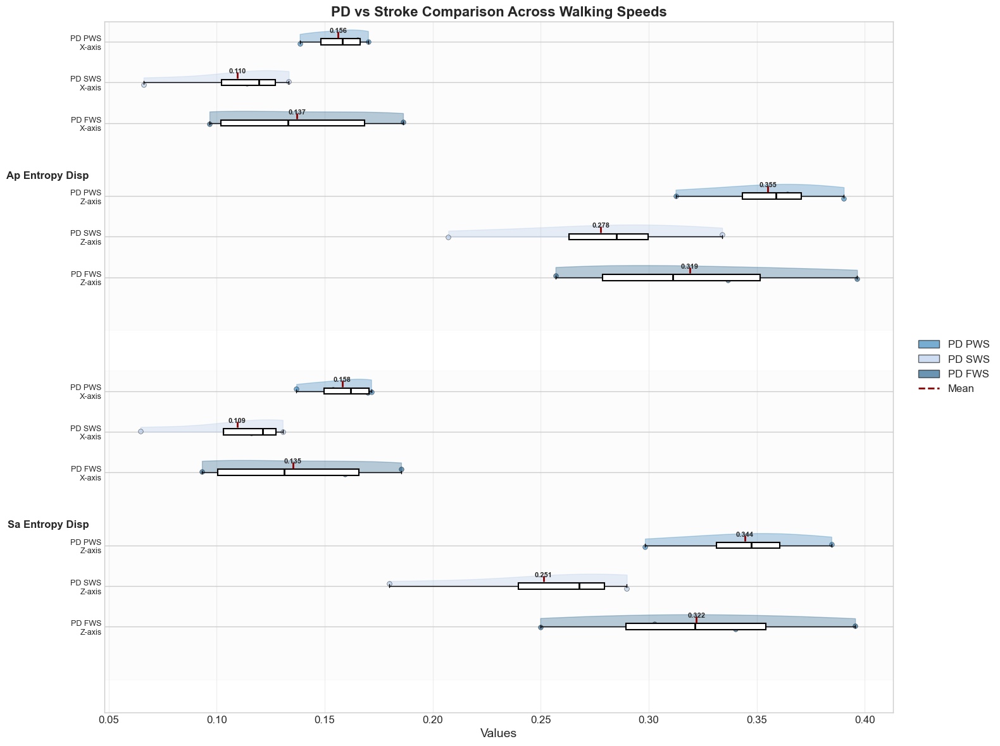

Data shape: (106, 10)
Columns: ['subject', 'axis', 'condition', 'walking_speed', 'segment_signal', 'ap_entropy_disp', 'sa_entropy_disp', 'ap_entropy_acc', 'sa_entropy_acc', 'mse_entropy']
Unique conditions: ['PD' 'Stroke' 'MS' 'Intradural extramedullary' 'Brain tumor' 'Parese']
Unique axes: ['x' 'z']
Unique walking speeds: ['PWS' 'SWS' 'FWS']
After filtering conditions: (24, 10)
Added data: PD PWS x - 4 points
Added data: PD SWS x - 4 points
Added data: PD FWS x - 4 points
Added data: PD PWS z - 4 points
Added data: PD SWS z - 4 points
Added data: PD FWS z - 4 points
Added data: PD PWS x - 4 points
Added data: PD SWS x - 4 points
Added data: PD FWS x - 4 points
Added data: PD PWS z - 4 points
Added data: PD SWS z - 4 points
Added data: PD FWS z - 4 points
Total plot groups: 12


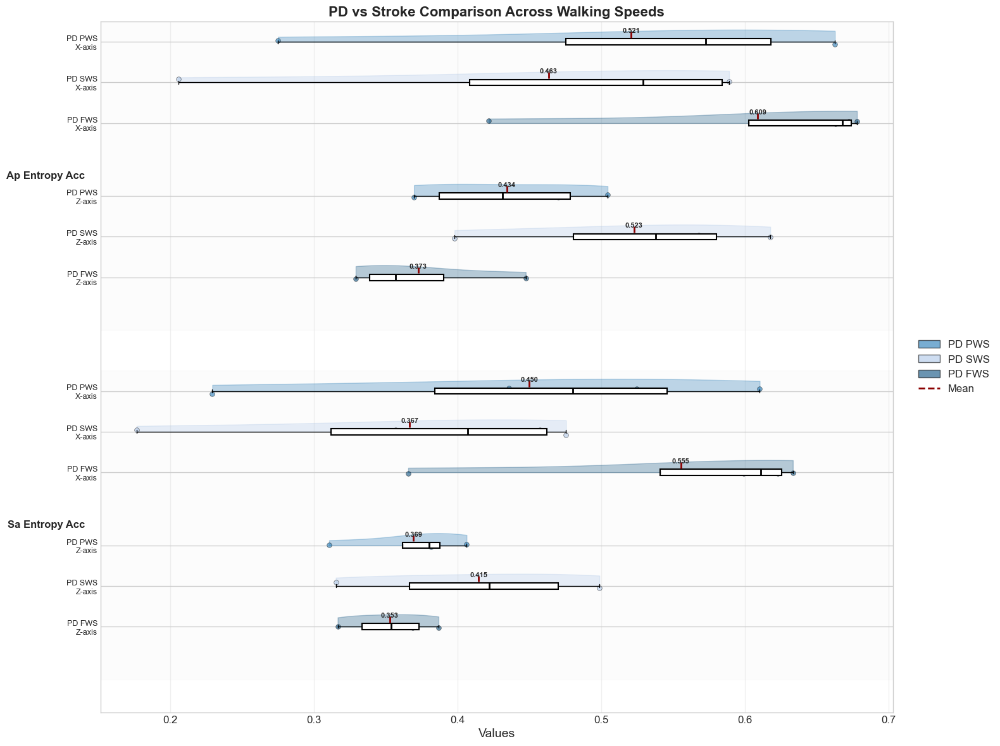

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy import stats

def simple_pd_stroke_plot(df, 
                         conditions_to_plot=['PD', 'Stroke'],
                         axes_to_plot=['x', 'z'],
                         value_cols=['ap_entropy_disp', 'sa_entropy_disp']):
    """
    Creates horizontal rain plots for PD and Stroke across walking speeds.
    """


    df_filtered = df[df['condition'].isin(conditions_to_plot)]
    print(f"After filtering conditions: {df_filtered.shape}")
    
    if df_filtered.empty:
        print("No data found for specified conditions!")
        return
   
    if 'walking_speed' in df.columns:
        speeds = ['PWS', 'SWS', 'FWS']
        speed_col = 'walking_speed'
    else:
        print("No walking_speed column found, checking condition column...")
        all_conditions = df['condition'].unique()
        print(f"All conditions: {all_conditions}")
        return
    
    fig, ax = plt.subplots(1, 1, figsize=(16, 12))
    
    # Colors for conditions and speeds
    condition_colors = {
        'PD': {'PWS': "#1f77b4", 'SWS': "#aec7e8", 'FWS': "#074d7d"},      
        'Stroke': {'PWS': "#d62728", 'SWS': "#ff9896", 'FWS': "#8b0000"}   
    }
    
    # Prepare data structure
    plot_data = []
    plot_labels = []
    plot_colors = []
    plot_positions = []
    
    position = 0
    metric_positions = {}
 
    for metric_idx, value_col in enumerate(value_cols):
        if value_col not in df_filtered.columns:
            print(f"Warning: Column {value_col} not found!")
            continue
            
        metric_start = position
        
        # Process each axis
        for axis in axes_to_plot:
            axis_data = df_filtered[df_filtered['axis'] == axis]
            
            # Process each condition
            for condition in conditions_to_plot:
                cond_data = axis_data[axis_data['condition'] == condition]
                
                # Process each speed
                for speed in speeds:
                    speed_data = cond_data[cond_data[speed_col] == speed][value_col].dropna().values
                    
                    if len(speed_data) > 0:
                        plot_data.append(speed_data)
                        plot_labels.append(f"{condition} {speed}\n{axis.upper()}-axis")
                        plot_colors.append(condition_colors[condition][speed])
                        plot_positions.append(position)
                        print(f"Added data: {condition} {speed} {axis} - {len(speed_data)} points")
                    else:
                        print(f"No data: {condition} {speed} {axis}")
                    
                    position += 1
                
                position += 0.3  # Space between conditions
            position += 0.5  # Space between axes
        
        metric_positions[value_col] = (metric_start, position - 1)
        position += 1.0  # Space between metrics
    
    print(f"Total plot groups: {len(plot_data)}")
    
    # Create plots only if we have data
    if not plot_data:
        print("No data to plot!")
        return
    
    # Create horizontal violin plots
    parts = ax.violinplot(plot_data, positions=plot_positions, vert=False,
                         widths=0.6, showmeans=False, showmedians=False, 
                         showextrema=False)
    
    # Color the violins
    for i, pc in enumerate(parts['bodies']):
        pc.set_facecolor(plot_colors[i])
        pc.set_alpha(0.3)
        pc.set_edgecolor(plot_colors[i])
        # Make half violin
        m = np.mean(pc.get_paths()[0].vertices[:, 1])
        pc.get_paths()[0].vertices[:, 1] = np.clip(pc.get_paths()[0].vertices[:, 1], -np.inf, m)
    
    # Add box plots
    bp = ax.boxplot(plot_data, positions=plot_positions, vert=False,
                   widths=0.15, showfliers=False, patch_artist=True)
    
    for box, median in zip(bp['boxes'], bp['medians']):
        box.set_facecolor('white')
        box.set_edgecolor('black')
        box.set_linewidth(1.5)
        median.set_color('black')
        median.set_linewidth(2)
    
    # Add strip plots
    for i, (data, pos, color) in enumerate(zip(plot_data, plot_positions, plot_colors)):
        y_jitter = np.random.normal(0, 0.04, size=len(data))
        ax.scatter(data, np.full_like(data, pos) + y_jitter, 
                  alpha=0.6, s=30, color=color, edgecolor='black', linewidth=0.5)
        
        # Add mean line
        mean_val = np.mean(data)
        ax.vlines(mean_val, pos - 0.25, pos - 0.1, colors='darkred', 
                 linestyles='dashed', linewidth=2)
        
        # Add mean value text
        ax.text(mean_val, pos - 0.35, f'{mean_val:.3f}', 
               ha='center', va='top', fontsize=8, fontweight='bold')
    
    # Add metric labels
    for metric, (start, end) in metric_positions.items():
        mid = (start + end) / 2
        ax.axhspan(start - 0.5, end + 0.5, alpha=0.05, color='lightgray')
        ax.text(ax.get_xlim()[0] - 0.02 * (ax.get_xlim()[1] - ax.get_xlim()[0]), 
               mid, metric.replace('_', ' ').title(), ha='right', va='center', 
               fontsize=12, fontweight='bold')
    
    # Customize plot
    ax.set_yticks(plot_positions)
    ax.set_yticklabels(plot_labels, fontsize=9)
    ax.set_xlabel('Values', fontsize=14)
    ax.set_title('PD vs Stroke Comparison Across Walking Speeds', 
                fontsize=16, fontweight='bold')
    ax.grid(axis='x', alpha=0.3)
    ax.invert_yaxis()
    
    # Add legend
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D
    legend_elements = []
    
    for condition in conditions_to_plot:
        for speed in speeds:
            legend_elements.append(
                Patch(facecolor=condition_colors[condition][speed], 
                      edgecolor='black', alpha=0.6,
                      label=f'{condition} {speed}')
            )
    
    legend_elements.append(Line2D([0], [0], color='darkred', linestyle='--', 
                                  linewidth=2, label='Mean'))
    
    ax.legend(handles=legend_elements, loc='center left', 
             bbox_to_anchor=(1.02, 0.5), ncol=1)
    
    plt.tight_layout()
    plt.show()


simple_pd_stroke_plot(df_cga_entropy, 
                        conditions_to_plot=['PD', ],
                        axes_to_plot=['x', 'z'],
                        value_cols=['ap_entropy_disp', 'sa_entropy_disp'])

simple_pd_stroke_plot(df_cga_entropy, 
                        conditions_to_plot=['PD', ],
                        axes_to_plot=['x', 'z'],
                        value_cols=['ap_entropy_acc', 'sa_entropy_acc'])

# MSE (All)

This part of the scirpt line plots on the bseline data for all patients. The analysis is completed in the THesis PDF. 
Here, both comparisons are shown, ML and VT axis.

Found patients starting with 'P': ['P04', 'P30', 'P33', 'P59']
Maximum mean entropy value: 1.1195 at scale factor 5


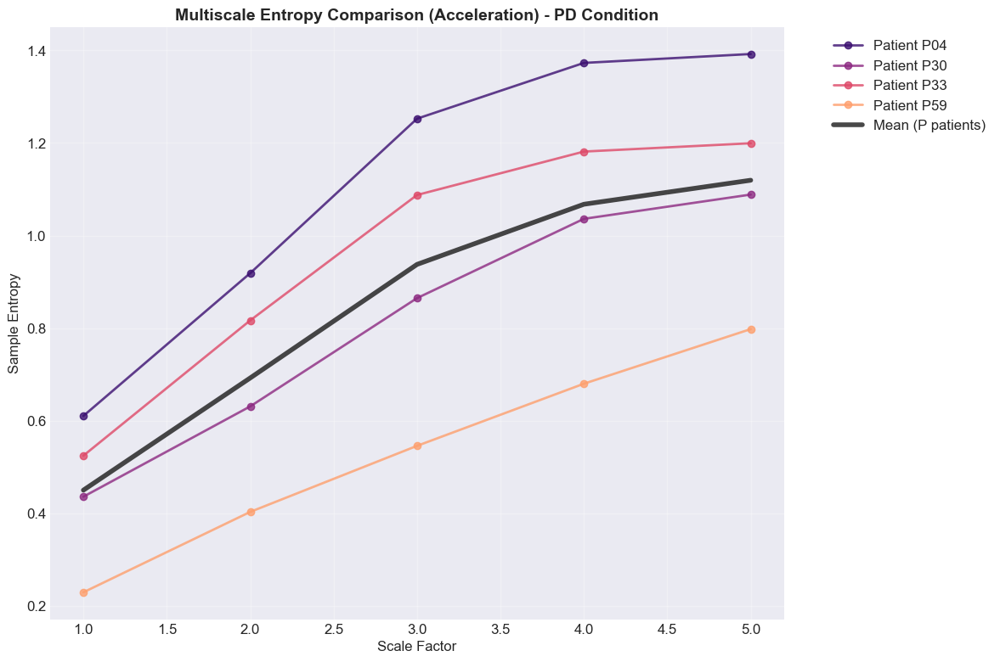


Summary for X-axis, PD condition (Patients starting with 'P'):
Number of patients: 4
Patients included: ['P04', 'P30', 'P33', 'P59']
Found patients starting with 'P': ['P09', 'P18', 'P20', 'P38', 'P52', 'P56', 'P57', 'P60']
Maximum mean entropy value: 1.0377 at scale factor 5


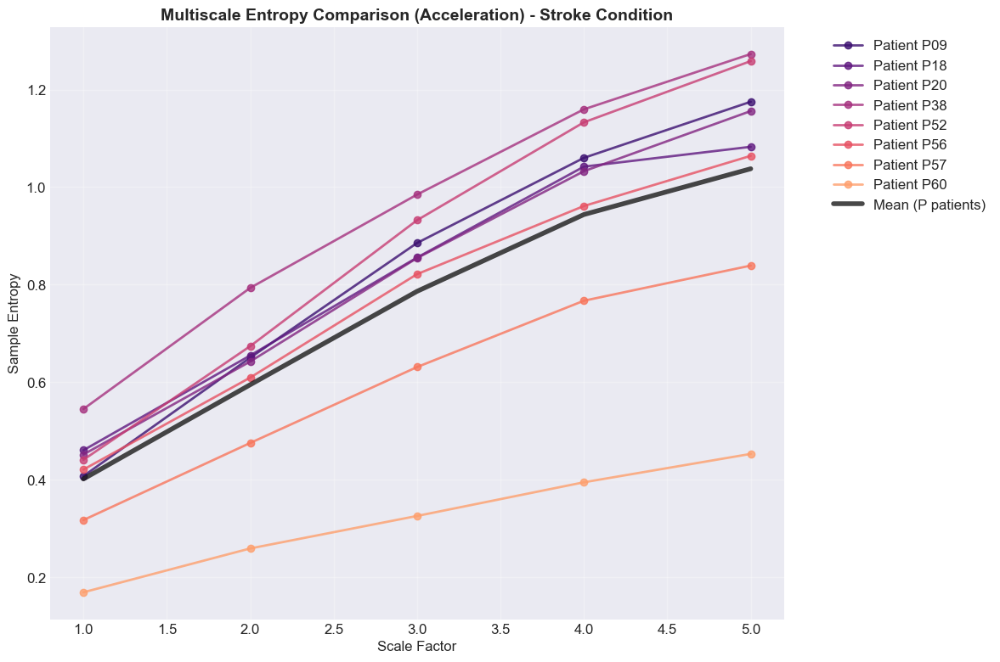


Summary for X-axis, Stroke condition (Patients starting with 'P'):
Number of patients: 8
Patients included: ['P09', 'P18', 'P20', 'P38', 'P52', 'P56', 'P57', 'P60']
Found patients: ['Y13', 'Y14', 'Y15', 'Y16', 'Y17', 'Y18', 'Y19', 'Y20']
Maximum mean entropy value: 1.1598 at scale factor 6


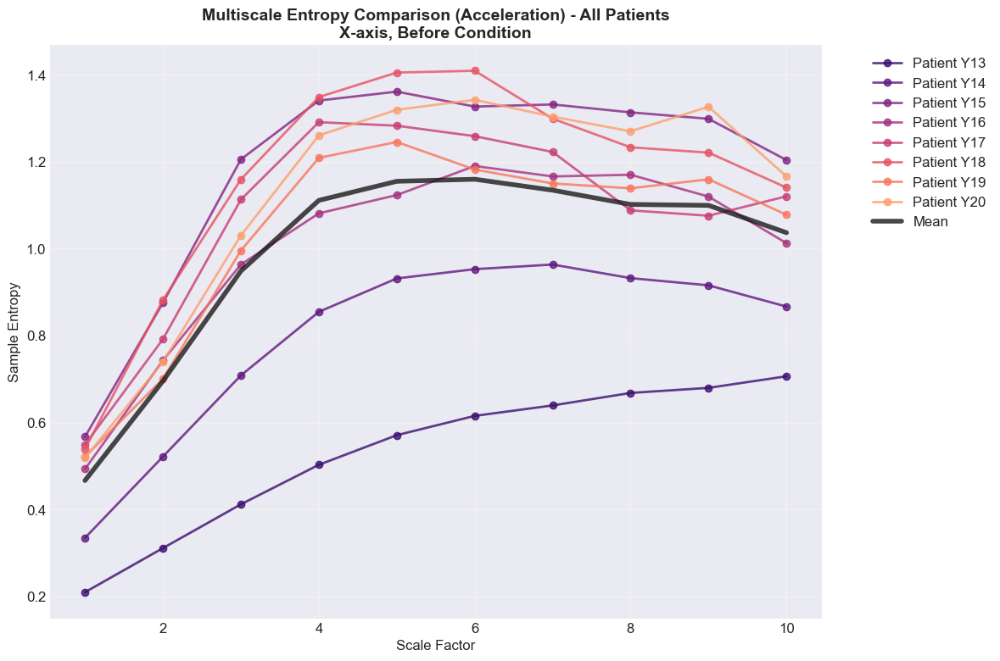


Summary for X-axis, Before condition:
Number of patients: 8
Patients included: ['Y13', 'Y14', 'Y15', 'Y16', 'Y17', 'Y18', 'Y19', 'Y20']
Found patients: ['E03', 'E04', 'E05', 'E08', 'E09', 'E11', 'E12', 'E14', 'E15', 'E16', 'E17', 'E30', 'E31', 'E32', 'E33', 'E34', 'E35', 'E36', 'E37', 'E38']
Maximum mean entropy value: 1.1617 at scale factor 6


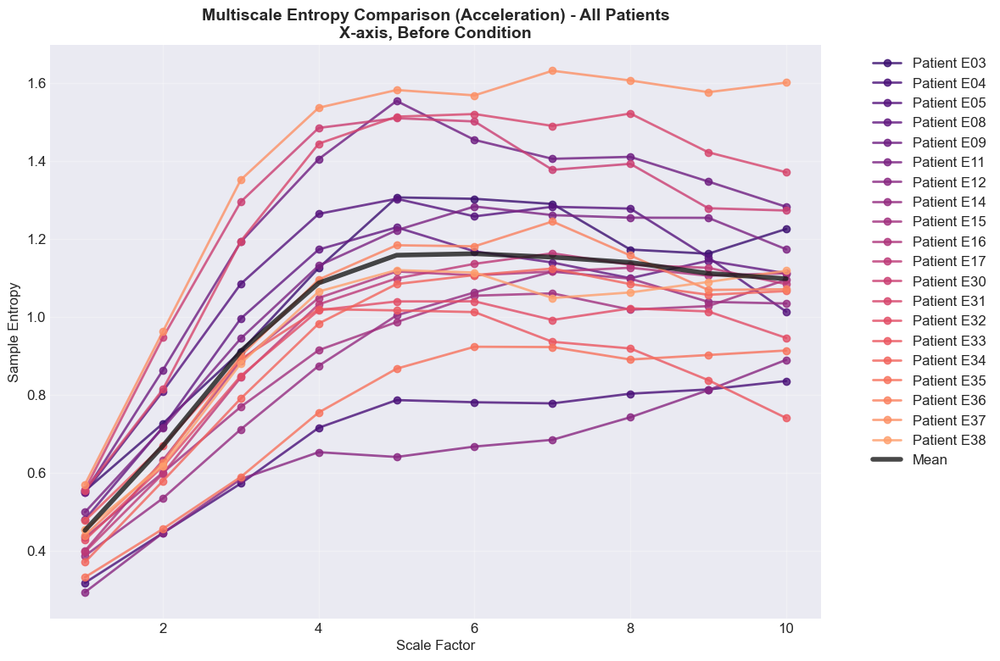


Summary for X-axis, Before condition:
Number of patients: 20
Patients included: ['E03', 'E04', 'E05', 'E08', 'E09', 'E11', 'E12', 'E14', 'E15', 'E16', 'E17', 'E30', 'E31', 'E32', 'E33', 'E34', 'E35', 'E36', 'E37', 'E38']


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import ast

def plot_ba_mse(df, axis='x', condition='Before'):
    """
    Plot multiscale entropy, before and after.
    """
   
    

    filtered_df = df[(df['axis'] == axis) & (df['condition'] == condition)].copy()
    
    if filtered_df.empty:
        print(f"No data found for axis={axis}, condition={condition}")
        return
   
    
    patients = sorted(filtered_df['subject'].unique())
    print(f"Found patients: {patients}")
    
    def parse_mse_string(mse_str):
        """Parse the MSE string to extract numerical values"""
        try:
            clean_str = mse_str.replace('\r\n', ' ').replace('\n', ' ').strip()
            if clean_str.startswith('[') and clean_str.endswith(']'):
                # Remove brackets and split by whitespace
                inner_str = clean_str[1:-1].strip()
                # Split by whitespace and convert to float
                values = [float(x) for x in inner_str.split() if x.strip()]
                return np.array(values)
            else:
                # Try to split by spaces and convert to float
                values = [float(x) for x in clean_str.split() if x.strip()]
                return np.array(values)
        except Exception as e:
            print(f"Error parsing MSE string: {mse_str[:50]}... Error: {e}")
            return None
    
    # Create the plot
    plt.figure(figsize=(12, 8))
    
    # Color map for patients
    colors = plt.cm.magma(np.linspace(0.2, 0.8, len(patients)))
    
    # Plot each patient
    for i, patient in enumerate(patients):
        patient_data = filtered_df[filtered_df['subject'] == patient]
        
        if not patient_data.empty:
            mse_str = patient_data['mse_entropy'].iloc[0]
            entropy_values = parse_mse_string(mse_str)
            
            if entropy_values is not None:
                # Create scale factors (1 to length of entropy values)
                scale_factors = range(1, len(entropy_values) + 1)
                
                # Plot the line for this patient
                plt.plot(scale_factors, entropy_values, 
                        marker='o', linewidth=2, markersize=6,
                        color=colors[i], alpha=0.8, label=f'Patient {patient}')
    
    all_entropy_values = []
    for patient in patients:
        patient_data = filtered_df[filtered_df['subject'] == patient]
        if not patient_data.empty:
            mse_str = patient_data['mse_entropy'].iloc[0]
            entropy_values = parse_mse_string(mse_str)
            if entropy_values is not None:
                all_entropy_values.append(entropy_values)

    if all_entropy_values:
        mean_entropy = np.mean(all_entropy_values, axis=0)
        scale_factors = range(1, len(mean_entropy) + 1)
        plt.plot(scale_factors, mean_entropy, 'k-', linewidth=4, alpha=0.8, label='Mean')
        print(f"Maximum mean entropy value: {np.max(mean_entropy):.4f} at scale factor {np.argmax(mean_entropy) + 1}")
    # Customize the plot
    plt.xlabel('Scale Factor', fontsize=12)
    plt.ylabel('Sample Entropy', fontsize=12)
    plt.title(f'Multiscale Entropy Comparison (Acceleration) - All Patients\n{axis.upper()}-axis, {condition} Condition', 
              fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', ncol=1)
    
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print(f"\nSummary for {axis.upper()}-axis, {condition} condition:")
    print(f"Number of patients: {len(patients)}")
    print(f"Patients included: {patients}")


def plot_CGA(df, axis='x', condition='Stroke', patient_filter='P'):
    """
    Plot multiscale entropy, fitted on CGA (neuro) data.
    """
  
    filtered_df = df[(df['axis'] == axis) & (df['condition'] == condition)].copy()
    
    if filtered_df.empty:
        print(f"No data found for axis={axis}, condition={condition}")
        return
    
    # plot only PWS
    all_patients = filtered_df['subject'].unique()
    patients = sorted([p for p in all_patients if str(p).startswith('P')])
    
    if not patients:
        print(f"No patients found starting with '{patient_filter}'")
        return
    
    print(f"Found patients starting with '{patient_filter}': {patients}")
    
    # Parse the mse_entropy column which contains string representations of arrays
    def parse_mse_string(mse_str):
        """Parse the MSE string to extract numerical values"""
        try:
            # Remove any whitespace and newlines
            clean_str = mse_str.replace('\r\n', ' ').replace('\n', ' ').strip()
            
            if clean_str.startswith('[') and clean_str.endswith(']'):
                # Remove brackets and split by whitespace
                inner_str = clean_str[1:-1].strip()
                # Split by whitespace and convert to float
                values = [float(x) for x in inner_str.split() if x.strip()]
                return np.array(values)
            else:
                # Try to split by spaces and convert to float
                values = [float(x) for x in clean_str.split() if x.strip()]
                return np.array(values)
        except Exception as e:
            print(f"Error parsing MSE string: {mse_str[:50]}... Error: {e}")
            return None
    
    # Create the plot
    plt.figure(figsize=(12, 8))
    
    # Color map for patients
    colors = plt.cm.magma(np.linspace(0.2, 0.8, len(patients)))
    
    # Plot each patient
    for i, patient in enumerate(patients):
        patient_data = filtered_df[filtered_df['subject'] == patient]
        
        if not patient_data.empty:
            mse_str = patient_data['mse_entropy'].iloc[0]
            entropy_values = parse_mse_string(mse_str)
            
            if entropy_values is not None:
                # Create scale factors (1 to length of entropy values)
                scale_factors = range(1, len(entropy_values) + 1)
                
                # Plot the line for this patient
                plt.plot(scale_factors, entropy_values, 
                        marker='o', linewidth=2, markersize=6,
                        color=colors[i], alpha=0.8, label=f'Patient {patient}')
    
    # Calculate and plot mean for P patients only
    all_entropy_values = []
    for patient in patients:
        patient_data = filtered_df[filtered_df['subject'] == patient]
        if not patient_data.empty:
            mse_str = patient_data['mse_entropy'].iloc[0]
            entropy_values = parse_mse_string(mse_str)
            if entropy_values is not None:
                all_entropy_values.append(entropy_values)

    if all_entropy_values:
        mean_entropy = np.mean(all_entropy_values, axis=0)
        scale_factors = range(1, len(mean_entropy) + 1)
        plt.plot(scale_factors, mean_entropy, 'k-', linewidth=4, alpha=0.8, label='Mean (P patients)')
        print(f"Maximum mean entropy value: {np.max(mean_entropy):.4f} at scale factor {np.argmax(mean_entropy) + 1}")
    
    # Customize the plot
    plt.xlabel('Scale Factor', fontsize=12)
    plt.ylabel('Sample Entropy', fontsize=12)
    plt.title(f'Multiscale Entropy Comparison (Acceleration) - {condition} Condition', 
              fontsize=14, fontweight='bold')
    plt.grid(True, alpha=0.3)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', ncol=1)
    
    plt.tight_layout()
    plt.show()
    
    # Print summary statistics
    print(f"\nSummary for {axis.upper()}-axis, {condition} condition (Patients starting with '{patient_filter}'):")
    print(f"Number of patients: {len(patients)}")
    print(f"Patients included: {patients}")

plot_CGA(df_cga_entropy, axis='x', condition='PD', patient_filter='P')
plot_CGA(df_cga_entropy, axis='x', condition='Stroke', patient_filter='P')

plot_ba_mse(df_young_entropy, axis='x', condition='Before')
plot_ba_mse(df_elderly_entropy, axis='x', condition='Before')


Found patients starting with 'P': ['P04', 'P30', 'P33', 'P59']
Maximum mean entropy value: 0.7307 at scale factor 5


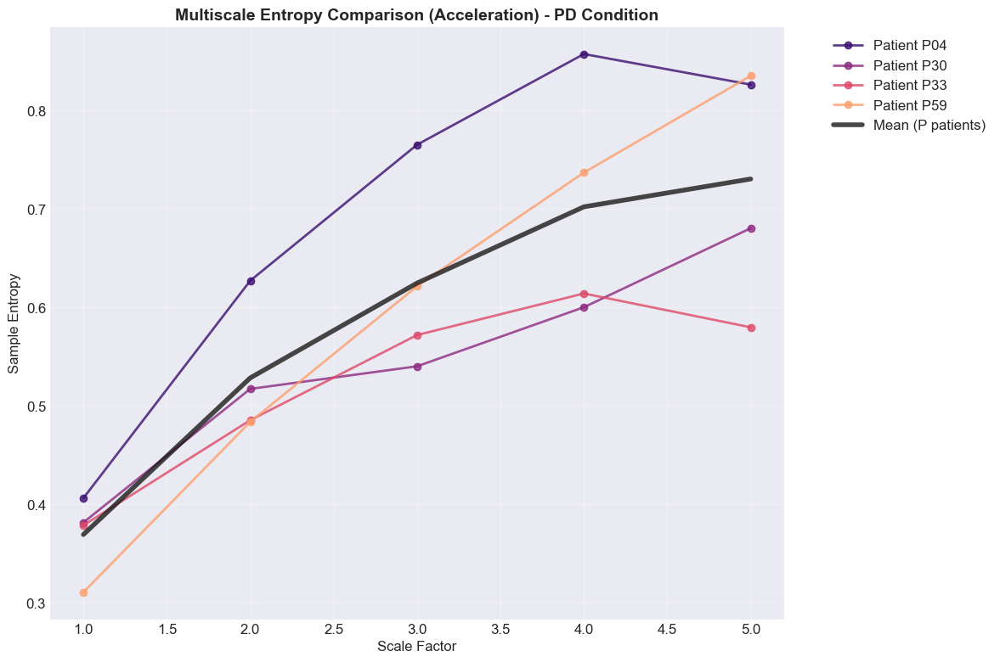


Summary for Z-axis, PD condition (Patients starting with 'P'):
Number of patients: 4
Patients included: ['P04', 'P30', 'P33', 'P59']
Found patients starting with 'P': ['P09', 'P18', 'P20', 'P38', 'P52', 'P56', 'P57', 'P60']
Maximum mean entropy value: 1.0156 at scale factor 5


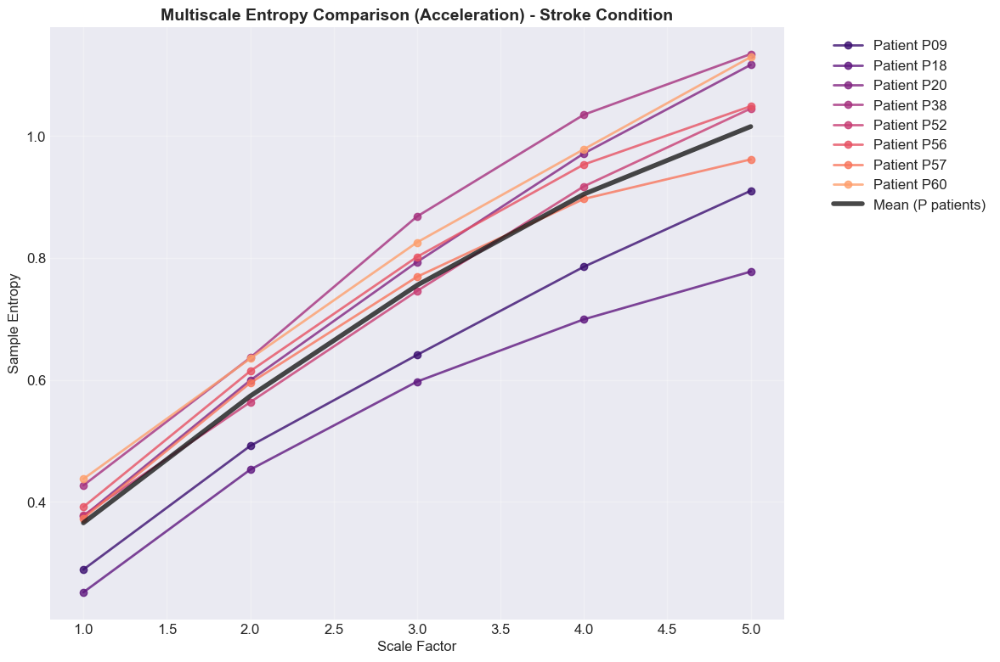


Summary for Z-axis, Stroke condition (Patients starting with 'P'):
Number of patients: 8
Patients included: ['P09', 'P18', 'P20', 'P38', 'P52', 'P56', 'P57', 'P60']
Found patients: ['Y13', 'Y14', 'Y15', 'Y16', 'Y17', 'Y18', 'Y19', 'Y20']
Maximum mean entropy value: 0.8075 at scale factor 5


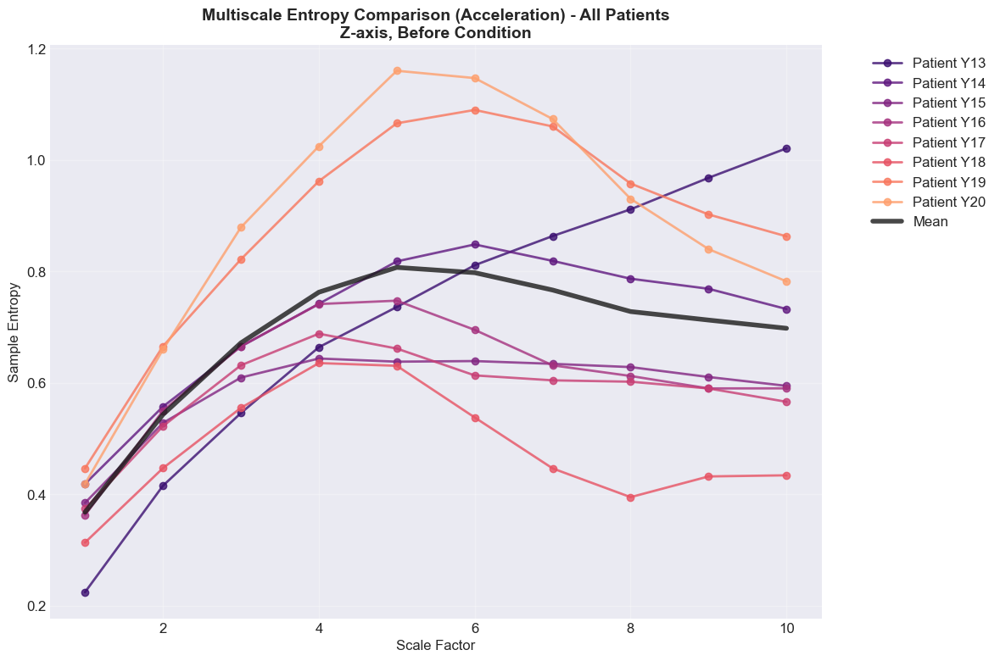


Summary for Z-axis, Before condition:
Number of patients: 8
Patients included: ['Y13', 'Y14', 'Y15', 'Y16', 'Y17', 'Y18', 'Y19', 'Y20']
Found patients: ['E03', 'E04', 'E05', 'E08', 'E09', 'E11', 'E12', 'E14', 'E15', 'E16', 'E17', 'E30', 'E31', 'E32', 'E33', 'E34', 'E35', 'E36', 'E37', 'E38']
Maximum mean entropy value: 0.9351 at scale factor 6


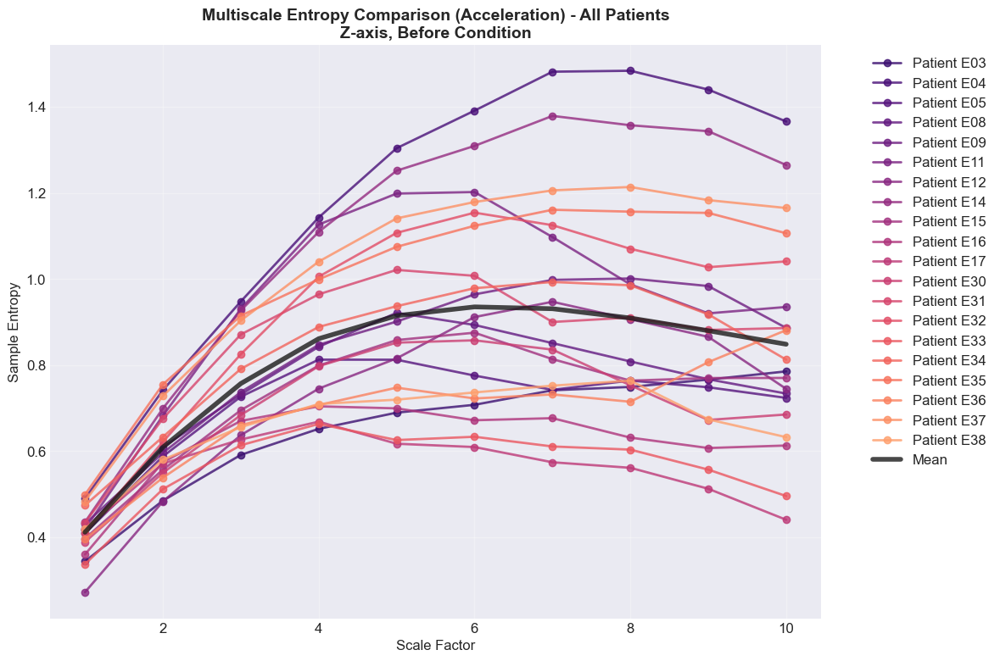


Summary for Z-axis, Before condition:
Number of patients: 20
Patients included: ['E03', 'E04', 'E05', 'E08', 'E09', 'E11', 'E12', 'E14', 'E15', 'E16', 'E17', 'E30', 'E31', 'E32', 'E33', 'E34', 'E35', 'E36', 'E37', 'E38']


In [ ]:

plot_CGA(df_cga_entropy, axis='z', condition='PD', patient_filter='P')
plot_CGA(df_cga_entropy, axis='z', condition='Stroke', patient_filter='P')

plot_ba_mse(df_young_entropy, axis='z', condition='Before')
plot_ba_mse(df_elderly_entropy, axis='z', condition='Before')


# Floquet Multiplier

## Young

In [201]:
df_young_fl = pd.read_excel(cwd.parent / ".." / "results" / "Young" / "Young_Floquet_Final.xlsx")

### Rain Plots

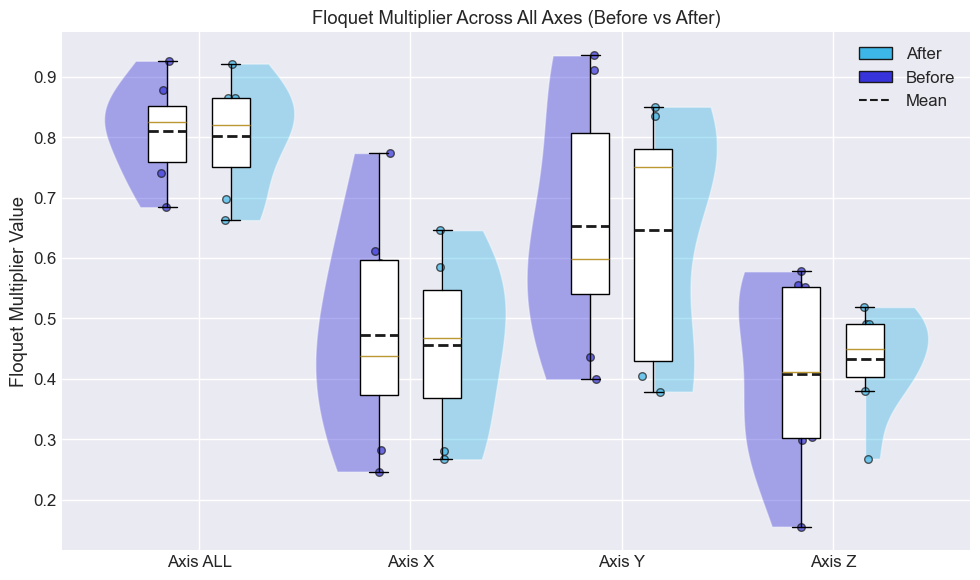

In [202]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

def rain_plot_floquet_all_axes(df):
    """
    Creates a single rain plot showing Floquet multipliers for all axes,
    split by Before vs After conditions.
    """
   
    axes = [ax for ax in sorted(df['axis'].unique())]

    conditions = sorted(df['condition'].unique())
    colors = {'before': '#3734db', 'after': '#3cb7e7'}
    
    fig, ax = plt.subplots(figsize=(10, 6))
    width = 0.6
    offsets = {'before': -0.15, 'after': +0.15}
    
    # Plot for each axis
    col = 'floquet_multiplier'  
    for i, axis in enumerate(axes):
        df_axis = df[df['axis'] == axis]
        
        for cond in conditions:
            vals = df_axis[df_axis['condition'] == cond][col].dropna().values
            if len(vals) == 0:
                continue
            
            pos = i + offsets[cond.lower()]
            
            # Half-violin plot
            parts = ax.violinplot([vals], positions=[pos], widths=width,
                                  showmeans=False, showmedians=False, showextrema=False)
            for pc in parts['bodies']:
                verts = pc.get_paths()[0].vertices
                mx = verts[:, 0].mean()
                if cond.lower() == 'before':
                    verts[:, 0] = np.clip(verts[:, 0], -np.inf, mx)
                else:
                    verts[:, 0] = np.clip(verts[:, 0], mx, np.inf)
                pc.set_facecolor(colors[cond.lower()])
                pc.set_alpha(0.4)
            
            # Boxplot
            bp = ax.boxplot([vals], positions=[pos], widths=width*0.3, patch_artist=True,
                            showfliers=False)
            bp['boxes'][0].set_facecolor('white')
            bp['boxes'][0].set_edgecolor('black')
            
            # Rain points (jittered scatter)
            xpts = np.random.normal(pos, 0.02, size=len(vals))
            ax.scatter(xpts, vals, color=colors[cond.lower()], edgecolor='k',
                       alpha=0.7, s=30)
            
            # Mean line
            ax.hlines(vals.mean(), pos-width*0.15, pos+width*0.15,
                      colors='k', linestyles='--', linewidth=2)
    
    # Set labels and title
    ax.set_xticks(range(len(axes)))
    ax.set_xticklabels([f'Axis {axis.upper()}' for axis in axes])
    ax.set_ylabel('Floquet Multiplier Value')
    ax.set_title('Floquet Multiplier Across All Axes (Before vs After)')
    
    # Create legend
    from matplotlib.patches import Patch
    legend = [Patch(facecolor=colors[c.lower()], edgecolor='k', label=c.title())
              for c in conditions]
    legend.append(plt.Line2D([0], [0], color='k', linestyle='--', label='Mean'))
    ax.legend(handles=legend, loc='upper right')
    
    plt.tight_layout()
    plt.show()

rain_plot_floquet_all_axes(df_young_fl)

### Statistical Testing


=== Axis ALL (8 subjects) ===

--- Floquet Multiplier (n=8) ---
 Before: mean=0.811, SD=0.078
 After:  mean=0.803, SD=0.088
 Shapiro–Wilk p=0.303 → Paired t-test
 Paired t-test: t=0.189, p=0.856
 Mean Δ=0.008, SD=0.122
 Sensitivity analyses:
   [ALL floquet_multiplier] Bootstrap 95% CI on Δmean: [-0.075, 0.082]
   [ALL floquet_multiplier] LOO t-test p-range:    [0.400, 0.952]
   [ALL floquet_multiplier] LOO Wilcoxon p-range: [0.375, 1.000]


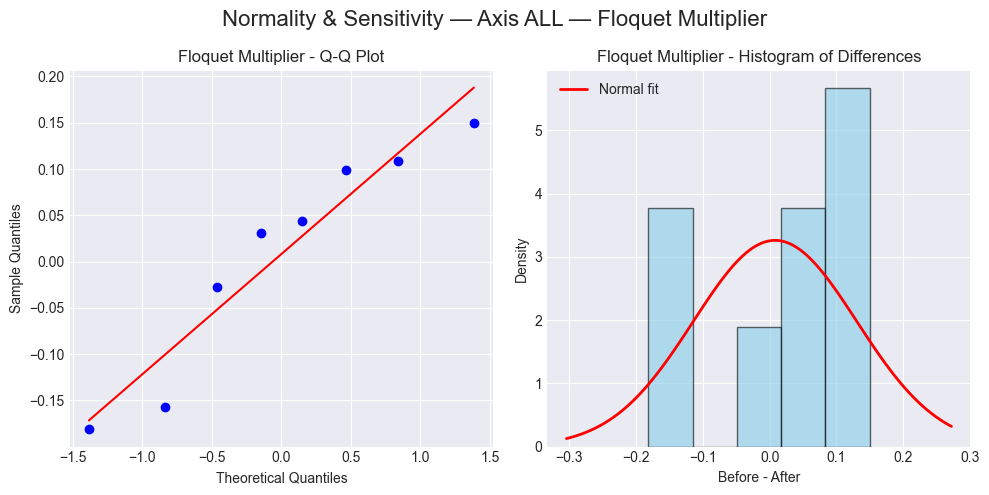


=== Axis X (8 subjects) ===

--- Floquet Multiplier (n=8) ---
 Before: mean=0.473, SD=0.177
 After:  mean=0.456, SD=0.138
 Shapiro–Wilk p=0.832 → Paired t-test
 Paired t-test: t=0.189, p=0.856
 Mean Δ=0.017, SD=0.261
 Sensitivity analyses:
   [X floquet_multiplier] Bootstrap 95% CI on Δmean: [-0.144, 0.198]
   [X floquet_multiplier] LOO t-test p-range:    [0.471, 0.919]
   [X floquet_multiplier] LOO Wilcoxon p-range: [0.469, 0.938]


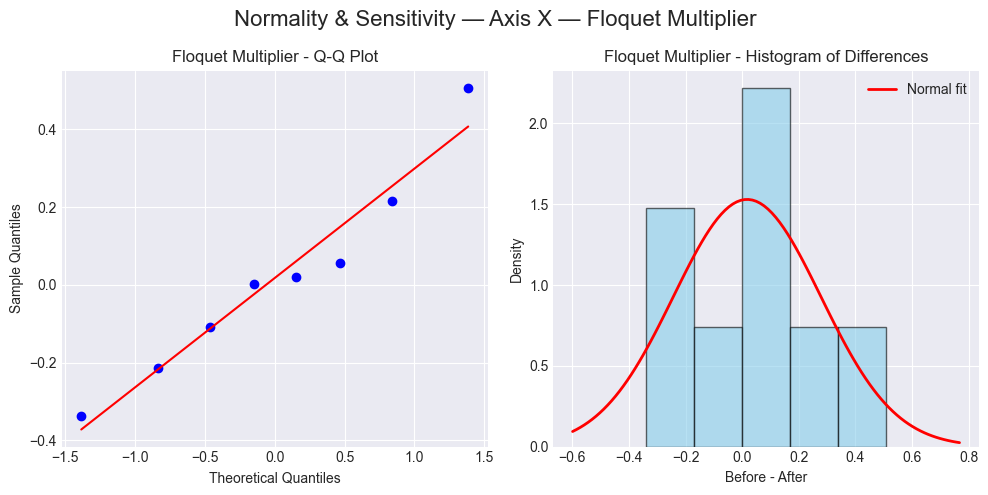


=== Axis Y (8 subjects) ===

--- Floquet Multiplier (n=8) ---
 Before: mean=0.653, SD=0.202
 After:  mean=0.646, SD=0.202
 Shapiro–Wilk p=0.899 → Paired t-test
 Paired t-test: t=0.075, p=0.942
 Mean Δ=0.007, SD=0.265
 Sensitivity analyses:
   [Y floquet_multiplier] Bootstrap 95% CI on Δmean: [-0.158, 0.180]
   [Y floquet_multiplier] LOO t-test p-range:    [0.465, 0.975]
   [Y floquet_multiplier] LOO Wilcoxon p-range: [0.578, 1.000]


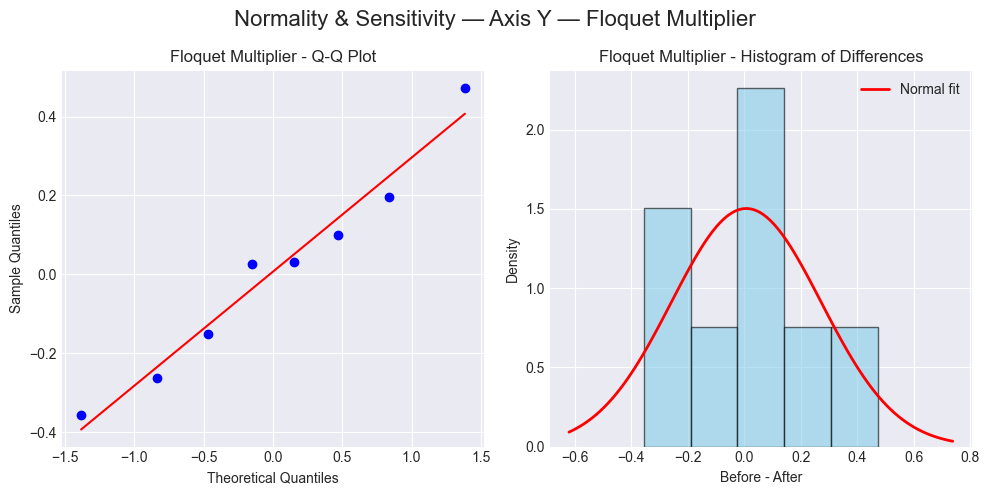


=== Axis Z (8 subjects) ===

--- Floquet Multiplier (n=8) ---
 Before: mean=0.408, SD=0.155
 After:  mean=0.432, SD=0.082
 Shapiro–Wilk p=0.186 → Paired t-test
 Paired t-test: t=-0.431, p=0.680
 Mean Δ=-0.024, SD=0.156
 Sensitivity analyses:
   [Z floquet_multiplier] Bootstrap 95% CI on Δmean: [-0.123, 0.077]
   [Z floquet_multiplier] LOO t-test p-range:    [0.384, 0.998]
   [Z floquet_multiplier] LOO Wilcoxon p-range: [0.297, 0.938]


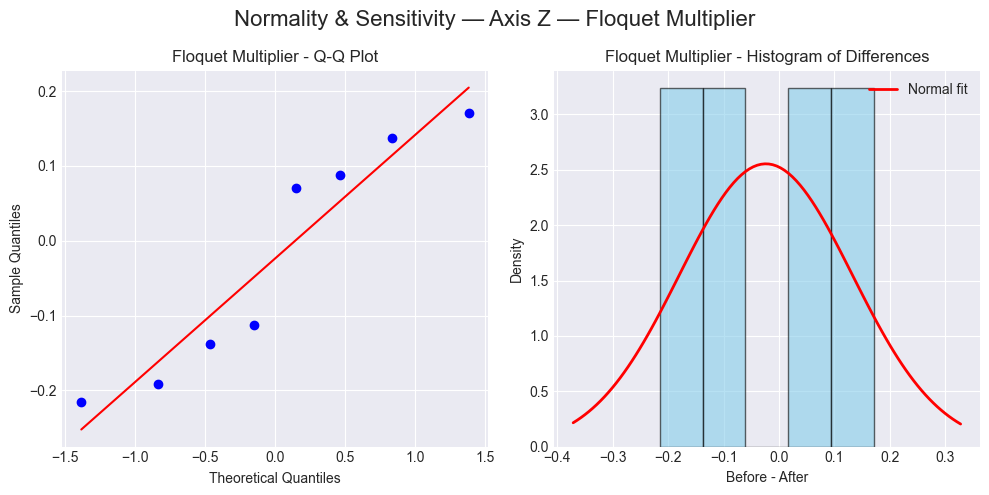

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import shapiro, ttest_rel, wilcoxon
import warnings
warnings.filterwarnings('ignore')

def sensitivity_checks(before_vals, after_vals, label="floquet_multiplier"):
    diffs = before_vals - after_vals
    n = len(diffs)
    if n < 2:
        print(f"   [{label}] Not enough data for sensitivity.")
        return
    boots = np.random.choice(diffs, (10000, n), replace=True)
    lo, hi = np.percentile(boots.mean(axis=1), [2.5, 97.5])
    print(f"   [{label}] Bootstrap 95% CI on Δmean: [{lo:.3f}, {hi:.3f}]")
    p_t, p_w = [], []
    for i in range(n):
        lb = np.delete(before_vals, i)
        la = np.delete(after_vals,  i)
        if len(lb) > 1:
            p_t.append(ttest_rel(lb, la).pvalue)
            p_w.append(wilcoxon(lb, la).pvalue)
    if p_t and p_w:
        print(f"   [{label}] LOO t-test p-range:    [{np.min(p_t):.3f}, {np.max(p_t):.3f}]")
        print(f"   [{label}] LOO Wilcoxon p-range: [{np.min(p_w):.3f}, {np.max(p_w):.3f}]")

def analyze_floquet_by_axis(df):
   
    axes = sorted(df['axis'].unique())
    
    # Single metric for Floquet
    metric_col = 'floquet_multiplier'  
    metric_label = 'Floquet Multiplier'
    
    for axis in axes:
        sub = df[df['axis'] == axis]
        common_subjects = set(sub[sub['condition']=='Before']['subject']).intersection(
                          sub[sub['condition']=='After']['subject'])
        print(f"\n=== Axis {axis.upper()} ({len(common_subjects)} subjects) ===")
        
        fig, axes_plot = plt.subplots(1, 2, figsize=(10, 5))
        plt.suptitle(f'Normality & Sensitivity — Axis {axis.upper()} — {metric_label}', fontsize=16)
        
        # Get before/after values for common subjects
        before = sub[sub['condition']=='Before'].set_index('subject')[metric_col]
        after  = sub[sub['condition']=='After' ].set_index('subject')[metric_col]
        common = list(common_subjects)
        bvals = before.loc[common].dropna().values
        avals = after.loc[common].dropna().values
        diffs = bvals - avals
        
        print(f"\n--- {metric_label} (n={len(diffs)}) ---")
        
        # Descriptive statistics by condition
        if len(bvals) > 0:
            print(f" Before: mean={bvals.mean():.3f}, SD={bvals.std(ddof=1):.3f}")
        if len(avals) > 0:
            print(f" After:  mean={avals.mean():.3f}, SD={avals.std(ddof=1):.3f}")
        
        # Normality test
        W, p_sw = shapiro(diffs) if len(diffs) >= 3 else (np.nan, np.nan)
        normal = (p_sw > 0.05)
        test_name = "Paired t-test" if normal else "Wilcoxon signed-rank"
        print(f" Shapiro–Wilk p={p_sw:.3f} → {test_name}")
        
        # Paired test
        if normal:
            t, pval = ttest_rel(bvals, avals)
            print(f" Paired t-test: t={t:.3f}, p={pval:.3f}")
        else:
            w, pval = wilcoxon(bvals, avals)
            print(f" Wilcoxon: W={w:.3f}, p={pval:.3f}")
        
        print(f" Mean Δ={diffs.mean():.3f}, SD={diffs.std(ddof=1):.3f}")
        
        # Q-Q plot
        ax_qq = axes_plot[0]
        if len(diffs) > 0:
            stats.probplot(diffs, dist="norm", plot=ax_qq)
        ax_qq.set_title(f"{metric_label} - Q-Q Plot")
        ax_qq.set_xlabel('Theoretical Quantiles')
        ax_qq.set_ylabel('Sample Quantiles')
        
        # Histogram
        ax_hist = axes_plot[1]
        if len(diffs) > 0:
            ax_hist.hist(diffs, bins=min(15, max(5, len(diffs)//3)), density=True,
                         color='skyblue', edgecolor='black', alpha=0.6)
            mu, sigma = diffs.mean(), diffs.std(ddof=1)
            x = np.linspace(diffs.min()-sigma, diffs.max()+sigma, 100)
            ax_hist.plot(x, stats.norm.pdf(x, mu, sigma), 'r-', lw=2, label='Normal fit')
            ax_hist.legend()
        ax_hist.set_title(f"{metric_label} - Histogram of Differences")
        ax_hist.set_xlabel('Before - After')
        ax_hist.set_ylabel('Density')
        
        print(" Sensitivity analyses:")
        sensitivity_checks(bvals, avals, label=f"{axis.upper()} {metric_col}")
        
        plt.tight_layout()
        plt.show()

analyze_floquet_by_axis(df)

## Elderly

In [ ]:
df_elderly_fl = pd.read_excel(cwd.parent / ".." / "results" / "Elderly" / "Elderly_Floquet_Final.xlsx")


### Rain plots

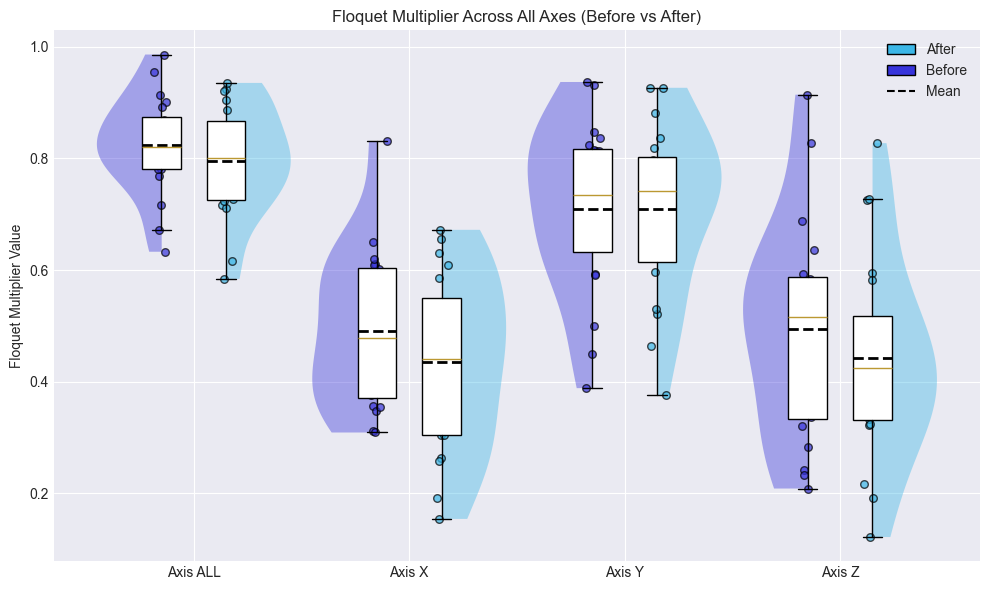

In [ ]:
def rain_plot_floquet_all_axes(df):
    """
    Creates a single rain plot.
    """

    axes = [ax for ax in sorted(df['axis'].unique())]
  
    conditions = sorted(df['condition'].unique())
    colors = {'before': '#3734db', 'after': '#3cb7e7'}
    
    fig, ax = plt.subplots(figsize=(10, 6))
    width = 0.6
    offsets = {'before': -0.15, 'after': +0.15}
    
    # Plot for each axis
    col = 'floquet_multiplier'
    
    for i, axis in enumerate(axes):
        df_axis = df[df['axis'] == axis]
        
        for cond in conditions:
            vals = df_axis[df_axis['condition'] == cond][col].dropna().values
            if len(vals) == 0:
                continue
            
            pos = i + offsets[cond.lower()]
            
            # Half-violin plot
            parts = ax.violinplot([vals], positions=[pos], widths=width,
                                  showmeans=False, showmedians=False, showextrema=False)
            for pc in parts['bodies']:
                verts = pc.get_paths()[0].vertices
                mx = verts[:, 0].mean()
                if cond.lower() == 'before':
                    verts[:, 0] = np.clip(verts[:, 0], -np.inf, mx)
                else:
                    verts[:, 0] = np.clip(verts[:, 0], mx, np.inf)
                pc.set_facecolor(colors[cond.lower()])
                pc.set_alpha(0.4)
            
            # Boxplot
            bp = ax.boxplot([vals], positions=[pos], widths=width*0.3, patch_artist=True,
                            showfliers=False)
            bp['boxes'][0].set_facecolor('white')
            bp['boxes'][0].set_edgecolor('black')
            
            # Rain points (jittered scatter)
            xpts = np.random.normal(pos, 0.02, size=len(vals))
            ax.scatter(xpts, vals, color=colors[cond.lower()], edgecolor='k',
                       alpha=0.7, s=30)
            
            # Mean line
            ax.hlines(vals.mean(), pos-width*0.15, pos+width*0.15,
                      colors='k', linestyles='--', linewidth=2)
    
    # Set labels and title
    ax.set_xticks(range(len(axes)))
    ax.set_xticklabels([f'Axis {axis.upper()}' for axis in axes])
    ax.set_ylabel('Floquet Multiplier Value')
    ax.set_title('Floquet Multiplier Across All Axes (Before vs After)')
    
    # Create legend
    from matplotlib.patches import Patch
    legend = [Patch(facecolor=colors[c.lower()], edgecolor='k', label=c.title())
              for c in conditions]
    legend.append(plt.Line2D([0], [0], color='k', linestyle='--', label='Mean'))
    ax.legend(handles=legend, loc='upper right')
    
    plt.tight_layout()
    plt.show()

    
rain_plot_floquet_all_axes(df_elderly_fl)

### Statistical tests


=== Axis ALL (20 subjects) ===

--- Floquet Multiplier (n=20) ---
 Before: mean=0.824, SD=0.088
 After:  mean=0.796, SD=0.098
 Shapiro–Wilk p=0.875 → Paired t-test
 Paired t-test: t=1.167, p=0.258
 Mean Δ=0.028, SD=0.107
 Sensitivity analyses:
   [ALL floquet_multiplier] Bootstrap 95% CI on Δmean: [-0.019, 0.073]
   [ALL floquet_multiplier] LOO t-test p-range:    [0.101, 0.454]
   [ALL floquet_multiplier] LOO Wilcoxon p-range: [0.080, 0.312]


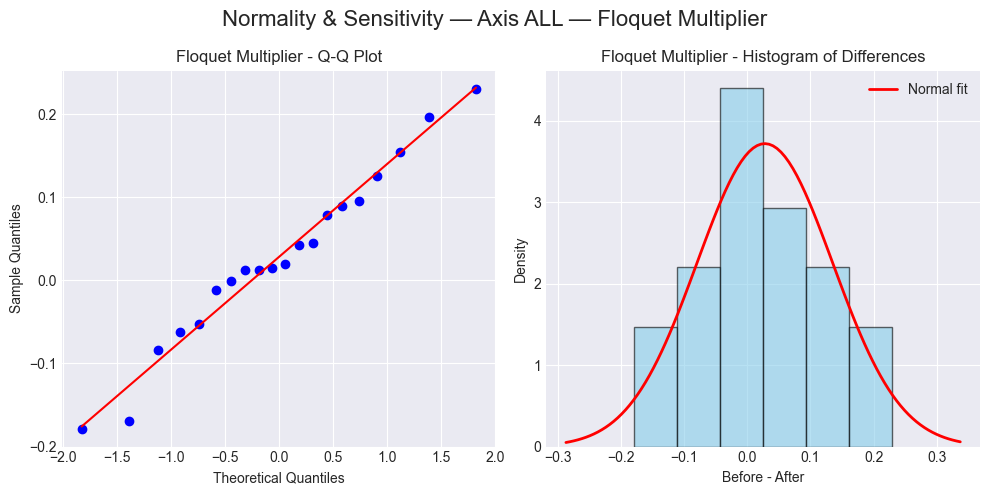


=== Axis X (20 subjects) ===

--- Floquet Multiplier (n=20) ---
 Before: mean=0.491, SD=0.137
 After:  mean=0.436, SD=0.157
 Shapiro–Wilk p=0.427 → Paired t-test
 Paired t-test: t=1.274, p=0.218
 Mean Δ=0.054, SD=0.191
 Sensitivity analyses:
   [X floquet_multiplier] Bootstrap 95% CI on Δmean: [-0.027, 0.133]
   [X floquet_multiplier] LOO t-test p-range:    [0.081, 0.368]
   [X floquet_multiplier] LOO Wilcoxon p-range: [0.073, 0.312]


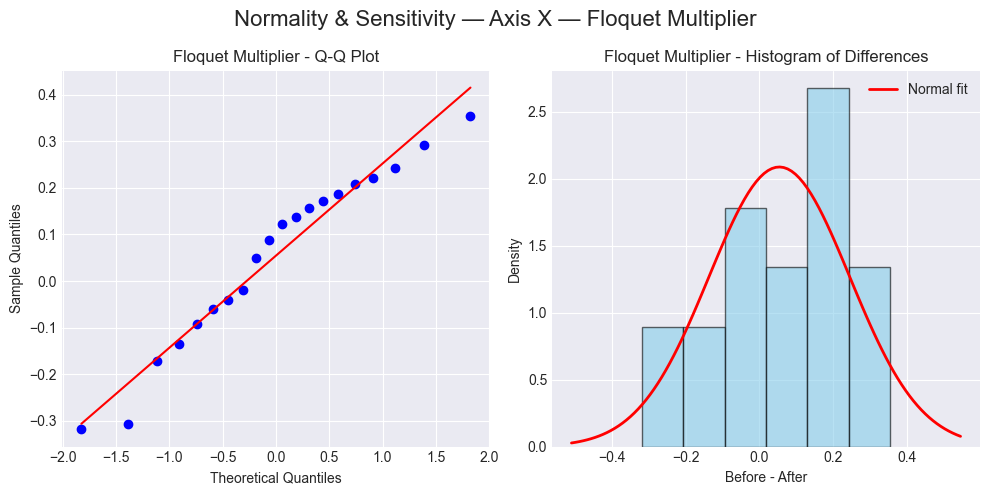


=== Axis Y (20 subjects) ===

--- Floquet Multiplier (n=20) ---
 Before: mean=0.709, SD=0.153
 After:  mean=0.710, SD=0.151
 Shapiro–Wilk p=0.873 → Paired t-test
 Paired t-test: t=-0.051, p=0.960
 Mean Δ=-0.001, SD=0.107
 Sensitivity analyses:
   [Y floquet_multiplier] Bootstrap 95% CI on Δmean: [-0.047, 0.043]
   [Y floquet_multiplier] LOO t-test p-range:    [0.594, 0.998]
   [Y floquet_multiplier] LOO Wilcoxon p-range: [0.623, 1.000]


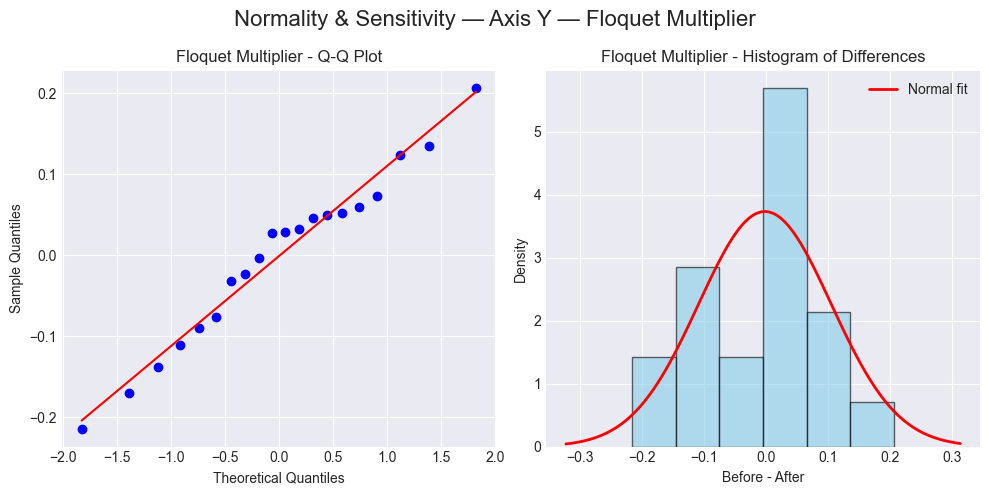


=== Axis Z (20 subjects) ===

--- Floquet Multiplier (n=20) ---
 Before: mean=0.494, SD=0.193
 After:  mean=0.442, SD=0.183
 Shapiro–Wilk p=0.282 → Paired t-test
 Paired t-test: t=1.058, p=0.303
 Mean Δ=0.052, SD=0.220
 Sensitivity analyses:
   [Z floquet_multiplier] Bootstrap 95% CI on Δmean: [-0.039, 0.149]
   [Z floquet_multiplier] LOO t-test p-range:    [0.153, 0.512]
   [Z floquet_multiplier] LOO Wilcoxon p-range: [0.293, 0.679]


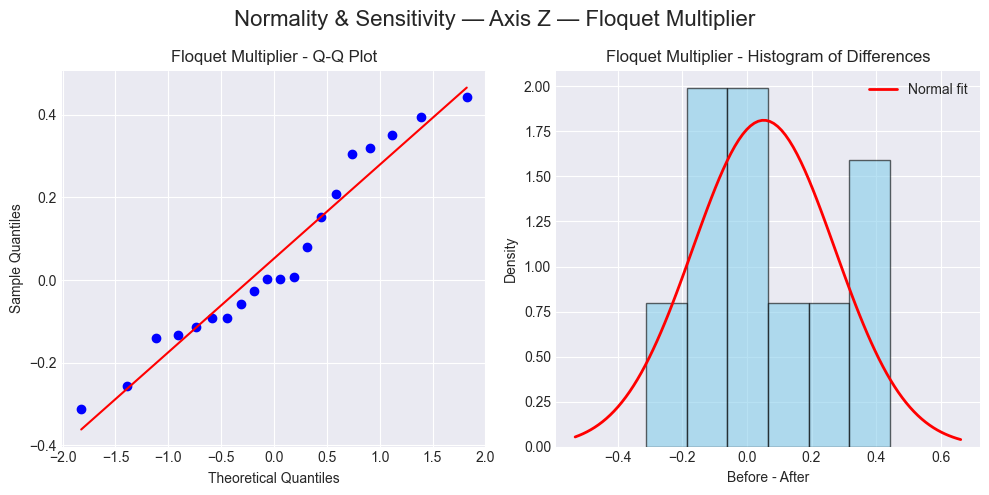

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import shapiro, ttest_rel, wilcoxon
import warnings
warnings.filterwarnings('ignore')

def sensitivity_checks(before_vals, after_vals, label="floquet_mulitplier"):
    diffs = before_vals - after_vals
    n = len(diffs)
    if n < 2:
        print(f"   [{label}] Not enough data for sensitivity.")
        return
    boots = np.random.choice(diffs, (10000, n), replace=True)
    lo, hi = np.percentile(boots.mean(axis=1), [2.5, 97.5])
    print(f"   [{label}] Bootstrap 95% CI on Δmean: [{lo:.3f}, {hi:.3f}]")
    p_t, p_w = [], []
    for i in range(n):
        lb = np.delete(before_vals, i)
        la = np.delete(after_vals,  i)
        if len(lb) > 1:
            p_t.append(ttest_rel(lb, la).pvalue)
            p_w.append(wilcoxon(lb, la).pvalue)
    if p_t and p_w:
        print(f"   [{label}] LOO t-test p-range:    [{np.min(p_t):.3f}, {np.max(p_t):.3f}]")
        print(f"   [{label}] LOO Wilcoxon p-range: [{np.min(p_w):.3f}, {np.max(p_w):.3f}]")

def analyze_floquet_by_axis(df):
   
    axes = sorted(df['axis'].unique())
    
    metric_col = 'floquet_multiplier'  
    metric_label = 'Floquet Multiplier'
    
    for axis in axes:
        sub = df[df['axis'] == axis]
        common_subjects = set(sub[sub['condition']=='Before']['subject']).intersection(
                          sub[sub['condition']=='After']['subject'])
        print(f"\n=== Axis {axis.upper()} ({len(common_subjects)} subjects) ===")
        
        fig, axes_plot = plt.subplots(1, 2, figsize=(10, 5))
        plt.suptitle(f'Normality & Sensitivity — Axis {axis.upper()} — {metric_label}', fontsize=16)
        
        # Get before/after values for common subjects
        before = sub[sub['condition']=='Before'].set_index('subject')[metric_col]
        after  = sub[sub['condition']=='After' ].set_index('subject')[metric_col]
        common = list(common_subjects)
        bvals = before.loc[common].dropna().values
        avals = after.loc[common].dropna().values
        diffs = bvals - avals
        
        print(f"\n--- {metric_label} (n={len(diffs)}) ---")
        
        # Descriptive statistics by condition
        if len(bvals) > 0:
            print(f" Before: mean={bvals.mean():.3f}, SD={bvals.std(ddof=1):.3f}")
        if len(avals) > 0:
            print(f" After:  mean={avals.mean():.3f}, SD={avals.std(ddof=1):.3f}")
        
        # Normality test
        W, p_sw = shapiro(diffs) if len(diffs) >= 3 else (np.nan, np.nan)
        normal = (p_sw > 0.05)
        test_name = "Paired t-test" if normal else "Wilcoxon signed-rank"
        print(f" Shapiro–Wilk p={p_sw:.3f} → {test_name}")
        
        # Paired test
        if normal:
            t, pval = ttest_rel(bvals, avals)
            print(f" Paired t-test: t={t:.3f}, p={pval:.3f}")
        else:
            w, pval = wilcoxon(bvals, avals)
            print(f" Wilcoxon: W={w:.3f}, p={pval:.3f}")
        
        print(f" Mean Δ={diffs.mean():.3f}, SD={diffs.std(ddof=1):.3f}")
        
        # Q-Q plot
        ax_qq = axes_plot[0]
        if len(diffs) > 0:
            stats.probplot(diffs, dist="norm", plot=ax_qq)
        ax_qq.set_title(f"{metric_label} - Q-Q Plot")
        ax_qq.set_xlabel('Theoretical Quantiles')
        ax_qq.set_ylabel('Sample Quantiles')
        
        # Histogram
        ax_hist = axes_plot[1]
        if len(diffs) > 0:
            ax_hist.hist(diffs, bins=min(15, max(5, len(diffs)//3)), density=True,
                         color='skyblue', edgecolor='black', alpha=0.6)
            mu, sigma = diffs.mean(), diffs.std(ddof=1)
            x = np.linspace(diffs.min()-sigma, diffs.max()+sigma, 100)
            ax_hist.plot(x, stats.norm.pdf(x, mu, sigma), 'r-', lw=2, label='Normal fit')
            ax_hist.legend()
        ax_hist.set_title(f"{metric_label} - Histogram of Differences")
        ax_hist.set_xlabel('Before - After')
        ax_hist.set_ylabel('Density')
        
        print(" Sensitivity analyses:")
        sensitivity_checks(bvals, avals, label=f"{axis.upper()} {metric_col}")
        
        plt.tight_layout()
        plt.show()


analyze_floquet_by_axis(df_elderly_fl)

## Comaprison of Floquet - Elderly - Young

Successfully loaded both cohort files
Young data shape: (64, 8)
Elderly data shape: (160, 8)


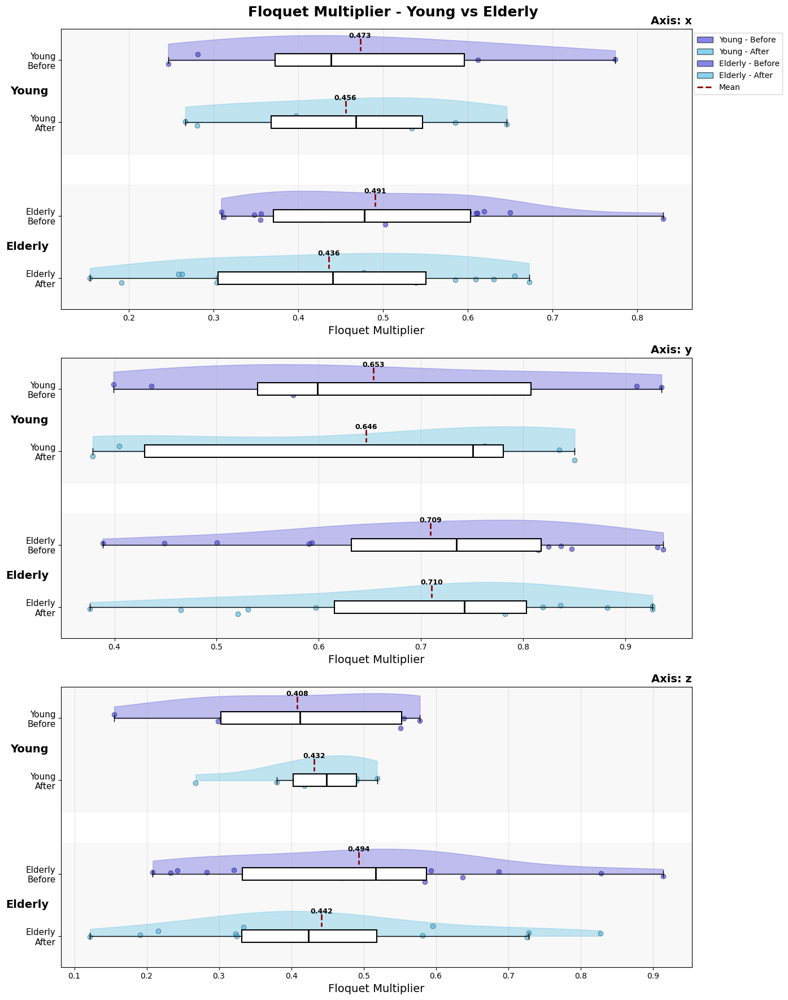


DETAILED STATISTICS

YOUNG:

  Before:
    N: 32
    Mean: 0.5864
    Median: 0.5825
    Std: 0.2207
    Range: [0.1552, 0.9354]

  After:
    N: 32
    Mean: 0.5842
    Median: 0.5264
    Std: 0.2009
    Range: [0.2666, 0.9220]

ELDERLY:

  Before:
    N: 80
    Mean: 0.6293
    Median: 0.6348
    Std: 0.2041
    Range: [0.2085, 0.9863]

  After:
    N: 80
    Mean: 0.5960
    Median: 0.6125
    Std: 0.2185
    Range: [0.1216, 0.9354]

BETWEEN-COHORT COMPARISONS

Before:
  Young vs Elderly: t = -0.9834, p = 0.3276
  Cohen's d: -0.2057

After:
  Young vs Elderly: t = -0.2651, p = 0.7914
  Cohen's d: -0.0555


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy import stats

def create_two_cohort_horizontal_rain_plots(df1, df2, 
                                           cohort1_name='Young', 
                                           cohort2_name='Elderly',
                                           subject_col='subject', 
                                           condition_col='condition', 
                                           value_col='floquet_multiplier',
                                           axis_col='axis',
                                           sheet_name=0):
    """
    Create horizontal rain plots for both cohorts.
    """
    
    
    
    df1['cohort'] = cohort1_name
    df2['cohort'] = cohort2_name
    
    conditions = ['Before', 'After']  
    
    if axis_col in df1.columns:
        axes = sorted([axis for axis in df1[axis_col].unique() if axis != 'all'])
        n_axes = len(axes)
    else:
        axes = ['All']
        n_axes = 1
 
    fig, axs = plt.subplots(n_axes, 1, figsize=(14, 6*n_axes))
    
    if n_axes == 1:
        axs = [axs]
    
    # Colors for cohorts and conditions
    cohort_colors = {
        cohort1_name: {'before': '#3734db', 'after': '#3cb7e7'},  
        cohort2_name: {'before': '#3734db', 'after': '#3cb7e7'}  
    }
    
    # Process each axis
    for ax_idx, (ax, axis_name) in enumerate(zip(axs, axes)):
        # Filter data for this axis
        if axis_name == 'All':
            axis_df1 = df1
            axis_df2 = df2
        else:
            axis_df1 = df1[df1[axis_col] == axis_name]
            axis_df2 = df2[df2[axis_col] == axis_name]
        
        # Prepare data structure
        plot_data = []
        plot_labels = []
        plot_colors = []
        plot_positions = []
        
        position = 0
        group_positions = {}
        
        # Process each cohort
        for cohort_idx, (df, cohort) in enumerate([(axis_df1, cohort1_name), 
                                                    (axis_df2, cohort2_name)]):
            group_start = position
            
            for cond_idx, condition in enumerate(conditions):
                # Get data for this condition
                cond_data = df[df[condition_col] == condition][value_col].dropna().values
                
                if len(cond_data) > 0:
                    plot_data.append(cond_data)
                    plot_labels.append(f"{cohort}\n{condition.title()}")
                    plot_colors.append(cohort_colors[cohort][condition.lower()])
                    plot_positions.append(position)
                    position += 1
                else:
                    position += 1  # Skip but maintain spacing
            
            group_positions[cohort] = (group_start, position - 1)
            position += 0.5  # Add space between cohorts
        
        # Create horizontal violin plots
        parts = ax.violinplot(plot_data, positions=plot_positions, vert=False,
                             widths=0.8, showmeans=False, showmedians=False, 
                             showextrema=False)
        
        # Color the violins
        for i, pc in enumerate(parts['bodies']):
            pc.set_facecolor(plot_colors[i])
            pc.set_alpha(0.3)
            pc.set_edgecolor(plot_colors[i])
            # Make half violin (bottom half)
            m = np.mean(pc.get_paths()[0].vertices[:, 1])
            # pc.get_paths()[0].vertices[:, 1] = np.clip(pc.get_paths()[0].vertices[:, 1], m, np.inf)
            pc.get_paths()[0].vertices[:, 1] = np.clip(pc.get_paths()[0].vertices[:, 1], -np.inf, m)
        # Add box plots
        bp = ax.boxplot(plot_data, positions=plot_positions, vert=False,
                       widths=0.2, showfliers=False, patch_artist=True)
        
        for i, (box, median) in enumerate(zip(bp['boxes'], bp['medians'])):
            box.set_facecolor('white')
            box.set_edgecolor('black')
            box.set_linewidth(1.5)
            median.set_color('black')
            median.set_linewidth(2)
        
        # Add strip plots (rain drops)
        for i, (data, pos, color) in enumerate(zip(plot_data, plot_positions, plot_colors)):
            y_jitter = np.random.normal(0, 0.06, size=len(data))
            ax.scatter(data, np.full_like(data, pos) + y_jitter, 
                      alpha=0.6, s=40, color=color, edgecolor='black', linewidth=0.5)
            
            # Add mean line
            mean_val = np.mean(data)
            ax.vlines(mean_val, pos - 0.35, pos - 0.15, colors='darkred', 
                     linestyles='dashed', linewidth=2)
            
            # Add mean value text
            ax.text(mean_val, pos - 0.45, f'{mean_val:.3f}', 
                   ha='center', va='top', fontsize=9, fontweight='bold')
        
        # Add cohort separators and labels
        for cohort, (start, end) in group_positions.items():
            mid = (start + end) / 2
            ax.axhspan(start - 0.5, end + 0.5, alpha=0.05, color='gray')
            ax.text(ax.get_xlim()[0] - 0.02 * (ax.get_xlim()[1] - ax.get_xlim()[0]), 
                   mid, cohort, ha='right', va='center', fontsize=14, fontweight='bold')
        
        # Customize subplot
        ax.set_yticks(plot_positions)
        ax.set_yticklabels(plot_labels, fontsize=11)
        ax.set_xlabel(value_col.replace('_', ' ').title(), fontsize=14)
        
        if axis_name != 'All':
            ax.set_title(f'Axis: {axis_name}', fontsize=14, fontweight='bold', loc='right')
        
        ax.grid(axis='x', alpha=0.3)
        ax.invert_yaxis()  # Put first items at top
    
    # Main title
    plt.suptitle(f'{value_col.replace("_", " ").title()} - {cohort1_name} vs {cohort2_name}', 
                fontsize=18, fontweight='bold')
    
    # Add legend
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D
    legend_elements = []
    for cohort in [cohort1_name, cohort2_name]:
        for condition in conditions:
            legend_elements.append(
                Patch(facecolor=cohort_colors[cohort][condition.lower()], 
                      edgecolor='black', alpha=0.6,
                      label=f'{cohort} - {condition.title()}')
            )
    legend_elements.append(Line2D([0], [0], color='darkred', linestyle='--', 
                                  linewidth=2, label='Mean'))
    
    # Place legend outside the plot
    if n_axes == 1:
        axs[0].legend(handles=legend_elements, loc='center left', 
                     bbox_to_anchor=(1.02, 0.5), ncol=1)
    else:
        axs[0].legend(handles=legend_elements, loc='upper right', 
                     bbox_to_anchor=(1.15, 1), ncol=1)
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed statistics
    print("\n" + "="*60)
    print("DETAILED STATISTICS")
    print("="*60)
    
    for cohort, df in [(cohort1_name, df1), (cohort2_name, df2)]:
        print(f"\n{cohort.upper()}:")
        for condition in conditions:
            cond_data = df[df[condition_col] == condition][value_col].dropna()
            print(f"\n  {condition.title()}:")
            print(f"    N: {len(cond_data)}")
            print(f"    Mean: {cond_data.mean():.4f}")
            print(f"    Median: {cond_data.median():.4f}")
            print(f"    Std: {cond_data.std():.4f}")
            print(f"    Range: [{cond_data.min():.4f}, {cond_data.max():.4f}]")
    
    # Between-cohort comparisons
    print("\n" + "="*60)
    print("BETWEEN-COHORT COMPARISONS")
    print("="*60)
    
    for condition in conditions:
        print(f"\n{condition.title()}:")
        data2 = df2[df2[condition_col] == condition][value_col].dropna()
        data1 = df1[df1[condition_col] == condition][value_col].dropna()
        
        
        if len(data1) > 0 and len(data2) > 0:
            t_stat, p_val = stats.ttest_ind(data1, data2)
            print(f"  {cohort1_name} vs {cohort2_name}: t = {t_stat:.4f}, p = {p_val:.4f}")
            
            # Effect size (Cohen's d)
            pooled_std = np.sqrt(((len(data1)-1)*data1.std()**2 + (len(data2)-1)*data2.std()**2) / 
                                (len(data1) + len(data2) - 2))
            cohen_d = (data1.mean() - data2.mean()) / pooled_std
            print(f"  Cohen's d: {cohen_d:.4f}")


# Example usage functions
def analyze_two_cohorts(file_path1, file_path2, cohort1_name='Young', cohort2_name='Elderly'):
    """
    Analyze and plot two cohorts side by side.
    """
    create_two_cohort_horizontal_rain_plots(
        file_path1, file_path2,
        cohort1_name=cohort1_name,
        cohort2_name=cohort2_name,
        subject_col='subject',
        condition_col='condition',
        value_col='floquet_multiplier',
        axis_col='axis'
    )


analyze_two_cohorts(df_young_fl, df_elderly_fl, 'Young', 'Elderly')



## CGA

In [203]:
df_cga_fl = pd.read_excel(cwd.parent / ".." / "results" / "CGA" / "CGA_Floquet.xlsx")

### rain plots by patients

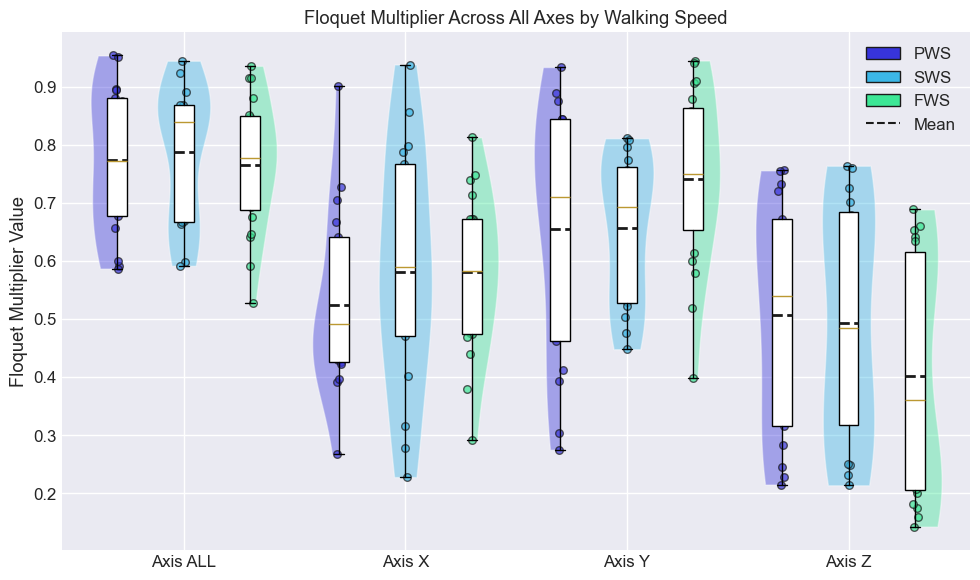

In [205]:
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def rain_plot_floquet_by_speed_all_axes(df):
    """
    Creates a single rain plot showing Floquet multipliers for all axes,
    grouped by walking_speed (PWS, SWS, FWS).
    """
    
    
    axes = [ax for ax in sorted(df['axis'].unique()) ]
    
    # Single metric for Floquet
    col = 'floquet_multiplier'  
    
    speeds = ['PWS', 'SWS', 'FWS']
    colors = {'PWS': "#3734db", 'SWS': "#3cb7e7", 'FWS': "#3de796"}
    
    # Controls:
    group_spacing = 2.0  # distance between axes
    offsets = {'PWS': -0.6, 'SWS': 0.0, 'FWS': +0.6}  # within-group separation
    width = 0.6  # base violin width

    fig, ax = plt.subplots(figsize=(10, 6))

    for i, axis in enumerate(axes):
        df_axis = df[df['axis'] == axis]
        base_pos = i * group_spacing
        
        for speed in speeds:
            vals = df_axis[df_axis['walking_speed'] == speed][col].dropna().values
            if len(vals) == 0:
                continue
            pos = base_pos + offsets[speed]

            # half-violin (slightly narrower)
            parts = ax.violinplot(
                [vals], positions=[pos], widths=width * 0.8,
                showmeans=False, showmedians=False, showextrema=False
            )
            for pc in parts['bodies']:
                verts = pc.get_paths()[0].vertices
                mx = verts[:, 0].mean()
                if speed == 'PWS':
                    verts[:, 0] = np.clip(verts[:, 0], -np.inf, mx)
                elif speed == 'FWS':
                    verts[:, 0] = np.clip(verts[:, 0], mx, np.inf)
                pc.set_facecolor(colors[speed])
                pc.set_alpha(0.4)

            # boxplot
            bp = ax.boxplot(
                [vals], positions=[pos], widths=width * 0.3,
                patch_artist=True, showfliers=False
            )
            bp['boxes'][0].set_facecolor('white')
            bp['boxes'][0].set_edgecolor('black')

            # rain points
            xpts = np.random.normal(pos, 0.02, size=len(vals))
            ax.scatter(
                xpts, vals,
                color=colors[speed], edgecolor='k',
                alpha=0.7, s=30
            )

            # mean line
            ax.hlines(
                vals.mean(),
                pos - width * 0.15, pos + width * 0.15,
                colors='k', linestyles='--', linewidth=2
            )

    # xticks at each group's base_pos
    xticks = [i * group_spacing for i in range(len(axes))]
    ax.set_xticks(xticks)
    ax.set_xticklabels([f'Axis {axis.upper()}' for axis in axes])
    ax.set_ylabel('Floquet Multiplier Value')
    ax.set_title('Floquet Multiplier Across All Axes by Walking Speed')

    # legend
    from matplotlib.patches import Patch
    legend_items = [Patch(facecolor=colors[s], edgecolor='k', label=s) 
                    for s in speeds] + [
                    plt.Line2D([0], [0], color='k', linestyle='--', label='Mean')]
    ax.legend(handles=legend_items, loc='upper right')

    plt.tight_layout()
    plt.show()


rain_plot_floquet_by_speed_all_axes(df_cga_fl)

### Rain plot by diagnosis

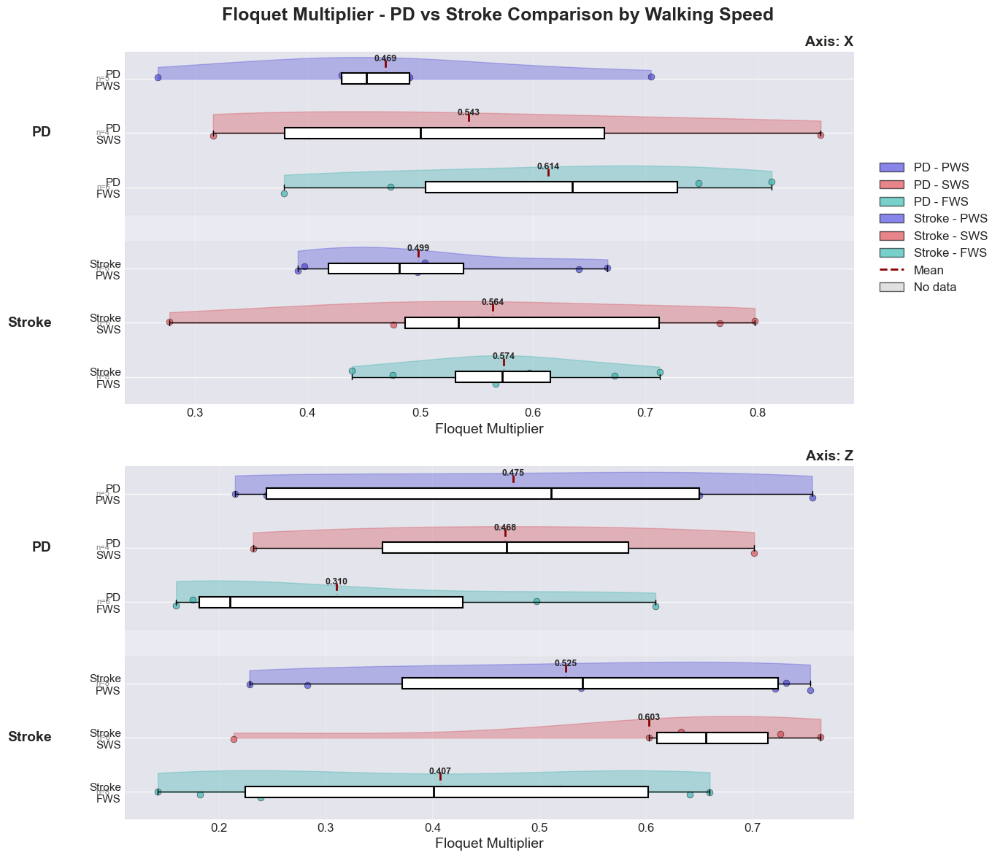


DETAILED STATISTICS

AXIS X:

  PD:
    PWS:
      N: 5
      Mean: 0.4691
      Median: 0.4523
      Std: 0.1572
      Range: [0.2669, 0.7052]
    SWS:
      N: 4
      Mean: 0.5433
      Median: 0.5005
      Std: 0.2401
      Range: [0.3160, 0.8560]
    FWS:
      N: 6
      Mean: 0.6140
      Median: 0.6355
      Std: 0.1647
      Range: [0.3791, 0.8125]

  Stroke:
    PWS:
      N: 8
      Mean: 0.4987
      Median: 0.4818
      Std: 0.1048
      Range: [0.3913, 0.6667]
    SWS:
      N: 6
      Mean: 0.5644
      Median: 0.5342
      Std: 0.1937
      Range: [0.2774, 0.7975]
    FWS:
      N: 8
      Mean: 0.5743
      Median: 0.5728
      Std: 0.0910
      Range: [0.4396, 0.7130]

AXIS Z:

  PD:
    PWS:
      N: 5
      Mean: 0.4753
      Median: 0.5112
      Std: 0.2405
      Range: [0.2151, 0.7557]
    SWS:
      N: 4
      Mean: 0.4680
      Median: 0.4694
      Std: 0.2012
      Range: [0.2320, 0.7013]
    FWS:
      N: 6
      Mean: 0.3103
      Median: 0.2101
      Std: 0

In [207]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from scipy import stats

def rain_plot_floquet_conditions_by_speed(df, 
                                         conditions_to_plot=['PD', 'Stroke'],
                                         axes_to_plot=['x', 'y', 'z'],
                                         value_col='floquet_multiplier'):
    """
    Creates horizontal rain plots for specific conditions (PD and Stroke)
    """

    
    df_filtered = df[df['condition'].isin(conditions_to_plot)]
    
    available_axes = df_filtered['axis'].unique()
    axes_to_use = [ax for ax in axes_to_plot if ax in available_axes]
    
    if len(axes_to_use) == 0:
        print(f"No data found for axes: {axes_to_plot}")
        return
    
    speeds = ['PWS', 'SWS', 'FWS']
    
    n_axes = len(axes_to_use)
    fig, axs = plt.subplots(n_axes, 1, figsize=(14, 6*n_axes))
    
    if n_axes == 1:
        axs = [axs]
    
    # Colors for conditions and speeds
    condition_colors = {
        'PD': {'PWS': "#3734db", 'SWS': "#db343c", 'FWS': "#1EB1A9"},      
        'Stroke': {'PWS': '#3734db', 'SWS': '#db343c', 'FWS': '#1EB1A9'}   
    }
  
    for ax_idx, (ax, axis_name) in enumerate(zip(axs, axes_to_use)):
        # Filter data for this axis
        axis_df = df_filtered[df_filtered['axis'] == axis_name]
        
        # Prepare data structure
        plot_data = []
        plot_labels = []
        plot_colors = []
        plot_positions = []
        
        position = 0
        group_positions = {}
        
        # Process each condition
        for cond_idx, condition in enumerate(conditions_to_plot):
            cond_df = axis_df[axis_df['condition'] == condition]
            group_start = position
        
            if len(cond_df) == 0:
                for speed in speeds:
                    plot_data.append([np.nan])  # Single NaN value for empty data
                    plot_labels.append(f"{condition}\n{speed}")
                    plot_colors.append('#CCCCCC')  # Gray for missing data
                    plot_positions.append(position)
                    position += 1
            else:
                for speed_idx, speed in enumerate(speeds):
                    # Get data for speed
                    speed_data = cond_df[cond_df['walking_speed'] == speed][value_col].dropna().values
                    
                    if len(speed_data) > 0:
                        plot_data.append(speed_data)
                        plot_labels.append(f"{condition}\n{speed}")
                        plot_colors.append(condition_colors[condition][speed])
                        plot_positions.append(position)
                    else:
                        # No data forr speed
                        plot_data.append([np.nan])
                        plot_labels.append(f"{condition}\n{speed}")
                        plot_colors.append('#CCCCCC')
                        plot_positions.append(position)
                    
                    position += 1
            
            group_positions[condition] = (group_start, position - 1)
            position += 0.5  # Add space between conditions
        
        # Create horizontal violin plots (skip for NaN data)
        valid_indices = [i for i, data in enumerate(plot_data) if not (len(data) == 1 and np.isnan(data[0]))]
        
        if valid_indices:
            valid_data = [plot_data[i] for i in valid_indices]
            valid_positions = [plot_positions[i] for i in valid_indices]
            
            parts = ax.violinplot(valid_data, positions=valid_positions, vert=False,
                                 widths=0.8, showmeans=False, showmedians=False, 
                                 showextrema=False)
            
            # Color the violins
            for i, (idx, pc) in enumerate(zip(valid_indices, parts['bodies'])):
                pc.set_facecolor(plot_colors[idx])
                pc.set_alpha(0.3)
                pc.set_edgecolor(plot_colors[idx])
                # Make half violin (bottom half)
                m = np.mean(pc.get_paths()[0].vertices[:, 1])
                pc.get_paths()[0].vertices[:, 1] = np.clip(pc.get_paths()[0].vertices[:, 1], -np.inf, m)
            
            # Add box plots
            bp = ax.boxplot(valid_data, positions=valid_positions, vert=False,
                           widths=0.2, showfliers=False, patch_artist=True)
            
            for i, (box, median) in enumerate(zip(bp['boxes'], bp['medians'])):
                box.set_facecolor('white')
                box.set_edgecolor('black')
                box.set_linewidth(1.5)
                median.set_color('black')
                median.set_linewidth(2)
        
        # Add strip plots (rain drops) and annotations
        for i, (data, pos, color, label) in enumerate(zip(plot_data, plot_positions, plot_colors, plot_labels)):
            if len(data) == 1 and np.isnan(data[0]):
                # Mark missing data
                ax.text(0, pos, 'No data', ha='center', va='center', 
                       fontsize=10, style='italic', color='gray')
            else:
                # Add rain drops
                y_jitter = np.random.normal(0, 0.06, size=len(data))
                ax.scatter(data, np.full_like(data, pos) + y_jitter, 
                          alpha=0.6, s=40, color=color, edgecolor='black', linewidth=0.5)
                
                # Add mean line
                mean_val = np.mean(data)
                ax.vlines(mean_val, pos - 0.35, pos - 0.15, colors='darkred', 
                         linestyles='dashed', linewidth=2)
                
                # Add mean value text
                ax.text(mean_val, pos - 0.45, f'{mean_val:.3f}', 
                       ha='center', va='top', fontsize=9, fontweight='bold')
                
                # Add sample size
                ax.text(ax.get_xlim()[0] - 0.02 * (ax.get_xlim()[1] - ax.get_xlim()[0]), 
                       pos, f'n={len(data)}', ha='right', va='center', fontsize=8, color='gray')
        
        # Add condition separators and labels
        for condition, (start, end) in group_positions.items():
            mid = (start + end) / 2
            ax.axhspan(start - 0.5, end + 0.5, alpha=0.05, color='gray')
            ax.text(ax.get_xlim()[0] - 0.1 * (ax.get_xlim()[1] - ax.get_xlim()[0]), 
                   mid, condition, ha='right', va='center', fontsize=14, fontweight='bold')
       
        # Customize subplot
        ax.set_yticks(plot_positions)
        ax.set_yticklabels(plot_labels, fontsize=11)
        ax.set_xlabel('Floquet Multiplier', fontsize=14)
        
        ax.set_title(f'Axis: {axis_name.upper()}', fontsize=14, fontweight='bold', loc='right')
        
        ax.grid(axis='x', alpha=0.3)
        ax.invert_yaxis()  # Put first items at top
        
       
       
  
    conditions_str = ' vs '.join(conditions_to_plot)
    plt.suptitle(f'Floquet Multiplier - {conditions_str} Comparison by Walking Speed', 
                fontsize=18, fontweight='bold')
    
    # Add legend
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D
    legend_elements = []
    
    for condition in conditions_to_plot:
        for speed in speeds:
            if condition in condition_colors and speed in condition_colors[condition]:
                legend_elements.append(
                    Patch(facecolor=condition_colors[condition][speed], 
                          edgecolor='black', alpha=0.6,
                          label=f'{condition} - {speed}')
                )
    
    legend_elements.extend([
        Line2D([0], [0], color='darkred', linestyle='--', linewidth=2, label='Mean'),
        Patch(facecolor='#CCCCCC', edgecolor='black', alpha=0.6, label='No data')
    ])
    
    # Place legend outside the plot
    axs[0].legend(handles=legend_elements, loc='center left', 
                 bbox_to_anchor=(1.02, 0.5), ncol=1)
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed statistics
    print("\n" + "="*60)
    print("DETAILED STATISTICS")
    print("="*60)
    
    for axis_name in axes_to_use:
        print(f"\nAXIS {axis_name.upper()}:")
        axis_df = df_filtered[df_filtered['axis'] == axis_name]
        
        for condition in conditions_to_plot:
            print(f"\n  {condition}:")
            cond_df = axis_df[axis_df['condition'] == condition]
            
            for speed in speeds:
                speed_data = cond_df[cond_df['walking_speed'] == speed][value_col].dropna()
                if len(speed_data) > 0:
                    print(f"    {speed}:")
                    print(f"      N: {len(speed_data)}")
                    print(f"      Mean: {speed_data.mean():.4f}")
                    print(f"      Median: {speed_data.median():.4f}")
                    print(f"      Std: {speed_data.std():.4f}")
                    print(f"      Range: [{speed_data.min():.4f}, {speed_data.max():.4f}]")
                else:
                    print(f"    {speed}: No data")
    
    # Between-condition comparisons
    print("\n" + "="*60)
    print("BETWEEN-CONDITION COMPARISONS")
    print("="*60)
    
    for axis_name in axes_to_use:
        print(f"\nAXIS {axis_name.upper()}:")
        axis_df = df_filtered[df_filtered['axis'] == axis_name]
        
        for speed in speeds:
            print(f"\n  {speed}:")
            
            # Get data for both conditions
            data_dict = {}
            for condition in conditions_to_plot:
                cond_data = axis_df[(axis_df['condition'] == condition) & 
                                   (axis_df['walking_speed'] == speed)][value_col].dropna()
                if len(cond_data) > 0:
                    data_dict[condition] = cond_data
            
            if len(data_dict) == 2:
                conditions_list = list(data_dict.keys())
                data1 = data_dict[conditions_list[0]]
                data2 = data_dict[conditions_list[1]]
                
                t_stat, p_val = stats.ttest_ind(data1, data2)
                print(f"    {conditions_list[0]} vs {conditions_list[1]}: t = {t_stat:.4f}, p = {p_val:.4f}")
                
                # Effect size (Cohen's d)
                pooled_std = np.sqrt(((len(data1)-1)*data1.std()**2 + (len(data2)-1)*data2.std()**2) / 
                                    (len(data1) + len(data2) - 2))
                if pooled_std > 0:
                    cohen_d = (data1.mean() - data2.mean()) / pooled_std
                    print(f"    Cohen's d: {cohen_d:.4f}")
            else:
                print(f"    Insufficient data for comparison")



rain_plot_floquet_conditions_by_speed(
    df_cga_fl,
    conditions_to_plot=['PD', 'Stroke'],
    axes_to_plot=['x',  'z'],  # Will plot all three axes
    value_col='floquet_multiplier'
)

### Statistical tests

#### by patient

Running Floquet multiplier analysis by walking speed...
FLOQUET MULTIPLIER ANALYSIS BY WALKING SPEED (ALL PATIENTS)
Total patients: 20
Total observations: 212

AXIS ALL - Floquet Multiplier

  PWS vs SWS (n=13):
    PWS: mean=0.772, SD=0.121
    SWS: mean=0.764, SD=0.119
    Shapiro–Wilk p=0.814 → Paired t-test
    Paired t-test: t=0.196, p=0.848
    Mean Δ=0.009, SD=0.156
    Cohen's d=0.054
    Bonferroni α=0.0167
    Sensitivity analyses:
   [ALL floquet_multiplier PWS-SWS] Bootstrap 95% CI on Δmean: [-0.074, 0.092]
   [ALL floquet_multiplier PWS-SWS] LOO t-test p-range:    [0.423, 0.992]
   [ALL floquet_multiplier PWS-SWS] LOO Wilcoxon p-range: [0.424, 0.970]

  PWS vs FWS (n=16):
    PWS: mean=0.785, SD=0.122
    FWS: mean=0.759, SD=0.111
    Shapiro–Wilk p=0.251 → Paired t-test
    Paired t-test: t=0.678, p=0.508
    Mean Δ=0.026, SD=0.153
    Cohen's d=0.169
    Bonferroni α=0.0167
    Sensitivity analyses:
   [ALL floquet_multiplier PWS-FWS] Bootstrap 95% CI on Δmean: [-0.045, 

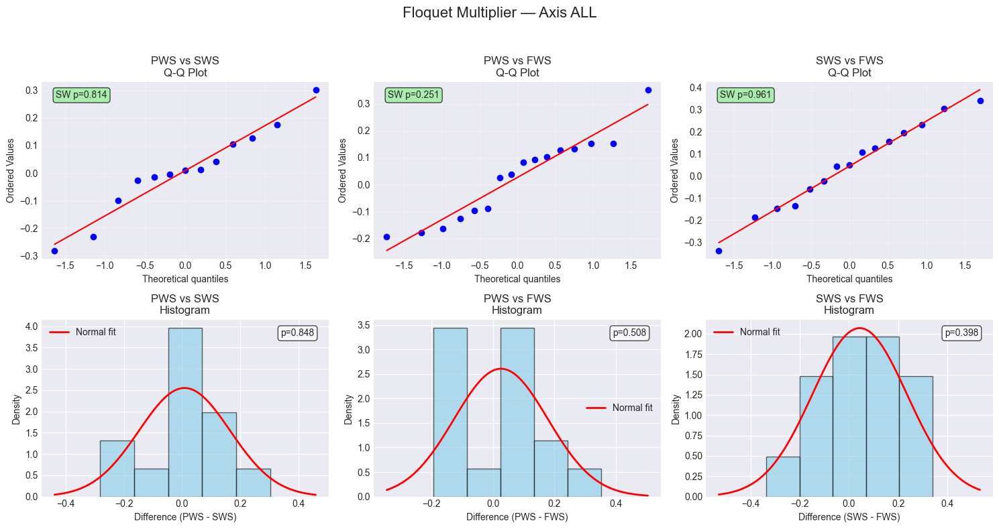


AXIS X - Floquet Multiplier

  PWS vs SWS (n=13):
    PWS: mean=0.536, SD=0.167
    SWS: mean=0.559, SD=0.223
    Shapiro–Wilk p=0.510 → Paired t-test
    Paired t-test: t=-0.247, p=0.809
    Mean Δ=-0.023, SD=0.333
    Cohen's d=-0.068
    Bonferroni α=0.0167
    Sensitivity analyses:
   [X floquet_multiplier PWS-SWS] Bootstrap 95% CI on Δmean: [-0.189, 0.158]
   [X floquet_multiplier PWS-SWS] LOO t-test p-range:    [0.324, 0.998]
   [X floquet_multiplier PWS-SWS] LOO Wilcoxon p-range: [0.266, 0.850]

  PWS vs FWS (n=15):
    PWS: mean=0.518, SD=0.154
    FWS: mean=0.590, SD=0.128
    Shapiro–Wilk p=0.114 → Paired t-test
    Paired t-test: t=-1.304, p=0.213
    Mean Δ=-0.071, SD=0.212
    Cohen's d=-0.337
    Bonferroni α=0.0167
    Sensitivity analyses:
   [X floquet_multiplier PWS-FWS] Bootstrap 95% CI on Δmean: [-0.167, 0.038]
   [X floquet_multiplier PWS-FWS] LOO t-test p-range:    [0.030, 0.353]
   [X floquet_multiplier PWS-FWS] LOO Wilcoxon p-range: [0.042, 0.268]

  SWS vs FWS

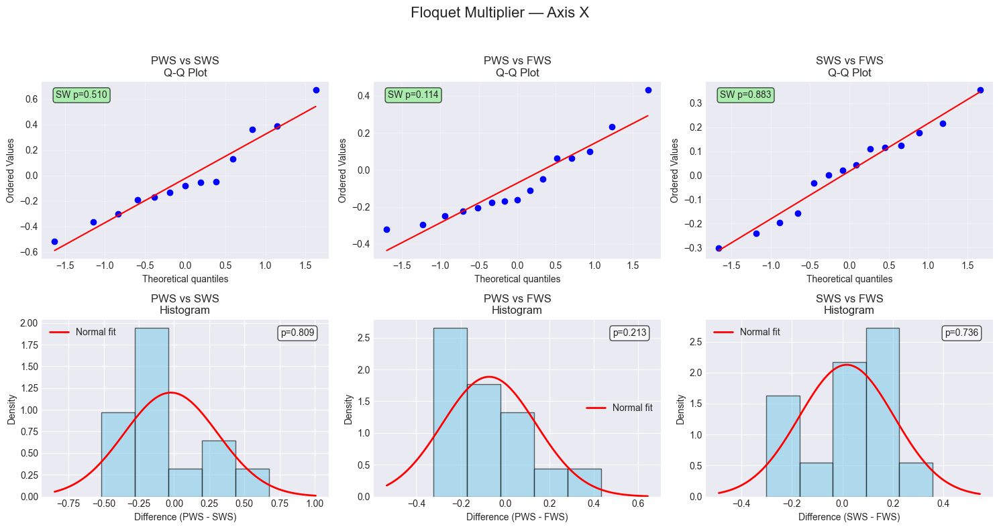


AXIS Y - Floquet Multiplier

  PWS vs SWS (n=13):
    PWS: mean=0.718, SD=0.184
    SWS: mean=0.644, SD=0.122
    Shapiro–Wilk p=0.559 → Paired t-test
    Paired t-test: t=1.094, p=0.295
    Mean Δ=0.074, SD=0.245
    Cohen's d=0.303
    Bonferroni α=0.0167
    Sensitivity analyses:
   [Y floquet_multiplier PWS-SWS] Bootstrap 95% CI on Δmean: [-0.056, 0.195]
   [Y floquet_multiplier PWS-SWS] LOO t-test p-range:    [0.060, 0.500]
   [Y floquet_multiplier PWS-SWS] LOO Wilcoxon p-range: [0.077, 0.424]

  PWS vs FWS (n=16):
    PWS: mean=0.667, SD=0.215
    FWS: mean=0.722, SD=0.155
    Shapiro–Wilk p=0.285 → Paired t-test
    Paired t-test: t=-0.744, p=0.468
    Mean Δ=-0.055, SD=0.296
    Cohen's d=-0.186
    Bonferroni α=0.0167
    Sensitivity analyses:
   [Y floquet_multiplier PWS-FWS] Bootstrap 95% CI on Δmean: [-0.196, 0.081]
   [Y floquet_multiplier PWS-FWS] LOO t-test p-range:    [0.206, 0.779]
   [Y floquet_multiplier PWS-FWS] LOO Wilcoxon p-range: [0.489, 1.000]

  SWS vs FWS (n

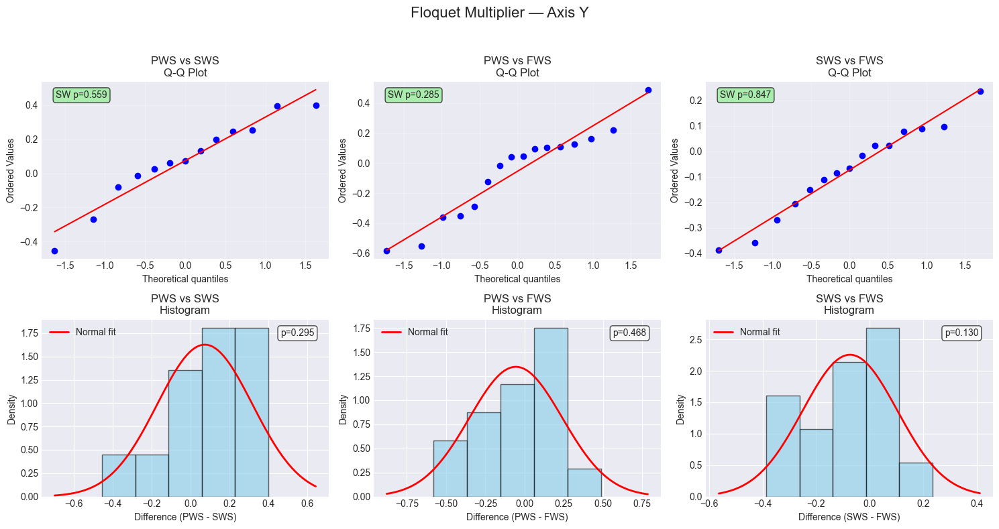


AXIS Z - Floquet Multiplier

  PWS vs SWS (n=13):
    PWS: mean=0.493, SD=0.203
    SWS: mean=0.510, SD=0.205
    Shapiro–Wilk p=0.824 → Paired t-test
    Paired t-test: t=-0.185, p=0.856
    Mean Δ=-0.017, SD=0.330
    Cohen's d=-0.051
    Bonferroni α=0.0167
    Sensitivity analyses:
   [Z floquet_multiplier PWS-SWS] Bootstrap 95% CI on Δmean: [-0.189, 0.152]
   [Z floquet_multiplier PWS-SWS] LOO t-test p-range:    [0.475, 0.929]
   [Z floquet_multiplier PWS-SWS] LOO Wilcoxon p-range: [0.677, 1.000]

  PWS vs FWS (n=16):
    PWS: mean=0.504, SD=0.203
    FWS: mean=0.395, SD=0.203
    Shapiro–Wilk p=0.551 → Paired t-test
    Paired t-test: t=1.608, p=0.129
    Mean Δ=0.110, SD=0.273
    Cohen's d=0.402
    Bonferroni α=0.0167
    Sensitivity analyses:
   [Z floquet_multiplier PWS-FWS] Bootstrap 95% CI on Δmean: [-0.020, 0.240]
   [Z floquet_multiplier PWS-FWS] LOO t-test p-range:    [0.056, 0.243]
   [Z floquet_multiplier PWS-FWS] LOO Wilcoxon p-range: [0.064, 0.252]

  SWS vs FWS (n

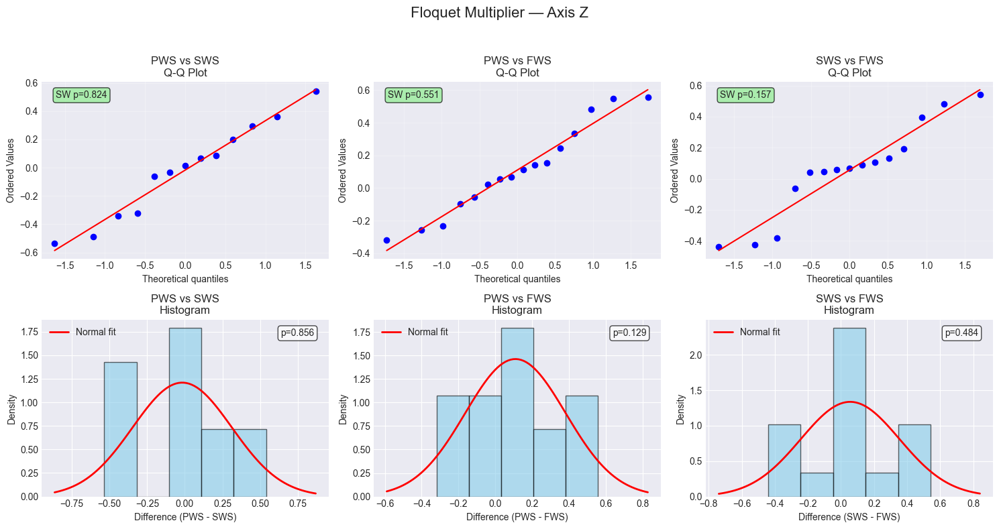

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import shapiro, ttest_rel, wilcoxon
import warnings
warnings.filterwarnings('ignore')

def sensitivity_checks(vals1, vals2, label=""):
    diffs = vals1 - vals2
    n = len(diffs)
    if n < 2:
        print(f"   [{label}] Not enough data for sensitivity.")
        return
    boots = np.random.choice(diffs, (10000, n), replace=True)
    lo, hi = np.percentile(boots.mean(axis=1), [2.5, 97.5])
    print(f"   [{label}] Bootstrap 95% CI on Δmean: [{lo:.3f}, {hi:.3f}]")
    p_t, p_w = [], []
    for i in range(n):
        lv1 = np.delete(vals1, i)
        lv2 = np.delete(vals2, i)
        if len(lv1) > 1:
            p_t.append(ttest_rel(lv1, lv2).pvalue)
            p_w.append(wilcoxon(lv1, lv2).pvalue)
    if p_t and p_w:
        print(f"   [{label}] LOO t-test p-range:    [{np.min(p_t):.3f}, {np.max(p_t):.3f}]")
        print(f"   [{label}] LOO Wilcoxon p-range: [{np.min(p_w):.3f}, {np.max(p_w):.3f}]")

def analyze_floquet_by_speed(df):
    
    # Extract patient ID
    df['patient_id'] = df['subject'].str[1:]
    
    axes = sorted(df['axis'].unique())
    metric_col = 'floquet_multiplier' 
    metric_label = 'Floquet Multiplier'
    
    speed_comparisons = [
        ('PWS', 'SWS'),
        ('PWS', 'FWS'),
        ('SWS', 'FWS')
    ]
    
    print("="*70)
    print("FLOQUET MULTIPLIER ANALYSIS BY WALKING SPEED (ALL PATIENTS)")
    print("="*70)
    print(f"Total patients: {df['patient_id'].nunique()}")
    print(f"Total observations: {len(df)}")
    
    for axis in axes:
        axis_data = df[df['axis'] == axis]
        print(f"\n{'='*60}")
        print(f"AXIS {axis.upper()} - {metric_label}")
        print(f"{'='*60}")
        
        # Create figure for this axis
        fig, axes_plot = plt.subplots(2, len(speed_comparisons), figsize=(5*len(speed_comparisons), 8))
        plt.suptitle(f'{metric_label} — Axis {axis.upper()}', fontsize=16)
        
        for idx, (speed1, speed2) in enumerate(speed_comparisons):
            # Find patients with both speeds
            patients_with_both = []
            for patient in axis_data['patient_id'].unique():
                patient_data = axis_data[axis_data['patient_id'] == patient]
                speeds_present = patient_data['walking_speed'].unique()
                if speed1 in speeds_present and speed2 in speeds_present:
                    patients_with_both.append(patient)
            
            # Get paired values
            vals1 = []
            vals2 = []
            
            for patient in patients_with_both:
                patient_data = axis_data[axis_data['patient_id'] == patient]
                val1 = patient_data[patient_data['walking_speed'] == speed1][metric_col].values
                val2 = patient_data[patient_data['walking_speed'] == speed2][metric_col].values
                
                if len(val1) > 0 and len(val2) > 0:
                    vals1.append(val1[0])
                    vals2.append(val2[0])
            
            vals1 = np.array(vals1)
            vals2 = np.array(vals2)
            
            if len(vals1) < 3:
                print(f"\n  {speed1} vs {speed2}: Insufficient data (n={len(vals1)})")
                # Clear empty subplot
                axes_plot[0, idx].text(0.5, 0.5, 'Insufficient data', 
                                      ha='center', va='center', transform=axes_plot[0, idx].transAxes)
                axes_plot[1, idx].text(0.5, 0.5, 'Insufficient data', 
                                      ha='center', va='center', transform=axes_plot[1, idx].transAxes)
                continue
            
            # Remove any NaN values
            mask = ~(np.isnan(vals1) | np.isnan(vals2))
            vals1 = vals1[mask]
            vals2 = vals2[mask]
            
            if len(vals1) < 3:
                print(f"\n  {speed1} vs {speed2}: Insufficient valid data after removing NaN (n={len(vals1)})")
                # Clear empty subplot
                axes_plot[0, idx].text(0.5, 0.5, 'Insufficient valid data', 
                                      ha='center', va='center', transform=axes_plot[0, idx].transAxes)
                axes_plot[1, idx].text(0.5, 0.5, 'Insufficient valid data', 
                                      ha='center', va='center', transform=axes_plot[1, idx].transAxes)
                continue
            
            diffs = vals1 - vals2
            
            print(f"\n  {speed1} vs {speed2} (n={len(vals1)}):")
            
            # Descriptive by speed
            print(f"    {speed1}: mean={vals1.mean():.3f}, SD={vals1.std(ddof=1):.3f}")
            print(f"    {speed2}: mean={vals2.mean():.3f}, SD={vals2.std(ddof=1):.3f}")
            
            # Normality test
            W, p_sw = shapiro(diffs)
            normal = (p_sw > 0.05)
            test_name = "Paired t-test" if normal else "Wilcoxon signed-rank"
            print(f"    Shapiro–Wilk p={p_sw:.3f} → {test_name}")
            
            # Paired test
            if normal:
                t, pval = ttest_rel(vals1, vals2)
                print(f"    Paired t-test: t={t:.3f}, p={pval:.3f}")
            else:
                w, pval = wilcoxon(vals1, vals2)
                print(f"    Wilcoxon: W={w:.3f}, p={pval:.3f}")
            
            print(f"    Mean Δ={diffs.mean():.3f}, SD={diffs.std(ddof=1):.3f}")
            
            # Cohen's d
            cohen_d = diffs.mean() / diffs.std(ddof=1) if diffs.std(ddof=1) > 0 else 0
            print(f"    Cohen's d={cohen_d:.3f}")
            
            # Bonferroni correction
            bonf_sig = " *" if pval < 0.0167 else ""
            print(f"    Bonferroni α=0.0167{bonf_sig}")
            
            # Q-Q plot
            ax_qq = axes_plot[0, idx]
            stats.probplot(diffs, dist="norm", plot=ax_qq)
            ax_qq.set_title(f"{speed1} vs {speed2}\nQ-Q Plot")
            ax_qq.grid(True, alpha=0.3)
            
            # Add p-value to plot
            ax_qq.text(0.05, 0.95, f'SW p={p_sw:.3f}', 
                      transform=ax_qq.transAxes, 
                      bbox=dict(boxstyle='round', 
                               facecolor='yellow' if p_sw < 0.05 else 'lightgreen', 
                               alpha=0.7),
                      verticalalignment='top')
            
            # Histogram
            ax_hist = axes_plot[1, idx]
            ax_hist.hist(diffs, bins=min(15, max(5,len(diffs)//3)), density=True,
                         color='skyblue', edgecolor='black', alpha=0.6)
            mu, sigma = diffs.mean(), diffs.std(ddof=1)
            if sigma > 0:
                x = np.linspace(diffs.min()-sigma, diffs.max()+sigma, 100)
                ax_hist.plot(x, stats.norm.pdf(x, mu, sigma), 'r-', lw=2, label='Normal fit')
                ax_hist.legend()
            ax_hist.set_xlabel(f'Difference ({speed1} - {speed2})')
            ax_hist.set_ylabel('Density')
            ax_hist.set_title(f"{speed1} vs {speed2}\nHistogram")
            
            # Add test result to histogram
            test_result = f'p={pval:.3f}{bonf_sig}'
            ax_hist.text(0.95, 0.95, test_result, 
                        transform=ax_hist.transAxes, 
                        bbox=dict(boxstyle='round', 
                                 facecolor='yellow' if pval < 0.05 else 'white', 
                                 alpha=0.7),
                        verticalalignment='top',
                        horizontalalignment='right')
            
            # Sensitivity checks
            print("    Sensitivity analyses:")
            sensitivity_checks(vals1, vals2, label=f"{axis.upper()} {metric_col} {speed1}-{speed2}")
        
        plt.tight_layout(rect=[0,0,1,0.95])
        plt.show()




analyze_floquet_by_speed(df_cga_fl)

#### by diagnosis

FLOQUET ANALYSIS BY CONDITION WITH WALKING SPEED COMPARISONS - CGA COHORT
Conditions found: PD, Stroke, MS, Intradural extramedullary, Brain tumor, Parese, Brain absec
Axes: ['all', 'x', 'y', 'z']

PART 1: NORMALITY TESTING BY CONDITION AND AXIS
Testing differences between speed pairs for normality within each condition
If p > 0.05: Use paired t-test (normal)
If p < 0.05: Use Wilcoxon signed-rank test (non-normal)

CONDITION: PD
Total patients in PD: 5

AXIS ALL:
  PWS vs SWS:
    n = 4 pairs
    Shapiro-Wilk p = 0.9538 → Normal → Paired t-test
  PWS vs FWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.1542 → Normal → Paired t-test
  SWS vs FWS:
    n = 4 pairs
    Shapiro-Wilk p = 0.6329 → Normal → Paired t-test

AXIS X:
  PWS vs SWS:
    n = 4 pairs
    Shapiro-Wilk p = 0.3438 → Normal → Paired t-test
  PWS vs FWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.2392 → Normal → Paired t-test
  SWS vs FWS:
    n = 4 pairs
    Shapiro-Wilk p = 0.1035 → Normal → Paired t-test

AXIS Y:
  PWS vs SWS:
  

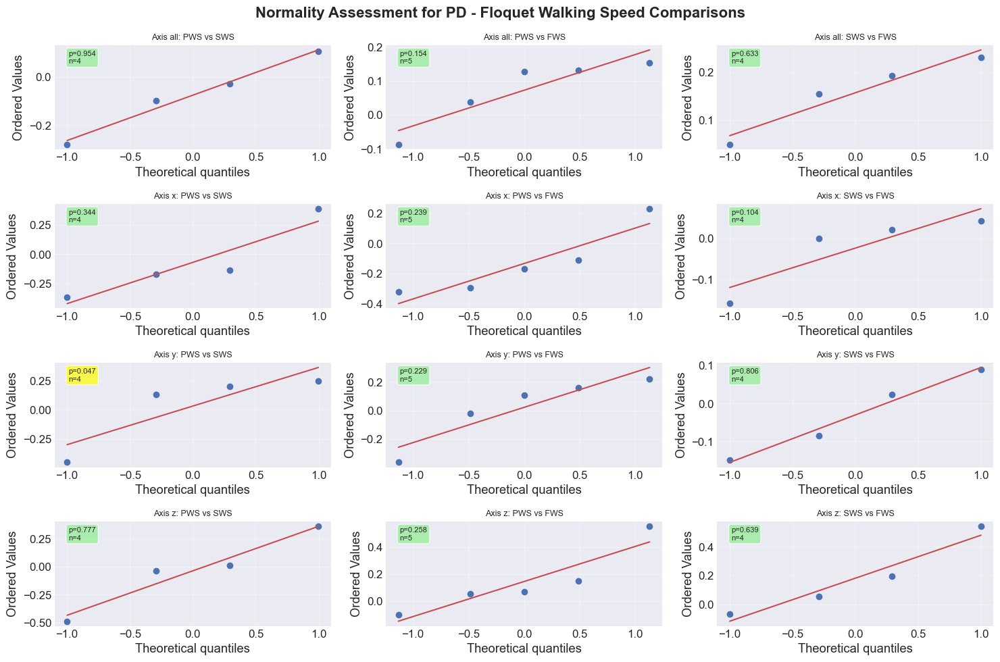


CONDITION: Stroke
Total patients in Stroke: 9

AXIS ALL:
  PWS vs SWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.7901 → Normal → Paired t-test
  PWS vs FWS:
    n = 7 pairs
    Shapiro-Wilk p = 0.2883 → Normal → Paired t-test
  SWS vs FWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.9286 → Normal → Paired t-test

AXIS X:
  PWS vs SWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.2804 → Normal → Paired t-test
  PWS vs FWS:
    n = 7 pairs
    Shapiro-Wilk p = 0.2046 → Normal → Paired t-test
  SWS vs FWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.2760 → Normal → Paired t-test

AXIS Y:
  PWS vs SWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.5794 → Normal → Paired t-test
  PWS vs FWS:
    n = 7 pairs
    Shapiro-Wilk p = 0.5567 → Normal → Paired t-test
  SWS vs FWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.5755 → Normal → Paired t-test

AXIS Z:
  PWS vs SWS:
    n = 5 pairs
    Shapiro-Wilk p = 0.9246 → Normal → Paired t-test
  PWS vs FWS:
    n = 7 pairs
    Shapiro-Wilk p = 0.6365 → Normal → Paired t-test
  

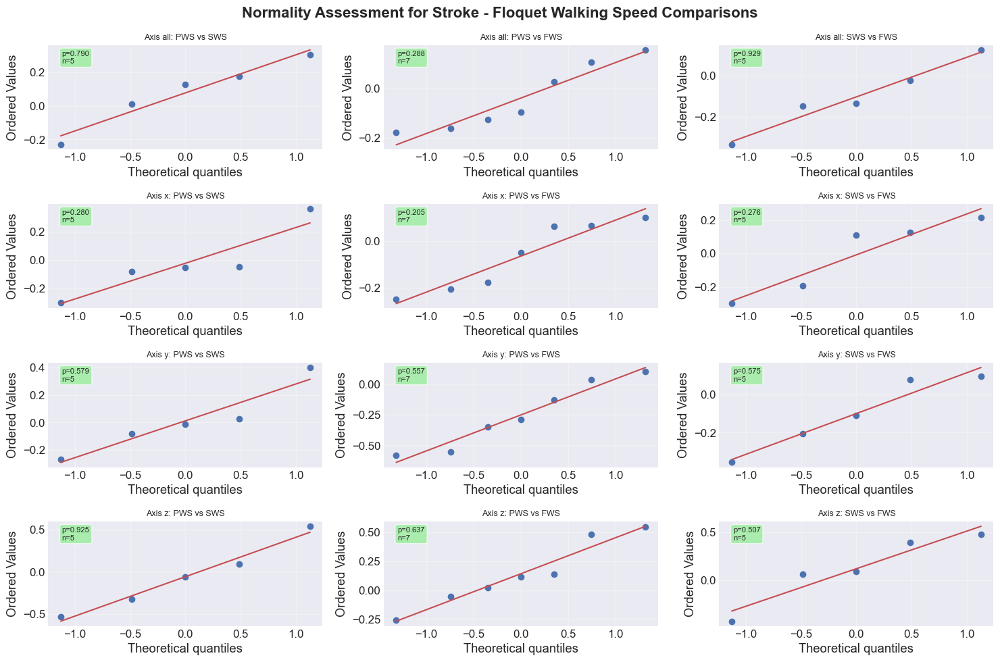


CONDITION: MS
Total patients in MS: 2

AXIS ALL:
  PWS vs SWS: Insufficient data (n=2)
  PWS vs FWS: Insufficient data (n=2)
  SWS vs FWS: Insufficient data (n=2)

AXIS X:
  PWS vs SWS: Insufficient data (n=2)
  PWS vs FWS: Insufficient data (n=2)
  SWS vs FWS: Insufficient data (n=2)

AXIS Y:
  PWS vs SWS: Insufficient data (n=2)
  PWS vs FWS: Insufficient data (n=2)
  SWS vs FWS: Insufficient data (n=2)

AXIS Z:
  PWS vs SWS: Insufficient data (n=2)
  PWS vs FWS: Insufficient data (n=2)
  SWS vs FWS: Insufficient data (n=2)


<Figure size 1500x1000 with 0 Axes>


CONDITION: Intradural extramedullary
Total patients in Intradural extramedullary: 1

AXIS ALL:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

AXIS X:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

AXIS Y:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

AXIS Z:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)


<Figure size 1500x1000 with 0 Axes>


CONDITION: Brain tumor
Total patients in Brain tumor: 1

AXIS ALL:
  PWS vs SWS: Insufficient data (n=0)
  PWS vs FWS: Insufficient data (n=0)
  SWS vs FWS: Insufficient data (n=1)

AXIS X:
  PWS vs SWS: Insufficient data (n=0)
  PWS vs FWS: Insufficient data (n=0)
  SWS vs FWS: Insufficient data (n=1)

AXIS Y:
  PWS vs SWS: Insufficient data (n=0)
  PWS vs FWS: Insufficient data (n=0)
  SWS vs FWS: Insufficient data (n=1)

AXIS Z:
  PWS vs SWS: Insufficient data (n=0)
  PWS vs FWS: Insufficient data (n=0)
  SWS vs FWS: Insufficient data (n=1)


<Figure size 1500x1000 with 0 Axes>


CONDITION: Parese
Total patients in Parese: 1

AXIS ALL:
  PWS vs SWS: Insufficient data (n=0)
  PWS vs FWS: Insufficient data (n=0)
  SWS vs FWS: Insufficient data (n=1)

AXIS X:
  PWS vs SWS: Insufficient data (n=0)
  PWS vs FWS: Insufficient data (n=0)
  SWS vs FWS: Insufficient data (n=1)

AXIS Y:
  PWS vs SWS: Insufficient data (n=0)
  PWS vs FWS: Insufficient data (n=0)
  SWS vs FWS: Insufficient data (n=1)

AXIS Z:
  PWS vs SWS: Insufficient data (n=0)
  PWS vs FWS: Insufficient data (n=0)
  SWS vs FWS: Insufficient data (n=1)


<Figure size 1500x1000 with 0 Axes>


CONDITION: Brain absec
Total patients in Brain absec: 1

AXIS ALL:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

AXIS X:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=0)
  SWS vs FWS: Insufficient data (n=0)

AXIS Y:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)

AXIS Z:
  PWS vs SWS: Insufficient data (n=1)
  PWS vs FWS: Insufficient data (n=1)
  SWS vs FWS: Insufficient data (n=1)


<Figure size 1500x1000 with 0 Axes>


REPEATED MEASURES ANOVA BY CONDITION AND AXIS

CONDITION: PD
Total patients: 5
Axes available: ['all', 'x', 'y', 'z']

REPEATED MEASURES ANOVA RESULTS FOR PD
--------------------------------------------------------------------------------

AXIS ALL
H₀: μ_PWS = μ_SWS = μ_FWS (no difference across speeds)
H₁: At least one speed differs
Note: Higher values indicate more chaotic/unstable gait dynamics
Complete cases: 4 / 5 patients
Means ± SD:
  PWS: 0.7892 ± 0.1662
  SWS: 0.8648 ± 0.0433
  FWS: 0.7079 ± 0.0940

Repeated Measures ANOVA:
              Anova
      F Value Num DF Den DF Pr > F
----------------------------------
speed  1.0476 2.0000 6.0000 0.4072



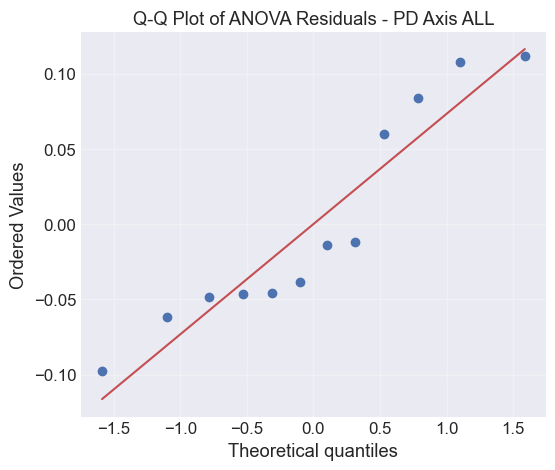


Inferential Statistics:
  Friedman χ² = 4.500, p = 0.1054
  RM-ANOVA F = 1.048, p = 0.4072
  ANOVA residuals Shapiro–Wilk: W = 0.879, p = 0.0846
  Normality assumption: Met
→ Friedman: NOT SIGNIFICANT omnibus (fail to reject H₀)
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

POST-HOC PAIRWISE COMPARISONS (Bonferroni α = 0.0167):

  PWS vs SWS (n=4 pairs):
    PWS Mean: 0.7892, SWS Mean: 0.8648
    Mean difference: -0.0756
    Test used: Paired t-test (Shapiro-Wilk p=0.9538)
    Test statistic: -0.9392
    p-value: 0.4169
    Cohen's d: -0.4696
    Result: NOT SIGNIFICANT after Bonferroni correction
    Sensitivity analyses:
      [PD Axis all PWS vs SWS] Bootstrap 95% CI on mean difference: [-0.2177, 0.0542]
      [PD Axis all PWS vs SWS] LOO t-test p-value range: [0.2135, 0.9161]
      [PD Axis all PWS vs SWS] LOO Wilcoxon p-value range: [0.2500, 1.0000]
      [PD Axis all PWS vs SWS] LOO significance stability: t-test 0/4, Wilcoxon 0/4
      [PD Axis all PWS vs SWS] LOO Bo

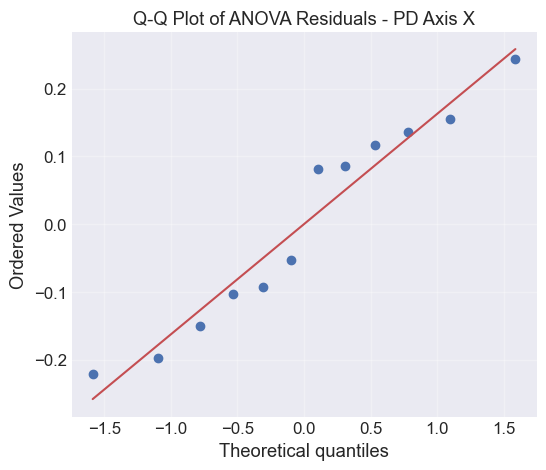


Inferential Statistics:
  Friedman χ² = 2.000, p = 0.3679
  RM-ANOVA F = 1.191, p = 0.3667
  ANOVA residuals Shapiro–Wilk: W = 0.933, p = 0.4127
  Normality assumption: Met
→ Friedman: NOT SIGNIFICANT omnibus (fail to reject H₀)
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

POST-HOC PAIRWISE COMPARISONS (Bonferroni α = 0.0167):

  PWS vs SWS (n=4 pairs):
    PWS Mean: 0.4733, SWS Mean: 0.5433
    Mean difference: -0.0700
    Test used: Paired t-test (Shapiro-Wilk p=0.3438)
    Test statistic: -0.4340
    p-value: 0.6936
    Cohen's d: -0.2170
    Result: NOT SIGNIFICANT after Bonferroni correction
    Sensitivity analyses:
      [PD Axis x PWS vs SWS] Bootstrap 95% CI on mean difference: [-0.3075, 0.2494]
      [PD Axis x PWS vs SWS] LOO t-test p-value range: [0.0900, 0.8894]
      [PD Axis x PWS vs SWS] LOO Wilcoxon p-value range: [0.2500, 1.0000]
      [PD Axis x PWS vs SWS] LOO significance stability: t-test 0/4, Wilcoxon 0/4
      [PD Axis x PWS vs SWS] LOO Bonferroni s

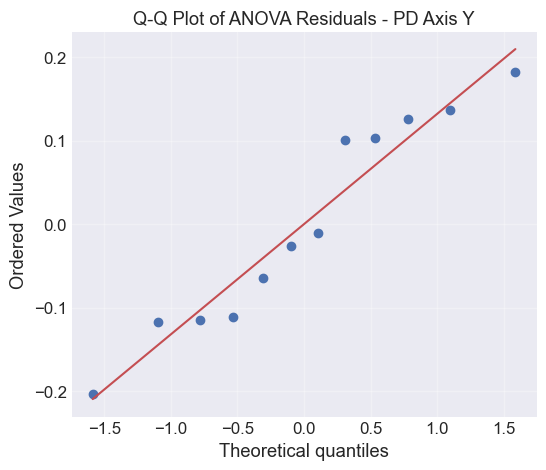


Inferential Statistics:
  Friedman χ² = 0.500, p = 0.7788
  RM-ANOVA F = 1.009, p = 0.4190
  ANOVA residuals Shapiro–Wilk: W = 0.927, p = 0.3496
  Normality assumption: Met
→ Friedman: NOT SIGNIFICANT omnibus (fail to reject H₀)
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

POST-HOC PAIRWISE COMPARISONS (Bonferroni α = 0.0167):

  PWS vs SWS (n=4 pairs):
    PWS Mean: 0.6864, SWS Mean: 0.6558
    Mean difference: 0.0306
    Test used: Wilcoxon signed-rank (Shapiro-Wilk p=0.0473)
    Test statistic: 4.0000
    p-value: 0.8750
    Cohen's d: 0.0940
    Result: NOT SIGNIFICANT after Bonferroni correction
    Sensitivity analyses:
      [PD Axis y PWS vs SWS] Bootstrap 95% CI on mean difference: [-0.2905, 0.2220]
      [PD Axis y PWS vs SWS] LOO t-test p-value range: [0.0290, 0.9906]
      [PD Axis y PWS vs SWS] LOO Wilcoxon p-value range: [0.2500, 1.0000]
      [PD Axis y PWS vs SWS] LOO significance stability: t-test 1/4, Wilcoxon 0/4
      [PD Axis y PWS vs SWS] LOO Bonferro

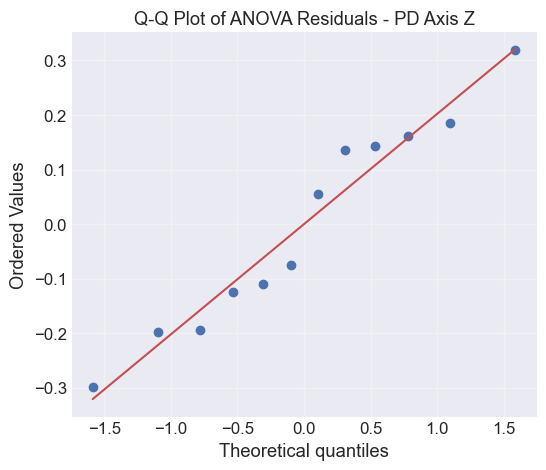


Inferential Statistics:
  Friedman χ² = 1.500, p = 0.4724
  RM-ANOVA F = 0.060, p = 0.9419
  ANOVA residuals Shapiro–Wilk: W = 0.947, p = 0.5898
  Normality assumption: Met
→ Friedman: NOT SIGNIFICANT omnibus (fail to reject H₀)
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

POST-HOC PAIRWISE COMPARISONS (Bonferroni α = 0.0167):

  PWS vs SWS (n=4 pairs):
    PWS Mean: 0.4316, SWS Mean: 0.4680
    Mean difference: -0.0364
    Test used: Paired t-test (Shapiro-Wilk p=0.7770)
    Test statistic: -0.2093
    p-value: 0.8476
    Cohen's d: -0.1046
    Result: NOT SIGNIFICANT after Bonferroni correction
    Sensitivity analyses:
      [PD Axis z PWS vs SWS] Bootstrap 95% CI on mean difference: [-0.3616, 0.2628]
      [PD Axis z PWS vs SWS] LOO t-test p-value range: [0.3993, 0.8932]
      [PD Axis z PWS vs SWS] LOO Wilcoxon p-value range: [0.5000, 1.0000]
      [PD Axis z PWS vs SWS] LOO significance stability: t-test 0/4, Wilcoxon 0/4
      [PD Axis z PWS vs SWS] LOO Bonferroni s

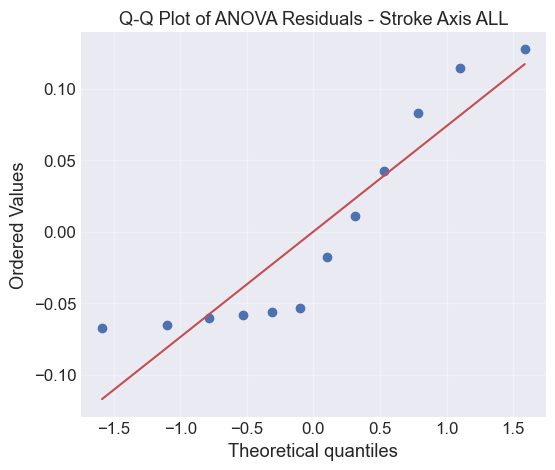


Inferential Statistics:
  Friedman χ² = 6.000, p = 0.0498
  RM-ANOVA F = 0.394, p = 0.6907
  ANOVA residuals Shapiro–Wilk: W = 0.827, p = 0.0193
  Normality assumption: Violated
→ Friedman: SIGNIFICANT omnibus (reject H₀)
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

POST-HOC PAIRWISE COMPARISONS (Bonferroni α = 0.0167):

  PWS vs SWS (n=5 pairs):
    PWS Mean: 0.7478, SWS Mean: 0.6714
    Mean difference: 0.0764
    Test used: Paired t-test (Shapiro-Wilk p=0.7901)
    Test statistic: 0.8473
    p-value: 0.4446
    Cohen's d: 0.3789
    Result: NOT SIGNIFICANT after Bonferroni correction
    Sensitivity analyses:
      [Stroke Axis all PWS vs SWS] Bootstrap 95% CI on mean difference: [-0.0883, 0.2183]
      [Stroke Axis all PWS vs SWS] LOO t-test p-value range: [0.0844, 0.8400]
      [Stroke Axis all PWS vs SWS] LOO Wilcoxon p-value range: [0.1250, 0.8750]
      [Stroke Axis all PWS vs SWS] LOO significance stability: t-test 0/5, Wilcoxon 0/5
      [Stroke Axis all PWS vs S

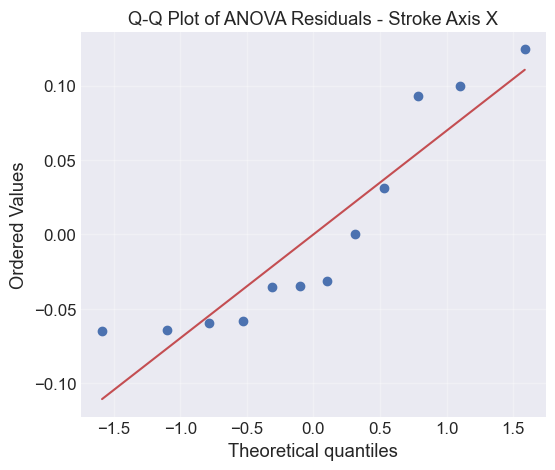


Inferential Statistics:
  Friedman χ² = 0.500, p = 0.7788
  RM-ANOVA F = 3.262, p = 0.1100
  ANOVA residuals Shapiro–Wilk: W = 0.833, p = 0.0229
  Normality assumption: Violated
→ Friedman: NOT SIGNIFICANT omnibus (fail to reject H₀)
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

POST-HOC PAIRWISE COMPARISONS (Bonferroni α = 0.0167):

  PWS vs SWS (n=5 pairs):
    PWS Mean: 0.5012, SWS Mean: 0.5240
    Mean difference: -0.0228
    Test used: Paired t-test (Shapiro-Wilk p=0.2804)
    Test statistic: -0.2121
    p-value: 0.8424
    Cohen's d: -0.0948
    Result: NOT SIGNIFICANT after Bonferroni correction
    Sensitivity analyses:
      [Stroke Axis x PWS vs SWS] Bootstrap 95% CI on mean difference: [-0.1995, 0.1921]
      [Stroke Axis x PWS vs SWS] LOO t-test p-value range: [0.1431, 0.9544]
      [Stroke Axis x PWS vs SWS] LOO Wilcoxon p-value range: [0.1250, 0.8750]
      [Stroke Axis x PWS vs SWS] LOO significance stability: t-test 0/5, Wilcoxon 0/5
      [Stroke Axis x PWS

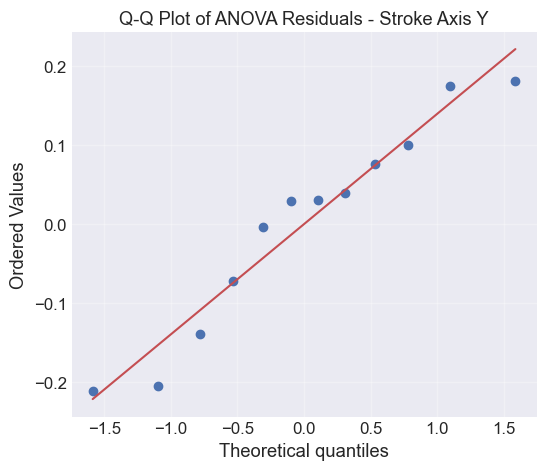


Inferential Statistics:
  Friedman χ² = 0.500, p = 0.7788
  RM-ANOVA F = 0.045, p = 0.9565
  ANOVA residuals Shapiro–Wilk: W = 0.931, p = 0.3899
  Normality assumption: Met
→ Friedman: NOT SIGNIFICANT omnibus (fail to reject H₀)
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

POST-HOC PAIRWISE COMPARISONS (Bonferroni α = 0.0167):

  PWS vs SWS (n=5 pairs):
    PWS Mean: 0.6906, SWS Mean: 0.6785
    Mean difference: 0.0121
    Test used: Paired t-test (Shapiro-Wilk p=0.5794)
    Test statistic: 0.1104
    p-value: 0.9174
    Cohen's d: 0.0494
    Result: NOT SIGNIFICANT after Bonferroni correction
    Sensitivity analyses:
      [Stroke Axis y PWS vs SWS] Bootstrap 95% CI on mean difference: [-0.1675, 0.2287]
      [Stroke Axis y PWS vs SWS] LOO t-test p-value range: [0.2863, 0.9568]
      [Stroke Axis y PWS vs SWS] LOO Wilcoxon p-value range: [0.3750, 1.0000]
      [Stroke Axis y PWS vs SWS] LOO significance stability: t-test 0/5, Wilcoxon 0/5
      [Stroke Axis y PWS vs SWS]

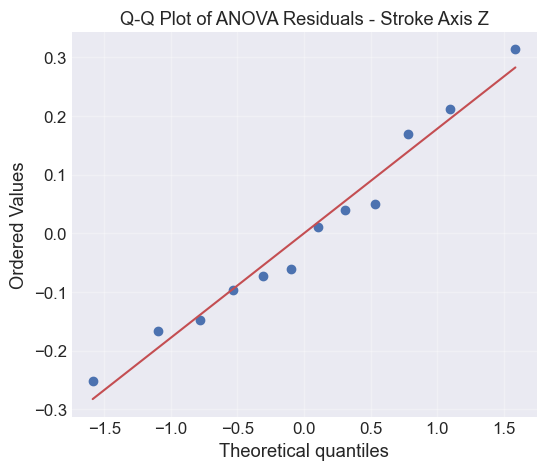


Inferential Statistics:
  Friedman χ² = 0.500, p = 0.7788
  RM-ANOVA F = 0.490, p = 0.6352
  ANOVA residuals Shapiro–Wilk: W = 0.969, p = 0.8969
  Normality assumption: Met
→ Friedman: NOT SIGNIFICANT omnibus (fail to reject H₀)
→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)

POST-HOC PAIRWISE COMPARISONS (Bonferroni α = 0.0167):

  PWS vs SWS (n=5 pairs):
    PWS Mean: 0.5289, SWS Mean: 0.5879
    Mean difference: -0.0589
    Test used: Paired t-test (Shapiro-Wilk p=0.9246)
    Test statistic: -0.3203
    p-value: 0.7648
    Cohen's d: -0.1432
    Result: NOT SIGNIFICANT after Bonferroni correction
    Sensitivity analyses:
      [Stroke Axis z PWS vs SWS] Bootstrap 95% CI on mean difference: [-0.3665, 0.2687]
      [Stroke Axis z PWS vs SWS] LOO t-test p-value range: [0.2281, 0.9755]
      [Stroke Axis z PWS vs SWS] LOO Wilcoxon p-value range: [0.3750, 1.0000]
      [Stroke Axis z PWS vs SWS] LOO significance stability: t-test 0/5, Wilcoxon 0/5
      [Stroke Axis z PWS vs S

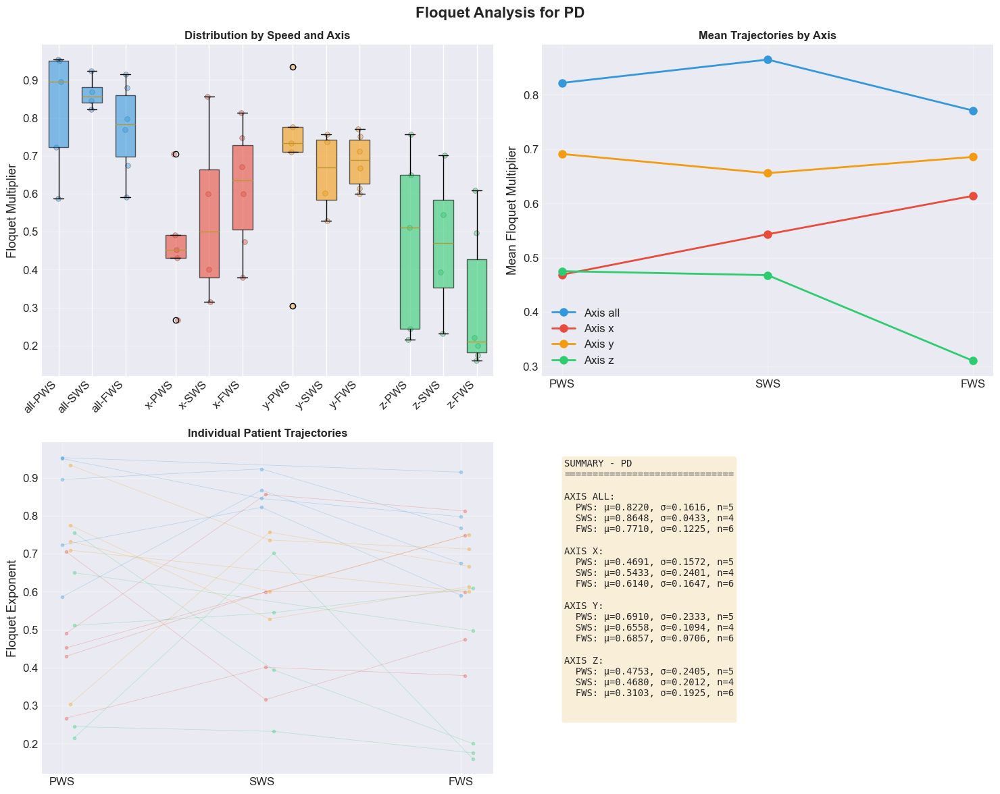

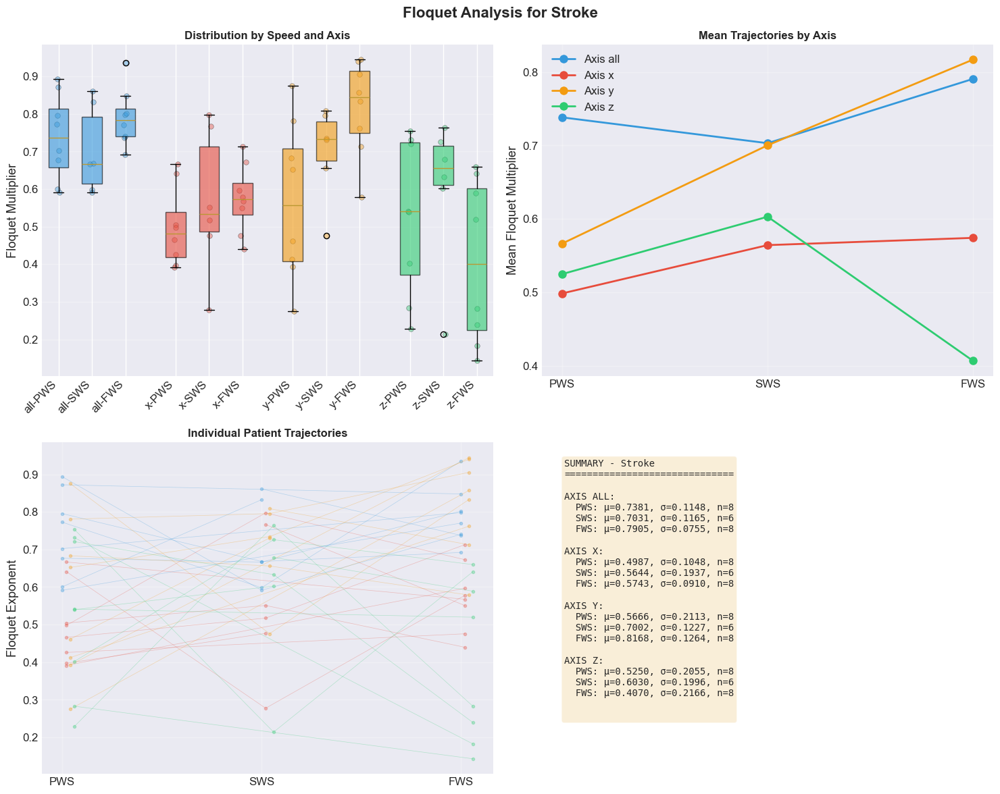

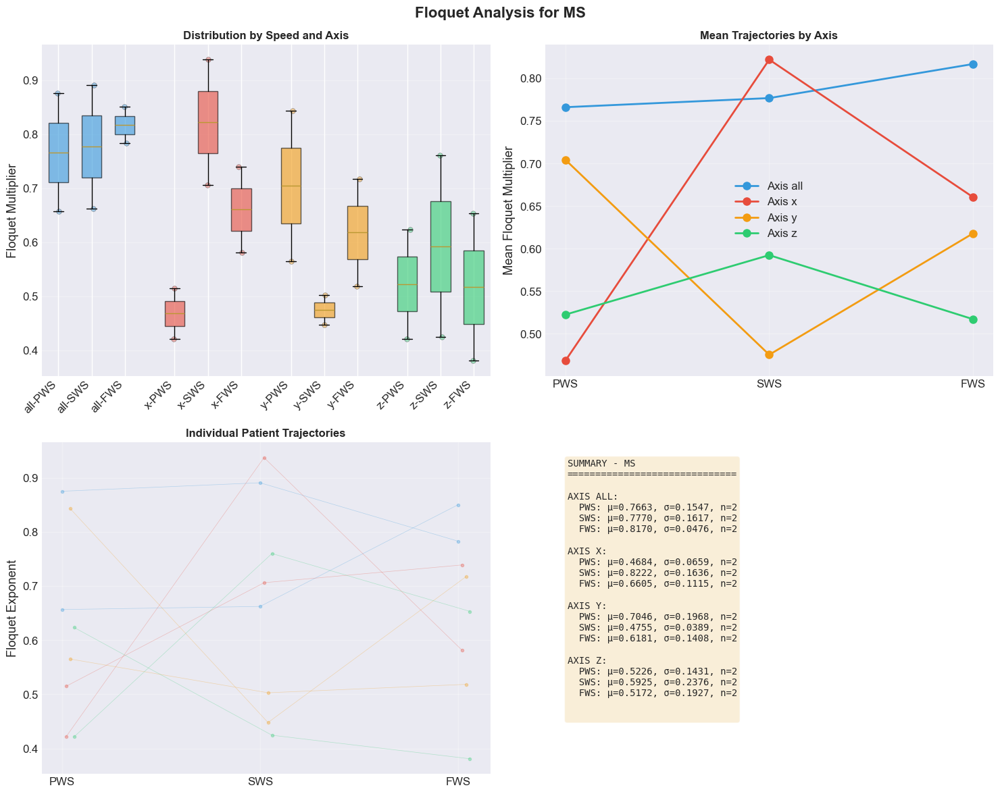

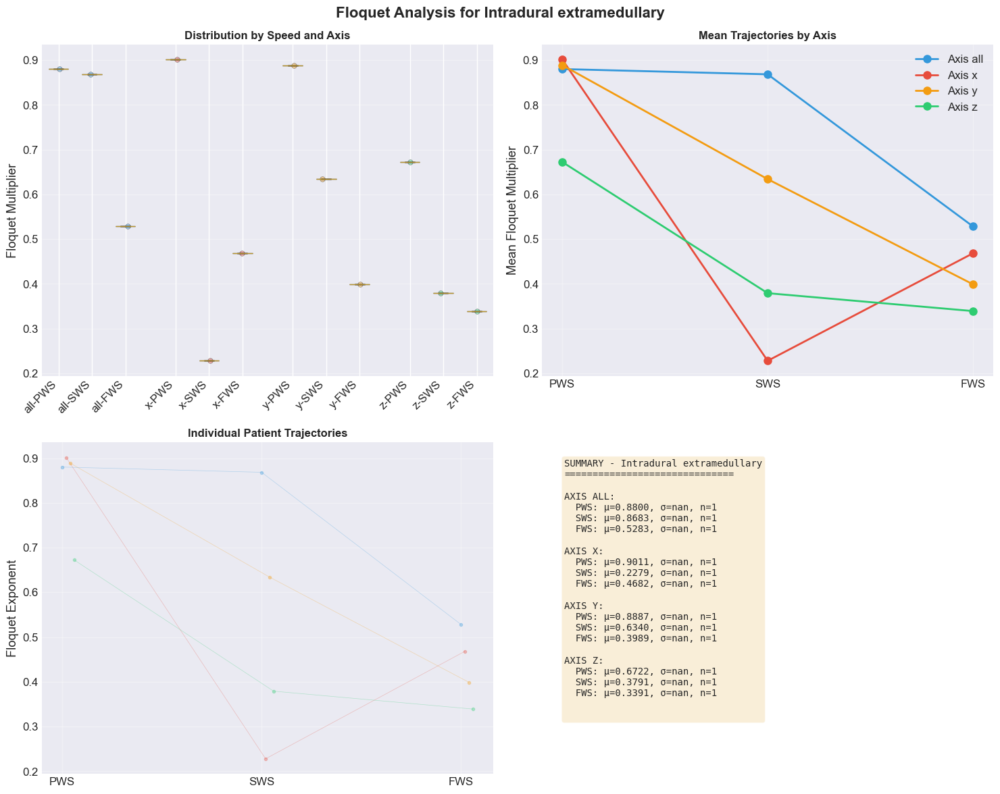


LEAVE-ONE-OUT SENSITIVITY SUMMARY - CGA Cohort


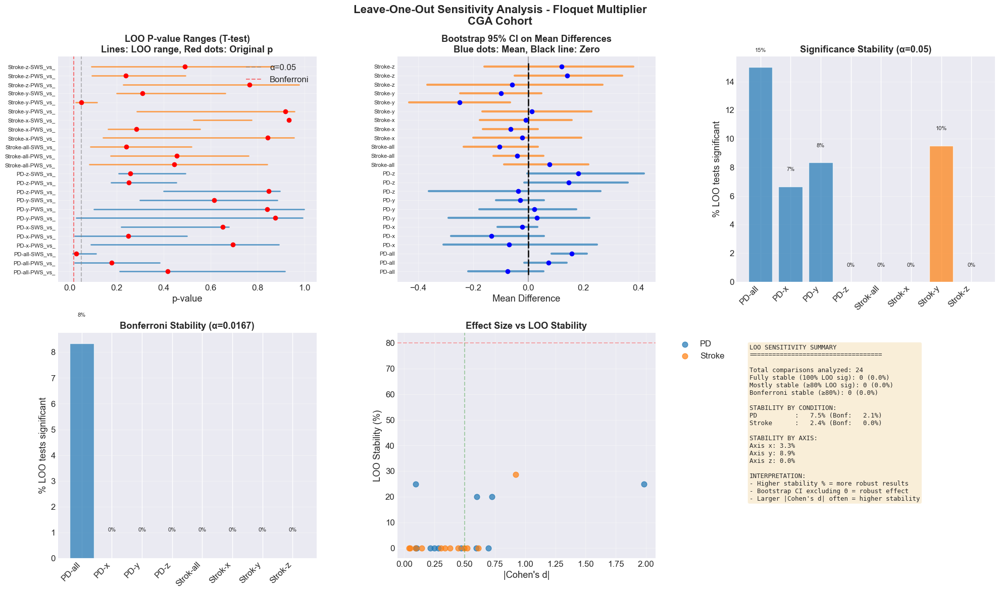


DETAILED LOO RESULTS TABLE
----------------------------------------------------------------------------------------------------
Condition       Axis  Comparison   n    Original p  LOO p-range          Stability       Bootstrap CI             
----------------------------------------------------------------------------------------------------
PD              all   PWS_vs_SWS   4    0.4169      [0.213, 0.916]       0/4 (0%)        [-0.218, 0.054]          
PD              all   PWS_vs_FWS   5    0.1795      [0.021, 0.383]       1/5 (20%)       [-0.015, 0.140]          
PD              all   SWS_vs_FWS   4    0.0286      [0.013, 0.113]       1/4 (25%)       [0.084, 0.213]           
PD              x     PWS_vs_SWS   4    0.6936      [0.090, 0.889]       0/4 (0%)        [-0.307, 0.249]          
PD              x     PWS_vs_FWS   5    0.2496      [0.021, 0.499]       1/5 (20%)       [-0.281, 0.057]          
PD              x     SWS_vs_FWS   4    0.6508      [0.219, 0.678]       0/4 (0%

In [208]:

import numpy as np
import pandas as pd
from scipy import stats
from scipy.stats import ttest_rel, wilcoxon, shapiro, friedmanchisquare
import matplotlib.pyplot as plt
from statsmodels.stats.anova import AnovaRM
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

def analyze_by_condition(results_floquet, cohort_name="Neurological Patients"):
    """
    Complete condition-based Lyapunov analysis with repeated measures ANOVA for each condition and axis
    including LOO sensitivity analysis
    
    """
    
    # Extract patient ID from subject names if needed
    if 'patient_id' not in results_floquet.columns:
        results_floquet['patient_id'] = results_floquet['subject'].str[1:]
    
    # Get unique conditions (diagnoses) and axes
    conditions = results_floquet['condition'].unique()
    axes = sorted(results_floquet['axis'].unique())
    speed_comparisons = [('PWS', 'SWS'), ('PWS', 'FWS'), ('SWS', 'FWS')]
    
    print("="*80)
    print(f"FLOQUET ANALYSIS BY CONDITION WITH WALKING SPEED COMPARISONS - {cohort_name.upper()}")
    print("="*80)
    print(f"Conditions found: {', '.join(conditions)}")
    print(f"Axes: {axes}")
    

    hypothesis = {
        'H0': 'μ_PWS = μ_SWS = μ_FWS (no difference across speeds)',
        'H1': 'At least one speed differs',
        'interpretation': 'Higher values indicate more chaotic/unstable gait dynamics'
    }
    
    all_condition_results = {}
    all_normality_results = {}
    
    # NORMALITY TESTING BY CONDITION
    print(f"\n{'='*70}")
    print("PART 1: NORMALITY TESTING BY CONDITION AND AXIS")
    print(f"{'='*70}")
    print("Testing differences between speed pairs for normality within each condition")
    print("If p > 0.05: Use paired t-test (normal)")
    print("If p < 0.05: Use Wilcoxon signed-rank test (non-normal)")
    
    for condition in conditions:
        print(f"\n{'='*70}")
        print(f"CONDITION: {condition}")
        print(f"{'='*70}")
        
        # Filter data for this condition
        condition_data =results_floquet[results_floquet['condition'] == condition]
        condition_patients = condition_data['patient_id'].unique()
        print(f"Total patients in {condition}: {len(condition_patients)}")
        
        # Create figure for this condition's normality tests
        fig = plt.figure(figsize=(15, 10))
        fig.suptitle(f'Normality Assessment for {condition} - Floquet Walking Speed Comparisons', 
                      fontsize=16, fontweight='bold')
        
        plot_idx = 0
        condition_normality = {}
        
        for axis_idx, axis in enumerate(axes):
            print(f"\nAXIS {axis.upper()}:")
            axis_normality = {}
            
            # Filter for this axis
            axis_data = condition_data[condition_data['axis'] == axis]
            
            for comp_idx, (speed1, speed2) in enumerate(speed_comparisons):
                # Find patients that have both speeds in this condition and axis
                patients_with_pair = []
                
                for patient in axis_data['patient_id'].unique():
                    patient_data = axis_data[axis_data['patient_id'] == patient]
                    speeds_present = patient_data['walking_speed'].unique()
                    if speed1 in speeds_present and speed2 in speeds_present:
                        patients_with_pair.append(patient)
                
                # Get paired data
                vals1 = []
                vals2 = []
                
                for patient in patients_with_pair:
                    patient_data = axis_data[axis_data['patient_id'] == patient]
                    val1 = patient_data[patient_data['walking_speed'] == speed1]['floquet_multiplier'].values
                    val2 = patient_data[patient_data['walking_speed'] == speed2]['floquet_multiplier'].values
                    
                    if len(val1) > 0 and len(val2) > 0:
                        vals1.append(val1[0])
                        vals2.append(val2[0])
                
                vals1 = np.array(vals1)
                vals2 = np.array(vals2)
                
                if len(vals1) >= 3:  # Need at least 3 pairs
                    # Calculate differences
                    differences = vals1 - vals2
                    n_pairs = len(differences)
                    
                    # Shapiro-Wilk test
                    statistic, p_value = shapiro(differences)
                    
                    if p_value > 0.05:
                        test_recommendation = "Paired t-test"
                        normality_status = "Normal"
                    else:
                        test_recommendation = "Wilcoxon signed-rank"
                        normality_status = "Non-normal"
                    
                    axis_normality[f"{speed1}_vs_{speed2}"] = {
                        'test': test_recommendation,
                        'p_value': p_value,
                        'n': n_pairs,
                        'mean_diff': np.mean(differences),
                        'std_diff': np.std(differences, ddof=1)
                    }
                    
                    # Print results
                    print(f"  {speed1} vs {speed2}:")
                    print(f"    n = {n_pairs} pairs")
                    print(f"    Shapiro-Wilk p = {p_value:.4f} → {normality_status} → {test_recommendation}")
                    
                    # Q-Q plot
                    ax_qq = plt.subplot(len(axes), len(speed_comparisons), plot_idx + 1)
                    stats.probplot(differences, dist="norm", plot=ax_qq)
                    ax_qq.set_title(f'Axis {axis}: {speed1} vs {speed2}', fontsize=9)
                    ax_qq.grid(True, alpha=0.3)
                    
                    # Add p-value to plot
                    ax_qq.text(0.05, 0.95, f'p={p_value:.3f}\nn={n_pairs}', 
                              transform=ax_qq.transAxes, 
                              bbox=dict(boxstyle='round', 
                                       facecolor='yellow' if p_value < 0.05 else 'lightgreen', 
                                       alpha=0.7),
                              verticalalignment='top', fontsize=8)
                    
                    plot_idx += 1
                else:
                    print(f"  {speed1} vs {speed2}: Insufficient data (n={len(vals1)})")
                    axis_normality[f"{speed1}_vs_{speed2}"] = {
                        'test': "Insufficient data",
                        'p_value': np.nan,
                        'n': len(vals1)
                    }
            
            condition_normality[axis] = axis_normality
        
        all_normality_results[condition] = condition_normality
        
        plt.tight_layout()
        plt.show()
        
   
    print(f"\n{'='*70}")
    print("REPEATED MEASURES ANOVA BY CONDITION AND AXIS")
    print(f"{'='*70}")
    
    # Process each condition separately
    for condition in conditions:
        print(f"\n{'='*80}")
        print(f"CONDITION: {condition}")
        print(f"{'='*80}")
        
        # Filter data for this condition
        condition_data = results_floquet[results_floquet['condition'] == condition]
        patients = condition_data['patient_id'].unique()
        
        print(f"Total patients: {len(patients)}")
        print(f"Axes available: {axes}")
        
        print(f"\nREPEATED MEASURES ANOVA RESULTS FOR {condition}")
        print("-"*80)
        
        condition_results = {
            'anova_results': {},
            'pairwise_results': {},
            'summary_stats': {}
        }
        
        # ANOVA analysis for each axis in this condition
        for axis in axes:
            print(f"\n{'='*60}")
            print(f"AXIS {axis.upper()}")
            print(f"{'='*60}")
            
            # Filter for this axis
            axis_data = condition_data[condition_data['axis'] == axis]
            
            # Select only subjects with all three speeds
            complete_patients = []
            for pid in patients:
                patient_axis_data = axis_data[axis_data['patient_id'] == pid]
                speeds = patient_axis_data['walking_speed'].unique()
                if set(['PWS','SWS','FWS']).issubset(speeds):
                    complete_patients.append(pid)
            
            print(f"H₀: {hypothesis['H0']}")
            print(f"H₁: {hypothesis['H1']}")
            print(f"Note: {hypothesis['interpretation']}")
            print(f"Complete cases: {len(complete_patients)} / {len(patients)} patients")
            
            if len(complete_patients) < 3:
                print("→ Insufficient data for ANOVA (n<3)")
                condition_results['anova_results'][axis] = {'status': 'insufficient_data'}
                continue
            
            # Gather values for complete cases
            pws_vals = []
            sws_vals = []
            fws_vals = []
            
            for pid in complete_patients:
                patient_data = axis_data[axis_data['patient_id'] == pid]
                pws = patient_data[patient_data['walking_speed'] == 'PWS']['floquet_multiplier'].values[0]
                sws = patient_data[patient_data['walking_speed'] == 'SWS']['floquet_multiplier'].values[0]
                fws = patient_data[patient_data['walking_speed'] == 'FWS']['floquet_multiplier'].values[0]
                
                pws_vals.append(pws)
                sws_vals.append(sws)
                fws_vals.append(fws)
            
            pws_vals = np.array(pws_vals)
            sws_vals = np.array(sws_vals)
            fws_vals = np.array(fws_vals)
            
            # Descriptive statistics
            print("Means ± SD:")
            print(f"  PWS: {pws_vals.mean():.4f} ± {pws_vals.std(ddof=1):.4f}")
            print(f"  SWS: {sws_vals.mean():.4f} ± {sws_vals.std(ddof=1):.4f}")
            print(f"  FWS: {fws_vals.mean():.4f} ± {fws_vals.std(ddof=1):.4f}")
            
            # Store summary statistics
            condition_results['summary_stats'][axis] = {
                'PWS': {'mean': pws_vals.mean(), 'std': pws_vals.std(ddof=1)},
                'SWS': {'mean': sws_vals.mean(), 'std': sws_vals.std(ddof=1)},
                'FWS': {'mean': fws_vals.mean(), 'std': fws_vals.std(ddof=1)},
                'n_complete': len(complete_patients)
            }
            
            # Friedman non-parametric omnibus test
            fr_stat, fr_p = friedmanchisquare(pws_vals, sws_vals, fws_vals)
            
            # Parametric repeated-measures ANOVA
            df_long = pd.DataFrame({
                'patient_id': np.repeat(complete_patients, 3),
                'speed': ['PWS', 'SWS', 'FWS'] * len(complete_patients),
                'value': np.concatenate([pws_vals, sws_vals, fws_vals])
            })
            
            try:
                aov = AnovaRM(df_long, depvar='value',
                            subject='patient_id', within=['speed']).fit()
                anova_success = True
                anova_f = aov.anova_table['F Value'][0]
                anova_p = aov.anova_table['Pr > F'][0]
                
                print("\nRepeated Measures ANOVA:")
                print(aov.summary())
            except Exception as e:
                print(f"→ RM-ANOVA failed: {str(e)}")
                anova_success = False
                anova_f = np.nan
                anova_p = np.nan
                aov = None
            
            # Compute ANOVA residuals and test normality
            if anova_success:
                grand_mean = df_long['value'].mean()
                subj_mean = df_long.groupby('patient_id')['value'].transform('mean')
                speed_mean = df_long.groupby('speed')['value'].transform('mean')
                df_long['resid'] = df_long['value'] - (subj_mean + speed_mean - grand_mean)
                
                # Test residual normality
                resid = df_long['resid'].values
                W, p_resid = shapiro(resid)
                
                # Q-Q plot for residuals
                plt.figure(figsize=(6, 5))
                stats.probplot(resid, dist="norm", plot=plt)
                plt.title(f"Q-Q Plot of ANOVA Residuals - {condition} Axis {axis.upper()}")
                plt.grid(True, alpha=0.3)
                plt.show()
            else:
                W = np.nan
                p_resid = np.nan
            
            print(f"\nInferential Statistics:")
            print(f"  Friedman χ² = {fr_stat:.3f}, p = {fr_p:.4f}")
            if anova_success:
                print(f"  RM-ANOVA F = {anova_f:.3f}, p = {anova_p:.4f}")
                print(f"  ANOVA residuals Shapiro–Wilk: W = {W:.3f}, p = {p_resid:.4f}")
                normality_assumption = "Met" if p_resid > 0.05 else "Violated"
                print(f"  Normality assumption: {normality_assumption}")
            
            # Store ANOVA results
            condition_results['anova_results'][axis] = {
                'n_complete': len(complete_patients),
                'friedman_stat': fr_stat,
                'friedman_p': fr_p,
                'anova_success': anova_success,
                'anova_f': anova_f,
                'anova_p': anova_p,
                'residual_normality_p': p_resid,
                'anova_summary': aov.summary() if anova_success else None
            }
            
            # Interpretation
            if fr_p < 0.05:
                print("→ Friedman: SIGNIFICANT omnibus (reject H₀)")
            else:
                print("→ Friedman: NOT SIGNIFICANT omnibus (fail to reject H₀)")
                
            if anova_success and anova_p < 0.05:
                print("→ RM-ANOVA: SIGNIFICANT omnibus (reject H₀)")
            elif anova_success:
                print("→ RM-ANOVA: NOT SIGNIFICANT omnibus (fail to reject H₀)")
            
            # POST-HOC PAIRWISE COMPARISONS for this axis
            print(f"\nPOST-HOC PAIRWISE COMPARISONS (Bonferroni α = 0.0167):")
            
            pairwise_comparisons = {}
            
            for speed1, speed2 in speed_comparisons:
                # Find patients that have both speeds for this axis in this condition
                patients_with_pair = []
                
                for patient in axis_data['patient_id'].unique():
                    patient_data = axis_data[axis_data['patient_id'] == patient]
                    speeds_present = patient_data['walking_speed'].unique()
                    if speed1 in speeds_present and speed2 in speeds_present:
                        patients_with_pair.append(patient)
                
                # Get paired data
                vals1 = []
                vals2 = []
                
                for patient in patients_with_pair:
                    patient_data = axis_data[axis_data['patient_id'] == patient]
                    val1 = patient_data[patient_data['walking_speed'] == speed1]['floquet_multiplier'].values
                    val2 = patient_data[patient_data['walking_speed'] == speed2]['floquet_multiplier'].values
                    
                    if len(val1) > 0 and len(val2) > 0:
                        vals1.append(val1[0])
                        vals2.append(val2[0])
                
                vals1 = np.array(vals1)
                vals2 = np.array(vals2)
                
                if len(vals1) >= 3:  # Need at least 3 pairs for meaningful test
                    # Check normality and decide test
                    diff = vals1 - vals2
                    _, shapiro_p = shapiro(diff)
                    
                    if shapiro_p > 0.05:
                        # Use paired t-test
                        t_stat, p_value = ttest_rel(vals1, vals2)
                        test_used = "Paired t-test"
                        test_stat = t_stat
                    else:
                        # Use Wilcoxon signed-rank test
                        wilcoxon_stat, p_value = wilcoxon(vals1, vals2)
                        test_used = "Wilcoxon signed-rank"
                        test_stat = wilcoxon_stat
                    
                    # Effect size
                    cohen_d = np.mean(diff) / np.std(diff, ddof=1) if np.std(diff, ddof=1) > 0 else 0
                    
                    print(f"\n  {speed1} vs {speed2} (n={len(vals1)} pairs):")
                    print(f"    {speed1} Mean: {np.mean(vals1):.4f}, {speed2} Mean: {np.mean(vals2):.4f}")
                    print(f"    Mean difference: {np.mean(diff):.4f}")
                    print(f"    Test used: {test_used} (Shapiro-Wilk p={shapiro_p:.4f})")
                    print(f"    Test statistic: {test_stat:.4f}")
                    print(f"    p-value: {p_value:.4f}")
                    print(f"    Cohen's d: {cohen_d:.4f}")
                    
                    # Bonferroni corrected significance
                    bonferroni_significant = p_value < 0.0167
                    if bonferroni_significant:
                        print(f"    Result: SIGNIFICANT (Bonferroni corrected α=0.0167)")
                    else:
                        print(f"    Result: NOT SIGNIFICANT after Bonferroni correction")
                    
                    # Perform Leave-One-Out sensitivity analysis
                    print(f"    Sensitivity analyses:")
                    loo_metrics = _perform_loo_sensitivity_analysis(vals1, vals2, 
                                                                   f"{condition} Axis {axis} {speed1} vs {speed2}")
                    
                    # Store pairwise results including LOO metrics
                    pairwise_comparisons[f"{speed1}_vs_{speed2}"] = {
                        'n_pairs': len(vals1),
                        'mean_diff': np.mean(diff),
                        'test_statistic': test_stat,
                        'p_value': p_value,
                        'cohen_d': cohen_d,
                        'test_type': test_used,
                        'significant': bonferroni_significant,
                        'normality_p': shapiro_p,
                        'loo_metrics': loo_metrics  # Store LOO results
                    }
                else:
                    print(f"\n  {speed1} vs {speed2}: Insufficient paired data (n={len(vals1)})")
                    pairwise_comparisons[f"{speed1}_vs_{speed2}"] = {
                        'n_pairs': len(vals1),
                        'status': 'insufficient_data'
                    }
            
            condition_results['pairwise_results'][axis] = pairwise_comparisons
        
        all_condition_results[condition] = condition_results
    
    # VISUALIZATION
    create_condition_visualization(results_floquet, conditions, cohort_name)
    
    # CREATE LOO SUMMARY
    loo_summary = create_loo_summary_from_results(all_condition_results, conditions, cohort_name)
    
    # PART 5: COMPREHENSIVE SUMMARY
    print_condition_summary(all_condition_results, conditions, cohort_name, all_normality_results)
    
    return all_condition_results, all_normality_results, loo_summary


def _perform_loo_sensitivity_analysis(before_vals, after_vals, label=""):
    """
    Perform Leave-One-Out sensitivity analysis.
    """
    diffs = before_vals - after_vals
    n = len(diffs)
    
    if n < 2:
        print(f"      [{label}] Not enough data for sensitivity analysis.")
        return {}
    
    # Bootstrap 95% confidence interval for mean difference
    np.random.seed(42)  # For reproducibility
    n_bootstrap = 10000
    bootstrap_means = []
    
    for _ in range(n_bootstrap):
        bootstrap_sample = np.random.choice(diffs, size=n, replace=True)
        bootstrap_means.append(np.mean(bootstrap_sample))
    
    ci_lo, ci_hi = np.percentile(bootstrap_means, [2.5, 97.5])
    print(f"      [{label}] Bootstrap 95% CI on mean difference: [{ci_lo:.4f}, {ci_hi:.4f}]")
    
    loo_results = {
        'bootstrap_ci_low': ci_lo,
        'bootstrap_ci_high': ci_hi,
        'n_samples': n
    }
    
    # Leave-one-out sensitivity analysis
    if n >= 3:
        p_t_values = []
        p_w_values = []
        
        for i in range(n):
            loo_before = np.delete(before_vals, i)
            loo_after = np.delete(after_vals, i)
            
            if len(loo_before) > 1:
                try:
                    # Leave-one-out t-test
                    _, p_t = ttest_rel(loo_before, loo_after)
                    p_t_values.append(p_t)
                    
                    # Leave-one-out Wilcoxon test
                    _, p_w = wilcoxon(loo_before, loo_after)
                    p_w_values.append(p_w)
                except:
                    continue
        
        if p_t_values and p_w_values:
            print(f"      [{label}] LOO t-test p-value range: [{np.min(p_t_values):.4f}, {np.max(p_t_values):.4f}]")
            print(f"      [{label}] LOO Wilcoxon p-value range: [{np.min(p_w_values):.4f}, {np.max(p_w_values):.4f}]")
            
            # Check stability of significance
            significant_t = sum(1 for p in p_t_values if p < 0.05)
            significant_w = sum(1 for p in p_w_values if p < 0.05)
            print(f"      [{label}] LOO significance stability: t-test {significant_t}/{len(p_t_values)}, "
                  f"Wilcoxon {significant_w}/{len(p_w_values)}")
            
            # Check Bonferroni stability
            bonferroni_t = sum(1 for p in p_t_values if p < 0.0167)
            bonferroni_w = sum(1 for p in p_w_values if p < 0.0167)
            print(f"      [{label}] LOO Bonferroni stability: t-test {bonferroni_t}/{len(p_t_values)}, "
                  f"Wilcoxon {bonferroni_w}/{len(p_w_values)}")
            
            loo_results.update({
                'loo_t_p_min': np.min(p_t_values),
                'loo_t_p_max': np.max(p_t_values),
                'loo_w_p_min': np.min(p_w_values),
                'loo_w_p_max': np.max(p_w_values),
                'loo_t_sig_stable': significant_t,
                'loo_t_total': len(p_t_values),
                'loo_w_sig_stable': significant_w,
                'loo_w_total': len(p_w_values),
                'loo_t_bonf_stable': bonferroni_t,
                'loo_w_bonf_stable': bonferroni_w
            })
    
    return loo_results


def create_loo_summary_from_results(all_condition_results, conditions, cohort_name):
    """
    Create comprehensive Leave-One-Out sensitivity summary from Floquet analysis results
    """
    
    print(f"\n{'='*80}")
    print(f"LEAVE-ONE-OUT SENSITIVITY SUMMARY - {cohort_name}")
    print(f"{'='*80}")
    
    # Create visual summary
    fig = plt.figure(figsize=(20, 12))
    
    # Collect all LOO results
    loo_data = []
    
    for condition in conditions:
        if condition in all_condition_results:
            for axis, pairwise_dict in all_condition_results[condition]['pairwise_results'].items():
                for comp_name, comp_result in pairwise_dict.items():
                    if 'loo_metrics' in comp_result and comp_result['loo_metrics']:
                        loo_metrics = comp_result['loo_metrics']
                        if 'loo_t_p_min' in loo_metrics:
                            loo_data.append({
                                'condition': condition,
                                'axis': axis,
                                'comparison': comp_name,
                                'original_p': comp_result['p_value'],
                                'test_type': comp_result['test_type'],
                                'n_pairs': comp_result['n_pairs'],
                                'cohen_d': comp_result.get('cohen_d', np.nan),
                                'mean_diff': comp_result.get('mean_diff', np.nan),
                                **loo_metrics
                            })
    
    if not loo_data:
        print("No LOO results found.")
        plt.close()
        return {}
    
    loo_df = pd.DataFrame(loo_data)
    
    # P-value stability ranges (T-test)
    ax1 = plt.subplot(2, 3, 1)
    
    # Plot t-test p-value ranges
    y_pos = 0
    y_labels = []
    colors_by_condition = plt.cm.tab10(np.linspace(0, 1, len(conditions)))
    condition_colors = {cond: colors_by_condition[i] for i, cond in enumerate(conditions)}
    
    for _, row in loo_df.iterrows():
        if 'loo_t_p_min' in row and not pd.isna(row['loo_t_p_min']):
            color = condition_colors.get(row['condition'], 'blue')
            ax1.plot([row['loo_t_p_min'], row['loo_t_p_max']], [y_pos, y_pos], 
                    color=color, linewidth=2, alpha=0.7)
            ax1.plot(row['original_p'], y_pos, 'o', color='red', markersize=6, zorder=5)
            y_labels.append(f"{row['condition'][:8]}-{row['axis']}-{row['comparison'][:7]}")
            y_pos += 1
    
    ax1.axvline(x=0.05, color='gray', linestyle='--', alpha=0.5, label='α=0.05')
    ax1.axvline(x=0.0167, color='red', linestyle='--', alpha=0.5, label='Bonferroni')
    ax1.set_xlabel('p-value')
    ax1.set_xlim(-0.05, 1.05)
    ax1.set_yticks(range(len(y_labels)))
    ax1.set_yticklabels(y_labels, fontsize=8)
    ax1.set_title('LOO P-value Ranges (T-test)\nLines: LOO range, Red dots: Original p', fontweight='bold')
    ax1.legend(loc='upper right')
    ax1.grid(True, alpha=0.3)
    
    # Bootstrap CI ranges
    ax2 = plt.subplot(2, 3, 2)
    
    y_pos = 0
    y_labels_ci = []
    for _, row in loo_df.iterrows():
        if 'bootstrap_ci_low' in row and not pd.isna(row['bootstrap_ci_low']):
            color = condition_colors.get(row['condition'], 'green')
            ax2.plot([row['bootstrap_ci_low'], row['bootstrap_ci_high']], [y_pos, y_pos], 
                    color=color, linewidth=3, alpha=0.7)
            # Mark zero
            ax2.plot(0, y_pos, 'k|', markersize=10, markeredgewidth=2)
            # Mark mean difference
            if not pd.isna(row['mean_diff']):
                ax2.plot(row['mean_diff'], y_pos, 'o', color='blue', markersize=6)
            y_labels_ci.append(f"{row['condition'][:8]}-{row['axis']}")
            y_pos += 1
    
    ax2.axvline(x=0, color='black', linestyle='-', alpha=0.3)
    ax2.set_xlabel('Mean Difference')
    ax2.set_yticks(range(len(y_labels_ci)))
    ax2.set_yticklabels(y_labels_ci, fontsize=8)
    ax2.set_title('Bootstrap 95% CI on Mean Differences\nBlue dots: Mean, Black line: Zero', fontweight='bold')
    ax2.grid(True, alpha=0.3)
    
    # Plot 3: Stability metrics by condition and axis
    ax3 = plt.subplot(2, 3, 3)
    
    if 'loo_t_sig_stable' in loo_df.columns:
        stability_data = loo_df[['condition', 'axis', 'loo_t_sig_stable', 'loo_t_total']].copy()
        stability_data['stability_pct'] = (stability_data['loo_t_sig_stable'] / stability_data['loo_t_total']) * 100
        
        # Group by condition and axis
        grouped = stability_data.groupby(['condition', 'axis'])['stability_pct'].mean()
        
        # Create bar plot
        x_labels = [f"{idx[0][:5]}-{idx[1]}" for idx in grouped.index]
        colors = [condition_colors.get(idx[0], 'skyblue') for idx in grouped.index]
        
        bars = ax3.bar(range(len(grouped)), grouped.values, color=colors, alpha=0.7)
        ax3.set_ylabel('% LOO tests significant')
        ax3.set_title('Significance Stability (α=0.05)', fontweight='bold')
        ax3.set_xticks(range(len(x_labels)))
        ax3.set_xticklabels(x_labels, rotation=45, ha='right')
        ax3.grid(True, alpha=0.3, axis='y')
        
        # Add value labels on bars
        for bar, val in zip(bars, grouped.values):
            height = bar.get_height()
            ax3.text(bar.get_x() + bar.get_width()/2., height + 1,
                    f'{val:.0f}%', ha='center', va='bottom', fontsize=8)
    
    # Bonferroni stability
    ax4 = plt.subplot(2, 3, 4)
    
    if 'loo_t_bonf_stable' in loo_df.columns:
        bonf_data = loo_df[['condition', 'axis', 'loo_t_bonf_stable', 'loo_t_total']].copy()
        bonf_data['bonf_stability_pct'] = (bonf_data['loo_t_bonf_stable'] / bonf_data['loo_t_total']) * 100
        
        grouped_bonf = bonf_data.groupby(['condition', 'axis'])['bonf_stability_pct'].mean()
        
        x_labels_bonf = [f"{idx[0][:5]}-{idx[1]}" for idx in grouped_bonf.index]
        colors_bonf = [condition_colors.get(idx[0], 'lightcoral') for idx in grouped_bonf.index]
        
        bars_bonf = ax4.bar(range(len(grouped_bonf)), grouped_bonf.values, color=colors_bonf, alpha=0.7)
        ax4.set_ylabel('% LOO tests significant')
        ax4.set_title('Bonferroni Stability (α=0.0167)', fontweight='bold')
        ax4.set_xticks(range(len(x_labels_bonf)))
        ax4.set_xticklabels(x_labels_bonf, rotation=45, ha='right')
        ax4.grid(True, alpha=0.3, axis='y')
        
        # Add value labels
        for bar, val in zip(bars_bonf, grouped_bonf.values):
            height = bar.get_height()
            ax4.text(bar.get_x() + bar.get_width()/2., height + 1,
                    f'{val:.0f}%', ha='center', va='bottom', fontsize=8)
    
    # Effect size vs stability scatter
    ax5 = plt.subplot(2, 3, 5)
    
    if 'cohen_d' in loo_df.columns and 'loo_t_sig_stable' in loo_df.columns:
        # Calculate stability percentage
        loo_df['stability_pct'] = (loo_df['loo_t_sig_stable'] / loo_df['loo_t_total']) * 100
        
        # Plot scatter for each condition
        for condition in conditions:
            cond_data = loo_df[loo_df['condition'] == condition]
            if len(cond_data) > 0:
                ax5.scatter(np.abs(cond_data['cohen_d']), cond_data['stability_pct'],
                           label=condition[:8], alpha=0.7, s=60,
                           color=condition_colors.get(condition, 'gray'))
        
        ax5.set_xlabel('|Cohen\'s d|')
        ax5.set_ylabel('LOO Stability (%)')
        ax5.set_title('Effect Size vs LOO Stability', fontweight='bold')
        ax5.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        ax5.grid(True, alpha=0.3)
        
        # Add reference lines
        ax5.axhline(y=80, color='red', linestyle='--', alpha=0.3, label='80% stable')
        ax5.axvline(x=0.5, color='green', linestyle='--', alpha=0.3, label='Medium effect')
    
    # Summary statistics and interpretation
    ax6 = plt.subplot(2, 3, 6)
    ax6.axis('off')
    
    summary_text = "LOO SENSITIVITY SUMMARY\n" + "="*35 + "\n\n"
    
    # Overall statistics
    if 'loo_t_sig_stable' in loo_df.columns:
        total_comparisons = len(loo_df)
        fully_stable = len(loo_df[loo_df['loo_t_sig_stable'] == loo_df['loo_t_total']])
        mostly_stable = len(loo_df[loo_df['loo_t_sig_stable'] >= 0.8 * loo_df['loo_t_total']])
        bonf_stable = len(loo_df[loo_df['loo_t_bonf_stable'] >= 0.8 * loo_df['loo_t_total']])
        
        summary_text += f"Total comparisons analyzed: {total_comparisons}\n"
        summary_text += f"Fully stable (100% LOO sig): {fully_stable} ({fully_stable/total_comparisons*100:.1f}%)\n"
        summary_text += f"Mostly stable (≥80% LOO sig): {mostly_stable} ({mostly_stable/total_comparisons*100:.1f}%)\n"
        summary_text += f"Bonferroni stable (≥80%): {bonf_stable} ({bonf_stable/total_comparisons*100:.1f}%)\n\n"
        
        # By condition summary
        summary_text += "STABILITY BY CONDITION:\n"
        for condition in conditions:
            cond_data = loo_df[loo_df['condition'] == condition]
            if len(cond_data) > 0:
                avg_stability = (cond_data['loo_t_sig_stable'] / cond_data['loo_t_total']).mean() * 100
                avg_bonf = (cond_data['loo_t_bonf_stable'] / cond_data['loo_t_total']).mean() * 100
                summary_text += f"{condition[:12]:12s}: {avg_stability:5.1f}% (Bonf: {avg_bonf:5.1f}%)\n"
        
        # By axis summary
        summary_text += "\nSTABILITY BY AXIS:\n"
        for axis in ['x', 'y', 'z']:
            axis_data = loo_df[loo_df['axis'] == axis]
            if len(axis_data) > 0:
                avg_stability = (axis_data['loo_t_sig_stable'] / axis_data['loo_t_total']).mean() * 100
                summary_text += f"Axis {axis}: {avg_stability:.1f}%\n"
    
    # Interpretation
    summary_text += "\nINTERPRETATION:\n"
    summary_text += "- Higher stability % = more robust results\n"
    summary_text += "- Bootstrap CI excluding 0 = robust effect\n"
    summary_text += "- Larger |Cohen's d| often = higher stability"
    
    ax6.text(0.05, 0.95, summary_text, transform=ax6.transAxes, 
             fontsize=9, verticalalignment='top', fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.suptitle(f'Leave-One-Out Sensitivity Analysis - Floquet Multiplier\n{cohort_name}', 
                 fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    # Create detailed table
    print("\nDETAILED LOO RESULTS TABLE")
    print("-"*100)
    print(f"{'Condition':<15} {'Axis':<5} {'Comparison':<12} {'n':<4} {'Original p':<11} "
          f"{'LOO p-range':<20} {'Stability':<15} {'Bootstrap CI':<25}")
    print("-"*100)
    
    for _, row in loo_df.iterrows():
        if 'loo_t_p_min' in row and not pd.isna(row['loo_t_p_min']):
            p_range = f"[{row['loo_t_p_min']:.3f}, {row['loo_t_p_max']:.3f}]"
            stability = f"{row['loo_t_sig_stable']}/{row['loo_t_total']} ({row['loo_t_sig_stable']/row['loo_t_total']*100:.0f}%)"
            ci_range = f"[{row['bootstrap_ci_low']:.3f}, {row['bootstrap_ci_high']:.3f}]"
            
            print(f"{row['condition']:<15} {row['axis']:<5} {row['comparison']:<12} "
                  f"{row['n_pairs']:<4} {row['original_p']:<11.4f} "
                  f"{p_range:<20} {stability:<15} {ci_range:<25}")
 
    
    return loo_df

def create_condition_visualization(results_floquet, conditions, cohort_name):
    """Create visualization for each condition"""
    
    speeds = ['PWS', 'SWS', 'FWS']
    colors = {'x': '#e74c3c', 'z': '#2ecc71', 'y': '#f39c12'}
    axes = sorted(results_floquet['axis'].unique())
    
    for condition in conditions[:4]:  # Plot first 4 conditions
        condition_data = results_floquet[results_floquet['condition'] == condition]
        
        if len(condition_data) == 0:
            continue
        
        fig, axes_plot = plt.subplots(2, 2, figsize=(15, 12))
        axes_plot = axes_plot.flatten()
        
        # Box plots by axis and speed
        ax1 = axes_plot[0]
        
        positions = []
        data_to_plot = []
        labels = []
        box_colors = []
        
        pos = 0
        for axis in axes:
            for speed in speeds:
                speed_data = condition_data[(condition_data['axis'] == axis) & 
                                           (condition_data['walking_speed'] == speed)]['floquet_multiplier'].values
                if len(speed_data) > 0:
                    data_to_plot.append(speed_data)
                    labels.append(f'{axis}-{speed}')
                    box_colors.append(colors.get(axis, '#3498db'))
                    positions.append(pos)
                pos += 1
            pos += 0.5  # Space between axes
        
        if data_to_plot:
            bp = ax1.boxplot(data_to_plot, positions=positions, widths=0.6, patch_artist=True)
            
            # Color the boxes
            for patch, color in zip(bp['boxes'], box_colors):
                patch.set_facecolor(color)
                patch.set_alpha(0.6)
            
            # Add individual points
            for i, (data, pos, color) in enumerate(zip(data_to_plot, positions, box_colors)):
                jitter = np.random.normal(0, 0.04, size=len(data))
                ax1.scatter(np.full_like(data, pos) + jitter, data, 
                          alpha=0.4, s=30, color=color, edgecolors='black', linewidth=0.5)
            
            ax1.set_xticks(positions)
            ax1.set_xticklabels(labels, rotation=45, ha='right')
            ax1.set_ylabel('Floquet Multiplier')
            ax1.set_title('Distribution by Speed and Axis', fontsize=12, fontweight='bold')
            ax1.grid(axis='y', alpha=0.3)
        
        #  Mean trajectories
        ax2 = axes_plot[1]
        
        for axis in axes:
            means = []
            for speed in speeds:
                mean_val = condition_data[(condition_data['axis'] == axis) & 
                                        (condition_data['walking_speed'] == speed)]['floquet_multiplier'].mean()
                means.append(mean_val)
            
            ax2.plot([0, 1, 2], means, 'o-', color=colors.get(axis, '#3498db'), 
                    linewidth=2, markersize=8, label=f'Axis {axis}')
        
        ax2.set_xticks([0, 1, 2])
        ax2.set_xticklabels(speeds)
        ax2.set_ylabel('Mean Floquet Multiplier')
        ax2.set_title('Mean Trajectories by Axis', fontsize=12, fontweight='bold')
        ax2.legend()
        ax2.grid(True, alpha=0.3)
        
        # Individual trajectories
        ax3 = axes_plot[2]
        
        # Plot sample patients in this condition
        condition_patients = condition_data['patient_id'].unique()[:15]  # First 15 patients
        
        for axis_idx, axis in enumerate(axes):
            axis_offset = axis_idx * 0.02
            
            for patient in condition_patients:
                patient_data = condition_data[(condition_data['patient_id'] == patient) & 
                                             (condition_data['axis'] == axis)]
                
                # Get available speeds for this patient
                x_vals = []
                y_vals = []
                
                for i, speed in enumerate(speeds):
                    val = patient_data[patient_data['walking_speed'] == speed]['floquet_multiplier'].values
                    if len(val) > 0:
                        x_vals.append(i + axis_offset)
                        y_vals.append(val[0])
                
                # Plot if patient has at least 2 speeds
                if len(x_vals) >= 2:
                    ax3.plot(x_vals, y_vals, 'o-', color=colors.get(axis, '#3498db'),
                            alpha=0.3, linewidth=0.5, markersize=3)
        
        ax3.set_xticks([0, 1, 2])
        ax3.set_xticklabels(speeds)
        ax3.set_ylabel('Floquet Exponent')
        ax3.set_title('Individual Patient Trajectories', fontsize=12, fontweight='bold')
        ax3.grid(True, alpha=0.3)
        
        #Summary statistics
        ax4 = axes_plot[3]
        ax4.axis('off')
        
        summary_text = f"SUMMARY - {condition}\n" + "="*30 + "\n\n"
        
        for axis in axes:
            axis_data = condition_data[condition_data['axis'] == axis]
            summary_text += f"AXIS {axis.upper()}:\n"
            
            for speed in speeds:
                speed_data = axis_data[axis_data['walking_speed'] == speed]['floquet_multiplier']
                if len(speed_data) > 0:
                    summary_text += f"  {speed}: μ={speed_data.mean():.4f}, σ={speed_data.std():.4f}, n={len(speed_data)}\n"
            
            summary_text += "\n"
        
        ax4.text(0.05, 0.95, summary_text, transform=ax4.transAxes, 
                 fontsize=10, verticalalignment='top', fontfamily='monospace',
                 bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
        
        plt.suptitle(f'Floquet Analysis for {condition}', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()


def print_condition_summary(all_condition_results, conditions, cohort_name, all_normality_results):
    """Print comprehensive summary of condition-based analysis with LOO stability"""

    print(f"\n{'='*80}")
    print(f"COMPREHENSIVE SUMMARY ACROSS ALL CONDITIONS - {cohort_name.upper()}")
    print(f"{'='*80}")
    print(f"{'Condition':<15} {'Axis':<10} {'Comparison':<15} {'n':<5} {'p-value':<10} {'Test':<25}")
    print("-"*80)
    
    for condition in conditions:
        if condition in all_normality_results:
            for axis in sorted(all_normality_results[condition].keys()):
                for comp_key, data in all_normality_results[condition][axis].items():
                    test = data['test']
                    p_val = data['p_value']
                    n = data['n']
                    
                    p_str = f"{p_val:.4f}" if not np.isnan(p_val) else "N/A"
                    print(f"{condition:<15} {axis:<10} {comp_key:<15} {n:<5} {p_str:<10} {test:<25}")
    
    print(f"\n{'='*80}")
    print("SUMMARY OF SIGNIFICANT FINDINGS WITH LOO STABILITY")
    print(f"{'='*80}")
    
    for condition in conditions:
        if condition in all_condition_results:
            significant_found = False
            print(f"\n{condition.upper()}:")
            
            # Check ANOVA results
            for axis, anova_result in all_condition_results[condition]['anova_results'].items():
                if 'friedman_p' in anova_result and anova_result['friedman_p'] < 0.05:
                    print(f"  Axis {axis}: Friedman p = {anova_result['friedman_p']:.4f} (SIGNIFICANT)")
                    significant_found = True
                elif 'anova_p' in anova_result and anova_result['anova_success'] and anova_result['anova_p'] < 0.05:
                    print(f"  Axis {axis}: RM-ANOVA p = {anova_result['anova_p']:.4f} (SIGNIFICANT)")
                    significant_found = True
            
            # Check pairwise results with LOO stability
            for axis, pairwise_dict in all_condition_results[condition]['pairwise_results'].items():
                for comp_name, comp_result in pairwise_dict.items():
                    if 'significant' in comp_result and comp_result['significant']:
                        loo_info = ""
                        if 'loo_metrics' in comp_result and comp_result['loo_metrics']:
                            metrics = comp_result['loo_metrics']
                            if 'loo_t_sig_stable' in metrics:
                                stability_pct = (metrics['loo_t_sig_stable'] / metrics['loo_t_total']) * 100
                                loo_info = f" [LOO: {stability_pct:.0f}% stable]"
                        
                        print(f"  Axis {axis} {comp_name.replace('_vs_', ' vs ')}: p = {comp_result['p_value']:.4f} (SIGNIFICANT){loo_info}")
                        significant_found = True
            
            if not significant_found:
                print("  No significant effects found")


def run_analysis(data: pd.DataFrame, cohort_name: str = "Neurological Patients"):
    """
    Run complete condition-based Lyapunov analysis including LOO sensitivity
    """
    results, normality_results, loo_summary = analyze_by_condition(data, cohort_name)
    return results, normality_results, loo_summary

results, normality, loo = run_analysis(df_cga_fl, "CGA Cohort")


# Comparison between the Markov Models

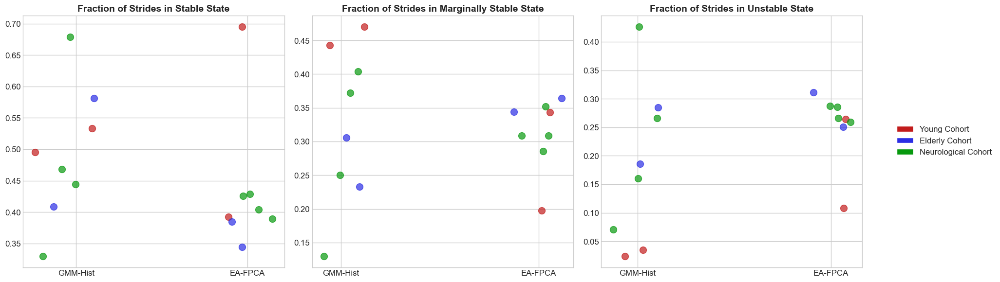

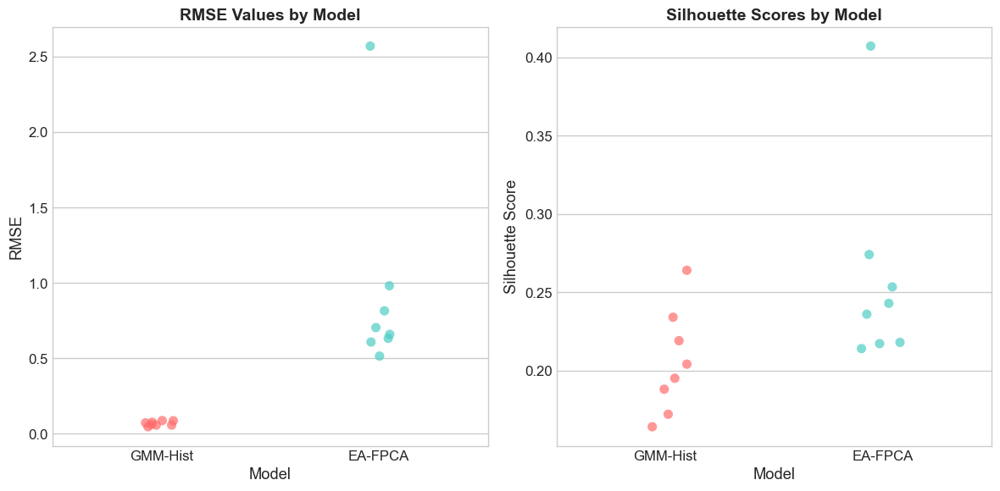

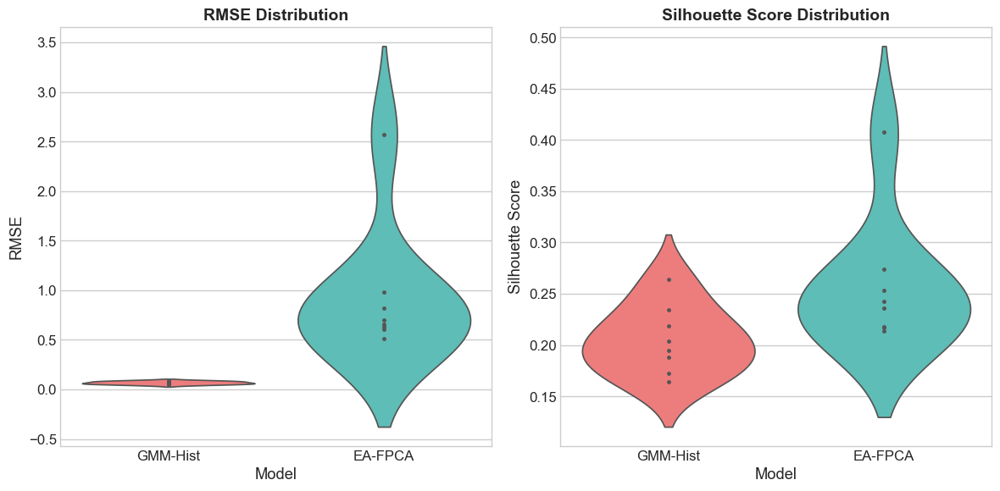

<Figure size 640x480 with 0 Axes>

=== SUMMARY STATISTICS BY PATIENT GROUP ===

Young Cohort Group:
RMSE:
          count    mean     std     min     25%     50%     75%     max
Model                                                                  
EA-FPCA     2.0  1.5429  1.4531  0.5154  1.0292  1.5429  2.0567  2.5704
GMM-Hist    2.0  0.0545  0.0106  0.0470  0.0508  0.0545  0.0582  0.0620
Silhouette Score:
          count    mean     std     min     25%     50%     75%     max
Model                                                                  
EA-FPCA     2.0  0.3122  0.1345  0.2171  0.2647  0.3122  0.3598  0.4073
GMM-Hist    2.0  0.1915  0.0389  0.1640  0.1778  0.1915  0.2052  0.2190

Neurological Cohort Group:
RMSE:
          count    mean     std     min     25%     50%     75%     max
Model                                                                  
EA-FPCA     4.0  0.7775  0.1602  0.6087  0.6803  0.7599  0.8570  0.9817
GMM-Hist    4.0  0.0738  0.0120  0.0580  0.0692  0.0750  0.0795  0.0870
Silhouette Sc

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.patches import Patch

gmm_df = pd.read_excel(cwd.parent/".."/"results"/"GMM.xlsx")
fpca_df = pd.read_excel(cwd.parent/".."/"results"/"MarkovModel.xlsx")

gmm_df = gmm_df.rename(columns={
    'gmm_reconstruction_rmse': 'RMSE',
    'clustering_silhouette_score': 'Silhouette',
    'frac_state_0': 'state_1',
    'frac_state_1': 'state_2',
    'frac_state_2': 'state_3'
})
fpca_df = fpca_df.rename(columns={
    'fpca_reconstruction_rmse': 'RMSE',
    'clustering_silhouette_score': 'Silhouette',
    'frac_state_0': 'state_1',
    'frac_state_1': 'state_2',
    'frac_state_2': 'state_3'
})

gmm_df['Model'] = 'GMM-Hist'
fpca_df['Model'] = 'EA-FPCA'

metrics = ['patient_id', 'Model', 'RMSE', 'Silhouette', 'state_1', 'state_2', 'state_3']
viz_df = pd.concat([gmm_df[metrics], fpca_df[metrics]], ignore_index=True)

def categorize_patient(patient_id):
    patient_str = str(patient_id)
    if patient_str in ['Y13', 'Y14']:
        return 'Young Cohort'
    elif patient_str in ['E03', 'E12']:
        return 'Elderly Cohort'
    else:
        return 'Neurological Cohort'

viz_df['Patient_Group'] = viz_df['patient_id'].apply(categorize_patient)

# Set style and colors
plt.style.use('seaborn-v0_8-whitegrid')
group_colors = {'Young Cohort': "#C21C1C", 'Elderly Cohort': "#2B2EE4", 'Neurological Cohort': "#07990E"}

# Strip plots for state comparison with patient grouping
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

# State 1
for group in viz_df['Patient_Group'].unique():
    group_data = viz_df[viz_df['Patient_Group'] == group]
    for i, model in enumerate(['GMM-Hist', 'EA-FPCA']):
        model_data = group_data[group_data['Model'] == model]
        x_pos = i + np.random.normal(0, 0.07, len(model_data))  # Add small jitter
        ax1.scatter(x_pos, model_data['state_1'], 
                   color=group_colors[group], alpha=0.7, s=100, 
                   label=f'{group}' if i == 0 else "")

ax1.set_xticks([0, 1])
ax1.set_xticklabels(['GMM-Hist', 'EA-FPCA'])
ax1.set_title('Fraction of Strides in Stable State', fontsize=14, fontweight='bold')
ax1.set_ylabel('')


# State 2
for group in viz_df['Patient_Group'].unique():
    group_data = viz_df[viz_df['Patient_Group'] == group]
    for i, model in enumerate(['GMM-Hist', 'EA-FPCA']):
        model_data = group_data[group_data['Model'] == model]
        x_pos = i + np.random.normal(0, 0.07, len(model_data))
        ax2.scatter(x_pos, model_data['state_2'], 
                   color=group_colors[group], alpha=0.7, s=100,
                   label=f'{group}' if i == 0 else "")

ax2.set_xticks([0, 1])
ax2.set_xticklabels(['GMM-Hist', 'EA-FPCA'])
ax2.set_title('Fraction of Strides in Marginally Stable State', fontsize=14, fontweight='bold')
ax2.set_ylabel('')


# State 3
for group in viz_df['Patient_Group'].unique():
    group_data = viz_df[viz_df['Patient_Group'] == group]
    for i, model in enumerate(['GMM-Hist', 'EA-FPCA']):
        model_data = group_data[group_data['Model'] == model]
        x_pos = i + np.random.normal(0, 0.07, len(model_data))
        ax3.scatter(x_pos, model_data['state_3'], 
                   color=group_colors[group], alpha=0.7, s=100,
                   label=f'{group}' if i == 0 else "")

ax3.set_xticks([0, 1])
ax3.set_xticklabels(['GMM-Hist', 'EA-FPCA'])
ax3.set_title('Fraction of Strides in Unstable State', fontsize=14, fontweight='bold')
ax3.set_ylabel('')
legend_elements = [Patch(facecolor=group_colors['Young Cohort'], label='Young Cohort'),
                   Patch(facecolor=group_colors['Elderly Cohort'], label='Elderly Cohort'),
                   Patch(facecolor=group_colors['Neurological Cohort'], label='Neurological Cohort')]

fig.legend(handles=legend_elements, bbox_to_anchor=(1.02, 0.5), loc='center left')

plt.tight_layout()
plt.show()


# Strip plots (better for seeing individual values)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

sns.stripplot(data=viz_df, x='Model', y='RMSE', ax=ax1, palette=colors, size=8, alpha=0.7)
ax1.set_title('RMSE Values by Model', fontsize=14, fontweight='bold')
ax1.set_ylabel('RMSE')

sns.stripplot(data=viz_df, x='Model', y='Silhouette', ax=ax2, palette=colors, size=8, alpha=0.7)
ax2.set_title('Silhouette Scores by Model', fontsize=14, fontweight='bold')
ax2.set_ylabel('Silhouette Score')

plt.tight_layout()
plt.show()

# Option 3: Violin plots (shows distribution shape)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

sns.violinplot(data=viz_df, x='Model', y='RMSE', ax=ax1, palette=colors, inner='points')
ax1.set_title('RMSE Distribution', fontsize=14, fontweight='bold')
ax1.set_ylabel('RMSE')

sns.violinplot(data=viz_df, x='Model', y='Silhouette', ax=ax2, palette=colors, inner='points')
ax2.set_title('Silhouette Score Distribution', fontsize=14, fontweight='bold')
ax2.set_ylabel('Silhouette Score')

plt.tight_layout()
plt.show()

plt.tight_layout()
plt.show()


# Print summary statistics by patient group
print("=== SUMMARY STATISTICS BY PATIENT GROUP ===")
for group in viz_df['Patient_Group'].unique():
    print(f"\n{group} Group:")
    group_data = viz_df[viz_df['Patient_Group'] == group]
    print("RMSE:")
    print(group_data.groupby('Model')['RMSE'].describe().round(4))
    print("Silhouette Score:")
    print(group_data.groupby('Model')['Silhouette'].describe().round(4))